In [3]:

# Loading libraries
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

#Import required libraries
import numpy as np
import pandas as pd
import math
import json
import time
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestNeighbors
from sklearn.externals import joblib
import scipy.sparse
from scipy.sparse import csr_matrix
import warnings; warnings.simplefilter('ignore')
%matplotlib inline

In [4]:
# read the dataset
df=pd.read_csv("ratings_Electronics.csv")

In [5]:
# Add the column names and find the shape of the data
df.columns=['userID','productID','rating','timestamp']
df.shape

(7824481, 4)

In [6]:
# to see first five records of the data
df.head()

,userID,productID,rating,timestamp
0,A2CX7LUOHB2NDG,0321732944,5.0,1341100800
1,A2NWSAGRHCP8N5,0439886341,1.0,1367193600
2,A2WNBOD3WNDNKT,0439886341,3.0,1374451200
3,A1GI0U4ZRJA8WN,0439886341,1.0,1334707200
4,A1QGNMC6O1VW39,0511189877,5.0,1397433600


In [7]:
# to drop the timestamp column 
df.drop(["timestamp"], axis=1,inplace=True)

In [8]:
df.head()

,userID,productID,rating
0,A2CX7LUOHB2NDG,0321732944,5.0
1,A2NWSAGRHCP8N5,0439886341,1.0
2,A2WNBOD3WNDNKT,0439886341,3.0
3,A1GI0U4ZRJA8WN,0439886341,1.0
4,A1QGNMC6O1VW39,0511189877,5.0


In [9]:
# to find the null values
df.isnull().sum()

userID       0
productID    0
rating       0
dtype: int64

In [10]:
# to know the type of the features
df.dtypes

userID        object
productID     object
rating       float64
dtype: object

In [15]:
df.userID = df.userID.astype('str')
df.productId = df.productID.astype('str')


In [16]:
# to know the information about the features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7824481 entries, 0 to 7824480
Data columns (total 3 columns):
userID       object
productID    object
rating       float64
dtypes: float64(1), object(2)
memory usage: 179.1+ MB


In [17]:
# unique ratings of the data set
df.rating.unique()

array([5., 1., 3., 2., 4.])

In [18]:
print('The minimum rating is: %d' %(df['rating'].min()))
print('The maximum rating is: %d' %(df['rating'].max()))

The minimum rating is: 1
The maximum rating is: 5


In [22]:
print('Number of unique USERS in Raw data = ', df['userID'].nunique())
print('Number of unique PRODUCTS in Raw data = ', df['productID'].nunique())

Number of unique USERS in Raw data =  4201696
Number of unique PRODUCTS in Raw data =  476001


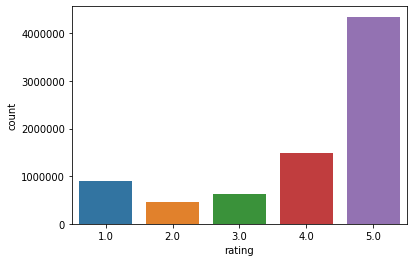

In [19]:
# Check the distribution of ratings
sns.countplot(df.rating)

In [ ]:
# Looks like a very high proportion of ratings received is either 5 or 4.
Next highest count of ratings received is for 1 which is still a very high number (approx..100000).

In [23]:
# # Top 10 users based on rating
most_rated = df.groupby('userID').size().sort_values(ascending=False)[:10]
most_rated

userID
A5JLAU2ARJ0BO     520
ADLVFFE4VBT8      501
A3OXHLG6DIBRW8    498
A6FIAB28IS79      431
A680RUE1FDO8B     406
A1ODOGXEYECQQ8    380
A36K2N527TXXJN    314
A2AY4YUOX2N1BQ    311
AWPODHOB4GFWL     308
A25C2M3QF9G7OQ    296
dtype: int64

In [ ]:
# Take subset of dataset to make it less sparse/more dense. 
(For example, keep the users only who has given 50 or more number of ratings)

In [ ]:
# Data model preparation as per requirement on number of minimum ratings

In [24]:
counts = df['userID'].value_counts()
df_final = df[df['userID'].isin(counts[counts >= 50].index)]

In [25]:
print('Number of users who have rated 50 or more items =', len(df_final))
print('Number of unique USERS in final data = ', df_final['userID'].nunique())
print('Number of unique PRODUCTS in final data = ', df_final['productID'].nunique())

Number of users who have rated 50 or more items = 125871
Number of unique USERS in final data =  1540
Number of unique PRODUCTS in final data =  48190


In [ ]:
# df_final has users who have rated 50 or more items

In [ ]:
# Calculate the density of the rating matrix

In [26]:
final_ratings_matrix = df_final.pivot(index = 'userID', columns ='productID', values = 'rating').fillna(0)
print('Shape of final_ratings_matrix: ', final_ratings_matrix.shape)

given_num_of_ratings = np.count_nonzero(final_ratings_matrix)
print('given_num_of_ratings = ', given_num_of_ratings)
possible_num_of_ratings = final_ratings_matrix.shape[0] * final_ratings_matrix.shape[1]
print('possible_num_of_ratings = ', possible_num_of_ratings)
density = (given_num_of_ratings/possible_num_of_ratings)
density *= 100
print ('density: {:4.2f}%'.format(density))

Shape of final_ratings_matrix:  (1540, 48190)
given_num_of_ratings =  125871
possible_num_of_ratings =  74212600
density: 0.17%


In [29]:
final_ratings_matrix.tail()

productID,0594451647,0594481813,0970407998,0972683275,1400501466,1400501520,1400501776,1400532620,1400532655,140053271X,...,B00L5YZCCG,B00L8I6SFY,B00L8QCVL6,B00LA6T0LS,B00LBZ1Z7K,B00LED02VY,B00LGN7Y3G,B00LGQ6HL8,B00LI4ZZO8,B00LKG1MC8
userID,,,,,,,,,,,,,,,,,,,,,
AZBXKUH4AIW3X,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AZCE11PSTCH1L,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AZMY6E8B52L2T,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AZNUHQSHZHSUE,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AZOK5STV85FBJ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
# Matrix with one row per 'Product' and one column per 'user' for Item-based CF
final_ratings_matrix_T = final_ratings_matrix.transpose()
final_ratings_matrix_T.head()

userID,A100UD67AHFODS,A100WO06OQR8BQ,A105S56ODHGJEK,A105TOJ6LTVMBG,A10AFVU66A79Y1,A10H24TDLK2VDP,A10NMELR4KX0J6,A10O7THJ2O20AG,A10PEXB6XAQ5XF,A10X9ME6R66JDX,...,AYOTEJ617O60K,AYP0YPLSP9ISM,AZ515FFZ7I2P7,AZ8XSDMIX04VJ,AZAC8O310IK4E,AZBXKUH4AIW3X,AZCE11PSTCH1L,AZMY6E8B52L2T,AZNUHQSHZHSUE,AZOK5STV85FBJ
productID,,,,,,,,,,,,,,,,,,,,,
0594451647,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0594481813,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0970407998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0972683275,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1400501466,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#Split the data randomnly into test and train datasets
#Split the training and test data in the ratio 70:30

In [30]:
train_data, test_data = train_test_split(df_final, test_size = 0.3, random_state=0)
train_data.head()

,userID,productID,rating
6595852,A2BYV7S1QP2YIG,B009EAHVTA,5.0
4738240,AB094YABX21WQ,B0056XCEAA,1.0
4175595,A3D0UM4ZD2CMAW,B004I763AW,5.0
3753015,AATWFX0ZZSE6C,B0040NPHMO,3.0
1734766,A1NNMOD9H36Q8E,B0015VW3BM,4.0


In [31]:
train_data.shape
test_data.shape

(88109, 3)

(37762, 3)

# Build Popularity Recommender model. (Non-personalised)

In [32]:
train_data_grouped = train_data.groupby('productID').agg({'userID': 'count'}).reset_index()
train_data_grouped.rename(columns = {'userID': 'score'},inplace=True)
train_data_grouped.head()

,productID,score
0,0594451647,1
1,0594481813,1
2,0970407998,1
3,0972683275,3
4,1400501466,4


In [33]:
#Sort the products on recommendation score 
train_data_sort = train_data_grouped.sort_values(['score', 'productID'], ascending = [0,1]) 
      
#Generate a recommendation rank based upon score 
train_data_sort['Rank'] = train_data_sort['score'].rank(ascending=0, method='first') 
          
#Get the top 5 recommendations 
popularity_recommendations = train_data_sort.head(5) 
popularity_recommendations 

,productID,score,Rank
30847,B0088CJT4U,133,1.0
30287,B007WTAJTO,124,2.0
19647,B003ES5ZUU,122,3.0
8752,B000N99BBC,114,4.0
30555,B00829THK0,97,5.0


In [34]:
# Use popularity based recommender model to make predictions
def recommend(user_id):     
    user_recommendations = popularity_recommendations 
          
    #Add user_id column for which the recommendations are being generated 
    user_recommendations['userID'] = user_id 
      
    #Bring user_id column to the front 
    cols = user_recommendations.columns.tolist() 
    cols = cols[-1:] + cols[:-1] 
    user_recommendations = user_recommendations[cols] 
          
    return user_recommendations 

In [53]:
find_recom = test_data.index   # This list is user choice.
for i in find_recom:
    
    print(recommend(i))    
    print("\n") 

        userID   productID  score  Rank
30847  6730390  B0088CJT4U    133   1.0
30287  6730390  B007WTAJTO    124   2.0
19647  6730390  B003ES5ZUU    122   3.0
8752   6730390  B000N99BBC    114   4.0
30555  6730390  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3509542  B0088CJT4U    133   1.0
30287  3509542  B007WTAJTO    124   2.0
19647  3509542  B003ES5ZUU    122   3.0
8752   3509542  B000N99BBC    114   4.0
30555  3509542  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  169752  B0088CJT4U    133   1.0
30287  169752  B007WTAJTO    124   2.0
19647  169752  B003ES5ZUU    122   3.0
8752   169752  B000N99BBC    114   4.0
30555  169752  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7637571  B0088CJT4U    133   1.0
30287  7637571  B007WTAJTO    124   2.0
19647  7637571  B003ES5ZUU    122   3.0
8752   7637571  B000N99BBC    114   4.0
30555  7637571  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  5066394  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  711648  B0088CJT4U    133   1.0
30287  711648  B007WTAJTO    124   2.0
19647  711648  B003ES5ZUU    122   3.0
8752   711648  B000N99BBC    114   4.0
30555  711648  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7812573  B0088CJT4U    133   1.0
30287  7812573  B007WTAJTO    124   2.0
19647  7812573  B003ES5ZUU    122   3.0
8752   7812573  B000N99BBC    114   4.0
30555  7812573  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3844312  B0088CJT4U    133   1.0
30287  3844312  B007WTAJTO    124   2.0
19647  3844312  B003ES5ZUU    122   3.0
8752   3844312  B000N99BBC    114   4.0
30555  3844312  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1842131  B0088CJT4U    133   1.0
30287  1842131  B007WTAJTO    124   2.0
19647  1842131  B003ES5ZUU    122   3.0
8752   1842131  B000N99BBC    114   4.0
30555  1842131  B00829THK0     97   5.

        userID   productID  score  Rank
30847  4482877  B0088CJT4U    133   1.0
30287  4482877  B007WTAJTO    124   2.0
19647  4482877  B003ES5ZUU    122   3.0
8752   4482877  B000N99BBC    114   4.0
30555  4482877  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1840906  B0088CJT4U    133   1.0
30287  1840906  B007WTAJTO    124   2.0
19647  1840906  B003ES5ZUU    122   3.0
8752   1840906  B000N99BBC    114   4.0
30555  1840906  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4251904  B0088CJT4U    133   1.0
30287  4251904  B007WTAJTO    124   2.0
19647  4251904  B003ES5ZUU    122   3.0
8752   4251904  B000N99BBC    114   4.0
30555  4251904  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2148160  B0088CJT4U    133   1.0
30287  2148160  B007WTAJTO    124   2.0
19647  2148160  B003ES5ZUU    122   3.0
8752   2148160  B000N99BBC    114   4.0
30555  2148160  B00829THK0     97   5.0


       userID   productID  score

30555  7046546  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3765820  B0088CJT4U    133   1.0
30287  3765820  B007WTAJTO    124   2.0
19647  3765820  B003ES5ZUU    122   3.0
8752   3765820  B000N99BBC    114   4.0
30555  3765820  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2060023  B0088CJT4U    133   1.0
30287  2060023  B007WTAJTO    124   2.0
19647  2060023  B003ES5ZUU    122   3.0
8752   2060023  B000N99BBC    114   4.0
30555  2060023  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  635498  B0088CJT4U    133   1.0
30287  635498  B007WTAJTO    124   2.0
19647  635498  B003ES5ZUU    122   3.0
8752   635498  B000N99BBC    114   4.0
30555  635498  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  983749  B0088CJT4U    133   1.0
30287  983749  B007WTAJTO    124   2.0
19647  983749  B003ES5ZUU    122   3.0
8752   983749  B000N99BBC    114   4.0
30555  983749  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  4097417  B0088CJT4U    133   1.0
30287  4097417  B007WTAJTO    124   2.0
19647  4097417  B003ES5ZUU    122   3.0
8752   4097417  B000N99BBC    114   4.0
30555  4097417  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7080615  B0088CJT4U    133   1.0
30287  7080615  B007WTAJTO    124   2.0
19647  7080615  B003ES5ZUU    122   3.0
8752   7080615  B000N99BBC    114   4.0
30555  7080615  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2300859  B0088CJT4U    133   1.0
30287  2300859  B007WTAJTO    124   2.0
19647  2300859  B003ES5ZUU    122   3.0
8752   2300859  B000N99BBC    114   4.0
30555  2300859  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1432161  B0088CJT4U    133   1.0
30287  1432161  B007WTAJTO    124   2.0
19647  1432161  B003ES5ZUU    122   3.0
8752   1432161  B000N99BBC    114   4.0
30555  1432161  B00829THK0     97   5.0


        userID   productID  scor

30555  1893957  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1723853  B0088CJT4U    133   1.0
30287  1723853  B007WTAJTO    124   2.0
19647  1723853  B003ES5ZUU    122   3.0
8752   1723853  B000N99BBC    114   4.0
30555  1723853  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3948114  B0088CJT4U    133   1.0
30287  3948114  B007WTAJTO    124   2.0
19647  3948114  B003ES5ZUU    122   3.0
8752   3948114  B000N99BBC    114   4.0
30555  3948114  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3788061  B0088CJT4U    133   1.0
30287  3788061  B007WTAJTO    124   2.0
19647  3788061  B003ES5ZUU    122   3.0
8752   3788061  B000N99BBC    114   4.0
30555  3788061  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5681148  B0088CJT4U    133   1.0
30287  5681148  B007WTAJTO    124   2.0
19647  5681148  B003ES5ZUU    122   3.0
8752   5681148  B000N99BBC    114   4.0
30555  5681148  B00829THK0     9

        userID   productID  score  Rank
30847  4724151  B0088CJT4U    133   1.0
30287  4724151  B007WTAJTO    124   2.0
19647  4724151  B003ES5ZUU    122   3.0
8752   4724151  B000N99BBC    114   4.0
30555  4724151  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  102943  B0088CJT4U    133   1.0
30287  102943  B007WTAJTO    124   2.0
19647  102943  B003ES5ZUU    122   3.0
8752   102943  B000N99BBC    114   4.0
30555  102943  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7119388  B0088CJT4U    133   1.0
30287  7119388  B007WTAJTO    124   2.0
19647  7119388  B003ES5ZUU    122   3.0
8752   7119388  B000N99BBC    114   4.0
30555  7119388  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3183855  B0088CJT4U    133   1.0
30287  3183855  B007WTAJTO    124   2.0
19647  3183855  B003ES5ZUU    122   3.0
8752   3183855  B000N99BBC    114   4.0
30555  3183855  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  2522493  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6384742  B0088CJT4U    133   1.0
30287  6384742  B007WTAJTO    124   2.0
19647  6384742  B003ES5ZUU    122   3.0
8752   6384742  B000N99BBC    114   4.0
30555  6384742  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1182833  B0088CJT4U    133   1.0
30287  1182833  B007WTAJTO    124   2.0
19647  1182833  B003ES5ZUU    122   3.0
8752   1182833  B000N99BBC    114   4.0
30555  1182833  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6876138  B0088CJT4U    133   1.0
30287  6876138  B007WTAJTO    124   2.0
19647  6876138  B003ES5ZUU    122   3.0
8752   6876138  B000N99BBC    114   4.0
30555  6876138  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5935800  B0088CJT4U    133   1.0
30287  5935800  B007WTAJTO    124   2.0
19647  5935800  B003ES5ZUU    122   3.0
8752   5935800  B000N99BBC    114   4.0
30555  5935800  B00829THK0     9

        userID   productID  score  Rank
30847  3862367  B0088CJT4U    133   1.0
30287  3862367  B007WTAJTO    124   2.0
19647  3862367  B003ES5ZUU    122   3.0
8752   3862367  B000N99BBC    114   4.0
30555  3862367  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  303244  B0088CJT4U    133   1.0
30287  303244  B007WTAJTO    124   2.0
19647  303244  B003ES5ZUU    122   3.0
8752   303244  B000N99BBC    114   4.0
30555  303244  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6003728  B0088CJT4U    133   1.0
30287  6003728  B007WTAJTO    124   2.0
19647  6003728  B003ES5ZUU    122   3.0
8752   6003728  B000N99BBC    114   4.0
30555  6003728  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5334681  B0088CJT4U    133   1.0
30287  5334681  B007WTAJTO    124   2.0
19647  5334681  B003ES5ZUU    122   3.0
8752   5334681  B000N99BBC    114   4.0
30555  5334681  B00829THK0     97   5.0


       userID   productID  score  Rank

        userID   productID  score  Rank
30847  4187737  B0088CJT4U    133   1.0
30287  4187737  B007WTAJTO    124   2.0
19647  4187737  B003ES5ZUU    122   3.0
8752   4187737  B000N99BBC    114   4.0
30555  4187737  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2581243  B0088CJT4U    133   1.0
30287  2581243  B007WTAJTO    124   2.0
19647  2581243  B003ES5ZUU    122   3.0
8752   2581243  B000N99BBC    114   4.0
30555  2581243  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4758005  B0088CJT4U    133   1.0
30287  4758005  B007WTAJTO    124   2.0
19647  4758005  B003ES5ZUU    122   3.0
8752   4758005  B000N99BBC    114   4.0
30555  4758005  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3621541  B0088CJT4U    133   1.0
30287  3621541  B007WTAJTO    124   2.0
19647  3621541  B003ES5ZUU    122   3.0
8752   3621541  B000N99BBC    114   4.0
30555  3621541  B00829THK0     97   5.0


        userID   productID  scor

30555  2116321  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7551279  B0088CJT4U    133   1.0
30287  7551279  B007WTAJTO    124   2.0
19647  7551279  B003ES5ZUU    122   3.0
8752   7551279  B000N99BBC    114   4.0
30555  7551279  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1991551  B0088CJT4U    133   1.0
30287  1991551  B007WTAJTO    124   2.0
19647  1991551  B003ES5ZUU    122   3.0
8752   1991551  B000N99BBC    114   4.0
30555  1991551  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  358211  B0088CJT4U    133   1.0
30287  358211  B007WTAJTO    124   2.0
19647  358211  B003ES5ZUU    122   3.0
8752   358211  B000N99BBC    114   4.0
30555  358211  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6615508  B0088CJT4U    133   1.0
30287  6615508  B007WTAJTO    124   2.0
19647  6615508  B003ES5ZUU    122   3.0
8752   6615508  B000N99BBC    114   4.0
30555  6615508  B00829THK0     97   5.

       userID   productID  score  Rank
30847  360955  B0088CJT4U    133   1.0
30287  360955  B007WTAJTO    124   2.0
19647  360955  B003ES5ZUU    122   3.0
8752   360955  B000N99BBC    114   4.0
30555  360955  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  296557  B0088CJT4U    133   1.0
30287  296557  B007WTAJTO    124   2.0
19647  296557  B003ES5ZUU    122   3.0
8752   296557  B000N99BBC    114   4.0
30555  296557  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6800702  B0088CJT4U    133   1.0
30287  6800702  B007WTAJTO    124   2.0
19647  6800702  B003ES5ZUU    122   3.0
8752   6800702  B000N99BBC    114   4.0
30555  6800702  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3221678  B0088CJT4U    133   1.0
30287  3221678  B007WTAJTO    124   2.0
19647  3221678  B003ES5ZUU    122   3.0
8752   3221678  B000N99BBC    114   4.0
30555  3221678  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

        userID   productID  score  Rank
30847  2357054  B0088CJT4U    133   1.0
30287  2357054  B007WTAJTO    124   2.0
19647  2357054  B003ES5ZUU    122   3.0
8752   2357054  B000N99BBC    114   4.0
30555  2357054  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7747096  B0088CJT4U    133   1.0
30287  7747096  B007WTAJTO    124   2.0
19647  7747096  B003ES5ZUU    122   3.0
8752   7747096  B000N99BBC    114   4.0
30555  7747096  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4422917  B0088CJT4U    133   1.0
30287  4422917  B007WTAJTO    124   2.0
19647  4422917  B003ES5ZUU    122   3.0
8752   4422917  B000N99BBC    114   4.0
30555  4422917  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7679627  B0088CJT4U    133   1.0
30287  7679627  B007WTAJTO    124   2.0
19647  7679627  B003ES5ZUU    122   3.0
8752   7679627  B000N99BBC    114   4.0
30555  7679627  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  5772606  B0088CJT4U    133   1.0
30287  5772606  B007WTAJTO    124   2.0
19647  5772606  B003ES5ZUU    122   3.0
8752   5772606  B000N99BBC    114   4.0
30555  5772606  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  196168  B0088CJT4U    133   1.0
30287  196168  B007WTAJTO    124   2.0
19647  196168  B003ES5ZUU    122   3.0
8752   196168  B000N99BBC    114   4.0
30555  196168  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7307846  B0088CJT4U    133   1.0
30287  7307846  B007WTAJTO    124   2.0
19647  7307846  B003ES5ZUU    122   3.0
8752   7307846  B000N99BBC    114   4.0
30555  7307846  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4923639  B0088CJT4U    133   1.0
30287  4923639  B007WTAJTO    124   2.0
19647  4923639  B003ES5ZUU    122   3.0
8752   4923639  B000N99BBC    114   4.0
30555  4923639  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  5280673  B0088CJT4U    133   1.0
30287  5280673  B007WTAJTO    124   2.0
19647  5280673  B003ES5ZUU    122   3.0
8752   5280673  B000N99BBC    114   4.0
30555  5280673  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  180308  B0088CJT4U    133   1.0
30287  180308  B007WTAJTO    124   2.0
19647  180308  B003ES5ZUU    122   3.0
8752   180308  B000N99BBC    114   4.0
30555  180308  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5580508  B0088CJT4U    133   1.0
30287  5580508  B007WTAJTO    124   2.0
19647  5580508  B003ES5ZUU    122   3.0
8752   5580508  B000N99BBC    114   4.0
30555  5580508  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4522546  B0088CJT4U    133   1.0
30287  4522546  B007WTAJTO    124   2.0
19647  4522546  B003ES5ZUU    122   3.0
8752   4522546  B000N99BBC    114   4.0
30555  4522546  B00829THK0     97   5.0


        userID   productID  score  Ran

       userID   productID  score  Rank
30847  471438  B0088CJT4U    133   1.0
30287  471438  B007WTAJTO    124   2.0
19647  471438  B003ES5ZUU    122   3.0
8752   471438  B000N99BBC    114   4.0
30555  471438  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3582100  B0088CJT4U    133   1.0
30287  3582100  B007WTAJTO    124   2.0
19647  3582100  B003ES5ZUU    122   3.0
8752   3582100  B000N99BBC    114   4.0
30555  3582100  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2264126  B0088CJT4U    133   1.0
30287  2264126  B007WTAJTO    124   2.0
19647  2264126  B003ES5ZUU    122   3.0
8752   2264126  B000N99BBC    114   4.0
30555  2264126  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2857372  B0088CJT4U    133   1.0
30287  2857372  B007WTAJTO    124   2.0
19647  2857372  B003ES5ZUU    122   3.0
8752   2857372  B000N99BBC    114   4.0
30555  2857372  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  7343636  B0088CJT4U    133   1.0
30287  7343636  B007WTAJTO    124   2.0
19647  7343636  B003ES5ZUU    122   3.0
8752   7343636  B000N99BBC    114   4.0
30555  7343636  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5359629  B0088CJT4U    133   1.0
30287  5359629  B007WTAJTO    124   2.0
19647  5359629  B003ES5ZUU    122   3.0
8752   5359629  B000N99BBC    114   4.0
30555  5359629  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6189339  B0088CJT4U    133   1.0
30287  6189339  B007WTAJTO    124   2.0
19647  6189339  B003ES5ZUU    122   3.0
8752   6189339  B000N99BBC    114   4.0
30555  6189339  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1802705  B0088CJT4U    133   1.0
30287  1802705  B007WTAJTO    124   2.0
19647  1802705  B003ES5ZUU    122   3.0
8752   1802705  B000N99BBC    114   4.0
30555  1802705  B00829THK0     97   5.0


        userID   productID  scor



        userID   productID  score  Rank
30847  1749613  B0088CJT4U    133   1.0
30287  1749613  B007WTAJTO    124   2.0
19647  1749613  B003ES5ZUU    122   3.0
8752   1749613  B000N99BBC    114   4.0
30555  1749613  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2434356  B0088CJT4U    133   1.0
30287  2434356  B007WTAJTO    124   2.0
19647  2434356  B003ES5ZUU    122   3.0
8752   2434356  B000N99BBC    114   4.0
30555  2434356  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5030605  B0088CJT4U    133   1.0
30287  5030605  B007WTAJTO    124   2.0
19647  5030605  B003ES5ZUU    122   3.0
8752   5030605  B000N99BBC    114   4.0
30555  5030605  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7759921  B0088CJT4U    133   1.0
30287  7759921  B007WTAJTO    124   2.0
19647  7759921  B003ES5ZUU    122   3.0
8752   7759921  B000N99BBC    114   4.0
30555  7759921  B00829THK0     97   5.0


        userID   productID  sc



        userID   productID  score  Rank
30847  5931239  B0088CJT4U    133   1.0
30287  5931239  B007WTAJTO    124   2.0
19647  5931239  B003ES5ZUU    122   3.0
8752   5931239  B000N99BBC    114   4.0
30555  5931239  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1316805  B0088CJT4U    133   1.0
30287  1316805  B007WTAJTO    124   2.0
19647  1316805  B003ES5ZUU    122   3.0
8752   1316805  B000N99BBC    114   4.0
30555  1316805  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4184286  B0088CJT4U    133   1.0
30287  4184286  B007WTAJTO    124   2.0
19647  4184286  B003ES5ZUU    122   3.0
8752   4184286  B000N99BBC    114   4.0
30555  4184286  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4495387  B0088CJT4U    133   1.0
30287  4495387  B007WTAJTO    124   2.0
19647  4495387  B003ES5ZUU    122   3.0
8752   4495387  B000N99BBC    114   4.0
30555  4495387  B00829THK0     97   5.0


        userID   productID  sc

30555  2899180  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2310972  B0088CJT4U    133   1.0
30287  2310972  B007WTAJTO    124   2.0
19647  2310972  B003ES5ZUU    122   3.0
8752   2310972  B000N99BBC    114   4.0
30555  2310972  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1991807  B0088CJT4U    133   1.0
30287  1991807  B007WTAJTO    124   2.0
19647  1991807  B003ES5ZUU    122   3.0
8752   1991807  B000N99BBC    114   4.0
30555  1991807  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1351815  B0088CJT4U    133   1.0
30287  1351815  B007WTAJTO    124   2.0
19647  1351815  B003ES5ZUU    122   3.0
8752   1351815  B000N99BBC    114   4.0
30555  1351815  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2834675  B0088CJT4U    133   1.0
30287  2834675  B007WTAJTO    124   2.0
19647  2834675  B003ES5ZUU    122   3.0
8752   2834675  B000N99BBC    114   4.0
30555  2834675  B00829THK0     9

        userID   productID  score  Rank
30847  4574667  B0088CJT4U    133   1.0
30287  4574667  B007WTAJTO    124   2.0
19647  4574667  B003ES5ZUU    122   3.0
8752   4574667  B000N99BBC    114   4.0
30555  4574667  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3679864  B0088CJT4U    133   1.0
30287  3679864  B007WTAJTO    124   2.0
19647  3679864  B003ES5ZUU    122   3.0
8752   3679864  B000N99BBC    114   4.0
30555  3679864  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4693787  B0088CJT4U    133   1.0
30287  4693787  B007WTAJTO    124   2.0
19647  4693787  B003ES5ZUU    122   3.0
8752   4693787  B000N99BBC    114   4.0
30555  4693787  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6855364  B0088CJT4U    133   1.0
30287  6855364  B007WTAJTO    124   2.0
19647  6855364  B003ES5ZUU    122   3.0
8752   6855364  B000N99BBC    114   4.0
30555  6855364  B00829THK0     97   5.0


        userID   productID  scor

30555  789892  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7399242  B0088CJT4U    133   1.0
30287  7399242  B007WTAJTO    124   2.0
19647  7399242  B003ES5ZUU    122   3.0
8752   7399242  B000N99BBC    114   4.0
30555  7399242  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  679606  B0088CJT4U    133   1.0
30287  679606  B007WTAJTO    124   2.0
19647  679606  B003ES5ZUU    122   3.0
8752   679606  B000N99BBC    114   4.0
30555  679606  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5127077  B0088CJT4U    133   1.0
30287  5127077  B007WTAJTO    124   2.0
19647  5127077  B003ES5ZUU    122   3.0
8752   5127077  B000N99BBC    114   4.0
30555  5127077  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1931587  B0088CJT4U    133   1.0
30287  1931587  B007WTAJTO    124   2.0
19647  1931587  B003ES5ZUU    122   3.0
8752   1931587  B000N99BBC    114   4.0
30555  1931587  B00829THK0     97   5.0

30555  6481484  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   25105  B0088CJT4U    133   1.0
30287   25105  B007WTAJTO    124   2.0
19647   25105  B003ES5ZUU    122   3.0
8752    25105  B000N99BBC    114   4.0
30555   25105  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  667515  B0088CJT4U    133   1.0
30287  667515  B007WTAJTO    124   2.0
19647  667515  B003ES5ZUU    122   3.0
8752   667515  B000N99BBC    114   4.0
30555  667515  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  320302  B0088CJT4U    133   1.0
30287  320302  B007WTAJTO    124   2.0
19647  320302  B003ES5ZUU    122   3.0
8752   320302  B000N99BBC    114   4.0
30555  320302  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7236263  B0088CJT4U    133   1.0
30287  7236263  B007WTAJTO    124   2.0
19647  7236263  B003ES5ZUU    122   3.0
8752   7236263  B000N99BBC    114   4.0
30555  7236263  B00829THK0     97   5.0


        

       userID   productID  score  Rank
30847  201453  B0088CJT4U    133   1.0
30287  201453  B007WTAJTO    124   2.0
19647  201453  B003ES5ZUU    122   3.0
8752   201453  B000N99BBC    114   4.0
30555  201453  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3860253  B0088CJT4U    133   1.0
30287  3860253  B007WTAJTO    124   2.0
19647  3860253  B003ES5ZUU    122   3.0
8752   3860253  B000N99BBC    114   4.0
30555  3860253  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3367181  B0088CJT4U    133   1.0
30287  3367181  B007WTAJTO    124   2.0
19647  3367181  B003ES5ZUU    122   3.0
8752   3367181  B000N99BBC    114   4.0
30555  3367181  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3633757  B0088CJT4U    133   1.0
30287  3633757  B007WTAJTO    124   2.0
19647  3633757  B003ES5ZUU    122   3.0
8752   3633757  B000N99BBC    114   4.0
30555  3633757  B00829THK0     97   5.0


        userID   productID  score  Ran

       userID   productID  score  Rank
30847  394462  B0088CJT4U    133   1.0
30287  394462  B007WTAJTO    124   2.0
19647  394462  B003ES5ZUU    122   3.0
8752   394462  B000N99BBC    114   4.0
30555  394462  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6565596  B0088CJT4U    133   1.0
30287  6565596  B007WTAJTO    124   2.0
19647  6565596  B003ES5ZUU    122   3.0
8752   6565596  B000N99BBC    114   4.0
30555  6565596  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5429061  B0088CJT4U    133   1.0
30287  5429061  B007WTAJTO    124   2.0
19647  5429061  B003ES5ZUU    122   3.0
8752   5429061  B000N99BBC    114   4.0
30555  5429061  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6945470  B0088CJT4U    133   1.0
30287  6945470  B007WTAJTO    124   2.0
19647  6945470  B003ES5ZUU    122   3.0
8752   6945470  B000N99BBC    114   4.0
30555  6945470  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  3683613  B0088CJT4U    133   1.0
30287  3683613  B007WTAJTO    124   2.0
19647  3683613  B003ES5ZUU    122   3.0
8752   3683613  B000N99BBC    114   4.0
30555  3683613  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6856055  B0088CJT4U    133   1.0
30287  6856055  B007WTAJTO    124   2.0
19647  6856055  B003ES5ZUU    122   3.0
8752   6856055  B000N99BBC    114   4.0
30555  6856055  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  353400  B0088CJT4U    133   1.0
30287  353400  B007WTAJTO    124   2.0
19647  353400  B003ES5ZUU    122   3.0
8752   353400  B000N99BBC    114   4.0
30555  353400  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  145563  B0088CJT4U    133   1.0
30287  145563  B007WTAJTO    124   2.0
19647  145563  B003ES5ZUU    122   3.0
8752   145563  B000N99BBC    114   4.0
30555  145563  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

       userID   productID  score  Rank
30847  333972  B0088CJT4U    133   1.0
30287  333972  B007WTAJTO    124   2.0
19647  333972  B003ES5ZUU    122   3.0
8752   333972  B000N99BBC    114   4.0
30555  333972  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2150171  B0088CJT4U    133   1.0
30287  2150171  B007WTAJTO    124   2.0
19647  2150171  B003ES5ZUU    122   3.0
8752   2150171  B000N99BBC    114   4.0
30555  2150171  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  144941  B0088CJT4U    133   1.0
30287  144941  B007WTAJTO    124   2.0
19647  144941  B003ES5ZUU    122   3.0
8752   144941  B000N99BBC    114   4.0
30555  144941  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  358776  B0088CJT4U    133   1.0
30287  358776  B007WTAJTO    124   2.0
19647  358776  B003ES5ZUU    122   3.0
8752   358776  B000N99BBC    114   4.0
30555  358776  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  694

        userID   productID  score  Rank
30847  5843499  B0088CJT4U    133   1.0
30287  5843499  B007WTAJTO    124   2.0
19647  5843499  B003ES5ZUU    122   3.0
8752   5843499  B000N99BBC    114   4.0
30555  5843499  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5113040  B0088CJT4U    133   1.0
30287  5113040  B007WTAJTO    124   2.0
19647  5113040  B003ES5ZUU    122   3.0
8752   5113040  B000N99BBC    114   4.0
30555  5113040  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2478818  B0088CJT4U    133   1.0
30287  2478818  B007WTAJTO    124   2.0
19647  2478818  B003ES5ZUU    122   3.0
8752   2478818  B000N99BBC    114   4.0
30555  2478818  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1549680  B0088CJT4U    133   1.0
30287  1549680  B007WTAJTO    124   2.0
19647  1549680  B003ES5ZUU    122   3.0
8752   1549680  B000N99BBC    114   4.0
30555  1549680  B00829THK0     97   5.0


        userID   productID  scor

       userID   productID  score  Rank
30847  111295  B0088CJT4U    133   1.0
30287  111295  B007WTAJTO    124   2.0
19647  111295  B003ES5ZUU    122   3.0
8752   111295  B000N99BBC    114   4.0
30555  111295  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7528559  B0088CJT4U    133   1.0
30287  7528559  B007WTAJTO    124   2.0
19647  7528559  B003ES5ZUU    122   3.0
8752   7528559  B000N99BBC    114   4.0
30555  7528559  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5646036  B0088CJT4U    133   1.0
30287  5646036  B007WTAJTO    124   2.0
19647  5646036  B003ES5ZUU    122   3.0
8752   5646036  B000N99BBC    114   4.0
30555  5646036  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4055666  B0088CJT4U    133   1.0
30287  4055666  B007WTAJTO    124   2.0
19647  4055666  B003ES5ZUU    122   3.0
8752   4055666  B000N99BBC    114   4.0
30555  4055666  B00829THK0     97   5.0


        userID   productID  score  Ran

       userID   productID  score  Rank
30847  614104  B0088CJT4U    133   1.0
30287  614104  B007WTAJTO    124   2.0
19647  614104  B003ES5ZUU    122   3.0
8752   614104  B000N99BBC    114   4.0
30555  614104  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1308687  B0088CJT4U    133   1.0
30287  1308687  B007WTAJTO    124   2.0
19647  1308687  B003ES5ZUU    122   3.0
8752   1308687  B000N99BBC    114   4.0
30555  1308687  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3878720  B0088CJT4U    133   1.0
30287  3878720  B007WTAJTO    124   2.0
19647  3878720  B003ES5ZUU    122   3.0
8752   3878720  B000N99BBC    114   4.0
30555  3878720  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2835660  B0088CJT4U    133   1.0
30287  2835660  B007WTAJTO    124   2.0
19647  2835660  B003ES5ZUU    122   3.0
8752   2835660  B000N99BBC    114   4.0
30555  2835660  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  7241601  B0088CJT4U    133   1.0
30287  7241601  B007WTAJTO    124   2.0
19647  7241601  B003ES5ZUU    122   3.0
8752   7241601  B000N99BBC    114   4.0
30555  7241601  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1257968  B0088CJT4U    133   1.0
30287  1257968  B007WTAJTO    124   2.0
19647  1257968  B003ES5ZUU    122   3.0
8752   1257968  B000N99BBC    114   4.0
30555  1257968  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4197354  B0088CJT4U    133   1.0
30287  4197354  B007WTAJTO    124   2.0
19647  4197354  B003ES5ZUU    122   3.0
8752   4197354  B000N99BBC    114   4.0
30555  4197354  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3145060  B0088CJT4U    133   1.0
30287  3145060  B007WTAJTO    124   2.0
19647  3145060  B003ES5ZUU    122   3.0
8752   3145060  B000N99BBC    114   4.0
30555  3145060  B00829THK0     97   5.0


        userID   productID  scor

30555  7468301  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5590753  B0088CJT4U    133   1.0
30287  5590753  B007WTAJTO    124   2.0
19647  5590753  B003ES5ZUU    122   3.0
8752   5590753  B000N99BBC    114   4.0
30555  5590753  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   73758  B0088CJT4U    133   1.0
30287   73758  B007WTAJTO    124   2.0
19647   73758  B003ES5ZUU    122   3.0
8752    73758  B000N99BBC    114   4.0
30555   73758  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1083448  B0088CJT4U    133   1.0
30287  1083448  B007WTAJTO    124   2.0
19647  1083448  B003ES5ZUU    122   3.0
8752   1083448  B000N99BBC    114   4.0
30555  1083448  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  566355  B0088CJT4U    133   1.0
30287  566355  B007WTAJTO    124   2.0
19647  566355  B003ES5ZUU    122   3.0
8752   566355  B000N99BBC    114   4.0
30555  566355  B00829THK0     97   5.0


  

       userID   productID  score  Rank
30847  637165  B0088CJT4U    133   1.0
30287  637165  B007WTAJTO    124   2.0
19647  637165  B003ES5ZUU    122   3.0
8752   637165  B000N99BBC    114   4.0
30555  637165  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5660957  B0088CJT4U    133   1.0
30287  5660957  B007WTAJTO    124   2.0
19647  5660957  B003ES5ZUU    122   3.0
8752   5660957  B000N99BBC    114   4.0
30555  5660957  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6458472  B0088CJT4U    133   1.0
30287  6458472  B007WTAJTO    124   2.0
19647  6458472  B003ES5ZUU    122   3.0
8752   6458472  B000N99BBC    114   4.0
30555  6458472  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2106911  B0088CJT4U    133   1.0
30287  2106911  B007WTAJTO    124   2.0
19647  2106911  B003ES5ZUU    122   3.0
8752   2106911  B000N99BBC    114   4.0
30555  2106911  B00829THK0     97   5.0


       userID   productID  score  Rank

        userID   productID  score  Rank
30847  4000920  B0088CJT4U    133   1.0
30287  4000920  B007WTAJTO    124   2.0
19647  4000920  B003ES5ZUU    122   3.0
8752   4000920  B000N99BBC    114   4.0
30555  4000920  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1989561  B0088CJT4U    133   1.0
30287  1989561  B007WTAJTO    124   2.0
19647  1989561  B003ES5ZUU    122   3.0
8752   1989561  B000N99BBC    114   4.0
30555  1989561  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7334497  B0088CJT4U    133   1.0
30287  7334497  B007WTAJTO    124   2.0
19647  7334497  B003ES5ZUU    122   3.0
8752   7334497  B000N99BBC    114   4.0
30555  7334497  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7130946  B0088CJT4U    133   1.0
30287  7130946  B007WTAJTO    124   2.0
19647  7130946  B003ES5ZUU    122   3.0
8752   7130946  B000N99BBC    114   4.0
30555  7130946  B00829THK0     97   5.0


       userID   productID  score



       userID   productID  score  Rank
30847  401211  B0088CJT4U    133   1.0
30287  401211  B007WTAJTO    124   2.0
19647  401211  B003ES5ZUU    122   3.0
8752   401211  B000N99BBC    114   4.0
30555  401211  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7817219  B0088CJT4U    133   1.0
30287  7817219  B007WTAJTO    124   2.0
19647  7817219  B003ES5ZUU    122   3.0
8752   7817219  B000N99BBC    114   4.0
30555  7817219  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6012523  B0088CJT4U    133   1.0
30287  6012523  B007WTAJTO    124   2.0
19647  6012523  B003ES5ZUU    122   3.0
8752   6012523  B000N99BBC    114   4.0
30555  6012523  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7319730  B0088CJT4U    133   1.0
30287  7319730  B007WTAJTO    124   2.0
19647  7319730  B003ES5ZUU    122   3.0
8752   7319730  B000N99BBC    114   4.0
30555  7319730  B00829THK0     97   5.0


        userID   productID  score  R

        userID   productID  score  Rank
30847  5711732  B0088CJT4U    133   1.0
30287  5711732  B007WTAJTO    124   2.0
19647  5711732  B003ES5ZUU    122   3.0
8752   5711732  B000N99BBC    114   4.0
30555  5711732  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6113012  B0088CJT4U    133   1.0
30287  6113012  B007WTAJTO    124   2.0
19647  6113012  B003ES5ZUU    122   3.0
8752   6113012  B000N99BBC    114   4.0
30555  6113012  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5174011  B0088CJT4U    133   1.0
30287  5174011  B007WTAJTO    124   2.0
19647  5174011  B003ES5ZUU    122   3.0
8752   5174011  B000N99BBC    114   4.0
30555  5174011  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1439162  B0088CJT4U    133   1.0
30287  1439162  B007WTAJTO    124   2.0
19647  1439162  B003ES5ZUU    122   3.0
8752   1439162  B000N99BBC    114   4.0
30555  1439162  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  1990119  B0088CJT4U    133   1.0
30287  1990119  B007WTAJTO    124   2.0
19647  1990119  B003ES5ZUU    122   3.0
8752   1990119  B000N99BBC    114   4.0
30555  1990119  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7380064  B0088CJT4U    133   1.0
30287  7380064  B007WTAJTO    124   2.0
19647  7380064  B003ES5ZUU    122   3.0
8752   7380064  B000N99BBC    114   4.0
30555  7380064  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7760115  B0088CJT4U    133   1.0
30287  7760115  B007WTAJTO    124   2.0
19647  7760115  B003ES5ZUU    122   3.0
8752   7760115  B000N99BBC    114   4.0
30555  7760115  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7813340  B0088CJT4U    133   1.0
30287  7813340  B007WTAJTO    124   2.0
19647  7813340  B003ES5ZUU    122   3.0
8752   7813340  B000N99BBC    114   4.0
30555  7813340  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  6640518  B0088CJT4U    133   1.0
30287  6640518  B007WTAJTO    124   2.0
19647  6640518  B003ES5ZUU    122   3.0
8752   6640518  B000N99BBC    114   4.0
30555  6640518  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  308011  B0088CJT4U    133   1.0
30287  308011  B007WTAJTO    124   2.0
19647  308011  B003ES5ZUU    122   3.0
8752   308011  B000N99BBC    114   4.0
30555  308011  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5038052  B0088CJT4U    133   1.0
30287  5038052  B007WTAJTO    124   2.0
19647  5038052  B003ES5ZUU    122   3.0
8752   5038052  B000N99BBC    114   4.0
30555  5038052  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   22491  B0088CJT4U    133   1.0
30287   22491  B007WTAJTO    124   2.0
19647   22491  B003ES5ZUU    122   3.0
8752    22491  B000N99BBC    114   4.0
30555   22491  B00829THK0     97   5.0


       userID   productID  score  Rank
30847

       userID   productID  score  Rank
30847  427967  B0088CJT4U    133   1.0
30287  427967  B007WTAJTO    124   2.0
19647  427967  B003ES5ZUU    122   3.0
8752   427967  B000N99BBC    114   4.0
30555  427967  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1639791  B0088CJT4U    133   1.0
30287  1639791  B007WTAJTO    124   2.0
19647  1639791  B003ES5ZUU    122   3.0
8752   1639791  B000N99BBC    114   4.0
30555  1639791  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6019094  B0088CJT4U    133   1.0
30287  6019094  B007WTAJTO    124   2.0
19647  6019094  B003ES5ZUU    122   3.0
8752   6019094  B000N99BBC    114   4.0
30555  6019094  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  898146  B0088CJT4U    133   1.0
30287  898146  B007WTAJTO    124   2.0
19647  898146  B003ES5ZUU    122   3.0
8752   898146  B000N99BBC    114   4.0
30555  898146  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

        userID   productID  score  Rank
30847  7682908  B0088CJT4U    133   1.0
30287  7682908  B007WTAJTO    124   2.0
19647  7682908  B003ES5ZUU    122   3.0
8752   7682908  B000N99BBC    114   4.0
30555  7682908  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3337564  B0088CJT4U    133   1.0
30287  3337564  B007WTAJTO    124   2.0
19647  3337564  B003ES5ZUU    122   3.0
8752   3337564  B000N99BBC    114   4.0
30555  3337564  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4025016  B0088CJT4U    133   1.0
30287  4025016  B007WTAJTO    124   2.0
19647  4025016  B003ES5ZUU    122   3.0
8752   4025016  B000N99BBC    114   4.0
30555  4025016  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1804928  B0088CJT4U    133   1.0
30287  1804928  B007WTAJTO    124   2.0
19647  1804928  B003ES5ZUU    122   3.0
8752   1804928  B000N99BBC    114   4.0
30555  1804928  B00829THK0     97   5.0


       userID   productID  score

30555  4597788  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3667930  B0088CJT4U    133   1.0
30287  3667930  B007WTAJTO    124   2.0
19647  3667930  B003ES5ZUU    122   3.0
8752   3667930  B000N99BBC    114   4.0
30555  3667930  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1292213  B0088CJT4U    133   1.0
30287  1292213  B007WTAJTO    124   2.0
19647  1292213  B003ES5ZUU    122   3.0
8752   1292213  B000N99BBC    114   4.0
30555  1292213  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2445628  B0088CJT4U    133   1.0
30287  2445628  B007WTAJTO    124   2.0
19647  2445628  B003ES5ZUU    122   3.0
8752   2445628  B000N99BBC    114   4.0
30555  2445628  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6638269  B0088CJT4U    133   1.0
30287  6638269  B007WTAJTO    124   2.0
19647  6638269  B003ES5ZUU    122   3.0
8752   6638269  B000N99BBC    114   4.0
30555  6638269  B00829THK0     9

        userID   productID  score  Rank
30847  4080360  B0088CJT4U    133   1.0
30287  4080360  B007WTAJTO    124   2.0
19647  4080360  B003ES5ZUU    122   3.0
8752   4080360  B000N99BBC    114   4.0
30555  4080360  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1461300  B0088CJT4U    133   1.0
30287  1461300  B007WTAJTO    124   2.0
19647  1461300  B003ES5ZUU    122   3.0
8752   1461300  B000N99BBC    114   4.0
30555  1461300  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7354105  B0088CJT4U    133   1.0
30287  7354105  B007WTAJTO    124   2.0
19647  7354105  B003ES5ZUU    122   3.0
8752   7354105  B000N99BBC    114   4.0
30555  7354105  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7087853  B0088CJT4U    133   1.0
30287  7087853  B007WTAJTO    124   2.0
19647  7087853  B003ES5ZUU    122   3.0
8752   7087853  B000N99BBC    114   4.0
30555  7087853  B00829THK0     97   5.0


        userID   productID  scor

30555  2690221  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4560655  B0088CJT4U    133   1.0
30287  4560655  B007WTAJTO    124   2.0
19647  4560655  B003ES5ZUU    122   3.0
8752   4560655  B000N99BBC    114   4.0
30555  4560655  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7547786  B0088CJT4U    133   1.0
30287  7547786  B007WTAJTO    124   2.0
19647  7547786  B003ES5ZUU    122   3.0
8752   7547786  B000N99BBC    114   4.0
30555  7547786  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   30585  B0088CJT4U    133   1.0
30287   30585  B007WTAJTO    124   2.0
19647   30585  B003ES5ZUU    122   3.0
8752    30585  B000N99BBC    114   4.0
30555   30585  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4643083  B0088CJT4U    133   1.0
30287  4643083  B007WTAJTO    124   2.0
19647  4643083  B003ES5ZUU    122   3.0
8752   4643083  B000N99BBC    114   4.0
30555  4643083  B00829THK0     97   5.

        userID   productID  score  Rank
30847  7228317  B0088CJT4U    133   1.0
30287  7228317  B007WTAJTO    124   2.0
19647  7228317  B003ES5ZUU    122   3.0
8752   7228317  B000N99BBC    114   4.0
30555  7228317  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2074623  B0088CJT4U    133   1.0
30287  2074623  B007WTAJTO    124   2.0
19647  2074623  B003ES5ZUU    122   3.0
8752   2074623  B000N99BBC    114   4.0
30555  2074623  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1990530  B0088CJT4U    133   1.0
30287  1990530  B007WTAJTO    124   2.0
19647  1990530  B003ES5ZUU    122   3.0
8752   1990530  B000N99BBC    114   4.0
30555  1990530  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7723054  B0088CJT4U    133   1.0
30287  7723054  B007WTAJTO    124   2.0
19647  7723054  B003ES5ZUU    122   3.0
8752   7723054  B000N99BBC    114   4.0
30555  7723054  B00829THK0     97   5.0


        userID   productID  scor

30555  6401047  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4371258  B0088CJT4U    133   1.0
30287  4371258  B007WTAJTO    124   2.0
19647  4371258  B003ES5ZUU    122   3.0
8752   4371258  B000N99BBC    114   4.0
30555  4371258  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2641810  B0088CJT4U    133   1.0
30287  2641810  B007WTAJTO    124   2.0
19647  2641810  B003ES5ZUU    122   3.0
8752   2641810  B000N99BBC    114   4.0
30555  2641810  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3602375  B0088CJT4U    133   1.0
30287  3602375  B007WTAJTO    124   2.0
19647  3602375  B003ES5ZUU    122   3.0
8752   3602375  B000N99BBC    114   4.0
30555  3602375  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  685381  B0088CJT4U    133   1.0
30287  685381  B007WTAJTO    124   2.0
19647  685381  B003ES5ZUU    122   3.0
8752   685381  B000N99BBC    114   4.0
30555  685381  B00829THK0     97   5.

30555  5052891  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  296704  B0088CJT4U    133   1.0
30287  296704  B007WTAJTO    124   2.0
19647  296704  B003ES5ZUU    122   3.0
8752   296704  B000N99BBC    114   4.0
30555  296704  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1996241  B0088CJT4U    133   1.0
30287  1996241  B007WTAJTO    124   2.0
19647  1996241  B003ES5ZUU    122   3.0
8752   1996241  B000N99BBC    114   4.0
30555  1996241  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4520439  B0088CJT4U    133   1.0
30287  4520439  B007WTAJTO    124   2.0
19647  4520439  B003ES5ZUU    122   3.0
8752   4520439  B000N99BBC    114   4.0
30555  4520439  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3760071  B0088CJT4U    133   1.0
30287  3760071  B007WTAJTO    124   2.0
19647  3760071  B003ES5ZUU    122   3.0
8752   3760071  B000N99BBC    114   4.0
30555  3760071  B00829THK0     97   5.

30555  1783479  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5038157  B0088CJT4U    133   1.0
30287  5038157  B007WTAJTO    124   2.0
19647  5038157  B003ES5ZUU    122   3.0
8752   5038157  B000N99BBC    114   4.0
30555  5038157  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4833123  B0088CJT4U    133   1.0
30287  4833123  B007WTAJTO    124   2.0
19647  4833123  B003ES5ZUU    122   3.0
8752   4833123  B000N99BBC    114   4.0
30555  4833123  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4791006  B0088CJT4U    133   1.0
30287  4791006  B007WTAJTO    124   2.0
19647  4791006  B003ES5ZUU    122   3.0
8752   4791006  B000N99BBC    114   4.0
30555  4791006  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7814702  B0088CJT4U    133   1.0
30287  7814702  B007WTAJTO    124   2.0
19647  7814702  B003ES5ZUU    122   3.0
8752   7814702  B000N99BBC    114   4.0
30555  7814702  B00829THK0     9

        userID   productID  score  Rank
30847  1544182  B0088CJT4U    133   1.0
30287  1544182  B007WTAJTO    124   2.0
19647  1544182  B003ES5ZUU    122   3.0
8752   1544182  B000N99BBC    114   4.0
30555  1544182  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2307139  B0088CJT4U    133   1.0
30287  2307139  B007WTAJTO    124   2.0
19647  2307139  B003ES5ZUU    122   3.0
8752   2307139  B000N99BBC    114   4.0
30555  2307139  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3651707  B0088CJT4U    133   1.0
30287  3651707  B007WTAJTO    124   2.0
19647  3651707  B003ES5ZUU    122   3.0
8752   3651707  B000N99BBC    114   4.0
30555  3651707  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7803827  B0088CJT4U    133   1.0
30287  7803827  B007WTAJTO    124   2.0
19647  7803827  B003ES5ZUU    122   3.0
8752   7803827  B000N99BBC    114   4.0
30555  7803827  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  7551537  B0088CJT4U    133   1.0
30287  7551537  B007WTAJTO    124   2.0
19647  7551537  B003ES5ZUU    122   3.0
8752   7551537  B000N99BBC    114   4.0
30555  7551537  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1058793  B0088CJT4U    133   1.0
30287  1058793  B007WTAJTO    124   2.0
19647  1058793  B003ES5ZUU    122   3.0
8752   1058793  B000N99BBC    114   4.0
30555  1058793  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5258114  B0088CJT4U    133   1.0
30287  5258114  B007WTAJTO    124   2.0
19647  5258114  B003ES5ZUU    122   3.0
8752   5258114  B000N99BBC    114   4.0
30555  5258114  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5659353  B0088CJT4U    133   1.0
30287  5659353  B007WTAJTO    124   2.0
19647  5659353  B003ES5ZUU    122   3.0
8752   5659353  B000N99BBC    114   4.0
30555  5659353  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  7798372  B0088CJT4U    133   1.0
30287  7798372  B007WTAJTO    124   2.0
19647  7798372  B003ES5ZUU    122   3.0
8752   7798372  B000N99BBC    114   4.0
30555  7798372  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3385906  B0088CJT4U    133   1.0
30287  3385906  B007WTAJTO    124   2.0
19647  3385906  B003ES5ZUU    122   3.0
8752   3385906  B000N99BBC    114   4.0
30555  3385906  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7796488  B0088CJT4U    133   1.0
30287  7796488  B007WTAJTO    124   2.0
19647  7796488  B003ES5ZUU    122   3.0
8752   7796488  B000N99BBC    114   4.0
30555  7796488  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7201264  B0088CJT4U    133   1.0
30287  7201264  B007WTAJTO    124   2.0
19647  7201264  B003ES5ZUU    122   3.0
8752   7201264  B000N99BBC    114   4.0
30555  7201264  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  2325307  B0088CJT4U    133   1.0
30287  2325307  B007WTAJTO    124   2.0
19647  2325307  B003ES5ZUU    122   3.0
8752   2325307  B000N99BBC    114   4.0
30555  2325307  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3833556  B0088CJT4U    133   1.0
30287  3833556  B007WTAJTO    124   2.0
19647  3833556  B003ES5ZUU    122   3.0
8752   3833556  B000N99BBC    114   4.0
30555  3833556  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4654499  B0088CJT4U    133   1.0
30287  4654499  B007WTAJTO    124   2.0
19647  4654499  B003ES5ZUU    122   3.0
8752   4654499  B000N99BBC    114   4.0
30555  4654499  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6894296  B0088CJT4U    133   1.0
30287  6894296  B007WTAJTO    124   2.0
19647  6894296  B003ES5ZUU    122   3.0
8752   6894296  B000N99BBC    114   4.0
30555  6894296  B00829THK0     97   5.0


        userID   productID  scor

30555  1987170  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  479883  B0088CJT4U    133   1.0
30287  479883  B007WTAJTO    124   2.0
19647  479883  B003ES5ZUU    122   3.0
8752   479883  B000N99BBC    114   4.0
30555  479883  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3686705  B0088CJT4U    133   1.0
30287  3686705  B007WTAJTO    124   2.0
19647  3686705  B003ES5ZUU    122   3.0
8752   3686705  B000N99BBC    114   4.0
30555  3686705  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3523075  B0088CJT4U    133   1.0
30287  3523075  B007WTAJTO    124   2.0
19647  3523075  B003ES5ZUU    122   3.0
8752   3523075  B000N99BBC    114   4.0
30555  3523075  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6938436  B0088CJT4U    133   1.0
30287  6938436  B007WTAJTO    124   2.0
19647  6938436  B003ES5ZUU    122   3.0
8752   6938436  B000N99BBC    114   4.0
30555  6938436  B00829THK0     97   5.

30555  5556033  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1441711  B0088CJT4U    133   1.0
30287  1441711  B007WTAJTO    124   2.0
19647  1441711  B003ES5ZUU    122   3.0
8752   1441711  B000N99BBC    114   4.0
30555  1441711  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  178985  B0088CJT4U    133   1.0
30287  178985  B007WTAJTO    124   2.0
19647  178985  B003ES5ZUU    122   3.0
8752   178985  B000N99BBC    114   4.0
30555  178985  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7574478  B0088CJT4U    133   1.0
30287  7574478  B007WTAJTO    124   2.0
19647  7574478  B003ES5ZUU    122   3.0
8752   7574478  B000N99BBC    114   4.0
30555  7574478  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5671027  B0088CJT4U    133   1.0
30287  5671027  B007WTAJTO    124   2.0
19647  5671027  B003ES5ZUU    122   3.0
8752   5671027  B000N99BBC    114   4.0
30555  5671027  B00829THK0     97   5.

       userID   productID  score  Rank
30847  507510  B0088CJT4U    133   1.0
30287  507510  B007WTAJTO    124   2.0
19647  507510  B003ES5ZUU    122   3.0
8752   507510  B000N99BBC    114   4.0
30555  507510  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4437161  B0088CJT4U    133   1.0
30287  4437161  B007WTAJTO    124   2.0
19647  4437161  B003ES5ZUU    122   3.0
8752   4437161  B000N99BBC    114   4.0
30555  4437161  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1784826  B0088CJT4U    133   1.0
30287  1784826  B007WTAJTO    124   2.0
19647  1784826  B003ES5ZUU    122   3.0
8752   1784826  B000N99BBC    114   4.0
30555  1784826  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2389475  B0088CJT4U    133   1.0
30287  2389475  B007WTAJTO    124   2.0
19647  2389475  B003ES5ZUU    122   3.0
8752   2389475  B000N99BBC    114   4.0
30555  2389475  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  6094371  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5125890  B0088CJT4U    133   1.0
30287  5125890  B007WTAJTO    124   2.0
19647  5125890  B003ES5ZUU    122   3.0
8752   5125890  B000N99BBC    114   4.0
30555  5125890  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7553124  B0088CJT4U    133   1.0
30287  7553124  B007WTAJTO    124   2.0
19647  7553124  B003ES5ZUU    122   3.0
8752   7553124  B000N99BBC    114   4.0
30555  7553124  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2601736  B0088CJT4U    133   1.0
30287  2601736  B007WTAJTO    124   2.0
19647  2601736  B003ES5ZUU    122   3.0
8752   2601736  B000N99BBC    114   4.0
30555  2601736  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2533065  B0088CJT4U    133   1.0
30287  2533065  B007WTAJTO    124   2.0
19647  2533065  B003ES5ZUU    122   3.0
8752   2533065  B000N99BBC    114   4.0
30555  2533065  B00829THK0     9

30555  3467711  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  676813  B0088CJT4U    133   1.0
30287  676813  B007WTAJTO    124   2.0
19647  676813  B003ES5ZUU    122   3.0
8752   676813  B000N99BBC    114   4.0
30555  676813  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2712468  B0088CJT4U    133   1.0
30287  2712468  B007WTAJTO    124   2.0
19647  2712468  B003ES5ZUU    122   3.0
8752   2712468  B000N99BBC    114   4.0
30555  2712468  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  826607  B0088CJT4U    133   1.0
30287  826607  B007WTAJTO    124   2.0
19647  826607  B003ES5ZUU    122   3.0
8752   826607  B000N99BBC    114   4.0
30555  826607  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4485795  B0088CJT4U    133   1.0
30287  4485795  B007WTAJTO    124   2.0
19647  4485795  B003ES5ZUU    122   3.0
8752   4485795  B000N99BBC    114   4.0
30555  4485795  B00829THK0     97   5.0


  

30555  2199817  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3143084  B0088CJT4U    133   1.0
30287  3143084  B007WTAJTO    124   2.0
19647  3143084  B003ES5ZUU    122   3.0
8752   3143084  B000N99BBC    114   4.0
30555  3143084  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  499176  B0088CJT4U    133   1.0
30287  499176  B007WTAJTO    124   2.0
19647  499176  B003ES5ZUU    122   3.0
8752   499176  B000N99BBC    114   4.0
30555  499176  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7373836  B0088CJT4U    133   1.0
30287  7373836  B007WTAJTO    124   2.0
19647  7373836  B003ES5ZUU    122   3.0
8752   7373836  B000N99BBC    114   4.0
30555  7373836  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3693107  B0088CJT4U    133   1.0
30287  3693107  B007WTAJTO    124   2.0
19647  3693107  B003ES5ZUU    122   3.0
8752   3693107  B000N99BBC    114   4.0
30555  3693107  B00829THK0     97   5.

30555  3703290  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  425035  B0088CJT4U    133   1.0
30287  425035  B007WTAJTO    124   2.0
19647  425035  B003ES5ZUU    122   3.0
8752   425035  B000N99BBC    114   4.0
30555  425035  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  703483  B0088CJT4U    133   1.0
30287  703483  B007WTAJTO    124   2.0
19647  703483  B003ES5ZUU    122   3.0
8752   703483  B000N99BBC    114   4.0
30555  703483  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  601942  B0088CJT4U    133   1.0
30287  601942  B007WTAJTO    124   2.0
19647  601942  B003ES5ZUU    122   3.0
8752   601942  B000N99BBC    114   4.0
30555  601942  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1404438  B0088CJT4U    133   1.0
30287  1404438  B007WTAJTO    124   2.0
19647  1404438  B003ES5ZUU    122   3.0
8752   1404438  B000N99BBC    114   4.0
30555  1404438  B00829THK0     97   5.0


        

        userID   productID  score  Rank
30847  1880850  B0088CJT4U    133   1.0
30287  1880850  B007WTAJTO    124   2.0
19647  1880850  B003ES5ZUU    122   3.0
8752   1880850  B000N99BBC    114   4.0
30555  1880850  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5468058  B0088CJT4U    133   1.0
30287  5468058  B007WTAJTO    124   2.0
19647  5468058  B003ES5ZUU    122   3.0
8752   5468058  B000N99BBC    114   4.0
30555  5468058  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7141741  B0088CJT4U    133   1.0
30287  7141741  B007WTAJTO    124   2.0
19647  7141741  B003ES5ZUU    122   3.0
8752   7141741  B000N99BBC    114   4.0
30555  7141741  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5957471  B0088CJT4U    133   1.0
30287  5957471  B007WTAJTO    124   2.0
19647  5957471  B003ES5ZUU    122   3.0
8752   5957471  B000N99BBC    114   4.0
30555  5957471  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  6083242  B0088CJT4U    133   1.0
30287  6083242  B007WTAJTO    124   2.0
19647  6083242  B003ES5ZUU    122   3.0
8752   6083242  B000N99BBC    114   4.0
30555  6083242  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7554429  B0088CJT4U    133   1.0
30287  7554429  B007WTAJTO    124   2.0
19647  7554429  B003ES5ZUU    122   3.0
8752   7554429  B000N99BBC    114   4.0
30555  7554429  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7400641  B0088CJT4U    133   1.0
30287  7400641  B007WTAJTO    124   2.0
19647  7400641  B003ES5ZUU    122   3.0
8752   7400641  B000N99BBC    114   4.0
30555  7400641  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3437783  B0088CJT4U    133   1.0
30287  3437783  B007WTAJTO    124   2.0
19647  3437783  B003ES5ZUU    122   3.0
8752   3437783  B000N99BBC    114   4.0
30555  3437783  B00829THK0     97   5.0


        userID   productID  scor

30555  4024515  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7311311  B0088CJT4U    133   1.0
30287  7311311  B007WTAJTO    124   2.0
19647  7311311  B003ES5ZUU    122   3.0
8752   7311311  B000N99BBC    114   4.0
30555  7311311  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4868569  B0088CJT4U    133   1.0
30287  4868569  B007WTAJTO    124   2.0
19647  4868569  B003ES5ZUU    122   3.0
8752   4868569  B000N99BBC    114   4.0
30555  4868569  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4638785  B0088CJT4U    133   1.0
30287  4638785  B007WTAJTO    124   2.0
19647  4638785  B003ES5ZUU    122   3.0
8752   4638785  B000N99BBC    114   4.0
30555  4638785  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5679436  B0088CJT4U    133   1.0
30287  5679436  B007WTAJTO    124   2.0
19647  5679436  B003ES5ZUU    122   3.0
8752   5679436  B000N99BBC    114   4.0
30555  5679436  B00829THK0     9

       userID   productID  score  Rank
30847  420319  B0088CJT4U    133   1.0
30287  420319  B007WTAJTO    124   2.0
19647  420319  B003ES5ZUU    122   3.0
8752   420319  B000N99BBC    114   4.0
30555  420319  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2433630  B0088CJT4U    133   1.0
30287  2433630  B007WTAJTO    124   2.0
19647  2433630  B003ES5ZUU    122   3.0
8752   2433630  B000N99BBC    114   4.0
30555  2433630  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3530053  B0088CJT4U    133   1.0
30287  3530053  B007WTAJTO    124   2.0
19647  3530053  B003ES5ZUU    122   3.0
8752   3530053  B000N99BBC    114   4.0
30555  3530053  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6031711  B0088CJT4U    133   1.0
30287  6031711  B007WTAJTO    124   2.0
19647  6031711  B003ES5ZUU    122   3.0
8752   6031711  B000N99BBC    114   4.0
30555  6031711  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  1795523  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4601174  B0088CJT4U    133   1.0
30287  4601174  B007WTAJTO    124   2.0
19647  4601174  B003ES5ZUU    122   3.0
8752   4601174  B000N99BBC    114   4.0
30555  4601174  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3682249  B0088CJT4U    133   1.0
30287  3682249  B007WTAJTO    124   2.0
19647  3682249  B003ES5ZUU    122   3.0
8752   3682249  B000N99BBC    114   4.0
30555  3682249  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  721369  B0088CJT4U    133   1.0
30287  721369  B007WTAJTO    124   2.0
19647  721369  B003ES5ZUU    122   3.0
8752   721369  B000N99BBC    114   4.0
30555  721369  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1190948  B0088CJT4U    133   1.0
30287  1190948  B007WTAJTO    124   2.0
19647  1190948  B003ES5ZUU    122   3.0
8752   1190948  B000N99BBC    114   4.0
30555  1190948  B00829THK0     97   5.

        userID   productID  score  Rank
30847  3713404  B0088CJT4U    133   1.0
30287  3713404  B007WTAJTO    124   2.0
19647  3713404  B003ES5ZUU    122   3.0
8752   3713404  B000N99BBC    114   4.0
30555  3713404  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4686134  B0088CJT4U    133   1.0
30287  4686134  B007WTAJTO    124   2.0
19647  4686134  B003ES5ZUU    122   3.0
8752   4686134  B000N99BBC    114   4.0
30555  4686134  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1795649  B0088CJT4U    133   1.0
30287  1795649  B007WTAJTO    124   2.0
19647  1795649  B003ES5ZUU    122   3.0
8752   1795649  B000N99BBC    114   4.0
30555  1795649  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7580870  B0088CJT4U    133   1.0
30287  7580870  B007WTAJTO    124   2.0
19647  7580870  B003ES5ZUU    122   3.0
8752   7580870  B000N99BBC    114   4.0
30555  7580870  B00829THK0     97   5.0


        userID   productID  scor

30555  1125362  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5253424  B0088CJT4U    133   1.0
30287  5253424  B007WTAJTO    124   2.0
19647  5253424  B003ES5ZUU    122   3.0
8752   5253424  B000N99BBC    114   4.0
30555  5253424  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6522195  B0088CJT4U    133   1.0
30287  6522195  B007WTAJTO    124   2.0
19647  6522195  B003ES5ZUU    122   3.0
8752   6522195  B000N99BBC    114   4.0
30555  6522195  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4638783  B0088CJT4U    133   1.0
30287  4638783  B007WTAJTO    124   2.0
19647  4638783  B003ES5ZUU    122   3.0
8752   4638783  B000N99BBC    114   4.0
30555  4638783  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4437561  B0088CJT4U    133   1.0
30287  4437561  B007WTAJTO    124   2.0
19647  4437561  B003ES5ZUU    122   3.0
8752   4437561  B000N99BBC    114   4.0
30555  4437561  B00829THK0     9

30555  6691135  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1184463  B0088CJT4U    133   1.0
30287  1184463  B007WTAJTO    124   2.0
19647  1184463  B003ES5ZUU    122   3.0
8752   1184463  B000N99BBC    114   4.0
30555  1184463  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6399572  B0088CJT4U    133   1.0
30287  6399572  B007WTAJTO    124   2.0
19647  6399572  B003ES5ZUU    122   3.0
8752   6399572  B000N99BBC    114   4.0
30555  6399572  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7810775  B0088CJT4U    133   1.0
30287  7810775  B007WTAJTO    124   2.0
19647  7810775  B003ES5ZUU    122   3.0
8752   7810775  B000N99BBC    114   4.0
30555  7810775  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1357259  B0088CJT4U    133   1.0
30287  1357259  B007WTAJTO    124   2.0
19647  1357259  B003ES5ZUU    122   3.0
8752   1357259  B000N99BBC    114   4.0
30555  1357259  B00829THK0     9

        userID   productID  score  Rank
30847  2204858  B0088CJT4U    133   1.0
30287  2204858  B007WTAJTO    124   2.0
19647  2204858  B003ES5ZUU    122   3.0
8752   2204858  B000N99BBC    114   4.0
30555  2204858  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4519901  B0088CJT4U    133   1.0
30287  4519901  B007WTAJTO    124   2.0
19647  4519901  B003ES5ZUU    122   3.0
8752   4519901  B000N99BBC    114   4.0
30555  4519901  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5709749  B0088CJT4U    133   1.0
30287  5709749  B007WTAJTO    124   2.0
19647  5709749  B003ES5ZUU    122   3.0
8752   5709749  B000N99BBC    114   4.0
30555  5709749  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2625175  B0088CJT4U    133   1.0
30287  2625175  B007WTAJTO    124   2.0
19647  2625175  B003ES5ZUU    122   3.0
8752   2625175  B000N99BBC    114   4.0
30555  2625175  B00829THK0     97   5.0


        userID   productID  scor

30555  6938977  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2907220  B0088CJT4U    133   1.0
30287  2907220  B007WTAJTO    124   2.0
19647  2907220  B003ES5ZUU    122   3.0
8752   2907220  B000N99BBC    114   4.0
30555  2907220  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1264893  B0088CJT4U    133   1.0
30287  1264893  B007WTAJTO    124   2.0
19647  1264893  B003ES5ZUU    122   3.0
8752   1264893  B000N99BBC    114   4.0
30555  1264893  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7222473  B0088CJT4U    133   1.0
30287  7222473  B007WTAJTO    124   2.0
19647  7222473  B003ES5ZUU    122   3.0
8752   7222473  B000N99BBC    114   4.0
30555  7222473  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4212712  B0088CJT4U    133   1.0
30287  4212712  B007WTAJTO    124   2.0
19647  4212712  B003ES5ZUU    122   3.0
8752   4212712  B000N99BBC    114   4.0
30555  4212712  B00829THK0     9

30555  7401101  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2901998  B0088CJT4U    133   1.0
30287  2901998  B007WTAJTO    124   2.0
19647  2901998  B003ES5ZUU    122   3.0
8752   2901998  B000N99BBC    114   4.0
30555  2901998  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6287466  B0088CJT4U    133   1.0
30287  6287466  B007WTAJTO    124   2.0
19647  6287466  B003ES5ZUU    122   3.0
8752   6287466  B000N99BBC    114   4.0
30555  6287466  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7543929  B0088CJT4U    133   1.0
30287  7543929  B007WTAJTO    124   2.0
19647  7543929  B003ES5ZUU    122   3.0
8752   7543929  B000N99BBC    114   4.0
30555  7543929  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  208680  B0088CJT4U    133   1.0
30287  208680  B007WTAJTO    124   2.0
19647  208680  B003ES5ZUU    122   3.0
8752   208680  B000N99BBC    114   4.0
30555  208680  B00829THK0     97   5.

30555  7287748  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6045032  B0088CJT4U    133   1.0
30287  6045032  B007WTAJTO    124   2.0
19647  6045032  B003ES5ZUU    122   3.0
8752   6045032  B000N99BBC    114   4.0
30555  6045032  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5773253  B0088CJT4U    133   1.0
30287  5773253  B007WTAJTO    124   2.0
19647  5773253  B003ES5ZUU    122   3.0
8752   5773253  B000N99BBC    114   4.0
30555  5773253  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2632123  B0088CJT4U    133   1.0
30287  2632123  B007WTAJTO    124   2.0
19647  2632123  B003ES5ZUU    122   3.0
8752   2632123  B000N99BBC    114   4.0
30555  2632123  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1942427  B0088CJT4U    133   1.0
30287  1942427  B007WTAJTO    124   2.0
19647  1942427  B003ES5ZUU    122   3.0
8752   1942427  B000N99BBC    114   4.0
30555  1942427  B00829THK0     9

30555  2838338  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4821064  B0088CJT4U    133   1.0
30287  4821064  B007WTAJTO    124   2.0
19647  4821064  B003ES5ZUU    122   3.0
8752   4821064  B000N99BBC    114   4.0
30555  4821064  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6878350  B0088CJT4U    133   1.0
30287  6878350  B007WTAJTO    124   2.0
19647  6878350  B003ES5ZUU    122   3.0
8752   6878350  B000N99BBC    114   4.0
30555  6878350  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  523948  B0088CJT4U    133   1.0
30287  523948  B007WTAJTO    124   2.0
19647  523948  B003ES5ZUU    122   3.0
8752   523948  B000N99BBC    114   4.0
30555  523948  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  844691  B0088CJT4U    133   1.0
30287  844691  B007WTAJTO    124   2.0
19647  844691  B003ES5ZUU    122   3.0
8752   844691  B000N99BBC    114   4.0
30555  844691  B00829THK0     97   5.0


  

30555  5970349  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  679256  B0088CJT4U    133   1.0
30287  679256  B007WTAJTO    124   2.0
19647  679256  B003ES5ZUU    122   3.0
8752   679256  B000N99BBC    114   4.0
30555  679256  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5375402  B0088CJT4U    133   1.0
30287  5375402  B007WTAJTO    124   2.0
19647  5375402  B003ES5ZUU    122   3.0
8752   5375402  B000N99BBC    114   4.0
30555  5375402  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5025756  B0088CJT4U    133   1.0
30287  5025756  B007WTAJTO    124   2.0
19647  5025756  B003ES5ZUU    122   3.0
8752   5025756  B000N99BBC    114   4.0
30555  5025756  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6667284  B0088CJT4U    133   1.0
30287  6667284  B007WTAJTO    124   2.0
19647  6667284  B003ES5ZUU    122   3.0
8752   6667284  B000N99BBC    114   4.0
30555  6667284  B00829THK0     97   5.

30555  2090132  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1891946  B0088CJT4U    133   1.0
30287  1891946  B007WTAJTO    124   2.0
19647  1891946  B003ES5ZUU    122   3.0
8752   1891946  B000N99BBC    114   4.0
30555  1891946  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2496267  B0088CJT4U    133   1.0
30287  2496267  B007WTAJTO    124   2.0
19647  2496267  B003ES5ZUU    122   3.0
8752   2496267  B000N99BBC    114   4.0
30555  2496267  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   20306  B0088CJT4U    133   1.0
30287   20306  B007WTAJTO    124   2.0
19647   20306  B003ES5ZUU    122   3.0
8752    20306  B000N99BBC    114   4.0
30555   20306  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1796785  B0088CJT4U    133   1.0
30287  1796785  B007WTAJTO    124   2.0
19647  1796785  B003ES5ZUU    122   3.0
8752   1796785  B000N99BBC    114   4.0
30555  1796785  B00829THK0     97   5.

30555  5549157  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6671046  B0088CJT4U    133   1.0
30287  6671046  B007WTAJTO    124   2.0
19647  6671046  B003ES5ZUU    122   3.0
8752   6671046  B000N99BBC    114   4.0
30555  6671046  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  272292  B0088CJT4U    133   1.0
30287  272292  B007WTAJTO    124   2.0
19647  272292  B003ES5ZUU    122   3.0
8752   272292  B000N99BBC    114   4.0
30555  272292  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7592792  B0088CJT4U    133   1.0
30287  7592792  B007WTAJTO    124   2.0
19647  7592792  B003ES5ZUU    122   3.0
8752   7592792  B000N99BBC    114   4.0
30555  7592792  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6276049  B0088CJT4U    133   1.0
30287  6276049  B007WTAJTO    124   2.0
19647  6276049  B003ES5ZUU    122   3.0
8752   6276049  B000N99BBC    114   4.0
30555  6276049  B00829THK0     97   5.

       userID   productID  score  Rank
30847   65828  B0088CJT4U    133   1.0
30287   65828  B007WTAJTO    124   2.0
19647   65828  B003ES5ZUU    122   3.0
8752    65828  B000N99BBC    114   4.0
30555   65828  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4977021  B0088CJT4U    133   1.0
30287  4977021  B007WTAJTO    124   2.0
19647  4977021  B003ES5ZUU    122   3.0
8752   4977021  B000N99BBC    114   4.0
30555  4977021  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4090135  B0088CJT4U    133   1.0
30287  4090135  B007WTAJTO    124   2.0
19647  4090135  B003ES5ZUU    122   3.0
8752   4090135  B000N99BBC    114   4.0
30555  4090135  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1177086  B0088CJT4U    133   1.0
30287  1177086  B007WTAJTO    124   2.0
19647  1177086  B003ES5ZUU    122   3.0
8752   1177086  B000N99BBC    114   4.0
30555  1177086  B00829THK0     97   5.0


       userID   productID  score  Rank

30555  1864186  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7236218  B0088CJT4U    133   1.0
30287  7236218  B007WTAJTO    124   2.0
19647  7236218  B003ES5ZUU    122   3.0
8752   7236218  B000N99BBC    114   4.0
30555  7236218  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6011372  B0088CJT4U    133   1.0
30287  6011372  B007WTAJTO    124   2.0
19647  6011372  B003ES5ZUU    122   3.0
8752   6011372  B000N99BBC    114   4.0
30555  6011372  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4024434  B0088CJT4U    133   1.0
30287  4024434  B007WTAJTO    124   2.0
19647  4024434  B003ES5ZUU    122   3.0
8752   4024434  B000N99BBC    114   4.0
30555  4024434  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1764886  B0088CJT4U    133   1.0
30287  1764886  B007WTAJTO    124   2.0
19647  1764886  B003ES5ZUU    122   3.0
8752   1764886  B000N99BBC    114   4.0
30555  1764886  B00829THK0     9

30555  5265783  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3044366  B0088CJT4U    133   1.0
30287  3044366  B007WTAJTO    124   2.0
19647  3044366  B003ES5ZUU    122   3.0
8752   3044366  B000N99BBC    114   4.0
30555  3044366  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4024363  B0088CJT4U    133   1.0
30287  4024363  B007WTAJTO    124   2.0
19647  4024363  B003ES5ZUU    122   3.0
8752   4024363  B000N99BBC    114   4.0
30555  4024363  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7692899  B0088CJT4U    133   1.0
30287  7692899  B007WTAJTO    124   2.0
19647  7692899  B003ES5ZUU    122   3.0
8752   7692899  B000N99BBC    114   4.0
30555  7692899  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7651610  B0088CJT4U    133   1.0
30287  7651610  B007WTAJTO    124   2.0
19647  7651610  B003ES5ZUU    122   3.0
8752   7651610  B000N99BBC    114   4.0
30555  7651610  B00829THK0     9

       userID   productID  score  Rank
30847  464786  B0088CJT4U    133   1.0
30287  464786  B007WTAJTO    124   2.0
19647  464786  B003ES5ZUU    122   3.0
8752   464786  B000N99BBC    114   4.0
30555  464786  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1012892  B0088CJT4U    133   1.0
30287  1012892  B007WTAJTO    124   2.0
19647  1012892  B003ES5ZUU    122   3.0
8752   1012892  B000N99BBC    114   4.0
30555  1012892  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1838513  B0088CJT4U    133   1.0
30287  1838513  B007WTAJTO    124   2.0
19647  1838513  B003ES5ZUU    122   3.0
8752   1838513  B000N99BBC    114   4.0
30555  1838513  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6373863  B0088CJT4U    133   1.0
30287  6373863  B007WTAJTO    124   2.0
19647  6373863  B003ES5ZUU    122   3.0
8752   6373863  B000N99BBC    114   4.0
30555  6373863  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  7088368  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3380434  B0088CJT4U    133   1.0
30287  3380434  B007WTAJTO    124   2.0
19647  3380434  B003ES5ZUU    122   3.0
8752   3380434  B000N99BBC    114   4.0
30555  3380434  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5756560  B0088CJT4U    133   1.0
30287  5756560  B007WTAJTO    124   2.0
19647  5756560  B003ES5ZUU    122   3.0
8752   5756560  B000N99BBC    114   4.0
30555  5756560  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1539037  B0088CJT4U    133   1.0
30287  1539037  B007WTAJTO    124   2.0
19647  1539037  B003ES5ZUU    122   3.0
8752   1539037  B000N99BBC    114   4.0
30555  1539037  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4171042  B0088CJT4U    133   1.0
30287  4171042  B007WTAJTO    124   2.0
19647  4171042  B003ES5ZUU    122   3.0
8752   4171042  B000N99BBC    114   4.0
30555  4171042  B00829THK0     9

        userID   productID  score  Rank
30847  4556807  B0088CJT4U    133   1.0
30287  4556807  B007WTAJTO    124   2.0
19647  4556807  B003ES5ZUU    122   3.0
8752   4556807  B000N99BBC    114   4.0
30555  4556807  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6105610  B0088CJT4U    133   1.0
30287  6105610  B007WTAJTO    124   2.0
19647  6105610  B003ES5ZUU    122   3.0
8752   6105610  B000N99BBC    114   4.0
30555  6105610  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4955671  B0088CJT4U    133   1.0
30287  4955671  B007WTAJTO    124   2.0
19647  4955671  B003ES5ZUU    122   3.0
8752   4955671  B000N99BBC    114   4.0
30555  4955671  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2381965  B0088CJT4U    133   1.0
30287  2381965  B007WTAJTO    124   2.0
19647  2381965  B003ES5ZUU    122   3.0
8752   2381965  B000N99BBC    114   4.0
30555  2381965  B00829THK0     97   5.0


        userID   productID  scor

30555  2540273  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  187914  B0088CJT4U    133   1.0
30287  187914  B007WTAJTO    124   2.0
19647  187914  B003ES5ZUU    122   3.0
8752   187914  B000N99BBC    114   4.0
30555  187914  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3102121  B0088CJT4U    133   1.0
30287  3102121  B007WTAJTO    124   2.0
19647  3102121  B003ES5ZUU    122   3.0
8752   3102121  B000N99BBC    114   4.0
30555  3102121  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2120914  B0088CJT4U    133   1.0
30287  2120914  B007WTAJTO    124   2.0
19647  2120914  B003ES5ZUU    122   3.0
8752   2120914  B000N99BBC    114   4.0
30555  2120914  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5717903  B0088CJT4U    133   1.0
30287  5717903  B007WTAJTO    124   2.0
19647  5717903  B003ES5ZUU    122   3.0
8752   5717903  B000N99BBC    114   4.0
30555  5717903  B00829THK0     97   5.

       userID   productID  score  Rank
30847  993841  B0088CJT4U    133   1.0
30287  993841  B007WTAJTO    124   2.0
19647  993841  B003ES5ZUU    122   3.0
8752   993841  B000N99BBC    114   4.0
30555  993841  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1076429  B0088CJT4U    133   1.0
30287  1076429  B007WTAJTO    124   2.0
19647  1076429  B003ES5ZUU    122   3.0
8752   1076429  B000N99BBC    114   4.0
30555  1076429  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6103007  B0088CJT4U    133   1.0
30287  6103007  B007WTAJTO    124   2.0
19647  6103007  B003ES5ZUU    122   3.0
8752   6103007  B000N99BBC    114   4.0
30555  6103007  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5755774  B0088CJT4U    133   1.0
30287  5755774  B007WTAJTO    124   2.0
19647  5755774  B003ES5ZUU    122   3.0
8752   5755774  B000N99BBC    114   4.0
30555  5755774  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  5046262  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5742470  B0088CJT4U    133   1.0
30287  5742470  B007WTAJTO    124   2.0
19647  5742470  B003ES5ZUU    122   3.0
8752   5742470  B000N99BBC    114   4.0
30555  5742470  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3845137  B0088CJT4U    133   1.0
30287  3845137  B007WTAJTO    124   2.0
19647  3845137  B003ES5ZUU    122   3.0
8752   3845137  B000N99BBC    114   4.0
30555  3845137  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2970678  B0088CJT4U    133   1.0
30287  2970678  B007WTAJTO    124   2.0
19647  2970678  B003ES5ZUU    122   3.0
8752   2970678  B000N99BBC    114   4.0
30555  2970678  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2332432  B0088CJT4U    133   1.0
30287  2332432  B007WTAJTO    124   2.0
19647  2332432  B003ES5ZUU    122   3.0
8752   2332432  B000N99BBC    114   4.0
30555  2332432  B00829THK0     9

30555  245207  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5182163  B0088CJT4U    133   1.0
30287  5182163  B007WTAJTO    124   2.0
19647  5182163  B003ES5ZUU    122   3.0
8752   5182163  B000N99BBC    114   4.0
30555  5182163  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5164319  B0088CJT4U    133   1.0
30287  5164319  B007WTAJTO    124   2.0
19647  5164319  B003ES5ZUU    122   3.0
8752   5164319  B000N99BBC    114   4.0
30555  5164319  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3171696  B0088CJT4U    133   1.0
30287  3171696  B007WTAJTO    124   2.0
19647  3171696  B003ES5ZUU    122   3.0
8752   3171696  B000N99BBC    114   4.0
30555  3171696  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4333200  B0088CJT4U    133   1.0
30287  4333200  B007WTAJTO    124   2.0
19647  4333200  B003ES5ZUU    122   3.0
8752   4333200  B000N99BBC    114   4.0
30555  4333200  B00829THK0     97

30555  7559579  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6667247  B0088CJT4U    133   1.0
30287  6667247  B007WTAJTO    124   2.0
19647  6667247  B003ES5ZUU    122   3.0
8752   6667247  B000N99BBC    114   4.0
30555  6667247  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5672081  B0088CJT4U    133   1.0
30287  5672081  B007WTAJTO    124   2.0
19647  5672081  B003ES5ZUU    122   3.0
8752   5672081  B000N99BBC    114   4.0
30555  5672081  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4130852  B0088CJT4U    133   1.0
30287  4130852  B007WTAJTO    124   2.0
19647  4130852  B003ES5ZUU    122   3.0
8752   4130852  B000N99BBC    114   4.0
30555  4130852  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7406995  B0088CJT4U    133   1.0
30287  7406995  B007WTAJTO    124   2.0
19647  7406995  B003ES5ZUU    122   3.0
8752   7406995  B000N99BBC    114   4.0
30555  7406995  B00829THK0     9

        userID   productID  score  Rank
30847  5297687  B0088CJT4U    133   1.0
30287  5297687  B007WTAJTO    124   2.0
19647  5297687  B003ES5ZUU    122   3.0
8752   5297687  B000N99BBC    114   4.0
30555  5297687  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2016480  B0088CJT4U    133   1.0
30287  2016480  B007WTAJTO    124   2.0
19647  2016480  B003ES5ZUU    122   3.0
8752   2016480  B000N99BBC    114   4.0
30555  2016480  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2726099  B0088CJT4U    133   1.0
30287  2726099  B007WTAJTO    124   2.0
19647  2726099  B003ES5ZUU    122   3.0
8752   2726099  B000N99BBC    114   4.0
30555  2726099  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5069143  B0088CJT4U    133   1.0
30287  5069143  B007WTAJTO    124   2.0
19647  5069143  B003ES5ZUU    122   3.0
8752   5069143  B000N99BBC    114   4.0
30555  5069143  B00829THK0     97   5.0


       userID   productID  score

30555  1109489  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1962785  B0088CJT4U    133   1.0
30287  1962785  B007WTAJTO    124   2.0
19647  1962785  B003ES5ZUU    122   3.0
8752   1962785  B000N99BBC    114   4.0
30555  1962785  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  609560  B0088CJT4U    133   1.0
30287  609560  B007WTAJTO    124   2.0
19647  609560  B003ES5ZUU    122   3.0
8752   609560  B000N99BBC    114   4.0
30555  609560  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  387946  B0088CJT4U    133   1.0
30287  387946  B007WTAJTO    124   2.0
19647  387946  B003ES5ZUU    122   3.0
8752   387946  B000N99BBC    114   4.0
30555  387946  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  707982  B0088CJT4U    133   1.0
30287  707982  B007WTAJTO    124   2.0
19647  707982  B003ES5ZUU    122   3.0
8752   707982  B000N99BBC    114   4.0
30555  707982  B00829THK0     97   5.0


       u

       userID   productID  score  Rank
30847  161721  B0088CJT4U    133   1.0
30287  161721  B007WTAJTO    124   2.0
19647  161721  B003ES5ZUU    122   3.0
8752   161721  B000N99BBC    114   4.0
30555  161721  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3605902  B0088CJT4U    133   1.0
30287  3605902  B007WTAJTO    124   2.0
19647  3605902  B003ES5ZUU    122   3.0
8752   3605902  B000N99BBC    114   4.0
30555  3605902  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3879540  B0088CJT4U    133   1.0
30287  3879540  B007WTAJTO    124   2.0
19647  3879540  B003ES5ZUU    122   3.0
8752   3879540  B000N99BBC    114   4.0
30555  3879540  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5474578  B0088CJT4U    133   1.0
30287  5474578  B007WTAJTO    124   2.0
19647  5474578  B003ES5ZUU    122   3.0
8752   5474578  B000N99BBC    114   4.0
30555  5474578  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  6113227  B0088CJT4U    133   1.0
30287  6113227  B007WTAJTO    124   2.0
19647  6113227  B003ES5ZUU    122   3.0
8752   6113227  B000N99BBC    114   4.0
30555  6113227  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  572712  B0088CJT4U    133   1.0
30287  572712  B007WTAJTO    124   2.0
19647  572712  B003ES5ZUU    122   3.0
8752   572712  B000N99BBC    114   4.0
30555  572712  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4145756  B0088CJT4U    133   1.0
30287  4145756  B007WTAJTO    124   2.0
19647  4145756  B003ES5ZUU    122   3.0
8752   4145756  B000N99BBC    114   4.0
30555  4145756  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7703401  B0088CJT4U    133   1.0
30287  7703401  B007WTAJTO    124   2.0
19647  7703401  B003ES5ZUU    122   3.0
8752   7703401  B000N99BBC    114   4.0
30555  7703401  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  7520765  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5186080  B0088CJT4U    133   1.0
30287  5186080  B007WTAJTO    124   2.0
19647  5186080  B003ES5ZUU    122   3.0
8752   5186080  B000N99BBC    114   4.0
30555  5186080  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5010627  B0088CJT4U    133   1.0
30287  5010627  B007WTAJTO    124   2.0
19647  5010627  B003ES5ZUU    122   3.0
8752   5010627  B000N99BBC    114   4.0
30555  5010627  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3984628  B0088CJT4U    133   1.0
30287  3984628  B007WTAJTO    124   2.0
19647  3984628  B003ES5ZUU    122   3.0
8752   3984628  B000N99BBC    114   4.0
30555  3984628  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4885625  B0088CJT4U    133   1.0
30287  4885625  B007WTAJTO    124   2.0
19647  4885625  B003ES5ZUU    122   3.0
8752   4885625  B000N99BBC    114   4.0
30555  4885625  B00829THK0     9

        userID   productID  score  Rank
30847  1191213  B0088CJT4U    133   1.0
30287  1191213  B007WTAJTO    124   2.0
19647  1191213  B003ES5ZUU    122   3.0
8752   1191213  B000N99BBC    114   4.0
30555  1191213  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7578814  B0088CJT4U    133   1.0
30287  7578814  B007WTAJTO    124   2.0
19647  7578814  B003ES5ZUU    122   3.0
8752   7578814  B000N99BBC    114   4.0
30555  7578814  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3880405  B0088CJT4U    133   1.0
30287  3880405  B007WTAJTO    124   2.0
19647  3880405  B003ES5ZUU    122   3.0
8752   3880405  B000N99BBC    114   4.0
30555  3880405  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3585830  B0088CJT4U    133   1.0
30287  3585830  B007WTAJTO    124   2.0
19647  3585830  B003ES5ZUU    122   3.0
8752   3585830  B000N99BBC    114   4.0
30555  3585830  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  7342677  B0088CJT4U    133   1.0
30287  7342677  B007WTAJTO    124   2.0
19647  7342677  B003ES5ZUU    122   3.0
8752   7342677  B000N99BBC    114   4.0
30555  7342677  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2148890  B0088CJT4U    133   1.0
30287  2148890  B007WTAJTO    124   2.0
19647  2148890  B003ES5ZUU    122   3.0
8752   2148890  B000N99BBC    114   4.0
30555  2148890  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3403840  B0088CJT4U    133   1.0
30287  3403840  B007WTAJTO    124   2.0
19647  3403840  B003ES5ZUU    122   3.0
8752   3403840  B000N99BBC    114   4.0
30555  3403840  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7573836  B0088CJT4U    133   1.0
30287  7573836  B007WTAJTO    124   2.0
19647  7573836  B003ES5ZUU    122   3.0
8752   7573836  B000N99BBC    114   4.0
30555  7573836  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  7413313  B0088CJT4U    133   1.0
30287  7413313  B007WTAJTO    124   2.0
19647  7413313  B003ES5ZUU    122   3.0
8752   7413313  B000N99BBC    114   4.0
30555  7413313  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  853995  B0088CJT4U    133   1.0
30287  853995  B007WTAJTO    124   2.0
19647  853995  B003ES5ZUU    122   3.0
8752   853995  B000N99BBC    114   4.0
30555  853995  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2366894  B0088CJT4U    133   1.0
30287  2366894  B007WTAJTO    124   2.0
19647  2366894  B003ES5ZUU    122   3.0
8752   2366894  B000N99BBC    114   4.0
30555  2366894  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  619464  B0088CJT4U    133   1.0
30287  619464  B007WTAJTO    124   2.0
19647  619464  B003ES5ZUU    122   3.0
8752   619464  B000N99BBC    114   4.0
30555  619464  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

        userID   productID  score  Rank
30847  7362747  B0088CJT4U    133   1.0
30287  7362747  B007WTAJTO    124   2.0
19647  7362747  B003ES5ZUU    122   3.0
8752   7362747  B000N99BBC    114   4.0
30555  7362747  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6977532  B0088CJT4U    133   1.0
30287  6977532  B007WTAJTO    124   2.0
19647  6977532  B003ES5ZUU    122   3.0
8752   6977532  B000N99BBC    114   4.0
30555  6977532  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1409366  B0088CJT4U    133   1.0
30287  1409366  B007WTAJTO    124   2.0
19647  1409366  B003ES5ZUU    122   3.0
8752   1409366  B000N99BBC    114   4.0
30555  1409366  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4244679  B0088CJT4U    133   1.0
30287  4244679  B007WTAJTO    124   2.0
19647  4244679  B003ES5ZUU    122   3.0
8752   4244679  B000N99BBC    114   4.0
30555  4244679  B00829THK0     97   5.0


        userID   productID  scor

30555  5495020  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7052664  B0088CJT4U    133   1.0
30287  7052664  B007WTAJTO    124   2.0
19647  7052664  B003ES5ZUU    122   3.0
8752   7052664  B000N99BBC    114   4.0
30555  7052664  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6929292  B0088CJT4U    133   1.0
30287  6929292  B007WTAJTO    124   2.0
19647  6929292  B003ES5ZUU    122   3.0
8752   6929292  B000N99BBC    114   4.0
30555  6929292  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7189000  B0088CJT4U    133   1.0
30287  7189000  B007WTAJTO    124   2.0
19647  7189000  B003ES5ZUU    122   3.0
8752   7189000  B000N99BBC    114   4.0
30555  7189000  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2829096  B0088CJT4U    133   1.0
30287  2829096  B007WTAJTO    124   2.0
19647  2829096  B003ES5ZUU    122   3.0
8752   2829096  B000N99BBC    114   4.0
30555  2829096  B00829THK0     9

        userID   productID  score  Rank
30847  1689748  B0088CJT4U    133   1.0
30287  1689748  B007WTAJTO    124   2.0
19647  1689748  B003ES5ZUU    122   3.0
8752   1689748  B000N99BBC    114   4.0
30555  1689748  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1831382  B0088CJT4U    133   1.0
30287  1831382  B007WTAJTO    124   2.0
19647  1831382  B003ES5ZUU    122   3.0
8752   1831382  B000N99BBC    114   4.0
30555  1831382  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3072380  B0088CJT4U    133   1.0
30287  3072380  B007WTAJTO    124   2.0
19647  3072380  B003ES5ZUU    122   3.0
8752   3072380  B000N99BBC    114   4.0
30555  3072380  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2362025  B0088CJT4U    133   1.0
30287  2362025  B007WTAJTO    124   2.0
19647  2362025  B003ES5ZUU    122   3.0
8752   2362025  B000N99BBC    114   4.0
30555  2362025  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  3463664  B0088CJT4U    133   1.0
30287  3463664  B007WTAJTO    124   2.0
19647  3463664  B003ES5ZUU    122   3.0
8752   3463664  B000N99BBC    114   4.0
30555  3463664  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  230069  B0088CJT4U    133   1.0
30287  230069  B007WTAJTO    124   2.0
19647  230069  B003ES5ZUU    122   3.0
8752   230069  B000N99BBC    114   4.0
30555  230069  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7644273  B0088CJT4U    133   1.0
30287  7644273  B007WTAJTO    124   2.0
19647  7644273  B003ES5ZUU    122   3.0
8752   7644273  B000N99BBC    114   4.0
30555  7644273  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4855222  B0088CJT4U    133   1.0
30287  4855222  B007WTAJTO    124   2.0
19647  4855222  B003ES5ZUU    122   3.0
8752   4855222  B000N99BBC    114   4.0
30555  4855222  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  4808088  B0088CJT4U    133   1.0
30287  4808088  B007WTAJTO    124   2.0
19647  4808088  B003ES5ZUU    122   3.0
8752   4808088  B000N99BBC    114   4.0
30555  4808088  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1083009  B0088CJT4U    133   1.0
30287  1083009  B007WTAJTO    124   2.0
19647  1083009  B003ES5ZUU    122   3.0
8752   1083009  B000N99BBC    114   4.0
30555  1083009  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4117328  B0088CJT4U    133   1.0
30287  4117328  B007WTAJTO    124   2.0
19647  4117328  B003ES5ZUU    122   3.0
8752   4117328  B000N99BBC    114   4.0
30555  4117328  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1136763  B0088CJT4U    133   1.0
30287  1136763  B007WTAJTO    124   2.0
19647  1136763  B003ES5ZUU    122   3.0
8752   1136763  B000N99BBC    114   4.0
30555  1136763  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  5790448  B0088CJT4U    133   1.0
30287  5790448  B007WTAJTO    124   2.0
19647  5790448  B003ES5ZUU    122   3.0
8752   5790448  B000N99BBC    114   4.0
30555  5790448  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3185605  B0088CJT4U    133   1.0
30287  3185605  B007WTAJTO    124   2.0
19647  3185605  B003ES5ZUU    122   3.0
8752   3185605  B000N99BBC    114   4.0
30555  3185605  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4288235  B0088CJT4U    133   1.0
30287  4288235  B007WTAJTO    124   2.0
19647  4288235  B003ES5ZUU    122   3.0
8752   4288235  B000N99BBC    114   4.0
30555  4288235  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3742668  B0088CJT4U    133   1.0
30287  3742668  B007WTAJTO    124   2.0
19647  3742668  B003ES5ZUU    122   3.0
8752   3742668  B000N99BBC    114   4.0
30555  3742668  B00829THK0     97   5.0


        userID   productID  scor

30555  787701  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7771031  B0088CJT4U    133   1.0
30287  7771031  B007WTAJTO    124   2.0
19647  7771031  B003ES5ZUU    122   3.0
8752   7771031  B000N99BBC    114   4.0
30555  7771031  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2663268  B0088CJT4U    133   1.0
30287  2663268  B007WTAJTO    124   2.0
19647  2663268  B003ES5ZUU    122   3.0
8752   2663268  B000N99BBC    114   4.0
30555  2663268  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6505512  B0088CJT4U    133   1.0
30287  6505512  B007WTAJTO    124   2.0
19647  6505512  B003ES5ZUU    122   3.0
8752   6505512  B000N99BBC    114   4.0
30555  6505512  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  503083  B0088CJT4U    133   1.0
30287  503083  B007WTAJTO    124   2.0
19647  503083  B003ES5ZUU    122   3.0
8752   503083  B000N99BBC    114   4.0
30555  503083  B00829THK0     97   5.0

       userID   productID  score  Rank
30847  725899  B0088CJT4U    133   1.0
30287  725899  B007WTAJTO    124   2.0
19647  725899  B003ES5ZUU    122   3.0
8752   725899  B000N99BBC    114   4.0
30555  725899  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6451867  B0088CJT4U    133   1.0
30287  6451867  B007WTAJTO    124   2.0
19647  6451867  B003ES5ZUU    122   3.0
8752   6451867  B000N99BBC    114   4.0
30555  6451867  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1509095  B0088CJT4U    133   1.0
30287  1509095  B007WTAJTO    124   2.0
19647  1509095  B003ES5ZUU    122   3.0
8752   1509095  B000N99BBC    114   4.0
30555  1509095  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1909052  B0088CJT4U    133   1.0
30287  1909052  B007WTAJTO    124   2.0
19647  1909052  B003ES5ZUU    122   3.0
8752   1909052  B000N99BBC    114   4.0
30555  1909052  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  928847  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7749796  B0088CJT4U    133   1.0
30287  7749796  B007WTAJTO    124   2.0
19647  7749796  B003ES5ZUU    122   3.0
8752   7749796  B000N99BBC    114   4.0
30555  7749796  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  444969  B0088CJT4U    133   1.0
30287  444969  B007WTAJTO    124   2.0
19647  444969  B003ES5ZUU    122   3.0
8752   444969  B000N99BBC    114   4.0
30555  444969  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3842042  B0088CJT4U    133   1.0
30287  3842042  B007WTAJTO    124   2.0
19647  3842042  B003ES5ZUU    122   3.0
8752   3842042  B000N99BBC    114   4.0
30555  3842042  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7657389  B0088CJT4U    133   1.0
30287  7657389  B007WTAJTO    124   2.0
19647  7657389  B003ES5ZUU    122   3.0
8752   7657389  B000N99BBC    114   4.0
30555  7657389  B00829THK0     97   5.0

30555  6184327  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1343654  B0088CJT4U    133   1.0
30287  1343654  B007WTAJTO    124   2.0
19647  1343654  B003ES5ZUU    122   3.0
8752   1343654  B000N99BBC    114   4.0
30555  1343654  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1552127  B0088CJT4U    133   1.0
30287  1552127  B007WTAJTO    124   2.0
19647  1552127  B003ES5ZUU    122   3.0
8752   1552127  B000N99BBC    114   4.0
30555  1552127  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3487178  B0088CJT4U    133   1.0
30287  3487178  B007WTAJTO    124   2.0
19647  3487178  B003ES5ZUU    122   3.0
8752   3487178  B000N99BBC    114   4.0
30555  3487178  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4471030  B0088CJT4U    133   1.0
30287  4471030  B007WTAJTO    124   2.0
19647  4471030  B003ES5ZUU    122   3.0
8752   4471030  B000N99BBC    114   4.0
30555  4471030  B00829THK0     9

30555  394629  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4160757  B0088CJT4U    133   1.0
30287  4160757  B007WTAJTO    124   2.0
19647  4160757  B003ES5ZUU    122   3.0
8752   4160757  B000N99BBC    114   4.0
30555  4160757  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2841601  B0088CJT4U    133   1.0
30287  2841601  B007WTAJTO    124   2.0
19647  2841601  B003ES5ZUU    122   3.0
8752   2841601  B000N99BBC    114   4.0
30555  2841601  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  414946  B0088CJT4U    133   1.0
30287  414946  B007WTAJTO    124   2.0
19647  414946  B003ES5ZUU    122   3.0
8752   414946  B000N99BBC    114   4.0
30555  414946  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6663099  B0088CJT4U    133   1.0
30287  6663099  B007WTAJTO    124   2.0
19647  6663099  B003ES5ZUU    122   3.0
8752   6663099  B000N99BBC    114   4.0
30555  6663099  B00829THK0     97   5.0

        userID   productID  score  Rank
30847  5957761  B0088CJT4U    133   1.0
30287  5957761  B007WTAJTO    124   2.0
19647  5957761  B003ES5ZUU    122   3.0
8752   5957761  B000N99BBC    114   4.0
30555  5957761  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6251302  B0088CJT4U    133   1.0
30287  6251302  B007WTAJTO    124   2.0
19647  6251302  B003ES5ZUU    122   3.0
8752   6251302  B000N99BBC    114   4.0
30555  6251302  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5614359  B0088CJT4U    133   1.0
30287  5614359  B007WTAJTO    124   2.0
19647  5614359  B003ES5ZUU    122   3.0
8752   5614359  B000N99BBC    114   4.0
30555  5614359  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  707729  B0088CJT4U    133   1.0
30287  707729  B007WTAJTO    124   2.0
19647  707729  B003ES5ZUU    122   3.0
8752   707729  B000N99BBC    114   4.0
30555  707729  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  3215654  B0088CJT4U    133   1.0
30287  3215654  B007WTAJTO    124   2.0
19647  3215654  B003ES5ZUU    122   3.0
8752   3215654  B000N99BBC    114   4.0
30555  3215654  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3144882  B0088CJT4U    133   1.0
30287  3144882  B007WTAJTO    124   2.0
19647  3144882  B003ES5ZUU    122   3.0
8752   3144882  B000N99BBC    114   4.0
30555  3144882  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3352820  B0088CJT4U    133   1.0
30287  3352820  B007WTAJTO    124   2.0
19647  3352820  B003ES5ZUU    122   3.0
8752   3352820  B000N99BBC    114   4.0
30555  3352820  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1007497  B0088CJT4U    133   1.0
30287  1007497  B007WTAJTO    124   2.0
19647  1007497  B003ES5ZUU    122   3.0
8752   1007497  B000N99BBC    114   4.0
30555  1007497  B00829THK0     97   5.0


        userID   productID  scor

30555  4894400  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  314409  B0088CJT4U    133   1.0
30287  314409  B007WTAJTO    124   2.0
19647  314409  B003ES5ZUU    122   3.0
8752   314409  B000N99BBC    114   4.0
30555  314409  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3625120  B0088CJT4U    133   1.0
30287  3625120  B007WTAJTO    124   2.0
19647  3625120  B003ES5ZUU    122   3.0
8752   3625120  B000N99BBC    114   4.0
30555  3625120  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2984687  B0088CJT4U    133   1.0
30287  2984687  B007WTAJTO    124   2.0
19647  2984687  B003ES5ZUU    122   3.0
8752   2984687  B000N99BBC    114   4.0
30555  2984687  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2332634  B0088CJT4U    133   1.0
30287  2332634  B007WTAJTO    124   2.0
19647  2332634  B003ES5ZUU    122   3.0
8752   2332634  B000N99BBC    114   4.0
30555  2332634  B00829THK0     97   5.

30555  7489702  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1417657  B0088CJT4U    133   1.0
30287  1417657  B007WTAJTO    124   2.0
19647  1417657  B003ES5ZUU    122   3.0
8752   1417657  B000N99BBC    114   4.0
30555  1417657  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7384700  B0088CJT4U    133   1.0
30287  7384700  B007WTAJTO    124   2.0
19647  7384700  B003ES5ZUU    122   3.0
8752   7384700  B000N99BBC    114   4.0
30555  7384700  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4951626  B0088CJT4U    133   1.0
30287  4951626  B007WTAJTO    124   2.0
19647  4951626  B003ES5ZUU    122   3.0
8752   4951626  B000N99BBC    114   4.0
30555  4951626  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2455688  B0088CJT4U    133   1.0
30287  2455688  B007WTAJTO    124   2.0
19647  2455688  B003ES5ZUU    122   3.0
8752   2455688  B000N99BBC    114   4.0
30555  2455688  B00829THK0     9

30555  2923041  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5744618  B0088CJT4U    133   1.0
30287  5744618  B007WTAJTO    124   2.0
19647  5744618  B003ES5ZUU    122   3.0
8752   5744618  B000N99BBC    114   4.0
30555  5744618  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4593945  B0088CJT4U    133   1.0
30287  4593945  B007WTAJTO    124   2.0
19647  4593945  B003ES5ZUU    122   3.0
8752   4593945  B000N99BBC    114   4.0
30555  4593945  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4214743  B0088CJT4U    133   1.0
30287  4214743  B007WTAJTO    124   2.0
19647  4214743  B003ES5ZUU    122   3.0
8752   4214743  B000N99BBC    114   4.0
30555  4214743  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2832484  B0088CJT4U    133   1.0
30287  2832484  B007WTAJTO    124   2.0
19647  2832484  B003ES5ZUU    122   3.0
8752   2832484  B000N99BBC    114   4.0
30555  2832484  B00829THK0     9

30555  7219563  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2888924  B0088CJT4U    133   1.0
30287  2888924  B007WTAJTO    124   2.0
19647  2888924  B003ES5ZUU    122   3.0
8752   2888924  B000N99BBC    114   4.0
30555  2888924  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1292125  B0088CJT4U    133   1.0
30287  1292125  B007WTAJTO    124   2.0
19647  1292125  B003ES5ZUU    122   3.0
8752   1292125  B000N99BBC    114   4.0
30555  1292125  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6389369  B0088CJT4U    133   1.0
30287  6389369  B007WTAJTO    124   2.0
19647  6389369  B003ES5ZUU    122   3.0
8752   6389369  B000N99BBC    114   4.0
30555  6389369  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3029326  B0088CJT4U    133   1.0
30287  3029326  B007WTAJTO    124   2.0
19647  3029326  B003ES5ZUU    122   3.0
8752   3029326  B000N99BBC    114   4.0
30555  3029326  B00829THK0     9

30555  1915723  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7653421  B0088CJT4U    133   1.0
30287  7653421  B007WTAJTO    124   2.0
19647  7653421  B003ES5ZUU    122   3.0
8752   7653421  B000N99BBC    114   4.0
30555  7653421  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4467470  B0088CJT4U    133   1.0
30287  4467470  B007WTAJTO    124   2.0
19647  4467470  B003ES5ZUU    122   3.0
8752   4467470  B000N99BBC    114   4.0
30555  4467470  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1301437  B0088CJT4U    133   1.0
30287  1301437  B007WTAJTO    124   2.0
19647  1301437  B003ES5ZUU    122   3.0
8752   1301437  B000N99BBC    114   4.0
30555  1301437  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2447480  B0088CJT4U    133   1.0
30287  2447480  B007WTAJTO    124   2.0
19647  2447480  B003ES5ZUU    122   3.0
8752   2447480  B000N99BBC    114   4.0
30555  2447480  B00829THK0     9

        userID   productID  score  Rank
30847  4233432  B0088CJT4U    133   1.0
30287  4233432  B007WTAJTO    124   2.0
19647  4233432  B003ES5ZUU    122   3.0
8752   4233432  B000N99BBC    114   4.0
30555  4233432  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  848091  B0088CJT4U    133   1.0
30287  848091  B007WTAJTO    124   2.0
19647  848091  B003ES5ZUU    122   3.0
8752   848091  B000N99BBC    114   4.0
30555  848091  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4060572  B0088CJT4U    133   1.0
30287  4060572  B007WTAJTO    124   2.0
19647  4060572  B003ES5ZUU    122   3.0
8752   4060572  B000N99BBC    114   4.0
30555  4060572  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4346409  B0088CJT4U    133   1.0
30287  4346409  B007WTAJTO    124   2.0
19647  4346409  B003ES5ZUU    122   3.0
8752   4346409  B000N99BBC    114   4.0
30555  4346409  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  5022727  B0088CJT4U    133   1.0
30287  5022727  B007WTAJTO    124   2.0
19647  5022727  B003ES5ZUU    122   3.0
8752   5022727  B000N99BBC    114   4.0
30555  5022727  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2432891  B0088CJT4U    133   1.0
30287  2432891  B007WTAJTO    124   2.0
19647  2432891  B003ES5ZUU    122   3.0
8752   2432891  B000N99BBC    114   4.0
30555  2432891  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1212495  B0088CJT4U    133   1.0
30287  1212495  B007WTAJTO    124   2.0
19647  1212495  B003ES5ZUU    122   3.0
8752   1212495  B000N99BBC    114   4.0
30555  1212495  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1199144  B0088CJT4U    133   1.0
30287  1199144  B007WTAJTO    124   2.0
19647  1199144  B003ES5ZUU    122   3.0
8752   1199144  B000N99BBC    114   4.0
30555  1199144  B00829THK0     97   5.0


       userID   productID  score

30555  6299350  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7056761  B0088CJT4U    133   1.0
30287  7056761  B007WTAJTO    124   2.0
19647  7056761  B003ES5ZUU    122   3.0
8752   7056761  B000N99BBC    114   4.0
30555  7056761  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3760061  B0088CJT4U    133   1.0
30287  3760061  B007WTAJTO    124   2.0
19647  3760061  B003ES5ZUU    122   3.0
8752   3760061  B000N99BBC    114   4.0
30555  3760061  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3761992  B0088CJT4U    133   1.0
30287  3761992  B007WTAJTO    124   2.0
19647  3761992  B003ES5ZUU    122   3.0
8752   3761992  B000N99BBC    114   4.0
30555  3761992  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7394486  B0088CJT4U    133   1.0
30287  7394486  B007WTAJTO    124   2.0
19647  7394486  B003ES5ZUU    122   3.0
8752   7394486  B000N99BBC    114   4.0
30555  7394486  B00829THK0     9

30555  6999120  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3466138  B0088CJT4U    133   1.0
30287  3466138  B007WTAJTO    124   2.0
19647  3466138  B003ES5ZUU    122   3.0
8752   3466138  B000N99BBC    114   4.0
30555  3466138  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  282354  B0088CJT4U    133   1.0
30287  282354  B007WTAJTO    124   2.0
19647  282354  B003ES5ZUU    122   3.0
8752   282354  B000N99BBC    114   4.0
30555  282354  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6092522  B0088CJT4U    133   1.0
30287  6092522  B007WTAJTO    124   2.0
19647  6092522  B003ES5ZUU    122   3.0
8752   6092522  B000N99BBC    114   4.0
30555  6092522  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6848668  B0088CJT4U    133   1.0
30287  6848668  B007WTAJTO    124   2.0
19647  6848668  B003ES5ZUU    122   3.0
8752   6848668  B000N99BBC    114   4.0
30555  6848668  B00829THK0     97   5.

        userID   productID  score  Rank
30847  1220804  B0088CJT4U    133   1.0
30287  1220804  B007WTAJTO    124   2.0
19647  1220804  B003ES5ZUU    122   3.0
8752   1220804  B000N99BBC    114   4.0
30555  1220804  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2744203  B0088CJT4U    133   1.0
30287  2744203  B007WTAJTO    124   2.0
19647  2744203  B003ES5ZUU    122   3.0
8752   2744203  B000N99BBC    114   4.0
30555  2744203  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7520695  B0088CJT4U    133   1.0
30287  7520695  B007WTAJTO    124   2.0
19647  7520695  B003ES5ZUU    122   3.0
8752   7520695  B000N99BBC    114   4.0
30555  7520695  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3284716  B0088CJT4U    133   1.0
30287  3284716  B007WTAJTO    124   2.0
19647  3284716  B003ES5ZUU    122   3.0
8752   3284716  B000N99BBC    114   4.0
30555  3284716  B00829THK0     97   5.0


        userID   productID  scor

30555  4735501  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6941117  B0088CJT4U    133   1.0
30287  6941117  B007WTAJTO    124   2.0
19647  6941117  B003ES5ZUU    122   3.0
8752   6941117  B000N99BBC    114   4.0
30555  6941117  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6130010  B0088CJT4U    133   1.0
30287  6130010  B007WTAJTO    124   2.0
19647  6130010  B003ES5ZUU    122   3.0
8752   6130010  B000N99BBC    114   4.0
30555  6130010  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5295241  B0088CJT4U    133   1.0
30287  5295241  B007WTAJTO    124   2.0
19647  5295241  B003ES5ZUU    122   3.0
8752   5295241  B000N99BBC    114   4.0
30555  5295241  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  119106  B0088CJT4U    133   1.0
30287  119106  B007WTAJTO    124   2.0
19647  119106  B003ES5ZUU    122   3.0
8752   119106  B000N99BBC    114   4.0
30555  119106  B00829THK0     97   5.

30555  3113325  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  349130  B0088CJT4U    133   1.0
30287  349130  B007WTAJTO    124   2.0
19647  349130  B003ES5ZUU    122   3.0
8752   349130  B000N99BBC    114   4.0
30555  349130  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  742932  B0088CJT4U    133   1.0
30287  742932  B007WTAJTO    124   2.0
19647  742932  B003ES5ZUU    122   3.0
8752   742932  B000N99BBC    114   4.0
30555  742932  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  799954  B0088CJT4U    133   1.0
30287  799954  B007WTAJTO    124   2.0
19647  799954  B003ES5ZUU    122   3.0
8752   799954  B000N99BBC    114   4.0
30555  799954  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5509541  B0088CJT4U    133   1.0
30287  5509541  B007WTAJTO    124   2.0
19647  5509541  B003ES5ZUU    122   3.0
8752   5509541  B000N99BBC    114   4.0
30555  5509541  B00829THK0     97   5.0


       u

       userID   productID  score  Rank
30847  426153  B0088CJT4U    133   1.0
30287  426153  B007WTAJTO    124   2.0
19647  426153  B003ES5ZUU    122   3.0
8752   426153  B000N99BBC    114   4.0
30555  426153  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5182015  B0088CJT4U    133   1.0
30287  5182015  B007WTAJTO    124   2.0
19647  5182015  B003ES5ZUU    122   3.0
8752   5182015  B000N99BBC    114   4.0
30555  5182015  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1123797  B0088CJT4U    133   1.0
30287  1123797  B007WTAJTO    124   2.0
19647  1123797  B003ES5ZUU    122   3.0
8752   1123797  B000N99BBC    114   4.0
30555  1123797  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4297501  B0088CJT4U    133   1.0
30287  4297501  B007WTAJTO    124   2.0
19647  4297501  B003ES5ZUU    122   3.0
8752   4297501  B000N99BBC    114   4.0
30555  4297501  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  6844911  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7661435  B0088CJT4U    133   1.0
30287  7661435  B007WTAJTO    124   2.0
19647  7661435  B003ES5ZUU    122   3.0
8752   7661435  B000N99BBC    114   4.0
30555  7661435  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5724378  B0088CJT4U    133   1.0
30287  5724378  B007WTAJTO    124   2.0
19647  5724378  B003ES5ZUU    122   3.0
8752   5724378  B000N99BBC    114   4.0
30555  5724378  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2305654  B0088CJT4U    133   1.0
30287  2305654  B007WTAJTO    124   2.0
19647  2305654  B003ES5ZUU    122   3.0
8752   2305654  B000N99BBC    114   4.0
30555  2305654  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2825798  B0088CJT4U    133   1.0
30287  2825798  B007WTAJTO    124   2.0
19647  2825798  B003ES5ZUU    122   3.0
8752   2825798  B000N99BBC    114   4.0
30555  2825798  B00829THK0     9

30555  7824070  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  912830  B0088CJT4U    133   1.0
30287  912830  B007WTAJTO    124   2.0
19647  912830  B003ES5ZUU    122   3.0
8752   912830  B000N99BBC    114   4.0
30555  912830  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  721783  B0088CJT4U    133   1.0
30287  721783  B007WTAJTO    124   2.0
19647  721783  B003ES5ZUU    122   3.0
8752   721783  B000N99BBC    114   4.0
30555  721783  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7509112  B0088CJT4U    133   1.0
30287  7509112  B007WTAJTO    124   2.0
19647  7509112  B003ES5ZUU    122   3.0
8752   7509112  B000N99BBC    114   4.0
30555  7509112  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  232581  B0088CJT4U    133   1.0
30287  232581  B007WTAJTO    124   2.0
19647  232581  B003ES5ZUU    122   3.0
8752   232581  B000N99BBC    114   4.0
30555  232581  B00829THK0     97   5.0


        

        userID   productID  score  Rank
30847  3020315  B0088CJT4U    133   1.0
30287  3020315  B007WTAJTO    124   2.0
19647  3020315  B003ES5ZUU    122   3.0
8752   3020315  B000N99BBC    114   4.0
30555  3020315  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4472034  B0088CJT4U    133   1.0
30287  4472034  B007WTAJTO    124   2.0
19647  4472034  B003ES5ZUU    122   3.0
8752   4472034  B000N99BBC    114   4.0
30555  4472034  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5182141  B0088CJT4U    133   1.0
30287  5182141  B007WTAJTO    124   2.0
19647  5182141  B003ES5ZUU    122   3.0
8752   5182141  B000N99BBC    114   4.0
30555  5182141  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  876173  B0088CJT4U    133   1.0
30287  876173  B007WTAJTO    124   2.0
19647  876173  B003ES5ZUU    122   3.0
8752   876173  B000N99BBC    114   4.0
30555  876173  B00829THK0     97   5.0


       userID   productID  score  Rank

       userID   productID  score  Rank
30847  928850  B0088CJT4U    133   1.0
30287  928850  B007WTAJTO    124   2.0
19647  928850  B003ES5ZUU    122   3.0
8752   928850  B000N99BBC    114   4.0
30555  928850  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3509302  B0088CJT4U    133   1.0
30287  3509302  B007WTAJTO    124   2.0
19647  3509302  B003ES5ZUU    122   3.0
8752   3509302  B000N99BBC    114   4.0
30555  3509302  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6603847  B0088CJT4U    133   1.0
30287  6603847  B007WTAJTO    124   2.0
19647  6603847  B003ES5ZUU    122   3.0
8752   6603847  B000N99BBC    114   4.0
30555  6603847  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7411532  B0088CJT4U    133   1.0
30287  7411532  B007WTAJTO    124   2.0
19647  7411532  B003ES5ZUU    122   3.0
8752   7411532  B000N99BBC    114   4.0
30555  7411532  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  7683919  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3036167  B0088CJT4U    133   1.0
30287  3036167  B007WTAJTO    124   2.0
19647  3036167  B003ES5ZUU    122   3.0
8752   3036167  B000N99BBC    114   4.0
30555  3036167  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1618796  B0088CJT4U    133   1.0
30287  1618796  B007WTAJTO    124   2.0
19647  1618796  B003ES5ZUU    122   3.0
8752   1618796  B000N99BBC    114   4.0
30555  1618796  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3999931  B0088CJT4U    133   1.0
30287  3999931  B007WTAJTO    124   2.0
19647  3999931  B003ES5ZUU    122   3.0
8752   3999931  B000N99BBC    114   4.0
30555  3999931  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1896961  B0088CJT4U    133   1.0
30287  1896961  B007WTAJTO    124   2.0
19647  1896961  B003ES5ZUU    122   3.0
8752   1896961  B000N99BBC    114   4.0
30555  1896961  B00829THK0     9


        userID   productID  score  Rank
30847  5214354  B0088CJT4U    133   1.0
30287  5214354  B007WTAJTO    124   2.0
19647  5214354  B003ES5ZUU    122   3.0
8752   5214354  B000N99BBC    114   4.0
30555  5214354  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1144197  B0088CJT4U    133   1.0
30287  1144197  B007WTAJTO    124   2.0
19647  1144197  B003ES5ZUU    122   3.0
8752   1144197  B000N99BBC    114   4.0
30555  1144197  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2586299  B0088CJT4U    133   1.0
30287  2586299  B007WTAJTO    124   2.0
19647  2586299  B003ES5ZUU    122   3.0
8752   2586299  B000N99BBC    114   4.0
30555  2586299  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5718388  B0088CJT4U    133   1.0
30287  5718388  B007WTAJTO    124   2.0
19647  5718388  B003ES5ZUU    122   3.0
8752   5718388  B000N99BBC    114   4.0
30555  5718388  B00829THK0     97   5.0


       userID   productID  scor

        userID   productID  score  Rank
30847  3179564  B0088CJT4U    133   1.0
30287  3179564  B007WTAJTO    124   2.0
19647  3179564  B003ES5ZUU    122   3.0
8752   3179564  B000N99BBC    114   4.0
30555  3179564  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  493165  B0088CJT4U    133   1.0
30287  493165  B007WTAJTO    124   2.0
19647  493165  B003ES5ZUU    122   3.0
8752   493165  B000N99BBC    114   4.0
30555  493165  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6673051  B0088CJT4U    133   1.0
30287  6673051  B007WTAJTO    124   2.0
19647  6673051  B003ES5ZUU    122   3.0
8752   6673051  B000N99BBC    114   4.0
30555  6673051  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4875708  B0088CJT4U    133   1.0
30287  4875708  B007WTAJTO    124   2.0
19647  4875708  B003ES5ZUU    122   3.0
8752   4875708  B000N99BBC    114   4.0
30555  4875708  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  4046426  B0088CJT4U    133   1.0
30287  4046426  B007WTAJTO    124   2.0
19647  4046426  B003ES5ZUU    122   3.0
8752   4046426  B000N99BBC    114   4.0
30555  4046426  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1872025  B0088CJT4U    133   1.0
30287  1872025  B007WTAJTO    124   2.0
19647  1872025  B003ES5ZUU    122   3.0
8752   1872025  B000N99BBC    114   4.0
30555  1872025  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4323484  B0088CJT4U    133   1.0
30287  4323484  B007WTAJTO    124   2.0
19647  4323484  B003ES5ZUU    122   3.0
8752   4323484  B000N99BBC    114   4.0
30555  4323484  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5299702  B0088CJT4U    133   1.0
30287  5299702  B007WTAJTO    124   2.0
19647  5299702  B003ES5ZUU    122   3.0
8752   5299702  B000N99BBC    114   4.0
30555  5299702  B00829THK0     97   5.0


        userID   productID  scor

30555  4182162  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1759186  B0088CJT4U    133   1.0
30287  1759186  B007WTAJTO    124   2.0
19647  1759186  B003ES5ZUU    122   3.0
8752   1759186  B000N99BBC    114   4.0
30555  1759186  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7060423  B0088CJT4U    133   1.0
30287  7060423  B007WTAJTO    124   2.0
19647  7060423  B003ES5ZUU    122   3.0
8752   7060423  B000N99BBC    114   4.0
30555  7060423  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2184157  B0088CJT4U    133   1.0
30287  2184157  B007WTAJTO    124   2.0
19647  2184157  B003ES5ZUU    122   3.0
8752   2184157  B000N99BBC    114   4.0
30555  2184157  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3088944  B0088CJT4U    133   1.0
30287  3088944  B007WTAJTO    124   2.0
19647  3088944  B003ES5ZUU    122   3.0
8752   3088944  B000N99BBC    114   4.0
30555  3088944  B00829THK0     9

        userID   productID  score  Rank
30847  1809593  B0088CJT4U    133   1.0
30287  1809593  B007WTAJTO    124   2.0
19647  1809593  B003ES5ZUU    122   3.0
8752   1809593  B000N99BBC    114   4.0
30555  1809593  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3470640  B0088CJT4U    133   1.0
30287  3470640  B007WTAJTO    124   2.0
19647  3470640  B003ES5ZUU    122   3.0
8752   3470640  B000N99BBC    114   4.0
30555  3470640  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3654363  B0088CJT4U    133   1.0
30287  3654363  B007WTAJTO    124   2.0
19647  3654363  B003ES5ZUU    122   3.0
8752   3654363  B000N99BBC    114   4.0
30555  3654363  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7010605  B0088CJT4U    133   1.0
30287  7010605  B007WTAJTO    124   2.0
19647  7010605  B003ES5ZUU    122   3.0
8752   7010605  B000N99BBC    114   4.0
30555  7010605  B00829THK0     97   5.0


        userID   productID  scor

       userID   productID  score  Rank
30847   73058  B0088CJT4U    133   1.0
30287   73058  B007WTAJTO    124   2.0
19647   73058  B003ES5ZUU    122   3.0
8752    73058  B000N99BBC    114   4.0
30555   73058  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2863045  B0088CJT4U    133   1.0
30287  2863045  B007WTAJTO    124   2.0
19647  2863045  B003ES5ZUU    122   3.0
8752   2863045  B000N99BBC    114   4.0
30555  2863045  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  419727  B0088CJT4U    133   1.0
30287  419727  B007WTAJTO    124   2.0
19647  419727  B003ES5ZUU    122   3.0
8752   419727  B000N99BBC    114   4.0
30555  419727  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2645272  B0088CJT4U    133   1.0
30287  2645272  B007WTAJTO    124   2.0
19647  2645272  B003ES5ZUU    122   3.0
8752   2645272  B000N99BBC    114   4.0
30555  2645272  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  5734520  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7814235  B0088CJT4U    133   1.0
30287  7814235  B007WTAJTO    124   2.0
19647  7814235  B003ES5ZUU    122   3.0
8752   7814235  B000N99BBC    114   4.0
30555  7814235  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2886645  B0088CJT4U    133   1.0
30287  2886645  B007WTAJTO    124   2.0
19647  2886645  B003ES5ZUU    122   3.0
8752   2886645  B000N99BBC    114   4.0
30555  2886645  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6564714  B0088CJT4U    133   1.0
30287  6564714  B007WTAJTO    124   2.0
19647  6564714  B003ES5ZUU    122   3.0
8752   6564714  B000N99BBC    114   4.0
30555  6564714  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4895690  B0088CJT4U    133   1.0
30287  4895690  B007WTAJTO    124   2.0
19647  4895690  B003ES5ZUU    122   3.0
8752   4895690  B000N99BBC    114   4.0
30555  4895690  B00829THK0     9

30555  5734141  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  640623  B0088CJT4U    133   1.0
30287  640623  B007WTAJTO    124   2.0
19647  640623  B003ES5ZUU    122   3.0
8752   640623  B000N99BBC    114   4.0
30555  640623  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5859502  B0088CJT4U    133   1.0
30287  5859502  B007WTAJTO    124   2.0
19647  5859502  B003ES5ZUU    122   3.0
8752   5859502  B000N99BBC    114   4.0
30555  5859502  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7473391  B0088CJT4U    133   1.0
30287  7473391  B007WTAJTO    124   2.0
19647  7473391  B003ES5ZUU    122   3.0
8752   7473391  B000N99BBC    114   4.0
30555  7473391  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6147530  B0088CJT4U    133   1.0
30287  6147530  B007WTAJTO    124   2.0
19647  6147530  B003ES5ZUU    122   3.0
8752   6147530  B000N99BBC    114   4.0
30555  6147530  B00829THK0     97   5.

30555  1428314  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3080248  B0088CJT4U    133   1.0
30287  3080248  B007WTAJTO    124   2.0
19647  3080248  B003ES5ZUU    122   3.0
8752   3080248  B000N99BBC    114   4.0
30555  3080248  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5796767  B0088CJT4U    133   1.0
30287  5796767  B007WTAJTO    124   2.0
19647  5796767  B003ES5ZUU    122   3.0
8752   5796767  B000N99BBC    114   4.0
30555  5796767  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4037751  B0088CJT4U    133   1.0
30287  4037751  B007WTAJTO    124   2.0
19647  4037751  B003ES5ZUU    122   3.0
8752   4037751  B000N99BBC    114   4.0
30555  4037751  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1456922  B0088CJT4U    133   1.0
30287  1456922  B007WTAJTO    124   2.0
19647  1456922  B003ES5ZUU    122   3.0
8752   1456922  B000N99BBC    114   4.0
30555  1456922  B00829THK0     9

30555  1324534  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2100746  B0088CJT4U    133   1.0
30287  2100746  B007WTAJTO    124   2.0
19647  2100746  B003ES5ZUU    122   3.0
8752   2100746  B000N99BBC    114   4.0
30555  2100746  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1676248  B0088CJT4U    133   1.0
30287  1676248  B007WTAJTO    124   2.0
19647  1676248  B003ES5ZUU    122   3.0
8752   1676248  B000N99BBC    114   4.0
30555  1676248  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4581680  B0088CJT4U    133   1.0
30287  4581680  B007WTAJTO    124   2.0
19647  4581680  B003ES5ZUU    122   3.0
8752   4581680  B000N99BBC    114   4.0
30555  4581680  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2266871  B0088CJT4U    133   1.0
30287  2266871  B007WTAJTO    124   2.0
19647  2266871  B003ES5ZUU    122   3.0
8752   2266871  B000N99BBC    114   4.0
30555  2266871  B00829THK0     9

30555  356806  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4282782  B0088CJT4U    133   1.0
30287  4282782  B007WTAJTO    124   2.0
19647  4282782  B003ES5ZUU    122   3.0
8752   4282782  B000N99BBC    114   4.0
30555  4282782  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3641091  B0088CJT4U    133   1.0
30287  3641091  B007WTAJTO    124   2.0
19647  3641091  B003ES5ZUU    122   3.0
8752   3641091  B000N99BBC    114   4.0
30555  3641091  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2408937  B0088CJT4U    133   1.0
30287  2408937  B007WTAJTO    124   2.0
19647  2408937  B003ES5ZUU    122   3.0
8752   2408937  B000N99BBC    114   4.0
30555  2408937  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1316846  B0088CJT4U    133   1.0
30287  1316846  B007WTAJTO    124   2.0
19647  1316846  B003ES5ZUU    122   3.0
8752   1316846  B000N99BBC    114   4.0
30555  1316846  B00829THK0     97


        userID   productID  score  Rank
30847  2936805  B0088CJT4U    133   1.0
30287  2936805  B007WTAJTO    124   2.0
19647  2936805  B003ES5ZUU    122   3.0
8752   2936805  B000N99BBC    114   4.0
30555  2936805  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7705503  B0088CJT4U    133   1.0
30287  7705503  B007WTAJTO    124   2.0
19647  7705503  B003ES5ZUU    122   3.0
8752   7705503  B000N99BBC    114   4.0
30555  7705503  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1312404  B0088CJT4U    133   1.0
30287  1312404  B007WTAJTO    124   2.0
19647  1312404  B003ES5ZUU    122   3.0
8752   1312404  B000N99BBC    114   4.0
30555  1312404  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7509122  B0088CJT4U    133   1.0
30287  7509122  B007WTAJTO    124   2.0
19647  7509122  B003ES5ZUU    122   3.0
8752   7509122  B000N99BBC    114   4.0
30555  7509122  B00829THK0     97   5.0


        userID   productID  sco

30555  7795633  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7623824  B0088CJT4U    133   1.0
30287  7623824  B007WTAJTO    124   2.0
19647  7623824  B003ES5ZUU    122   3.0
8752   7623824  B000N99BBC    114   4.0
30555  7623824  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5359147  B0088CJT4U    133   1.0
30287  5359147  B007WTAJTO    124   2.0
19647  5359147  B003ES5ZUU    122   3.0
8752   5359147  B000N99BBC    114   4.0
30555  5359147  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  812020  B0088CJT4U    133   1.0
30287  812020  B007WTAJTO    124   2.0
19647  812020  B003ES5ZUU    122   3.0
8752   812020  B000N99BBC    114   4.0
30555  812020  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6893655  B0088CJT4U    133   1.0
30287  6893655  B007WTAJTO    124   2.0
19647  6893655  B003ES5ZUU    122   3.0
8752   6893655  B000N99BBC    114   4.0
30555  6893655  B00829THK0     97   5.

30555  3340626  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6573059  B0088CJT4U    133   1.0
30287  6573059  B007WTAJTO    124   2.0
19647  6573059  B003ES5ZUU    122   3.0
8752   6573059  B000N99BBC    114   4.0
30555  6573059  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2573253  B0088CJT4U    133   1.0
30287  2573253  B007WTAJTO    124   2.0
19647  2573253  B003ES5ZUU    122   3.0
8752   2573253  B000N99BBC    114   4.0
30555  2573253  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4350093  B0088CJT4U    133   1.0
30287  4350093  B007WTAJTO    124   2.0
19647  4350093  B003ES5ZUU    122   3.0
8752   4350093  B000N99BBC    114   4.0
30555  4350093  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4709101  B0088CJT4U    133   1.0
30287  4709101  B007WTAJTO    124   2.0
19647  4709101  B003ES5ZUU    122   3.0
8752   4709101  B000N99BBC    114   4.0
30555  4709101  B00829THK0     9

30555  6255162  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2661196  B0088CJT4U    133   1.0
30287  2661196  B007WTAJTO    124   2.0
19647  2661196  B003ES5ZUU    122   3.0
8752   2661196  B000N99BBC    114   4.0
30555  2661196  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7774719  B0088CJT4U    133   1.0
30287  7774719  B007WTAJTO    124   2.0
19647  7774719  B003ES5ZUU    122   3.0
8752   7774719  B000N99BBC    114   4.0
30555  7774719  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7583478  B0088CJT4U    133   1.0
30287  7583478  B007WTAJTO    124   2.0
19647  7583478  B003ES5ZUU    122   3.0
8752   7583478  B000N99BBC    114   4.0
30555  7583478  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7426539  B0088CJT4U    133   1.0
30287  7426539  B007WTAJTO    124   2.0
19647  7426539  B003ES5ZUU    122   3.0
8752   7426539  B000N99BBC    114   4.0
30555  7426539  B00829THK0     9

30555  403047  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3160149  B0088CJT4U    133   1.0
30287  3160149  B007WTAJTO    124   2.0
19647  3160149  B003ES5ZUU    122   3.0
8752   3160149  B000N99BBC    114   4.0
30555  3160149  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7040413  B0088CJT4U    133   1.0
30287  7040413  B007WTAJTO    124   2.0
19647  7040413  B003ES5ZUU    122   3.0
8752   7040413  B000N99BBC    114   4.0
30555  7040413  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  148408  B0088CJT4U    133   1.0
30287  148408  B007WTAJTO    124   2.0
19647  148408  B003ES5ZUU    122   3.0
8752   148408  B000N99BBC    114   4.0
30555  148408  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5522796  B0088CJT4U    133   1.0
30287  5522796  B007WTAJTO    124   2.0
19647  5522796  B003ES5ZUU    122   3.0
8752   5522796  B000N99BBC    114   4.0
30555  5522796  B00829THK0     97   5.0

30555  3788822  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7760319  B0088CJT4U    133   1.0
30287  7760319  B007WTAJTO    124   2.0
19647  7760319  B003ES5ZUU    122   3.0
8752   7760319  B000N99BBC    114   4.0
30555  7760319  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4891886  B0088CJT4U    133   1.0
30287  4891886  B007WTAJTO    124   2.0
19647  4891886  B003ES5ZUU    122   3.0
8752   4891886  B000N99BBC    114   4.0
30555  4891886  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5880617  B0088CJT4U    133   1.0
30287  5880617  B007WTAJTO    124   2.0
19647  5880617  B003ES5ZUU    122   3.0
8752   5880617  B000N99BBC    114   4.0
30555  5880617  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   11038  B0088CJT4U    133   1.0
30287   11038  B007WTAJTO    124   2.0
19647   11038  B003ES5ZUU    122   3.0
8752    11038  B000N99BBC    114   4.0
30555   11038  B00829THK0     97   5.

30555  883577  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1533522  B0088CJT4U    133   1.0
30287  1533522  B007WTAJTO    124   2.0
19647  1533522  B003ES5ZUU    122   3.0
8752   1533522  B000N99BBC    114   4.0
30555  1533522  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7326826  B0088CJT4U    133   1.0
30287  7326826  B007WTAJTO    124   2.0
19647  7326826  B003ES5ZUU    122   3.0
8752   7326826  B000N99BBC    114   4.0
30555  7326826  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5293955  B0088CJT4U    133   1.0
30287  5293955  B007WTAJTO    124   2.0
19647  5293955  B003ES5ZUU    122   3.0
8752   5293955  B000N99BBC    114   4.0
30555  5293955  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4528869  B0088CJT4U    133   1.0
30287  4528869  B007WTAJTO    124   2.0
19647  4528869  B003ES5ZUU    122   3.0
8752   4528869  B000N99BBC    114   4.0
30555  4528869  B00829THK0     97

        userID   productID  score  Rank
30847  7164253  B0088CJT4U    133   1.0
30287  7164253  B007WTAJTO    124   2.0
19647  7164253  B003ES5ZUU    122   3.0
8752   7164253  B000N99BBC    114   4.0
30555  7164253  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2367483  B0088CJT4U    133   1.0
30287  2367483  B007WTAJTO    124   2.0
19647  2367483  B003ES5ZUU    122   3.0
8752   2367483  B000N99BBC    114   4.0
30555  2367483  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3825264  B0088CJT4U    133   1.0
30287  3825264  B007WTAJTO    124   2.0
19647  3825264  B003ES5ZUU    122   3.0
8752   3825264  B000N99BBC    114   4.0
30555  3825264  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5111808  B0088CJT4U    133   1.0
30287  5111808  B007WTAJTO    124   2.0
19647  5111808  B003ES5ZUU    122   3.0
8752   5111808  B000N99BBC    114   4.0
30555  5111808  B00829THK0     97   5.0


       userID   productID  score

30555  7759394  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2334304  B0088CJT4U    133   1.0
30287  2334304  B007WTAJTO    124   2.0
19647  2334304  B003ES5ZUU    122   3.0
8752   2334304  B000N99BBC    114   4.0
30555  2334304  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3679911  B0088CJT4U    133   1.0
30287  3679911  B007WTAJTO    124   2.0
19647  3679911  B003ES5ZUU    122   3.0
8752   3679911  B000N99BBC    114   4.0
30555  3679911  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  776981  B0088CJT4U    133   1.0
30287  776981  B007WTAJTO    124   2.0
19647  776981  B003ES5ZUU    122   3.0
8752   776981  B000N99BBC    114   4.0
30555  776981  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7506074  B0088CJT4U    133   1.0
30287  7506074  B007WTAJTO    124   2.0
19647  7506074  B003ES5ZUU    122   3.0
8752   7506074  B000N99BBC    114   4.0
30555  7506074  B00829THK0     97   5.

30555  6120794  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7307941  B0088CJT4U    133   1.0
30287  7307941  B007WTAJTO    124   2.0
19647  7307941  B003ES5ZUU    122   3.0
8752   7307941  B000N99BBC    114   4.0
30555  7307941  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5971872  B0088CJT4U    133   1.0
30287  5971872  B007WTAJTO    124   2.0
19647  5971872  B003ES5ZUU    122   3.0
8752   5971872  B000N99BBC    114   4.0
30555  5971872  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4978508  B0088CJT4U    133   1.0
30287  4978508  B007WTAJTO    124   2.0
19647  4978508  B003ES5ZUU    122   3.0
8752   4978508  B000N99BBC    114   4.0
30555  4978508  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4455385  B0088CJT4U    133   1.0
30287  4455385  B007WTAJTO    124   2.0
19647  4455385  B003ES5ZUU    122   3.0
8752   4455385  B000N99BBC    114   4.0
30555  4455385  B00829THK0     9

30555   85450  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2688343  B0088CJT4U    133   1.0
30287  2688343  B007WTAJTO    124   2.0
19647  2688343  B003ES5ZUU    122   3.0
8752   2688343  B000N99BBC    114   4.0
30555  2688343  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4652860  B0088CJT4U    133   1.0
30287  4652860  B007WTAJTO    124   2.0
19647  4652860  B003ES5ZUU    122   3.0
8752   4652860  B000N99BBC    114   4.0
30555  4652860  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6839998  B0088CJT4U    133   1.0
30287  6839998  B007WTAJTO    124   2.0
19647  6839998  B003ES5ZUU    122   3.0
8752   6839998  B000N99BBC    114   4.0
30555  6839998  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3446818  B0088CJT4U    133   1.0
30287  3446818  B007WTAJTO    124   2.0
19647  3446818  B003ES5ZUU    122   3.0
8752   3446818  B000N99BBC    114   4.0
30555  3446818  B00829THK0     97

30555  936976  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6670332  B0088CJT4U    133   1.0
30287  6670332  B007WTAJTO    124   2.0
19647  6670332  B003ES5ZUU    122   3.0
8752   6670332  B000N99BBC    114   4.0
30555  6670332  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  383784  B0088CJT4U    133   1.0
30287  383784  B007WTAJTO    124   2.0
19647  383784  B003ES5ZUU    122   3.0
8752   383784  B000N99BBC    114   4.0
30555  383784  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7822058  B0088CJT4U    133   1.0
30287  7822058  B007WTAJTO    124   2.0
19647  7822058  B003ES5ZUU    122   3.0
8752   7822058  B000N99BBC    114   4.0
30555  7822058  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4013064  B0088CJT4U    133   1.0
30287  4013064  B007WTAJTO    124   2.0
19647  4013064  B003ES5ZUU    122   3.0
8752   4013064  B000N99BBC    114   4.0
30555  4013064  B00829THK0     97   5.0

30555  1968960  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4073506  B0088CJT4U    133   1.0
30287  4073506  B007WTAJTO    124   2.0
19647  4073506  B003ES5ZUU    122   3.0
8752   4073506  B000N99BBC    114   4.0
30555  4073506  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   51123  B0088CJT4U    133   1.0
30287   51123  B007WTAJTO    124   2.0
19647   51123  B003ES5ZUU    122   3.0
8752    51123  B000N99BBC    114   4.0
30555   51123  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6410182  B0088CJT4U    133   1.0
30287  6410182  B007WTAJTO    124   2.0
19647  6410182  B003ES5ZUU    122   3.0
8752   6410182  B000N99BBC    114   4.0
30555  6410182  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5525013  B0088CJT4U    133   1.0
30287  5525013  B007WTAJTO    124   2.0
19647  5525013  B003ES5ZUU    122   3.0
8752   5525013  B000N99BBC    114   4.0
30555  5525013  B00829THK0     97   5.

30555  7476355  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5032749  B0088CJT4U    133   1.0
30287  5032749  B007WTAJTO    124   2.0
19647  5032749  B003ES5ZUU    122   3.0
8752   5032749  B000N99BBC    114   4.0
30555  5032749  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4942071  B0088CJT4U    133   1.0
30287  4942071  B007WTAJTO    124   2.0
19647  4942071  B003ES5ZUU    122   3.0
8752   4942071  B000N99BBC    114   4.0
30555  4942071  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  366970  B0088CJT4U    133   1.0
30287  366970  B007WTAJTO    124   2.0
19647  366970  B003ES5ZUU    122   3.0
8752   366970  B000N99BBC    114   4.0
30555  366970  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1982462  B0088CJT4U    133   1.0
30287  1982462  B007WTAJTO    124   2.0
19647  1982462  B003ES5ZUU    122   3.0
8752   1982462  B000N99BBC    114   4.0
30555  1982462  B00829THK0     97   5.

30555   97270  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  414703  B0088CJT4U    133   1.0
30287  414703  B007WTAJTO    124   2.0
19647  414703  B003ES5ZUU    122   3.0
8752   414703  B000N99BBC    114   4.0
30555  414703  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4134122  B0088CJT4U    133   1.0
30287  4134122  B007WTAJTO    124   2.0
19647  4134122  B003ES5ZUU    122   3.0
8752   4134122  B000N99BBC    114   4.0
30555  4134122  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6630541  B0088CJT4U    133   1.0
30287  6630541  B007WTAJTO    124   2.0
19647  6630541  B003ES5ZUU    122   3.0
8752   6630541  B000N99BBC    114   4.0
30555  6630541  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  162534  B0088CJT4U    133   1.0
30287  162534  B007WTAJTO    124   2.0
19647  162534  B003ES5ZUU    122   3.0
8752   162534  B000N99BBC    114   4.0
30555  162534  B00829THK0     97   5.0


   

30555  6031766  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  356730  B0088CJT4U    133   1.0
30287  356730  B007WTAJTO    124   2.0
19647  356730  B003ES5ZUU    122   3.0
8752   356730  B000N99BBC    114   4.0
30555  356730  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5169914  B0088CJT4U    133   1.0
30287  5169914  B007WTAJTO    124   2.0
19647  5169914  B003ES5ZUU    122   3.0
8752   5169914  B000N99BBC    114   4.0
30555  5169914  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3549837  B0088CJT4U    133   1.0
30287  3549837  B007WTAJTO    124   2.0
19647  3549837  B003ES5ZUU    122   3.0
8752   3549837  B000N99BBC    114   4.0
30555  3549837  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7343621  B0088CJT4U    133   1.0
30287  7343621  B007WTAJTO    124   2.0
19647  7343621  B003ES5ZUU    122   3.0
8752   7343621  B000N99BBC    114   4.0
30555  7343621  B00829THK0     97   5.

30555  7551468  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1158179  B0088CJT4U    133   1.0
30287  1158179  B007WTAJTO    124   2.0
19647  1158179  B003ES5ZUU    122   3.0
8752   1158179  B000N99BBC    114   4.0
30555  1158179  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4521715  B0088CJT4U    133   1.0
30287  4521715  B007WTAJTO    124   2.0
19647  4521715  B003ES5ZUU    122   3.0
8752   4521715  B000N99BBC    114   4.0
30555  4521715  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  161146  B0088CJT4U    133   1.0
30287  161146  B007WTAJTO    124   2.0
19647  161146  B003ES5ZUU    122   3.0
8752   161146  B000N99BBC    114   4.0
30555  161146  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3331767  B0088CJT4U    133   1.0
30287  3331767  B007WTAJTO    124   2.0
19647  3331767  B003ES5ZUU    122   3.0
8752   3331767  B000N99BBC    114   4.0
30555  3331767  B00829THK0     97   5.

30555  4159678  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  344912  B0088CJT4U    133   1.0
30287  344912  B007WTAJTO    124   2.0
19647  344912  B003ES5ZUU    122   3.0
8752   344912  B000N99BBC    114   4.0
30555  344912  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2455301  B0088CJT4U    133   1.0
30287  2455301  B007WTAJTO    124   2.0
19647  2455301  B003ES5ZUU    122   3.0
8752   2455301  B000N99BBC    114   4.0
30555  2455301  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7796813  B0088CJT4U    133   1.0
30287  7796813  B007WTAJTO    124   2.0
19647  7796813  B003ES5ZUU    122   3.0
8752   7796813  B000N99BBC    114   4.0
30555  7796813  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2522364  B0088CJT4U    133   1.0
30287  2522364  B007WTAJTO    124   2.0
19647  2522364  B003ES5ZUU    122   3.0
8752   2522364  B000N99BBC    114   4.0
30555  2522364  B00829THK0     97   5.

30555  3347384  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3851345  B0088CJT4U    133   1.0
30287  3851345  B007WTAJTO    124   2.0
19647  3851345  B003ES5ZUU    122   3.0
8752   3851345  B000N99BBC    114   4.0
30555  3851345  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4198919  B0088CJT4U    133   1.0
30287  4198919  B007WTAJTO    124   2.0
19647  4198919  B003ES5ZUU    122   3.0
8752   4198919  B000N99BBC    114   4.0
30555  4198919  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4938228  B0088CJT4U    133   1.0
30287  4938228  B007WTAJTO    124   2.0
19647  4938228  B003ES5ZUU    122   3.0
8752   4938228  B000N99BBC    114   4.0
30555  4938228  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3307740  B0088CJT4U    133   1.0
30287  3307740  B007WTAJTO    124   2.0
19647  3307740  B003ES5ZUU    122   3.0
8752   3307740  B000N99BBC    114   4.0
30555  3307740  B00829THK0     9

        userID   productID  score  Rank
30847  7361806  B0088CJT4U    133   1.0
30287  7361806  B007WTAJTO    124   2.0
19647  7361806  B003ES5ZUU    122   3.0
8752   7361806  B000N99BBC    114   4.0
30555  7361806  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2106206  B0088CJT4U    133   1.0
30287  2106206  B007WTAJTO    124   2.0
19647  2106206  B003ES5ZUU    122   3.0
8752   2106206  B000N99BBC    114   4.0
30555  2106206  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3229475  B0088CJT4U    133   1.0
30287  3229475  B007WTAJTO    124   2.0
19647  3229475  B003ES5ZUU    122   3.0
8752   3229475  B000N99BBC    114   4.0
30555  3229475  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3481661  B0088CJT4U    133   1.0
30287  3481661  B007WTAJTO    124   2.0
19647  3481661  B003ES5ZUU    122   3.0
8752   3481661  B000N99BBC    114   4.0
30555  3481661  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  3863883  B0088CJT4U    133   1.0
30287  3863883  B007WTAJTO    124   2.0
19647  3863883  B003ES5ZUU    122   3.0
8752   3863883  B000N99BBC    114   4.0
30555  3863883  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2183260  B0088CJT4U    133   1.0
30287  2183260  B007WTAJTO    124   2.0
19647  2183260  B003ES5ZUU    122   3.0
8752   2183260  B000N99BBC    114   4.0
30555  2183260  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  406128  B0088CJT4U    133   1.0
30287  406128  B007WTAJTO    124   2.0
19647  406128  B003ES5ZUU    122   3.0
8752   406128  B000N99BBC    114   4.0
30555  406128  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1178323  B0088CJT4U    133   1.0
30287  1178323  B007WTAJTO    124   2.0
19647  1178323  B003ES5ZUU    122   3.0
8752   1178323  B000N99BBC    114   4.0
30555  1178323  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  3293899  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5277657  B0088CJT4U    133   1.0
30287  5277657  B007WTAJTO    124   2.0
19647  5277657  B003ES5ZUU    122   3.0
8752   5277657  B000N99BBC    114   4.0
30555  5277657  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7289652  B0088CJT4U    133   1.0
30287  7289652  B007WTAJTO    124   2.0
19647  7289652  B003ES5ZUU    122   3.0
8752   7289652  B000N99BBC    114   4.0
30555  7289652  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1440496  B0088CJT4U    133   1.0
30287  1440496  B007WTAJTO    124   2.0
19647  1440496  B003ES5ZUU    122   3.0
8752   1440496  B000N99BBC    114   4.0
30555  1440496  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  181811  B0088CJT4U    133   1.0
30287  181811  B007WTAJTO    124   2.0
19647  181811  B003ES5ZUU    122   3.0
8752   181811  B000N99BBC    114   4.0
30555  181811  B00829THK0     97   5.

30555  836562  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1715880  B0088CJT4U    133   1.0
30287  1715880  B007WTAJTO    124   2.0
19647  1715880  B003ES5ZUU    122   3.0
8752   1715880  B000N99BBC    114   4.0
30555  1715880  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2334087  B0088CJT4U    133   1.0
30287  2334087  B007WTAJTO    124   2.0
19647  2334087  B003ES5ZUU    122   3.0
8752   2334087  B000N99BBC    114   4.0
30555  2334087  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7639511  B0088CJT4U    133   1.0
30287  7639511  B007WTAJTO    124   2.0
19647  7639511  B003ES5ZUU    122   3.0
8752   7639511  B000N99BBC    114   4.0
30555  7639511  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6075965  B0088CJT4U    133   1.0
30287  6075965  B007WTAJTO    124   2.0
19647  6075965  B003ES5ZUU    122   3.0
8752   6075965  B000N99BBC    114   4.0
30555  6075965  B00829THK0     97

       userID   productID  score  Rank
30847  424712  B0088CJT4U    133   1.0
30287  424712  B007WTAJTO    124   2.0
19647  424712  B003ES5ZUU    122   3.0
8752   424712  B000N99BBC    114   4.0
30555  424712  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  499147  B0088CJT4U    133   1.0
30287  499147  B007WTAJTO    124   2.0
19647  499147  B003ES5ZUU    122   3.0
8752   499147  B000N99BBC    114   4.0
30555  499147  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3334004  B0088CJT4U    133   1.0
30287  3334004  B007WTAJTO    124   2.0
19647  3334004  B003ES5ZUU    122   3.0
8752   3334004  B000N99BBC    114   4.0
30555  3334004  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6482351  B0088CJT4U    133   1.0
30287  6482351  B007WTAJTO    124   2.0
19647  6482351  B003ES5ZUU    122   3.0
8752   6482351  B000N99BBC    114   4.0
30555  6482351  B00829THK0     97   5.0


       userID   productID  score  Rank
30847

30555  2121019  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3887931  B0088CJT4U    133   1.0
30287  3887931  B007WTAJTO    124   2.0
19647  3887931  B003ES5ZUU    122   3.0
8752   3887931  B000N99BBC    114   4.0
30555  3887931  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3066174  B0088CJT4U    133   1.0
30287  3066174  B007WTAJTO    124   2.0
19647  3066174  B003ES5ZUU    122   3.0
8752   3066174  B000N99BBC    114   4.0
30555  3066174  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3186857  B0088CJT4U    133   1.0
30287  3186857  B007WTAJTO    124   2.0
19647  3186857  B003ES5ZUU    122   3.0
8752   3186857  B000N99BBC    114   4.0
30555  3186857  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7811216  B0088CJT4U    133   1.0
30287  7811216  B007WTAJTO    124   2.0
19647  7811216  B003ES5ZUU    122   3.0
8752   7811216  B000N99BBC    114   4.0
30555  7811216  B00829THK0     9

30555  7656024  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4713041  B0088CJT4U    133   1.0
30287  4713041  B007WTAJTO    124   2.0
19647  4713041  B003ES5ZUU    122   3.0
8752   4713041  B000N99BBC    114   4.0
30555  4713041  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   30101  B0088CJT4U    133   1.0
30287   30101  B007WTAJTO    124   2.0
19647   30101  B003ES5ZUU    122   3.0
8752    30101  B000N99BBC    114   4.0
30555   30101  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  290234  B0088CJT4U    133   1.0
30287  290234  B007WTAJTO    124   2.0
19647  290234  B003ES5ZUU    122   3.0
8752   290234  B000N99BBC    114   4.0
30555  290234  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2380366  B0088CJT4U    133   1.0
30287  2380366  B007WTAJTO    124   2.0
19647  2380366  B003ES5ZUU    122   3.0
8752   2380366  B000N99BBC    114   4.0
30555  2380366  B00829THK0     97   5.0


  

30555  6844535  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7367304  B0088CJT4U    133   1.0
30287  7367304  B007WTAJTO    124   2.0
19647  7367304  B003ES5ZUU    122   3.0
8752   7367304  B000N99BBC    114   4.0
30555  7367304  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  253474  B0088CJT4U    133   1.0
30287  253474  B007WTAJTO    124   2.0
19647  253474  B003ES5ZUU    122   3.0
8752   253474  B000N99BBC    114   4.0
30555  253474  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  999888  B0088CJT4U    133   1.0
30287  999888  B007WTAJTO    124   2.0
19647  999888  B003ES5ZUU    122   3.0
8752   999888  B000N99BBC    114   4.0
30555  999888  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  902095  B0088CJT4U    133   1.0
30287  902095  B007WTAJTO    124   2.0
19647  902095  B003ES5ZUU    122   3.0
8752   902095  B000N99BBC    114   4.0
30555  902095  B00829THK0     97   5.0


       u

30555  4676831  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5342092  B0088CJT4U    133   1.0
30287  5342092  B007WTAJTO    124   2.0
19647  5342092  B003ES5ZUU    122   3.0
8752   5342092  B000N99BBC    114   4.0
30555  5342092  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7554321  B0088CJT4U    133   1.0
30287  7554321  B007WTAJTO    124   2.0
19647  7554321  B003ES5ZUU    122   3.0
8752   7554321  B000N99BBC    114   4.0
30555  7554321  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7450012  B0088CJT4U    133   1.0
30287  7450012  B007WTAJTO    124   2.0
19647  7450012  B003ES5ZUU    122   3.0
8752   7450012  B000N99BBC    114   4.0
30555  7450012  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1843945  B0088CJT4U    133   1.0
30287  1843945  B007WTAJTO    124   2.0
19647  1843945  B003ES5ZUU    122   3.0
8752   1843945  B000N99BBC    114   4.0
30555  1843945  B00829THK0     9

        userID   productID  score  Rank
30847  4529189  B0088CJT4U    133   1.0
30287  4529189  B007WTAJTO    124   2.0
19647  4529189  B003ES5ZUU    122   3.0
8752   4529189  B000N99BBC    114   4.0
30555  4529189  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7806627  B0088CJT4U    133   1.0
30287  7806627  B007WTAJTO    124   2.0
19647  7806627  B003ES5ZUU    122   3.0
8752   7806627  B000N99BBC    114   4.0
30555  7806627  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  411112  B0088CJT4U    133   1.0
30287  411112  B007WTAJTO    124   2.0
19647  411112  B003ES5ZUU    122   3.0
8752   411112  B000N99BBC    114   4.0
30555  411112  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3359101  B0088CJT4U    133   1.0
30287  3359101  B007WTAJTO    124   2.0
19647  3359101  B003ES5ZUU    122   3.0
8752   3359101  B000N99BBC    114   4.0
30555  3359101  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  5504997  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3743824  B0088CJT4U    133   1.0
30287  3743824  B007WTAJTO    124   2.0
19647  3743824  B003ES5ZUU    122   3.0
8752   3743824  B000N99BBC    114   4.0
30555  3743824  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1064360  B0088CJT4U    133   1.0
30287  1064360  B007WTAJTO    124   2.0
19647  1064360  B003ES5ZUU    122   3.0
8752   1064360  B000N99BBC    114   4.0
30555  1064360  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7185281  B0088CJT4U    133   1.0
30287  7185281  B007WTAJTO    124   2.0
19647  7185281  B003ES5ZUU    122   3.0
8752   7185281  B000N99BBC    114   4.0
30555  7185281  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5348025  B0088CJT4U    133   1.0
30287  5348025  B007WTAJTO    124   2.0
19647  5348025  B003ES5ZUU    122   3.0
8752   5348025  B000N99BBC    114   4.0
30555  5348025  B00829THK0     9

30555  5839729  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1814676  B0088CJT4U    133   1.0
30287  1814676  B007WTAJTO    124   2.0
19647  1814676  B003ES5ZUU    122   3.0
8752   1814676  B000N99BBC    114   4.0
30555  1814676  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6237386  B0088CJT4U    133   1.0
30287  6237386  B007WTAJTO    124   2.0
19647  6237386  B003ES5ZUU    122   3.0
8752   6237386  B000N99BBC    114   4.0
30555  6237386  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1187415  B0088CJT4U    133   1.0
30287  1187415  B007WTAJTO    124   2.0
19647  1187415  B003ES5ZUU    122   3.0
8752   1187415  B000N99BBC    114   4.0
30555  1187415  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6004703  B0088CJT4U    133   1.0
30287  6004703  B007WTAJTO    124   2.0
19647  6004703  B003ES5ZUU    122   3.0
8752   6004703  B000N99BBC    114   4.0
30555  6004703  B00829THK0     9

30555  3311324  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1153914  B0088CJT4U    133   1.0
30287  1153914  B007WTAJTO    124   2.0
19647  1153914  B003ES5ZUU    122   3.0
8752   1153914  B000N99BBC    114   4.0
30555  1153914  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  841024  B0088CJT4U    133   1.0
30287  841024  B007WTAJTO    124   2.0
19647  841024  B003ES5ZUU    122   3.0
8752   841024  B000N99BBC    114   4.0
30555  841024  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7760145  B0088CJT4U    133   1.0
30287  7760145  B007WTAJTO    124   2.0
19647  7760145  B003ES5ZUU    122   3.0
8752   7760145  B000N99BBC    114   4.0
30555  7760145  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2978180  B0088CJT4U    133   1.0
30287  2978180  B007WTAJTO    124   2.0
19647  2978180  B003ES5ZUU    122   3.0
8752   2978180  B000N99BBC    114   4.0
30555  2978180  B00829THK0     97   5.

        userID   productID  score  Rank
30847  3467271  B0088CJT4U    133   1.0
30287  3467271  B007WTAJTO    124   2.0
19647  3467271  B003ES5ZUU    122   3.0
8752   3467271  B000N99BBC    114   4.0
30555  3467271  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5747817  B0088CJT4U    133   1.0
30287  5747817  B007WTAJTO    124   2.0
19647  5747817  B003ES5ZUU    122   3.0
8752   5747817  B000N99BBC    114   4.0
30555  5747817  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3834870  B0088CJT4U    133   1.0
30287  3834870  B007WTAJTO    124   2.0
19647  3834870  B003ES5ZUU    122   3.0
8752   3834870  B000N99BBC    114   4.0
30555  3834870  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1599697  B0088CJT4U    133   1.0
30287  1599697  B007WTAJTO    124   2.0
19647  1599697  B003ES5ZUU    122   3.0
8752   1599697  B000N99BBC    114   4.0
30555  1599697  B00829THK0     97   5.0


        userID   productID  scor

30555  6540185  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4100306  B0088CJT4U    133   1.0
30287  4100306  B007WTAJTO    124   2.0
19647  4100306  B003ES5ZUU    122   3.0
8752   4100306  B000N99BBC    114   4.0
30555  4100306  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4024385  B0088CJT4U    133   1.0
30287  4024385  B007WTAJTO    124   2.0
19647  4024385  B003ES5ZUU    122   3.0
8752   4024385  B000N99BBC    114   4.0
30555  4024385  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  541744  B0088CJT4U    133   1.0
30287  541744  B007WTAJTO    124   2.0
19647  541744  B003ES5ZUU    122   3.0
8752   541744  B000N99BBC    114   4.0
30555  541744  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  759123  B0088CJT4U    133   1.0
30287  759123  B007WTAJTO    124   2.0
19647  759123  B003ES5ZUU    122   3.0
8752   759123  B000N99BBC    114   4.0
30555  759123  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  3739093  B0088CJT4U    133   1.0
30287  3739093  B007WTAJTO    124   2.0
19647  3739093  B003ES5ZUU    122   3.0
8752   3739093  B000N99BBC    114   4.0
30555  3739093  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2423634  B0088CJT4U    133   1.0
30287  2423634  B007WTAJTO    124   2.0
19647  2423634  B003ES5ZUU    122   3.0
8752   2423634  B000N99BBC    114   4.0
30555  2423634  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7110859  B0088CJT4U    133   1.0
30287  7110859  B007WTAJTO    124   2.0
19647  7110859  B003ES5ZUU    122   3.0
8752   7110859  B000N99BBC    114   4.0
30555  7110859  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1840853  B0088CJT4U    133   1.0
30287  1840853  B007WTAJTO    124   2.0
19647  1840853  B003ES5ZUU    122   3.0
8752   1840853  B000N99BBC    114   4.0
30555  1840853  B00829THK0     97   5.0


        userID   productID  scor

30555  3954364  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4675753  B0088CJT4U    133   1.0
30287  4675753  B007WTAJTO    124   2.0
19647  4675753  B003ES5ZUU    122   3.0
8752   4675753  B000N99BBC    114   4.0
30555  4675753  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7266402  B0088CJT4U    133   1.0
30287  7266402  B007WTAJTO    124   2.0
19647  7266402  B003ES5ZUU    122   3.0
8752   7266402  B000N99BBC    114   4.0
30555  7266402  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5434761  B0088CJT4U    133   1.0
30287  5434761  B007WTAJTO    124   2.0
19647  5434761  B003ES5ZUU    122   3.0
8752   5434761  B000N99BBC    114   4.0
30555  5434761  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2066830  B0088CJT4U    133   1.0
30287  2066830  B007WTAJTO    124   2.0
19647  2066830  B003ES5ZUU    122   3.0
8752   2066830  B000N99BBC    114   4.0
30555  2066830  B00829THK0     9

        userID   productID  score  Rank
30847  2328943  B0088CJT4U    133   1.0
30287  2328943  B007WTAJTO    124   2.0
19647  2328943  B003ES5ZUU    122   3.0
8752   2328943  B000N99BBC    114   4.0
30555  2328943  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4785160  B0088CJT4U    133   1.0
30287  4785160  B007WTAJTO    124   2.0
19647  4785160  B003ES5ZUU    122   3.0
8752   4785160  B000N99BBC    114   4.0
30555  4785160  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2097816  B0088CJT4U    133   1.0
30287  2097816  B007WTAJTO    124   2.0
19647  2097816  B003ES5ZUU    122   3.0
8752   2097816  B000N99BBC    114   4.0
30555  2097816  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6106152  B0088CJT4U    133   1.0
30287  6106152  B007WTAJTO    124   2.0
19647  6106152  B003ES5ZUU    122   3.0
8752   6106152  B000N99BBC    114   4.0
30555  6106152  B00829THK0     97   5.0


        userID   productID  scor

30555  5182049  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  940754  B0088CJT4U    133   1.0
30287  940754  B007WTAJTO    124   2.0
19647  940754  B003ES5ZUU    122   3.0
8752   940754  B000N99BBC    114   4.0
30555  940754  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5936199  B0088CJT4U    133   1.0
30287  5936199  B007WTAJTO    124   2.0
19647  5936199  B003ES5ZUU    122   3.0
8752   5936199  B000N99BBC    114   4.0
30555  5936199  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6513472  B0088CJT4U    133   1.0
30287  6513472  B007WTAJTO    124   2.0
19647  6513472  B003ES5ZUU    122   3.0
8752   6513472  B000N99BBC    114   4.0
30555  6513472  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  274234  B0088CJT4U    133   1.0
30287  274234  B007WTAJTO    124   2.0
19647  274234  B003ES5ZUU    122   3.0
8752   274234  B000N99BBC    114   4.0
30555  274234  B00829THK0     97   5.0


  


        userID   productID  score  Rank
30847  1624920  B0088CJT4U    133   1.0
30287  1624920  B007WTAJTO    124   2.0
19647  1624920  B003ES5ZUU    122   3.0
8752   1624920  B000N99BBC    114   4.0
30555  1624920  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1187714  B0088CJT4U    133   1.0
30287  1187714  B007WTAJTO    124   2.0
19647  1187714  B003ES5ZUU    122   3.0
8752   1187714  B000N99BBC    114   4.0
30555  1187714  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5627882  B0088CJT4U    133   1.0
30287  5627882  B007WTAJTO    124   2.0
19647  5627882  B003ES5ZUU    122   3.0
8752   5627882  B000N99BBC    114   4.0
30555  5627882  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3286030  B0088CJT4U    133   1.0
30287  3286030  B007WTAJTO    124   2.0
19647  3286030  B003ES5ZUU    122   3.0
8752   3286030  B000N99BBC    114   4.0
30555  3286030  B00829THK0     97   5.0


        userID   productID  sco

30555  678816  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6713185  B0088CJT4U    133   1.0
30287  6713185  B007WTAJTO    124   2.0
19647  6713185  B003ES5ZUU    122   3.0
8752   6713185  B000N99BBC    114   4.0
30555  6713185  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3593758  B0088CJT4U    133   1.0
30287  3593758  B007WTAJTO    124   2.0
19647  3593758  B003ES5ZUU    122   3.0
8752   3593758  B000N99BBC    114   4.0
30555  3593758  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7198357  B0088CJT4U    133   1.0
30287  7198357  B007WTAJTO    124   2.0
19647  7198357  B003ES5ZUU    122   3.0
8752   7198357  B000N99BBC    114   4.0
30555  7198357  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  700052  B0088CJT4U    133   1.0
30287  700052  B007WTAJTO    124   2.0
19647  700052  B003ES5ZUU    122   3.0
8752   700052  B000N99BBC    114   4.0
30555  700052  B00829THK0     97   5.0

       userID   productID  score  Rank
30847  442040  B0088CJT4U    133   1.0
30287  442040  B007WTAJTO    124   2.0
19647  442040  B003ES5ZUU    122   3.0
8752   442040  B000N99BBC    114   4.0
30555  442040  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3447688  B0088CJT4U    133   1.0
30287  3447688  B007WTAJTO    124   2.0
19647  3447688  B003ES5ZUU    122   3.0
8752   3447688  B000N99BBC    114   4.0
30555  3447688  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1029513  B0088CJT4U    133   1.0
30287  1029513  B007WTAJTO    124   2.0
19647  1029513  B003ES5ZUU    122   3.0
8752   1029513  B000N99BBC    114   4.0
30555  1029513  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  626555  B0088CJT4U    133   1.0
30287  626555  B007WTAJTO    124   2.0
19647  626555  B003ES5ZUU    122   3.0
8752   626555  B000N99BBC    114   4.0
30555  626555  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  7138291  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3242968  B0088CJT4U    133   1.0
30287  3242968  B007WTAJTO    124   2.0
19647  3242968  B003ES5ZUU    122   3.0
8752   3242968  B000N99BBC    114   4.0
30555  3242968  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5754823  B0088CJT4U    133   1.0
30287  5754823  B007WTAJTO    124   2.0
19647  5754823  B003ES5ZUU    122   3.0
8752   5754823  B000N99BBC    114   4.0
30555  5754823  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4466354  B0088CJT4U    133   1.0
30287  4466354  B007WTAJTO    124   2.0
19647  4466354  B003ES5ZUU    122   3.0
8752   4466354  B000N99BBC    114   4.0
30555  4466354  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5301728  B0088CJT4U    133   1.0
30287  5301728  B007WTAJTO    124   2.0
19647  5301728  B003ES5ZUU    122   3.0
8752   5301728  B000N99BBC    114   4.0
30555  5301728  B00829THK0     9

30555  5531584  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4616789  B0088CJT4U    133   1.0
30287  4616789  B007WTAJTO    124   2.0
19647  4616789  B003ES5ZUU    122   3.0
8752   4616789  B000N99BBC    114   4.0
30555  4616789  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  648165  B0088CJT4U    133   1.0
30287  648165  B007WTAJTO    124   2.0
19647  648165  B003ES5ZUU    122   3.0
8752   648165  B000N99BBC    114   4.0
30555  648165  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5007768  B0088CJT4U    133   1.0
30287  5007768  B007WTAJTO    124   2.0
19647  5007768  B003ES5ZUU    122   3.0
8752   5007768  B000N99BBC    114   4.0
30555  5007768  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5709580  B0088CJT4U    133   1.0
30287  5709580  B007WTAJTO    124   2.0
19647  5709580  B003ES5ZUU    122   3.0
8752   5709580  B000N99BBC    114   4.0
30555  5709580  B00829THK0     97   5.

30555  3661621  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   54933  B0088CJT4U    133   1.0
30287   54933  B007WTAJTO    124   2.0
19647   54933  B003ES5ZUU    122   3.0
8752    54933  B000N99BBC    114   4.0
30555   54933  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5420338  B0088CJT4U    133   1.0
30287  5420338  B007WTAJTO    124   2.0
19647  5420338  B003ES5ZUU    122   3.0
8752   5420338  B000N99BBC    114   4.0
30555  5420338  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5428815  B0088CJT4U    133   1.0
30287  5428815  B007WTAJTO    124   2.0
19647  5428815  B003ES5ZUU    122   3.0
8752   5428815  B000N99BBC    114   4.0
30555  5428815  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  560553  B0088CJT4U    133   1.0
30287  560553  B007WTAJTO    124   2.0
19647  560553  B003ES5ZUU    122   3.0
8752   560553  B000N99BBC    114   4.0
30555  560553  B00829THK0     97   5.0


  

30555  127730  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1160596  B0088CJT4U    133   1.0
30287  1160596  B007WTAJTO    124   2.0
19647  1160596  B003ES5ZUU    122   3.0
8752   1160596  B000N99BBC    114   4.0
30555  1160596  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  205790  B0088CJT4U    133   1.0
30287  205790  B007WTAJTO    124   2.0
19647  205790  B003ES5ZUU    122   3.0
8752   205790  B000N99BBC    114   4.0
30555  205790  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4299703  B0088CJT4U    133   1.0
30287  4299703  B007WTAJTO    124   2.0
19647  4299703  B003ES5ZUU    122   3.0
8752   4299703  B000N99BBC    114   4.0
30555  4299703  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6292410  B0088CJT4U    133   1.0
30287  6292410  B007WTAJTO    124   2.0
19647  6292410  B003ES5ZUU    122   3.0
8752   6292410  B000N99BBC    114   4.0
30555  6292410  B00829THK0     97   5.0

        userID   productID  score  Rank
30847  2854918  B0088CJT4U    133   1.0
30287  2854918  B007WTAJTO    124   2.0
19647  2854918  B003ES5ZUU    122   3.0
8752   2854918  B000N99BBC    114   4.0
30555  2854918  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3072200  B0088CJT4U    133   1.0
30287  3072200  B007WTAJTO    124   2.0
19647  3072200  B003ES5ZUU    122   3.0
8752   3072200  B000N99BBC    114   4.0
30555  3072200  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7522059  B0088CJT4U    133   1.0
30287  7522059  B007WTAJTO    124   2.0
19647  7522059  B003ES5ZUU    122   3.0
8752   7522059  B000N99BBC    114   4.0
30555  7522059  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5858108  B0088CJT4U    133   1.0
30287  5858108  B007WTAJTO    124   2.0
19647  5858108  B003ES5ZUU    122   3.0
8752   5858108  B000N99BBC    114   4.0
30555  5858108  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  7735862  B0088CJT4U    133   1.0
30287  7735862  B007WTAJTO    124   2.0
19647  7735862  B003ES5ZUU    122   3.0
8752   7735862  B000N99BBC    114   4.0
30555  7735862  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2307881  B0088CJT4U    133   1.0
30287  2307881  B007WTAJTO    124   2.0
19647  2307881  B003ES5ZUU    122   3.0
8752   2307881  B000N99BBC    114   4.0
30555  2307881  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6364712  B0088CJT4U    133   1.0
30287  6364712  B007WTAJTO    124   2.0
19647  6364712  B003ES5ZUU    122   3.0
8752   6364712  B000N99BBC    114   4.0
30555  6364712  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5213073  B0088CJT4U    133   1.0
30287  5213073  B007WTAJTO    124   2.0
19647  5213073  B003ES5ZUU    122   3.0
8752   5213073  B000N99BBC    114   4.0
30555  5213073  B00829THK0     97   5.0


        userID   productID  scor

30555  675393  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4532564  B0088CJT4U    133   1.0
30287  4532564  B007WTAJTO    124   2.0
19647  4532564  B003ES5ZUU    122   3.0
8752   4532564  B000N99BBC    114   4.0
30555  4532564  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1107053  B0088CJT4U    133   1.0
30287  1107053  B007WTAJTO    124   2.0
19647  1107053  B003ES5ZUU    122   3.0
8752   1107053  B000N99BBC    114   4.0
30555  1107053  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1807688  B0088CJT4U    133   1.0
30287  1807688  B007WTAJTO    124   2.0
19647  1807688  B003ES5ZUU    122   3.0
8752   1807688  B000N99BBC    114   4.0
30555  1807688  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1949111  B0088CJT4U    133   1.0
30287  1949111  B007WTAJTO    124   2.0
19647  1949111  B003ES5ZUU    122   3.0
8752   1949111  B000N99BBC    114   4.0
30555  1949111  B00829THK0     97

30555  251619  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5603920  B0088CJT4U    133   1.0
30287  5603920  B007WTAJTO    124   2.0
19647  5603920  B003ES5ZUU    122   3.0
8752   5603920  B000N99BBC    114   4.0
30555  5603920  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7282579  B0088CJT4U    133   1.0
30287  7282579  B007WTAJTO    124   2.0
19647  7282579  B003ES5ZUU    122   3.0
8752   7282579  B000N99BBC    114   4.0
30555  7282579  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7784098  B0088CJT4U    133   1.0
30287  7784098  B007WTAJTO    124   2.0
19647  7784098  B003ES5ZUU    122   3.0
8752   7784098  B000N99BBC    114   4.0
30555  7784098  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4615547  B0088CJT4U    133   1.0
30287  4615547  B007WTAJTO    124   2.0
19647  4615547  B003ES5ZUU    122   3.0
8752   4615547  B000N99BBC    114   4.0
30555  4615547  B00829THK0     97

        userID   productID  score  Rank
30847  1726668  B0088CJT4U    133   1.0
30287  1726668  B007WTAJTO    124   2.0
19647  1726668  B003ES5ZUU    122   3.0
8752   1726668  B000N99BBC    114   4.0
30555  1726668  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6369177  B0088CJT4U    133   1.0
30287  6369177  B007WTAJTO    124   2.0
19647  6369177  B003ES5ZUU    122   3.0
8752   6369177  B000N99BBC    114   4.0
30555  6369177  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1144283  B0088CJT4U    133   1.0
30287  1144283  B007WTAJTO    124   2.0
19647  1144283  B003ES5ZUU    122   3.0
8752   1144283  B000N99BBC    114   4.0
30555  1144283  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  971813  B0088CJT4U    133   1.0
30287  971813  B007WTAJTO    124   2.0
19647  971813  B003ES5ZUU    122   3.0
8752   971813  B000N99BBC    114   4.0
30555  971813  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  2487307  B0088CJT4U    133   1.0
30287  2487307  B007WTAJTO    124   2.0
19647  2487307  B003ES5ZUU    122   3.0
8752   2487307  B000N99BBC    114   4.0
30555  2487307  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  958728  B0088CJT4U    133   1.0
30287  958728  B007WTAJTO    124   2.0
19647  958728  B003ES5ZUU    122   3.0
8752   958728  B000N99BBC    114   4.0
30555  958728  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5086255  B0088CJT4U    133   1.0
30287  5086255  B007WTAJTO    124   2.0
19647  5086255  B003ES5ZUU    122   3.0
8752   5086255  B000N99BBC    114   4.0
30555  5086255  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   37179  B0088CJT4U    133   1.0
30287   37179  B007WTAJTO    124   2.0
19647   37179  B003ES5ZUU    122   3.0
8752    37179  B000N99BBC    114   4.0
30555   37179  B00829THK0     97   5.0


       userID   productID  score  Rank
30847

       userID   productID  score  Rank
30847  905217  B0088CJT4U    133   1.0
30287  905217  B007WTAJTO    124   2.0
19647  905217  B003ES5ZUU    122   3.0
8752   905217  B000N99BBC    114   4.0
30555  905217  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5555433  B0088CJT4U    133   1.0
30287  5555433  B007WTAJTO    124   2.0
19647  5555433  B003ES5ZUU    122   3.0
8752   5555433  B000N99BBC    114   4.0
30555  5555433  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1650685  B0088CJT4U    133   1.0
30287  1650685  B007WTAJTO    124   2.0
19647  1650685  B003ES5ZUU    122   3.0
8752   1650685  B000N99BBC    114   4.0
30555  1650685  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3863447  B0088CJT4U    133   1.0
30287  3863447  B007WTAJTO    124   2.0
19647  3863447  B003ES5ZUU    122   3.0
8752   3863447  B000N99BBC    114   4.0
30555  3863447  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  1428966  B0088CJT4U    133   1.0
30287  1428966  B007WTAJTO    124   2.0
19647  1428966  B003ES5ZUU    122   3.0
8752   1428966  B000N99BBC    114   4.0
30555  1428966  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1097403  B0088CJT4U    133   1.0
30287  1097403  B007WTAJTO    124   2.0
19647  1097403  B003ES5ZUU    122   3.0
8752   1097403  B000N99BBC    114   4.0
30555  1097403  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7381842  B0088CJT4U    133   1.0
30287  7381842  B007WTAJTO    124   2.0
19647  7381842  B003ES5ZUU    122   3.0
8752   7381842  B000N99BBC    114   4.0
30555  7381842  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7483059  B0088CJT4U    133   1.0
30287  7483059  B007WTAJTO    124   2.0
19647  7483059  B003ES5ZUU    122   3.0
8752   7483059  B000N99BBC    114   4.0
30555  7483059  B00829THK0     97   5.0


        userID   productID  scor

30555  920164  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3760520  B0088CJT4U    133   1.0
30287  3760520  B007WTAJTO    124   2.0
19647  3760520  B003ES5ZUU    122   3.0
8752   3760520  B000N99BBC    114   4.0
30555  3760520  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7715363  B0088CJT4U    133   1.0
30287  7715363  B007WTAJTO    124   2.0
19647  7715363  B003ES5ZUU    122   3.0
8752   7715363  B000N99BBC    114   4.0
30555  7715363  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2071157  B0088CJT4U    133   1.0
30287  2071157  B007WTAJTO    124   2.0
19647  2071157  B003ES5ZUU    122   3.0
8752   2071157  B000N99BBC    114   4.0
30555  2071157  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3458071  B0088CJT4U    133   1.0
30287  3458071  B007WTAJTO    124   2.0
19647  3458071  B003ES5ZUU    122   3.0
8752   3458071  B000N99BBC    114   4.0
30555  3458071  B00829THK0     97

       userID   productID  score  Rank
30847  197331  B0088CJT4U    133   1.0
30287  197331  B007WTAJTO    124   2.0
19647  197331  B003ES5ZUU    122   3.0
8752   197331  B000N99BBC    114   4.0
30555  197331  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6572081  B0088CJT4U    133   1.0
30287  6572081  B007WTAJTO    124   2.0
19647  6572081  B003ES5ZUU    122   3.0
8752   6572081  B000N99BBC    114   4.0
30555  6572081  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2850704  B0088CJT4U    133   1.0
30287  2850704  B007WTAJTO    124   2.0
19647  2850704  B003ES5ZUU    122   3.0
8752   2850704  B000N99BBC    114   4.0
30555  2850704  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2487513  B0088CJT4U    133   1.0
30287  2487513  B007WTAJTO    124   2.0
19647  2487513  B003ES5ZUU    122   3.0
8752   2487513  B000N99BBC    114   4.0
30555  2487513  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  5982703  B0088CJT4U    133   1.0
30287  5982703  B007WTAJTO    124   2.0
19647  5982703  B003ES5ZUU    122   3.0
8752   5982703  B000N99BBC    114   4.0
30555  5982703  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5844791  B0088CJT4U    133   1.0
30287  5844791  B007WTAJTO    124   2.0
19647  5844791  B003ES5ZUU    122   3.0
8752   5844791  B000N99BBC    114   4.0
30555  5844791  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1415558  B0088CJT4U    133   1.0
30287  1415558  B007WTAJTO    124   2.0
19647  1415558  B003ES5ZUU    122   3.0
8752   1415558  B000N99BBC    114   4.0
30555  1415558  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1131436  B0088CJT4U    133   1.0
30287  1131436  B007WTAJTO    124   2.0
19647  1131436  B003ES5ZUU    122   3.0
8752   1131436  B000N99BBC    114   4.0
30555  1131436  B00829THK0     97   5.0


        userID   productID  scor

30555  893772  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5226637  B0088CJT4U    133   1.0
30287  5226637  B007WTAJTO    124   2.0
19647  5226637  B003ES5ZUU    122   3.0
8752   5226637  B000N99BBC    114   4.0
30555  5226637  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3668460  B0088CJT4U    133   1.0
30287  3668460  B007WTAJTO    124   2.0
19647  3668460  B003ES5ZUU    122   3.0
8752   3668460  B000N99BBC    114   4.0
30555  3668460  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7403934  B0088CJT4U    133   1.0
30287  7403934  B007WTAJTO    124   2.0
19647  7403934  B003ES5ZUU    122   3.0
8752   7403934  B000N99BBC    114   4.0
30555  7403934  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4286636  B0088CJT4U    133   1.0
30287  4286636  B007WTAJTO    124   2.0
19647  4286636  B003ES5ZUU    122   3.0
8752   4286636  B000N99BBC    114   4.0
30555  4286636  B00829THK0     97

30555  1786565  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4456712  B0088CJT4U    133   1.0
30287  4456712  B007WTAJTO    124   2.0
19647  4456712  B003ES5ZUU    122   3.0
8752   4456712  B000N99BBC    114   4.0
30555  4456712  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3863604  B0088CJT4U    133   1.0
30287  3863604  B007WTAJTO    124   2.0
19647  3863604  B003ES5ZUU    122   3.0
8752   3863604  B000N99BBC    114   4.0
30555  3863604  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  863771  B0088CJT4U    133   1.0
30287  863771  B007WTAJTO    124   2.0
19647  863771  B003ES5ZUU    122   3.0
8752   863771  B000N99BBC    114   4.0
30555  863771  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2102858  B0088CJT4U    133   1.0
30287  2102858  B007WTAJTO    124   2.0
19647  2102858  B003ES5ZUU    122   3.0
8752   2102858  B000N99BBC    114   4.0
30555  2102858  B00829THK0     97   5.

30555  1824704  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4024457  B0088CJT4U    133   1.0
30287  4024457  B007WTAJTO    124   2.0
19647  4024457  B003ES5ZUU    122   3.0
8752   4024457  B000N99BBC    114   4.0
30555  4024457  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7508860  B0088CJT4U    133   1.0
30287  7508860  B007WTAJTO    124   2.0
19647  7508860  B003ES5ZUU    122   3.0
8752   7508860  B000N99BBC    114   4.0
30555  7508860  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6581916  B0088CJT4U    133   1.0
30287  6581916  B007WTAJTO    124   2.0
19647  6581916  B003ES5ZUU    122   3.0
8752   6581916  B000N99BBC    114   4.0
30555  6581916  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1426972  B0088CJT4U    133   1.0
30287  1426972  B007WTAJTO    124   2.0
19647  1426972  B003ES5ZUU    122   3.0
8752   1426972  B000N99BBC    114   4.0
30555  1426972  B00829THK0     9

30555  3851233  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  943397  B0088CJT4U    133   1.0
30287  943397  B007WTAJTO    124   2.0
19647  943397  B003ES5ZUU    122   3.0
8752   943397  B000N99BBC    114   4.0
30555  943397  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6722118  B0088CJT4U    133   1.0
30287  6722118  B007WTAJTO    124   2.0
19647  6722118  B003ES5ZUU    122   3.0
8752   6722118  B000N99BBC    114   4.0
30555  6722118  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5487458  B0088CJT4U    133   1.0
30287  5487458  B007WTAJTO    124   2.0
19647  5487458  B003ES5ZUU    122   3.0
8752   5487458  B000N99BBC    114   4.0
30555  5487458  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4859762  B0088CJT4U    133   1.0
30287  4859762  B007WTAJTO    124   2.0
19647  4859762  B003ES5ZUU    122   3.0
8752   4859762  B000N99BBC    114   4.0
30555  4859762  B00829THK0     97   5.

30555  1874023  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4190487  B0088CJT4U    133   1.0
30287  4190487  B007WTAJTO    124   2.0
19647  4190487  B003ES5ZUU    122   3.0
8752   4190487  B000N99BBC    114   4.0
30555  4190487  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1872151  B0088CJT4U    133   1.0
30287  1872151  B007WTAJTO    124   2.0
19647  1872151  B003ES5ZUU    122   3.0
8752   1872151  B000N99BBC    114   4.0
30555  1872151  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2514476  B0088CJT4U    133   1.0
30287  2514476  B007WTAJTO    124   2.0
19647  2514476  B003ES5ZUU    122   3.0
8752   2514476  B000N99BBC    114   4.0
30555  2514476  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4249135  B0088CJT4U    133   1.0
30287  4249135  B007WTAJTO    124   2.0
19647  4249135  B003ES5ZUU    122   3.0
8752   4249135  B000N99BBC    114   4.0
30555  4249135  B00829THK0     9

30555  7326256  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6594662  B0088CJT4U    133   1.0
30287  6594662  B007WTAJTO    124   2.0
19647  6594662  B003ES5ZUU    122   3.0
8752   6594662  B000N99BBC    114   4.0
30555  6594662  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   85601  B0088CJT4U    133   1.0
30287   85601  B007WTAJTO    124   2.0
19647   85601  B003ES5ZUU    122   3.0
8752    85601  B000N99BBC    114   4.0
30555   85601  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7547291  B0088CJT4U    133   1.0
30287  7547291  B007WTAJTO    124   2.0
19647  7547291  B003ES5ZUU    122   3.0
8752   7547291  B000N99BBC    114   4.0
30555  7547291  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5010815  B0088CJT4U    133   1.0
30287  5010815  B007WTAJTO    124   2.0
19647  5010815  B003ES5ZUU    122   3.0
8752   5010815  B000N99BBC    114   4.0
30555  5010815  B00829THK0     97   5.

        userID   productID  score  Rank
30847  3892054  B0088CJT4U    133   1.0
30287  3892054  B007WTAJTO    124   2.0
19647  3892054  B003ES5ZUU    122   3.0
8752   3892054  B000N99BBC    114   4.0
30555  3892054  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2638382  B0088CJT4U    133   1.0
30287  2638382  B007WTAJTO    124   2.0
19647  2638382  B003ES5ZUU    122   3.0
8752   2638382  B000N99BBC    114   4.0
30555  2638382  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  317064  B0088CJT4U    133   1.0
30287  317064  B007WTAJTO    124   2.0
19647  317064  B003ES5ZUU    122   3.0
8752   317064  B000N99BBC    114   4.0
30555  317064  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6517527  B0088CJT4U    133   1.0
30287  6517527  B007WTAJTO    124   2.0
19647  6517527  B003ES5ZUU    122   3.0
8752   6517527  B000N99BBC    114   4.0
30555  6517527  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  6731844  B0088CJT4U    133   1.0
30287  6731844  B007WTAJTO    124   2.0
19647  6731844  B003ES5ZUU    122   3.0
8752   6731844  B000N99BBC    114   4.0
30555  6731844  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7014830  B0088CJT4U    133   1.0
30287  7014830  B007WTAJTO    124   2.0
19647  7014830  B003ES5ZUU    122   3.0
8752   7014830  B000N99BBC    114   4.0
30555  7014830  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  913237  B0088CJT4U    133   1.0
30287  913237  B007WTAJTO    124   2.0
19647  913237  B003ES5ZUU    122   3.0
8752   913237  B000N99BBC    114   4.0
30555  913237  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  390882  B0088CJT4U    133   1.0
30287  390882  B007WTAJTO    124   2.0
19647  390882  B003ES5ZUU    122   3.0
8752   390882  B000N99BBC    114   4.0
30555  390882  B00829THK0     97   5.0


       userID   productID  score  Rank
30847

        userID   productID  score  Rank
30847  2177704  B0088CJT4U    133   1.0
30287  2177704  B007WTAJTO    124   2.0
19647  2177704  B003ES5ZUU    122   3.0
8752   2177704  B000N99BBC    114   4.0
30555  2177704  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  184640  B0088CJT4U    133   1.0
30287  184640  B007WTAJTO    124   2.0
19647  184640  B003ES5ZUU    122   3.0
8752   184640  B000N99BBC    114   4.0
30555  184640  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5849757  B0088CJT4U    133   1.0
30287  5849757  B007WTAJTO    124   2.0
19647  5849757  B003ES5ZUU    122   3.0
8752   5849757  B000N99BBC    114   4.0
30555  5849757  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3510673  B0088CJT4U    133   1.0
30287  3510673  B007WTAJTO    124   2.0
19647  3510673  B003ES5ZUU    122   3.0
8752   3510673  B000N99BBC    114   4.0
30555  3510673  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  6590409  B0088CJT4U    133   1.0
30287  6590409  B007WTAJTO    124   2.0
19647  6590409  B003ES5ZUU    122   3.0
8752   6590409  B000N99BBC    114   4.0
30555  6590409  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1258340  B0088CJT4U    133   1.0
30287  1258340  B007WTAJTO    124   2.0
19647  1258340  B003ES5ZUU    122   3.0
8752   1258340  B000N99BBC    114   4.0
30555  1258340  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6355844  B0088CJT4U    133   1.0
30287  6355844  B007WTAJTO    124   2.0
19647  6355844  B003ES5ZUU    122   3.0
8752   6355844  B000N99BBC    114   4.0
30555  6355844  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7343617  B0088CJT4U    133   1.0
30287  7343617  B007WTAJTO    124   2.0
19647  7343617  B003ES5ZUU    122   3.0
8752   7343617  B000N99BBC    114   4.0
30555  7343617  B00829THK0     97   5.0


        userID   productID  scor

30555  5045618  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  781544  B0088CJT4U    133   1.0
30287  781544  B007WTAJTO    124   2.0
19647  781544  B003ES5ZUU    122   3.0
8752   781544  B000N99BBC    114   4.0
30555  781544  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2854124  B0088CJT4U    133   1.0
30287  2854124  B007WTAJTO    124   2.0
19647  2854124  B003ES5ZUU    122   3.0
8752   2854124  B000N99BBC    114   4.0
30555  2854124  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1349813  B0088CJT4U    133   1.0
30287  1349813  B007WTAJTO    124   2.0
19647  1349813  B003ES5ZUU    122   3.0
8752   1349813  B000N99BBC    114   4.0
30555  1349813  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6182847  B0088CJT4U    133   1.0
30287  6182847  B007WTAJTO    124   2.0
19647  6182847  B003ES5ZUU    122   3.0
8752   6182847  B000N99BBC    114   4.0
30555  6182847  B00829THK0     97   5.

30555  3692462  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  593117  B0088CJT4U    133   1.0
30287  593117  B007WTAJTO    124   2.0
19647  593117  B003ES5ZUU    122   3.0
8752   593117  B000N99BBC    114   4.0
30555  593117  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5546776  B0088CJT4U    133   1.0
30287  5546776  B007WTAJTO    124   2.0
19647  5546776  B003ES5ZUU    122   3.0
8752   5546776  B000N99BBC    114   4.0
30555  5546776  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3607514  B0088CJT4U    133   1.0
30287  3607514  B007WTAJTO    124   2.0
19647  3607514  B003ES5ZUU    122   3.0
8752   3607514  B000N99BBC    114   4.0
30555  3607514  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  306038  B0088CJT4U    133   1.0
30287  306038  B007WTAJTO    124   2.0
19647  306038  B003ES5ZUU    122   3.0
8752   306038  B000N99BBC    114   4.0
30555  306038  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  3383155  B0088CJT4U    133   1.0
30287  3383155  B007WTAJTO    124   2.0
19647  3383155  B003ES5ZUU    122   3.0
8752   3383155  B000N99BBC    114   4.0
30555  3383155  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7038729  B0088CJT4U    133   1.0
30287  7038729  B007WTAJTO    124   2.0
19647  7038729  B003ES5ZUU    122   3.0
8752   7038729  B000N99BBC    114   4.0
30555  7038729  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1982354  B0088CJT4U    133   1.0
30287  1982354  B007WTAJTO    124   2.0
19647  1982354  B003ES5ZUU    122   3.0
8752   1982354  B000N99BBC    114   4.0
30555  1982354  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2963086  B0088CJT4U    133   1.0
30287  2963086  B007WTAJTO    124   2.0
19647  2963086  B003ES5ZUU    122   3.0
8752   2963086  B000N99BBC    114   4.0
30555  2963086  B00829THK0     97   5.0


        userID   productID  scor

30555  2840416  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6846803  B0088CJT4U    133   1.0
30287  6846803  B007WTAJTO    124   2.0
19647  6846803  B003ES5ZUU    122   3.0
8752   6846803  B000N99BBC    114   4.0
30555  6846803  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4025058  B0088CJT4U    133   1.0
30287  4025058  B007WTAJTO    124   2.0
19647  4025058  B003ES5ZUU    122   3.0
8752   4025058  B000N99BBC    114   4.0
30555  4025058  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4196744  B0088CJT4U    133   1.0
30287  4196744  B007WTAJTO    124   2.0
19647  4196744  B003ES5ZUU    122   3.0
8752   4196744  B000N99BBC    114   4.0
30555  4196744  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  306722  B0088CJT4U    133   1.0
30287  306722  B007WTAJTO    124   2.0
19647  306722  B003ES5ZUU    122   3.0
8752   306722  B000N99BBC    114   4.0
30555  306722  B00829THK0     97   5.

        userID   productID  score  Rank
30847  6796993  B0088CJT4U    133   1.0
30287  6796993  B007WTAJTO    124   2.0
19647  6796993  B003ES5ZUU    122   3.0
8752   6796993  B000N99BBC    114   4.0
30555  6796993  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   15357  B0088CJT4U    133   1.0
30287   15357  B007WTAJTO    124   2.0
19647   15357  B003ES5ZUU    122   3.0
8752    15357  B000N99BBC    114   4.0
30555   15357  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6682148  B0088CJT4U    133   1.0
30287  6682148  B007WTAJTO    124   2.0
19647  6682148  B003ES5ZUU    122   3.0
8752   6682148  B000N99BBC    114   4.0
30555  6682148  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7455679  B0088CJT4U    133   1.0
30287  7455679  B007WTAJTO    124   2.0
19647  7455679  B003ES5ZUU    122   3.0
8752   7455679  B000N99BBC    114   4.0
30555  7455679  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  4287835  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2930646  B0088CJT4U    133   1.0
30287  2930646  B007WTAJTO    124   2.0
19647  2930646  B003ES5ZUU    122   3.0
8752   2930646  B000N99BBC    114   4.0
30555  2930646  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1385606  B0088CJT4U    133   1.0
30287  1385606  B007WTAJTO    124   2.0
19647  1385606  B003ES5ZUU    122   3.0
8752   1385606  B000N99BBC    114   4.0
30555  1385606  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  465127  B0088CJT4U    133   1.0
30287  465127  B007WTAJTO    124   2.0
19647  465127  B003ES5ZUU    122   3.0
8752   465127  B000N99BBC    114   4.0
30555  465127  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2835414  B0088CJT4U    133   1.0
30287  2835414  B007WTAJTO    124   2.0
19647  2835414  B003ES5ZUU    122   3.0
8752   2835414  B000N99BBC    114   4.0
30555  2835414  B00829THK0     97   5.

30555  3308776  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7657067  B0088CJT4U    133   1.0
30287  7657067  B007WTAJTO    124   2.0
19647  7657067  B003ES5ZUU    122   3.0
8752   7657067  B000N99BBC    114   4.0
30555  7657067  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3290192  B0088CJT4U    133   1.0
30287  3290192  B007WTAJTO    124   2.0
19647  3290192  B003ES5ZUU    122   3.0
8752   3290192  B000N99BBC    114   4.0
30555  3290192  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6028785  B0088CJT4U    133   1.0
30287  6028785  B007WTAJTO    124   2.0
19647  6028785  B003ES5ZUU    122   3.0
8752   6028785  B000N99BBC    114   4.0
30555  6028785  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7242612  B0088CJT4U    133   1.0
30287  7242612  B007WTAJTO    124   2.0
19647  7242612  B003ES5ZUU    122   3.0
8752   7242612  B000N99BBC    114   4.0
30555  7242612  B00829THK0     9

        userID   productID  score  Rank
30847  7653457  B0088CJT4U    133   1.0
30287  7653457  B007WTAJTO    124   2.0
19647  7653457  B003ES5ZUU    122   3.0
8752   7653457  B000N99BBC    114   4.0
30555  7653457  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2643719  B0088CJT4U    133   1.0
30287  2643719  B007WTAJTO    124   2.0
19647  2643719  B003ES5ZUU    122   3.0
8752   2643719  B000N99BBC    114   4.0
30555  2643719  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4295629  B0088CJT4U    133   1.0
30287  4295629  B007WTAJTO    124   2.0
19647  4295629  B003ES5ZUU    122   3.0
8752   4295629  B000N99BBC    114   4.0
30555  4295629  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7142525  B0088CJT4U    133   1.0
30287  7142525  B007WTAJTO    124   2.0
19647  7142525  B003ES5ZUU    122   3.0
8752   7142525  B000N99BBC    114   4.0
30555  7142525  B00829THK0     97   5.0


        userID   productID  scor

30555  3495428  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  470579  B0088CJT4U    133   1.0
30287  470579  B007WTAJTO    124   2.0
19647  470579  B003ES5ZUU    122   3.0
8752   470579  B000N99BBC    114   4.0
30555  470579  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4064447  B0088CJT4U    133   1.0
30287  4064447  B007WTAJTO    124   2.0
19647  4064447  B003ES5ZUU    122   3.0
8752   4064447  B000N99BBC    114   4.0
30555  4064447  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3909188  B0088CJT4U    133   1.0
30287  3909188  B007WTAJTO    124   2.0
19647  3909188  B003ES5ZUU    122   3.0
8752   3909188  B000N99BBC    114   4.0
30555  3909188  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3397187  B0088CJT4U    133   1.0
30287  3397187  B007WTAJTO    124   2.0
19647  3397187  B003ES5ZUU    122   3.0
8752   3397187  B000N99BBC    114   4.0
30555  3397187  B00829THK0     97   5.

        userID   productID  score  Rank
30847  3664178  B0088CJT4U    133   1.0
30287  3664178  B007WTAJTO    124   2.0
19647  3664178  B003ES5ZUU    122   3.0
8752   3664178  B000N99BBC    114   4.0
30555  3664178  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  509617  B0088CJT4U    133   1.0
30287  509617  B007WTAJTO    124   2.0
19647  509617  B003ES5ZUU    122   3.0
8752   509617  B000N99BBC    114   4.0
30555  509617  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4793890  B0088CJT4U    133   1.0
30287  4793890  B007WTAJTO    124   2.0
19647  4793890  B003ES5ZUU    122   3.0
8752   4793890  B000N99BBC    114   4.0
30555  4793890  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3059642  B0088CJT4U    133   1.0
30287  3059642  B007WTAJTO    124   2.0
19647  3059642  B003ES5ZUU    122   3.0
8752   3059642  B000N99BBC    114   4.0
30555  3059642  B00829THK0     97   5.0


        userID   productID  score  Ran

       userID   productID  score  Rank
30847  287124  B0088CJT4U    133   1.0
30287  287124  B007WTAJTO    124   2.0
19647  287124  B003ES5ZUU    122   3.0
8752   287124  B000N99BBC    114   4.0
30555  287124  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   65546  B0088CJT4U    133   1.0
30287   65546  B007WTAJTO    124   2.0
19647   65546  B003ES5ZUU    122   3.0
8752    65546  B000N99BBC    114   4.0
30555   65546  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4625984  B0088CJT4U    133   1.0
30287  4625984  B007WTAJTO    124   2.0
19647  4625984  B003ES5ZUU    122   3.0
8752   4625984  B000N99BBC    114   4.0
30555  4625984  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3690726  B0088CJT4U    133   1.0
30287  3690726  B007WTAJTO    124   2.0
19647  3690726  B003ES5ZUU    122   3.0
8752   3690726  B000N99BBC    114   4.0
30555  3690726  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  5736558  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  265644  B0088CJT4U    133   1.0
30287  265644  B007WTAJTO    124   2.0
19647  265644  B003ES5ZUU    122   3.0
8752   265644  B000N99BBC    114   4.0
30555  265644  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3641125  B0088CJT4U    133   1.0
30287  3641125  B007WTAJTO    124   2.0
19647  3641125  B003ES5ZUU    122   3.0
8752   3641125  B000N99BBC    114   4.0
30555  3641125  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7657392  B0088CJT4U    133   1.0
30287  7657392  B007WTAJTO    124   2.0
19647  7657392  B003ES5ZUU    122   3.0
8752   7657392  B000N99BBC    114   4.0
30555  7657392  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1989570  B0088CJT4U    133   1.0
30287  1989570  B007WTAJTO    124   2.0
19647  1989570  B003ES5ZUU    122   3.0
8752   1989570  B000N99BBC    114   4.0
30555  1989570  B00829THK0     97   5.

30555  1915426  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  985645  B0088CJT4U    133   1.0
30287  985645  B007WTAJTO    124   2.0
19647  985645  B003ES5ZUU    122   3.0
8752   985645  B000N99BBC    114   4.0
30555  985645  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5948345  B0088CJT4U    133   1.0
30287  5948345  B007WTAJTO    124   2.0
19647  5948345  B003ES5ZUU    122   3.0
8752   5948345  B000N99BBC    114   4.0
30555  5948345  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4997060  B0088CJT4U    133   1.0
30287  4997060  B007WTAJTO    124   2.0
19647  4997060  B003ES5ZUU    122   3.0
8752   4997060  B000N99BBC    114   4.0
30555  4997060  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2844806  B0088CJT4U    133   1.0
30287  2844806  B007WTAJTO    124   2.0
19647  2844806  B003ES5ZUU    122   3.0
8752   2844806  B000N99BBC    114   4.0
30555  2844806  B00829THK0     97   5.

30555  6495940  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7749757  B0088CJT4U    133   1.0
30287  7749757  B007WTAJTO    124   2.0
19647  7749757  B003ES5ZUU    122   3.0
8752   7749757  B000N99BBC    114   4.0
30555  7749757  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6887231  B0088CJT4U    133   1.0
30287  6887231  B007WTAJTO    124   2.0
19647  6887231  B003ES5ZUU    122   3.0
8752   6887231  B000N99BBC    114   4.0
30555  6887231  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5514789  B0088CJT4U    133   1.0
30287  5514789  B007WTAJTO    124   2.0
19647  5514789  B003ES5ZUU    122   3.0
8752   5514789  B000N99BBC    114   4.0
30555  5514789  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1764982  B0088CJT4U    133   1.0
30287  1764982  B007WTAJTO    124   2.0
19647  1764982  B003ES5ZUU    122   3.0
8752   1764982  B000N99BBC    114   4.0
30555  1764982  B00829THK0     9

30555  5712631  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2959824  B0088CJT4U    133   1.0
30287  2959824  B007WTAJTO    124   2.0
19647  2959824  B003ES5ZUU    122   3.0
8752   2959824  B000N99BBC    114   4.0
30555  2959824  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5357792  B0088CJT4U    133   1.0
30287  5357792  B007WTAJTO    124   2.0
19647  5357792  B003ES5ZUU    122   3.0
8752   5357792  B000N99BBC    114   4.0
30555  5357792  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3320880  B0088CJT4U    133   1.0
30287  3320880  B007WTAJTO    124   2.0
19647  3320880  B003ES5ZUU    122   3.0
8752   3320880  B000N99BBC    114   4.0
30555  3320880  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6626051  B0088CJT4U    133   1.0
30287  6626051  B007WTAJTO    124   2.0
19647  6626051  B003ES5ZUU    122   3.0
8752   6626051  B000N99BBC    114   4.0
30555  6626051  B00829THK0     9

30555  2037610  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6001943  B0088CJT4U    133   1.0
30287  6001943  B007WTAJTO    124   2.0
19647  6001943  B003ES5ZUU    122   3.0
8752   6001943  B000N99BBC    114   4.0
30555  6001943  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1833650  B0088CJT4U    133   1.0
30287  1833650  B007WTAJTO    124   2.0
19647  1833650  B003ES5ZUU    122   3.0
8752   1833650  B000N99BBC    114   4.0
30555  1833650  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1523679  B0088CJT4U    133   1.0
30287  1523679  B007WTAJTO    124   2.0
19647  1523679  B003ES5ZUU    122   3.0
8752   1523679  B000N99BBC    114   4.0
30555  1523679  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7763097  B0088CJT4U    133   1.0
30287  7763097  B007WTAJTO    124   2.0
19647  7763097  B003ES5ZUU    122   3.0
8752   7763097  B000N99BBC    114   4.0
30555  7763097  B00829THK0     9

30555  2777954  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7346353  B0088CJT4U    133   1.0
30287  7346353  B007WTAJTO    124   2.0
19647  7346353  B003ES5ZUU    122   3.0
8752   7346353  B000N99BBC    114   4.0
30555  7346353  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  436755  B0088CJT4U    133   1.0
30287  436755  B007WTAJTO    124   2.0
19647  436755  B003ES5ZUU    122   3.0
8752   436755  B000N99BBC    114   4.0
30555  436755  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2251774  B0088CJT4U    133   1.0
30287  2251774  B007WTAJTO    124   2.0
19647  2251774  B003ES5ZUU    122   3.0
8752   2251774  B000N99BBC    114   4.0
30555  2251774  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7571878  B0088CJT4U    133   1.0
30287  7571878  B007WTAJTO    124   2.0
19647  7571878  B003ES5ZUU    122   3.0
8752   7571878  B000N99BBC    114   4.0
30555  7571878  B00829THK0     97   5.

        userID   productID  score  Rank
30847  5980586  B0088CJT4U    133   1.0
30287  5980586  B007WTAJTO    124   2.0
19647  5980586  B003ES5ZUU    122   3.0
8752   5980586  B000N99BBC    114   4.0
30555  5980586  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3459128  B0088CJT4U    133   1.0
30287  3459128  B007WTAJTO    124   2.0
19647  3459128  B003ES5ZUU    122   3.0
8752   3459128  B000N99BBC    114   4.0
30555  3459128  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3313604  B0088CJT4U    133   1.0
30287  3313604  B007WTAJTO    124   2.0
19647  3313604  B003ES5ZUU    122   3.0
8752   3313604  B000N99BBC    114   4.0
30555  3313604  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7758535  B0088CJT4U    133   1.0
30287  7758535  B007WTAJTO    124   2.0
19647  7758535  B003ES5ZUU    122   3.0
8752   7758535  B000N99BBC    114   4.0
30555  7758535  B00829THK0     97   5.0


       userID   productID  score

30555  5020224  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   76094  B0088CJT4U    133   1.0
30287   76094  B007WTAJTO    124   2.0
19647   76094  B003ES5ZUU    122   3.0
8752    76094  B000N99BBC    114   4.0
30555   76094  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5183054  B0088CJT4U    133   1.0
30287  5183054  B007WTAJTO    124   2.0
19647  5183054  B003ES5ZUU    122   3.0
8752   5183054  B000N99BBC    114   4.0
30555  5183054  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  692305  B0088CJT4U    133   1.0
30287  692305  B007WTAJTO    124   2.0
19647  692305  B003ES5ZUU    122   3.0
8752   692305  B000N99BBC    114   4.0
30555  692305  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2044147  B0088CJT4U    133   1.0
30287  2044147  B007WTAJTO    124   2.0
19647  2044147  B003ES5ZUU    122   3.0
8752   2044147  B000N99BBC    114   4.0
30555  2044147  B00829THK0     97   5.0


  

30555  7820334  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7401344  B0088CJT4U    133   1.0
30287  7401344  B007WTAJTO    124   2.0
19647  7401344  B003ES5ZUU    122   3.0
8752   7401344  B000N99BBC    114   4.0
30555  7401344  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3989740  B0088CJT4U    133   1.0
30287  3989740  B007WTAJTO    124   2.0
19647  3989740  B003ES5ZUU    122   3.0
8752   3989740  B000N99BBC    114   4.0
30555  3989740  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7776024  B0088CJT4U    133   1.0
30287  7776024  B007WTAJTO    124   2.0
19647  7776024  B003ES5ZUU    122   3.0
8752   7776024  B000N99BBC    114   4.0
30555  7776024  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6117111  B0088CJT4U    133   1.0
30287  6117111  B007WTAJTO    124   2.0
19647  6117111  B003ES5ZUU    122   3.0
8752   6117111  B000N99BBC    114   4.0
30555  6117111  B00829THK0     9

30555  3798468  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4284700  B0088CJT4U    133   1.0
30287  4284700  B007WTAJTO    124   2.0
19647  4284700  B003ES5ZUU    122   3.0
8752   4284700  B000N99BBC    114   4.0
30555  4284700  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7479013  B0088CJT4U    133   1.0
30287  7479013  B007WTAJTO    124   2.0
19647  7479013  B003ES5ZUU    122   3.0
8752   7479013  B000N99BBC    114   4.0
30555  7479013  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2168924  B0088CJT4U    133   1.0
30287  2168924  B007WTAJTO    124   2.0
19647  2168924  B003ES5ZUU    122   3.0
8752   2168924  B000N99BBC    114   4.0
30555  2168924  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4736344  B0088CJT4U    133   1.0
30287  4736344  B007WTAJTO    124   2.0
19647  4736344  B003ES5ZUU    122   3.0
8752   4736344  B000N99BBC    114   4.0
30555  4736344  B00829THK0     9

30555  7799474  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2150916  B0088CJT4U    133   1.0
30287  2150916  B007WTAJTO    124   2.0
19647  2150916  B003ES5ZUU    122   3.0
8752   2150916  B000N99BBC    114   4.0
30555  2150916  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5181960  B0088CJT4U    133   1.0
30287  5181960  B007WTAJTO    124   2.0
19647  5181960  B003ES5ZUU    122   3.0
8752   5181960  B000N99BBC    114   4.0
30555  5181960  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7361216  B0088CJT4U    133   1.0
30287  7361216  B007WTAJTO    124   2.0
19647  7361216  B003ES5ZUU    122   3.0
8752   7361216  B000N99BBC    114   4.0
30555  7361216  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3798314  B0088CJT4U    133   1.0
30287  3798314  B007WTAJTO    124   2.0
19647  3798314  B003ES5ZUU    122   3.0
8752   3798314  B000N99BBC    114   4.0
30555  3798314  B00829THK0     9

30555  4084580  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7486737  B0088CJT4U    133   1.0
30287  7486737  B007WTAJTO    124   2.0
19647  7486737  B003ES5ZUU    122   3.0
8752   7486737  B000N99BBC    114   4.0
30555  7486737  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5305808  B0088CJT4U    133   1.0
30287  5305808  B007WTAJTO    124   2.0
19647  5305808  B003ES5ZUU    122   3.0
8752   5305808  B000N99BBC    114   4.0
30555  5305808  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  618662  B0088CJT4U    133   1.0
30287  618662  B007WTAJTO    124   2.0
19647  618662  B003ES5ZUU    122   3.0
8752   618662  B000N99BBC    114   4.0
30555  618662  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6594673  B0088CJT4U    133   1.0
30287  6594673  B007WTAJTO    124   2.0
19647  6594673  B003ES5ZUU    122   3.0
8752   6594673  B000N99BBC    114   4.0
30555  6594673  B00829THK0     97   5.

30555  3057729  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  952244  B0088CJT4U    133   1.0
30287  952244  B007WTAJTO    124   2.0
19647  952244  B003ES5ZUU    122   3.0
8752   952244  B000N99BBC    114   4.0
30555  952244  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  101541  B0088CJT4U    133   1.0
30287  101541  B007WTAJTO    124   2.0
19647  101541  B003ES5ZUU    122   3.0
8752   101541  B000N99BBC    114   4.0
30555  101541  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3887736  B0088CJT4U    133   1.0
30287  3887736  B007WTAJTO    124   2.0
19647  3887736  B003ES5ZUU    122   3.0
8752   3887736  B000N99BBC    114   4.0
30555  3887736  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3926414  B0088CJT4U    133   1.0
30287  3926414  B007WTAJTO    124   2.0
19647  3926414  B003ES5ZUU    122   3.0
8752   3926414  B000N99BBC    114   4.0
30555  3926414  B00829THK0     97   5.0


  

30555  4274212  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2489103  B0088CJT4U    133   1.0
30287  2489103  B007WTAJTO    124   2.0
19647  2489103  B003ES5ZUU    122   3.0
8752   2489103  B000N99BBC    114   4.0
30555  2489103  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1312371  B0088CJT4U    133   1.0
30287  1312371  B007WTAJTO    124   2.0
19647  1312371  B003ES5ZUU    122   3.0
8752   1312371  B000N99BBC    114   4.0
30555  1312371  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2846933  B0088CJT4U    133   1.0
30287  2846933  B007WTAJTO    124   2.0
19647  2846933  B003ES5ZUU    122   3.0
8752   2846933  B000N99BBC    114   4.0
30555  2846933  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3941417  B0088CJT4U    133   1.0
30287  3941417  B007WTAJTO    124   2.0
19647  3941417  B003ES5ZUU    122   3.0
8752   3941417  B000N99BBC    114   4.0
30555  3941417  B00829THK0     9

        userID   productID  score  Rank
30847  3496264  B0088CJT4U    133   1.0
30287  3496264  B007WTAJTO    124   2.0
19647  3496264  B003ES5ZUU    122   3.0
8752   3496264  B000N99BBC    114   4.0
30555  3496264  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4949996  B0088CJT4U    133   1.0
30287  4949996  B007WTAJTO    124   2.0
19647  4949996  B003ES5ZUU    122   3.0
8752   4949996  B000N99BBC    114   4.0
30555  4949996  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5673361  B0088CJT4U    133   1.0
30287  5673361  B007WTAJTO    124   2.0
19647  5673361  B003ES5ZUU    122   3.0
8752   5673361  B000N99BBC    114   4.0
30555  5673361  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  652084  B0088CJT4U    133   1.0
30287  652084  B007WTAJTO    124   2.0
19647  652084  B003ES5ZUU    122   3.0
8752   652084  B000N99BBC    114   4.0
30555  652084  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  4702772  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4515812  B0088CJT4U    133   1.0
30287  4515812  B007WTAJTO    124   2.0
19647  4515812  B003ES5ZUU    122   3.0
8752   4515812  B000N99BBC    114   4.0
30555  4515812  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5386971  B0088CJT4U    133   1.0
30287  5386971  B007WTAJTO    124   2.0
19647  5386971  B003ES5ZUU    122   3.0
8752   5386971  B000N99BBC    114   4.0
30555  5386971  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6284038  B0088CJT4U    133   1.0
30287  6284038  B007WTAJTO    124   2.0
19647  6284038  B003ES5ZUU    122   3.0
8752   6284038  B000N99BBC    114   4.0
30555  6284038  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1605719  B0088CJT4U    133   1.0
30287  1605719  B007WTAJTO    124   2.0
19647  1605719  B003ES5ZUU    122   3.0
8752   1605719  B000N99BBC    114   4.0
30555  1605719  B00829THK0     9

30555  1371669  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4786113  B0088CJT4U    133   1.0
30287  4786113  B007WTAJTO    124   2.0
19647  4786113  B003ES5ZUU    122   3.0
8752   4786113  B000N99BBC    114   4.0
30555  4786113  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5730404  B0088CJT4U    133   1.0
30287  5730404  B007WTAJTO    124   2.0
19647  5730404  B003ES5ZUU    122   3.0
8752   5730404  B000N99BBC    114   4.0
30555  5730404  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2777932  B0088CJT4U    133   1.0
30287  2777932  B007WTAJTO    124   2.0
19647  2777932  B003ES5ZUU    122   3.0
8752   2777932  B000N99BBC    114   4.0
30555  2777932  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6891303  B0088CJT4U    133   1.0
30287  6891303  B007WTAJTO    124   2.0
19647  6891303  B003ES5ZUU    122   3.0
8752   6891303  B000N99BBC    114   4.0
30555  6891303  B00829THK0     9

30555  5182105  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1453352  B0088CJT4U    133   1.0
30287  1453352  B007WTAJTO    124   2.0
19647  1453352  B003ES5ZUU    122   3.0
8752   1453352  B000N99BBC    114   4.0
30555  1453352  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2368231  B0088CJT4U    133   1.0
30287  2368231  B007WTAJTO    124   2.0
19647  2368231  B003ES5ZUU    122   3.0
8752   2368231  B000N99BBC    114   4.0
30555  2368231  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6594575  B0088CJT4U    133   1.0
30287  6594575  B007WTAJTO    124   2.0
19647  6594575  B003ES5ZUU    122   3.0
8752   6594575  B000N99BBC    114   4.0
30555  6594575  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2045062  B0088CJT4U    133   1.0
30287  2045062  B007WTAJTO    124   2.0
19647  2045062  B003ES5ZUU    122   3.0
8752   2045062  B000N99BBC    114   4.0
30555  2045062  B00829THK0     9

30555  7461060  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7082496  B0088CJT4U    133   1.0
30287  7082496  B007WTAJTO    124   2.0
19647  7082496  B003ES5ZUU    122   3.0
8752   7082496  B000N99BBC    114   4.0
30555  7082496  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  864928  B0088CJT4U    133   1.0
30287  864928  B007WTAJTO    124   2.0
19647  864928  B003ES5ZUU    122   3.0
8752   864928  B000N99BBC    114   4.0
30555  864928  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  310541  B0088CJT4U    133   1.0
30287  310541  B007WTAJTO    124   2.0
19647  310541  B003ES5ZUU    122   3.0
8752   310541  B000N99BBC    114   4.0
30555  310541  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1774954  B0088CJT4U    133   1.0
30287  1774954  B007WTAJTO    124   2.0
19647  1774954  B003ES5ZUU    122   3.0
8752   1774954  B000N99BBC    114   4.0
30555  1774954  B00829THK0     97   5.0


  

30555  4447466  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7749784  B0088CJT4U    133   1.0
30287  7749784  B007WTAJTO    124   2.0
19647  7749784  B003ES5ZUU    122   3.0
8752   7749784  B000N99BBC    114   4.0
30555  7749784  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  241300  B0088CJT4U    133   1.0
30287  241300  B007WTAJTO    124   2.0
19647  241300  B003ES5ZUU    122   3.0
8752   241300  B000N99BBC    114   4.0
30555  241300  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4146149  B0088CJT4U    133   1.0
30287  4146149  B007WTAJTO    124   2.0
19647  4146149  B003ES5ZUU    122   3.0
8752   4146149  B000N99BBC    114   4.0
30555  4146149  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3034928  B0088CJT4U    133   1.0
30287  3034928  B007WTAJTO    124   2.0
19647  3034928  B003ES5ZUU    122   3.0
8752   3034928  B000N99BBC    114   4.0
30555  3034928  B00829THK0     97   5.

        userID   productID  score  Rank
30847  5734170  B0088CJT4U    133   1.0
30287  5734170  B007WTAJTO    124   2.0
19647  5734170  B003ES5ZUU    122   3.0
8752   5734170  B000N99BBC    114   4.0
30555  5734170  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5478640  B0088CJT4U    133   1.0
30287  5478640  B007WTAJTO    124   2.0
19647  5478640  B003ES5ZUU    122   3.0
8752   5478640  B000N99BBC    114   4.0
30555  5478640  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6287460  B0088CJT4U    133   1.0
30287  6287460  B007WTAJTO    124   2.0
19647  6287460  B003ES5ZUU    122   3.0
8752   6287460  B000N99BBC    114   4.0
30555  6287460  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1464929  B0088CJT4U    133   1.0
30287  1464929  B007WTAJTO    124   2.0
19647  1464929  B003ES5ZUU    122   3.0
8752   1464929  B000N99BBC    114   4.0
30555  1464929  B00829THK0     97   5.0


        userID   productID  scor

30555  7551387  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3460597  B0088CJT4U    133   1.0
30287  3460597  B007WTAJTO    124   2.0
19647  3460597  B003ES5ZUU    122   3.0
8752   3460597  B000N99BBC    114   4.0
30555  3460597  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6765642  B0088CJT4U    133   1.0
30287  6765642  B007WTAJTO    124   2.0
19647  6765642  B003ES5ZUU    122   3.0
8752   6765642  B000N99BBC    114   4.0
30555  6765642  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3465275  B0088CJT4U    133   1.0
30287  3465275  B007WTAJTO    124   2.0
19647  3465275  B003ES5ZUU    122   3.0
8752   3465275  B000N99BBC    114   4.0
30555  3465275  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  781929  B0088CJT4U    133   1.0
30287  781929  B007WTAJTO    124   2.0
19647  781929  B003ES5ZUU    122   3.0
8752   781929  B000N99BBC    114   4.0
30555  781929  B00829THK0     97   5.

30555  2266692  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2679284  B0088CJT4U    133   1.0
30287  2679284  B007WTAJTO    124   2.0
19647  2679284  B003ES5ZUU    122   3.0
8752   2679284  B000N99BBC    114   4.0
30555  2679284  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2307499  B0088CJT4U    133   1.0
30287  2307499  B007WTAJTO    124   2.0
19647  2307499  B003ES5ZUU    122   3.0
8752   2307499  B000N99BBC    114   4.0
30555  2307499  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1534133  B0088CJT4U    133   1.0
30287  1534133  B007WTAJTO    124   2.0
19647  1534133  B003ES5ZUU    122   3.0
8752   1534133  B000N99BBC    114   4.0
30555  1534133  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7756989  B0088CJT4U    133   1.0
30287  7756989  B007WTAJTO    124   2.0
19647  7756989  B003ES5ZUU    122   3.0
8752   7756989  B000N99BBC    114   4.0
30555  7756989  B00829THK0     9

30555  6482690  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4556822  B0088CJT4U    133   1.0
30287  4556822  B007WTAJTO    124   2.0
19647  4556822  B003ES5ZUU    122   3.0
8752   4556822  B000N99BBC    114   4.0
30555  4556822  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3783113  B0088CJT4U    133   1.0
30287  3783113  B007WTAJTO    124   2.0
19647  3783113  B003ES5ZUU    122   3.0
8752   3783113  B000N99BBC    114   4.0
30555  3783113  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3839540  B0088CJT4U    133   1.0
30287  3839540  B007WTAJTO    124   2.0
19647  3839540  B003ES5ZUU    122   3.0
8752   3839540  B000N99BBC    114   4.0
30555  3839540  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2744544  B0088CJT4U    133   1.0
30287  2744544  B007WTAJTO    124   2.0
19647  2744544  B003ES5ZUU    122   3.0
8752   2744544  B000N99BBC    114   4.0
30555  2744544  B00829THK0     9

30555  535342  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6456707  B0088CJT4U    133   1.0
30287  6456707  B007WTAJTO    124   2.0
19647  6456707  B003ES5ZUU    122   3.0
8752   6456707  B000N99BBC    114   4.0
30555  6456707  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1497532  B0088CJT4U    133   1.0
30287  1497532  B007WTAJTO    124   2.0
19647  1497532  B003ES5ZUU    122   3.0
8752   1497532  B000N99BBC    114   4.0
30555  1497532  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3691934  B0088CJT4U    133   1.0
30287  3691934  B007WTAJTO    124   2.0
19647  3691934  B003ES5ZUU    122   3.0
8752   3691934  B000N99BBC    114   4.0
30555  3691934  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  123828  B0088CJT4U    133   1.0
30287  123828  B007WTAJTO    124   2.0
19647  123828  B003ES5ZUU    122   3.0
8752   123828  B000N99BBC    114   4.0
30555  123828  B00829THK0     97   5.0

30555  7634237  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4072228  B0088CJT4U    133   1.0
30287  4072228  B007WTAJTO    124   2.0
19647  4072228  B003ES5ZUU    122   3.0
8752   4072228  B000N99BBC    114   4.0
30555  4072228  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  436249  B0088CJT4U    133   1.0
30287  436249  B007WTAJTO    124   2.0
19647  436249  B003ES5ZUU    122   3.0
8752   436249  B000N99BBC    114   4.0
30555  436249  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6083173  B0088CJT4U    133   1.0
30287  6083173  B007WTAJTO    124   2.0
19647  6083173  B003ES5ZUU    122   3.0
8752   6083173  B000N99BBC    114   4.0
30555  6083173  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6691144  B0088CJT4U    133   1.0
30287  6691144  B007WTAJTO    124   2.0
19647  6691144  B003ES5ZUU    122   3.0
8752   6691144  B000N99BBC    114   4.0
30555  6691144  B00829THK0     97   5.

        userID   productID  score  Rank
30847  7645675  B0088CJT4U    133   1.0
30287  7645675  B007WTAJTO    124   2.0
19647  7645675  B003ES5ZUU    122   3.0
8752   7645675  B000N99BBC    114   4.0
30555  7645675  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3888303  B0088CJT4U    133   1.0
30287  3888303  B007WTAJTO    124   2.0
19647  3888303  B003ES5ZUU    122   3.0
8752   3888303  B000N99BBC    114   4.0
30555  3888303  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1412595  B0088CJT4U    133   1.0
30287  1412595  B007WTAJTO    124   2.0
19647  1412595  B003ES5ZUU    122   3.0
8752   1412595  B000N99BBC    114   4.0
30555  1412595  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5062469  B0088CJT4U    133   1.0
30287  5062469  B007WTAJTO    124   2.0
19647  5062469  B003ES5ZUU    122   3.0
8752   5062469  B000N99BBC    114   4.0
30555  5062469  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  1847068  B0088CJT4U    133   1.0
30287  1847068  B007WTAJTO    124   2.0
19647  1847068  B003ES5ZUU    122   3.0
8752   1847068  B000N99BBC    114   4.0
30555  1847068  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5199118  B0088CJT4U    133   1.0
30287  5199118  B007WTAJTO    124   2.0
19647  5199118  B003ES5ZUU    122   3.0
8752   5199118  B000N99BBC    114   4.0
30555  5199118  B00829THK0     97   5.0


       userID   productID  score  Rank
30847    9105  B0088CJT4U    133   1.0
30287    9105  B007WTAJTO    124   2.0
19647    9105  B003ES5ZUU    122   3.0
8752     9105  B000N99BBC    114   4.0
30555    9105  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4623979  B0088CJT4U    133   1.0
30287  4623979  B007WTAJTO    124   2.0
19647  4623979  B003ES5ZUU    122   3.0
8752   4623979  B000N99BBC    114   4.0
30555  4623979  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  7529708  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2884705  B0088CJT4U    133   1.0
30287  2884705  B007WTAJTO    124   2.0
19647  2884705  B003ES5ZUU    122   3.0
8752   2884705  B000N99BBC    114   4.0
30555  2884705  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5030179  B0088CJT4U    133   1.0
30287  5030179  B007WTAJTO    124   2.0
19647  5030179  B003ES5ZUU    122   3.0
8752   5030179  B000N99BBC    114   4.0
30555  5030179  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4212872  B0088CJT4U    133   1.0
30287  4212872  B007WTAJTO    124   2.0
19647  4212872  B003ES5ZUU    122   3.0
8752   4212872  B000N99BBC    114   4.0
30555  4212872  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4568543  B0088CJT4U    133   1.0
30287  4568543  B007WTAJTO    124   2.0
19647  4568543  B003ES5ZUU    122   3.0
8752   4568543  B000N99BBC    114   4.0
30555  4568543  B00829THK0     9

30555  573753  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7705529  B0088CJT4U    133   1.0
30287  7705529  B007WTAJTO    124   2.0
19647  7705529  B003ES5ZUU    122   3.0
8752   7705529  B000N99BBC    114   4.0
30555  7705529  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2848419  B0088CJT4U    133   1.0
30287  2848419  B007WTAJTO    124   2.0
19647  2848419  B003ES5ZUU    122   3.0
8752   2848419  B000N99BBC    114   4.0
30555  2848419  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5800037  B0088CJT4U    133   1.0
30287  5800037  B007WTAJTO    124   2.0
19647  5800037  B003ES5ZUU    122   3.0
8752   5800037  B000N99BBC    114   4.0
30555  5800037  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4893677  B0088CJT4U    133   1.0
30287  4893677  B007WTAJTO    124   2.0
19647  4893677  B003ES5ZUU    122   3.0
8752   4893677  B000N99BBC    114   4.0
30555  4893677  B00829THK0     97

30555  2837269  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1578278  B0088CJT4U    133   1.0
30287  1578278  B007WTAJTO    124   2.0
19647  1578278  B003ES5ZUU    122   3.0
8752   1578278  B000N99BBC    114   4.0
30555  1578278  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  506888  B0088CJT4U    133   1.0
30287  506888  B007WTAJTO    124   2.0
19647  506888  B003ES5ZUU    122   3.0
8752   506888  B000N99BBC    114   4.0
30555  506888  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6501297  B0088CJT4U    133   1.0
30287  6501297  B007WTAJTO    124   2.0
19647  6501297  B003ES5ZUU    122   3.0
8752   6501297  B000N99BBC    114   4.0
30555  6501297  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5474290  B0088CJT4U    133   1.0
30287  5474290  B007WTAJTO    124   2.0
19647  5474290  B003ES5ZUU    122   3.0
8752   5474290  B000N99BBC    114   4.0
30555  5474290  B00829THK0     97   5.

       userID   productID  score  Rank
30847   66011  B0088CJT4U    133   1.0
30287   66011  B007WTAJTO    124   2.0
19647   66011  B003ES5ZUU    122   3.0
8752    66011  B000N99BBC    114   4.0
30555   66011  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5752319  B0088CJT4U    133   1.0
30287  5752319  B007WTAJTO    124   2.0
19647  5752319  B003ES5ZUU    122   3.0
8752   5752319  B000N99BBC    114   4.0
30555  5752319  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3413682  B0088CJT4U    133   1.0
30287  3413682  B007WTAJTO    124   2.0
19647  3413682  B003ES5ZUU    122   3.0
8752   3413682  B000N99BBC    114   4.0
30555  3413682  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3416009  B0088CJT4U    133   1.0
30287  3416009  B007WTAJTO    124   2.0
19647  3416009  B003ES5ZUU    122   3.0
8752   3416009  B000N99BBC    114   4.0
30555  3416009  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  2235638  B0088CJT4U    133   1.0
30287  2235638  B007WTAJTO    124   2.0
19647  2235638  B003ES5ZUU    122   3.0
8752   2235638  B000N99BBC    114   4.0
30555  2235638  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3025479  B0088CJT4U    133   1.0
30287  3025479  B007WTAJTO    124   2.0
19647  3025479  B003ES5ZUU    122   3.0
8752   3025479  B000N99BBC    114   4.0
30555  3025479  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7655915  B0088CJT4U    133   1.0
30287  7655915  B007WTAJTO    124   2.0
19647  7655915  B003ES5ZUU    122   3.0
8752   7655915  B000N99BBC    114   4.0
30555  7655915  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7041726  B0088CJT4U    133   1.0
30287  7041726  B007WTAJTO    124   2.0
19647  7041726  B003ES5ZUU    122   3.0
8752   7041726  B000N99BBC    114   4.0
30555  7041726  B00829THK0     97   5.0


        userID   productID  scor

30555  1313684  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  476218  B0088CJT4U    133   1.0
30287  476218  B007WTAJTO    124   2.0
19647  476218  B003ES5ZUU    122   3.0
8752   476218  B000N99BBC    114   4.0
30555  476218  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4859400  B0088CJT4U    133   1.0
30287  4859400  B007WTAJTO    124   2.0
19647  4859400  B003ES5ZUU    122   3.0
8752   4859400  B000N99BBC    114   4.0
30555  4859400  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2660738  B0088CJT4U    133   1.0
30287  2660738  B007WTAJTO    124   2.0
19647  2660738  B003ES5ZUU    122   3.0
8752   2660738  B000N99BBC    114   4.0
30555  2660738  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1045433  B0088CJT4U    133   1.0
30287  1045433  B007WTAJTO    124   2.0
19647  1045433  B003ES5ZUU    122   3.0
8752   1045433  B000N99BBC    114   4.0
30555  1045433  B00829THK0     97   5.



        userID   productID  score  Rank
30847  5857989  B0088CJT4U    133   1.0
30287  5857989  B007WTAJTO    124   2.0
19647  5857989  B003ES5ZUU    122   3.0
8752   5857989  B000N99BBC    114   4.0
30555  5857989  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2657229  B0088CJT4U    133   1.0
30287  2657229  B007WTAJTO    124   2.0
19647  2657229  B003ES5ZUU    122   3.0
8752   2657229  B000N99BBC    114   4.0
30555  2657229  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  978469  B0088CJT4U    133   1.0
30287  978469  B007WTAJTO    124   2.0
19647  978469  B003ES5ZUU    122   3.0
8752   978469  B000N99BBC    114   4.0
30555  978469  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7418662  B0088CJT4U    133   1.0
30287  7418662  B007WTAJTO    124   2.0
19647  7418662  B003ES5ZUU    122   3.0
8752   7418662  B000N99BBC    114   4.0
30555  7418662  B00829THK0     97   5.0


        userID   productID  score  R

30555  3615473  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  525469  B0088CJT4U    133   1.0
30287  525469  B007WTAJTO    124   2.0
19647  525469  B003ES5ZUU    122   3.0
8752   525469  B000N99BBC    114   4.0
30555  525469  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1327010  B0088CJT4U    133   1.0
30287  1327010  B007WTAJTO    124   2.0
19647  1327010  B003ES5ZUU    122   3.0
8752   1327010  B000N99BBC    114   4.0
30555  1327010  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5634859  B0088CJT4U    133   1.0
30287  5634859  B007WTAJTO    124   2.0
19647  5634859  B003ES5ZUU    122   3.0
8752   5634859  B000N99BBC    114   4.0
30555  5634859  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1803230  B0088CJT4U    133   1.0
30287  1803230  B007WTAJTO    124   2.0
19647  1803230  B003ES5ZUU    122   3.0
8752   1803230  B000N99BBC    114   4.0
30555  1803230  B00829THK0     97   5.

30555  1050463  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6314274  B0088CJT4U    133   1.0
30287  6314274  B007WTAJTO    124   2.0
19647  6314274  B003ES5ZUU    122   3.0
8752   6314274  B000N99BBC    114   4.0
30555  6314274  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2902354  B0088CJT4U    133   1.0
30287  2902354  B007WTAJTO    124   2.0
19647  2902354  B003ES5ZUU    122   3.0
8752   2902354  B000N99BBC    114   4.0
30555  2902354  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6461056  B0088CJT4U    133   1.0
30287  6461056  B007WTAJTO    124   2.0
19647  6461056  B003ES5ZUU    122   3.0
8752   6461056  B000N99BBC    114   4.0
30555  6461056  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3584586  B0088CJT4U    133   1.0
30287  3584586  B007WTAJTO    124   2.0
19647  3584586  B003ES5ZUU    122   3.0
8752   3584586  B000N99BBC    114   4.0
30555  3584586  B00829THK0     9

        userID   productID  score  Rank
30847  1068310  B0088CJT4U    133   1.0
30287  1068310  B007WTAJTO    124   2.0
19647  1068310  B003ES5ZUU    122   3.0
8752   1068310  B000N99BBC    114   4.0
30555  1068310  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7777047  B0088CJT4U    133   1.0
30287  7777047  B007WTAJTO    124   2.0
19647  7777047  B003ES5ZUU    122   3.0
8752   7777047  B000N99BBC    114   4.0
30555  7777047  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2625162  B0088CJT4U    133   1.0
30287  2625162  B007WTAJTO    124   2.0
19647  2625162  B003ES5ZUU    122   3.0
8752   2625162  B000N99BBC    114   4.0
30555  2625162  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  127975  B0088CJT4U    133   1.0
30287  127975  B007WTAJTO    124   2.0
19647  127975  B003ES5ZUU    122   3.0
8752   127975  B000N99BBC    114   4.0
30555  127975  B00829THK0     97   5.0


       userID   productID  score  Rank

30555  692512  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3078160  B0088CJT4U    133   1.0
30287  3078160  B007WTAJTO    124   2.0
19647  3078160  B003ES5ZUU    122   3.0
8752   3078160  B000N99BBC    114   4.0
30555  3078160  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7796978  B0088CJT4U    133   1.0
30287  7796978  B007WTAJTO    124   2.0
19647  7796978  B003ES5ZUU    122   3.0
8752   7796978  B000N99BBC    114   4.0
30555  7796978  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  881817  B0088CJT4U    133   1.0
30287  881817  B007WTAJTO    124   2.0
19647  881817  B003ES5ZUU    122   3.0
8752   881817  B000N99BBC    114   4.0
30555  881817  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5239436  B0088CJT4U    133   1.0
30287  5239436  B007WTAJTO    124   2.0
19647  5239436  B003ES5ZUU    122   3.0
8752   5239436  B000N99BBC    114   4.0
30555  5239436  B00829THK0     97   5.0

30555  1641279  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1309890  B0088CJT4U    133   1.0
30287  1309890  B007WTAJTO    124   2.0
19647  1309890  B003ES5ZUU    122   3.0
8752   1309890  B000N99BBC    114   4.0
30555  1309890  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1607591  B0088CJT4U    133   1.0
30287  1607591  B007WTAJTO    124   2.0
19647  1607591  B003ES5ZUU    122   3.0
8752   1607591  B000N99BBC    114   4.0
30555  1607591  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4159014  B0088CJT4U    133   1.0
30287  4159014  B007WTAJTO    124   2.0
19647  4159014  B003ES5ZUU    122   3.0
8752   4159014  B000N99BBC    114   4.0
30555  4159014  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1417233  B0088CJT4U    133   1.0
30287  1417233  B007WTAJTO    124   2.0
19647  1417233  B003ES5ZUU    122   3.0
8752   1417233  B000N99BBC    114   4.0
30555  1417233  B00829THK0     9

        userID   productID  score  Rank
30847  1444137  B0088CJT4U    133   1.0
30287  1444137  B007WTAJTO    124   2.0
19647  1444137  B003ES5ZUU    122   3.0
8752   1444137  B000N99BBC    114   4.0
30555  1444137  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1113621  B0088CJT4U    133   1.0
30287  1113621  B007WTAJTO    124   2.0
19647  1113621  B003ES5ZUU    122   3.0
8752   1113621  B000N99BBC    114   4.0
30555  1113621  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2019653  B0088CJT4U    133   1.0
30287  2019653  B007WTAJTO    124   2.0
19647  2019653  B003ES5ZUU    122   3.0
8752   2019653  B000N99BBC    114   4.0
30555  2019653  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7760050  B0088CJT4U    133   1.0
30287  7760050  B007WTAJTO    124   2.0
19647  7760050  B003ES5ZUU    122   3.0
8752   7760050  B000N99BBC    114   4.0
30555  7760050  B00829THK0     97   5.0


       userID   productID  score

        userID   productID  score  Rank
30847  3563747  B0088CJT4U    133   1.0
30287  3563747  B007WTAJTO    124   2.0
19647  3563747  B003ES5ZUU    122   3.0
8752   3563747  B000N99BBC    114   4.0
30555  3563747  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4024971  B0088CJT4U    133   1.0
30287  4024971  B007WTAJTO    124   2.0
19647  4024971  B003ES5ZUU    122   3.0
8752   4024971  B000N99BBC    114   4.0
30555  4024971  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2461012  B0088CJT4U    133   1.0
30287  2461012  B007WTAJTO    124   2.0
19647  2461012  B003ES5ZUU    122   3.0
8752   2461012  B000N99BBC    114   4.0
30555  2461012  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5059255  B0088CJT4U    133   1.0
30287  5059255  B007WTAJTO    124   2.0
19647  5059255  B003ES5ZUU    122   3.0
8752   5059255  B000N99BBC    114   4.0
30555  5059255  B00829THK0     97   5.0


        userID   productID  scor

       userID   productID  score  Rank
30847  255013  B0088CJT4U    133   1.0
30287  255013  B007WTAJTO    124   2.0
19647  255013  B003ES5ZUU    122   3.0
8752   255013  B000N99BBC    114   4.0
30555  255013  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4151102  B0088CJT4U    133   1.0
30287  4151102  B007WTAJTO    124   2.0
19647  4151102  B003ES5ZUU    122   3.0
8752   4151102  B000N99BBC    114   4.0
30555  4151102  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3837847  B0088CJT4U    133   1.0
30287  3837847  B007WTAJTO    124   2.0
19647  3837847  B003ES5ZUU    122   3.0
8752   3837847  B000N99BBC    114   4.0
30555  3837847  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4819714  B0088CJT4U    133   1.0
30287  4819714  B007WTAJTO    124   2.0
19647  4819714  B003ES5ZUU    122   3.0
8752   4819714  B000N99BBC    114   4.0
30555  4819714  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  7809562  B0088CJT4U    133   1.0
30287  7809562  B007WTAJTO    124   2.0
19647  7809562  B003ES5ZUU    122   3.0
8752   7809562  B000N99BBC    114   4.0
30555  7809562  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4220548  B0088CJT4U    133   1.0
30287  4220548  B007WTAJTO    124   2.0
19647  4220548  B003ES5ZUU    122   3.0
8752   4220548  B000N99BBC    114   4.0
30555  4220548  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1251070  B0088CJT4U    133   1.0
30287  1251070  B007WTAJTO    124   2.0
19647  1251070  B003ES5ZUU    122   3.0
8752   1251070  B000N99BBC    114   4.0
30555  1251070  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4089566  B0088CJT4U    133   1.0
30287  4089566  B007WTAJTO    124   2.0
19647  4089566  B003ES5ZUU    122   3.0
8752   4089566  B000N99BBC    114   4.0
30555  4089566  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  1744975  B0088CJT4U    133   1.0
30287  1744975  B007WTAJTO    124   2.0
19647  1744975  B003ES5ZUU    122   3.0
8752   1744975  B000N99BBC    114   4.0
30555  1744975  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5664521  B0088CJT4U    133   1.0
30287  5664521  B007WTAJTO    124   2.0
19647  5664521  B003ES5ZUU    122   3.0
8752   5664521  B000N99BBC    114   4.0
30555  5664521  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5101444  B0088CJT4U    133   1.0
30287  5101444  B007WTAJTO    124   2.0
19647  5101444  B003ES5ZUU    122   3.0
8752   5101444  B000N99BBC    114   4.0
30555  5101444  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3045312  B0088CJT4U    133   1.0
30287  3045312  B007WTAJTO    124   2.0
19647  3045312  B003ES5ZUU    122   3.0
8752   3045312  B000N99BBC    114   4.0
30555  3045312  B00829THK0     97   5.0


       userID   productID  score

        userID   productID  score  Rank
30847  1197032  B0088CJT4U    133   1.0
30287  1197032  B007WTAJTO    124   2.0
19647  1197032  B003ES5ZUU    122   3.0
8752   1197032  B000N99BBC    114   4.0
30555  1197032  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  134451  B0088CJT4U    133   1.0
30287  134451  B007WTAJTO    124   2.0
19647  134451  B003ES5ZUU    122   3.0
8752   134451  B000N99BBC    114   4.0
30555  134451  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5086604  B0088CJT4U    133   1.0
30287  5086604  B007WTAJTO    124   2.0
19647  5086604  B003ES5ZUU    122   3.0
8752   5086604  B000N99BBC    114   4.0
30555  5086604  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1972462  B0088CJT4U    133   1.0
30287  1972462  B007WTAJTO    124   2.0
19647  1972462  B003ES5ZUU    122   3.0
8752   1972462  B000N99BBC    114   4.0
30555  1972462  B00829THK0     97   5.0


        userID   productID  score  Ran



       userID   productID  score  Rank
30847   81534  B0088CJT4U    133   1.0
30287   81534  B007WTAJTO    124   2.0
19647   81534  B003ES5ZUU    122   3.0
8752    81534  B000N99BBC    114   4.0
30555   81534  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  189756  B0088CJT4U    133   1.0
30287  189756  B007WTAJTO    124   2.0
19647  189756  B003ES5ZUU    122   3.0
8752   189756  B000N99BBC    114   4.0
30555  189756  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1800062  B0088CJT4U    133   1.0
30287  1800062  B007WTAJTO    124   2.0
19647  1800062  B003ES5ZUU    122   3.0
8752   1800062  B000N99BBC    114   4.0
30555  1800062  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1484154  B0088CJT4U    133   1.0
30287  1484154  B007WTAJTO    124   2.0
19647  1484154  B003ES5ZUU    122   3.0
8752   1484154  B000N99BBC    114   4.0
30555  1484154  B00829THK0     97   5.0


        userID   productID  score  Rank
30

        userID   productID  score  Rank
30847  6476579  B0088CJT4U    133   1.0
30287  6476579  B007WTAJTO    124   2.0
19647  6476579  B003ES5ZUU    122   3.0
8752   6476579  B000N99BBC    114   4.0
30555  6476579  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3170232  B0088CJT4U    133   1.0
30287  3170232  B007WTAJTO    124   2.0
19647  3170232  B003ES5ZUU    122   3.0
8752   3170232  B000N99BBC    114   4.0
30555  3170232  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1335470  B0088CJT4U    133   1.0
30287  1335470  B007WTAJTO    124   2.0
19647  1335470  B003ES5ZUU    122   3.0
8752   1335470  B000N99BBC    114   4.0
30555  1335470  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4797004  B0088CJT4U    133   1.0
30287  4797004  B007WTAJTO    124   2.0
19647  4797004  B003ES5ZUU    122   3.0
8752   4797004  B000N99BBC    114   4.0
30555  4797004  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  7533526  B0088CJT4U    133   1.0
30287  7533526  B007WTAJTO    124   2.0
19647  7533526  B003ES5ZUU    122   3.0
8752   7533526  B000N99BBC    114   4.0
30555  7533526  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1160056  B0088CJT4U    133   1.0
30287  1160056  B007WTAJTO    124   2.0
19647  1160056  B003ES5ZUU    122   3.0
8752   1160056  B000N99BBC    114   4.0
30555  1160056  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  110950  B0088CJT4U    133   1.0
30287  110950  B007WTAJTO    124   2.0
19647  110950  B003ES5ZUU    122   3.0
8752   110950  B000N99BBC    114   4.0
30555  110950  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4260349  B0088CJT4U    133   1.0
30287  4260349  B007WTAJTO    124   2.0
19647  4260349  B003ES5ZUU    122   3.0
8752   4260349  B000N99BBC    114   4.0
30555  4260349  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  5485240  B0088CJT4U    133   1.0
30287  5485240  B007WTAJTO    124   2.0
19647  5485240  B003ES5ZUU    122   3.0
8752   5485240  B000N99BBC    114   4.0
30555  5485240  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5614656  B0088CJT4U    133   1.0
30287  5614656  B007WTAJTO    124   2.0
19647  5614656  B003ES5ZUU    122   3.0
8752   5614656  B000N99BBC    114   4.0
30555  5614656  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3971340  B0088CJT4U    133   1.0
30287  3971340  B007WTAJTO    124   2.0
19647  3971340  B003ES5ZUU    122   3.0
8752   3971340  B000N99BBC    114   4.0
30555  3971340  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1048352  B0088CJT4U    133   1.0
30287  1048352  B007WTAJTO    124   2.0
19647  1048352  B003ES5ZUU    122   3.0
8752   1048352  B000N99BBC    114   4.0
30555  1048352  B00829THK0     97   5.0


        userID   productID  scor

       userID   productID  score  Rank
30847  454767  B0088CJT4U    133   1.0
30287  454767  B007WTAJTO    124   2.0
19647  454767  B003ES5ZUU    122   3.0
8752   454767  B000N99BBC    114   4.0
30555  454767  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2149972  B0088CJT4U    133   1.0
30287  2149972  B007WTAJTO    124   2.0
19647  2149972  B003ES5ZUU    122   3.0
8752   2149972  B000N99BBC    114   4.0
30555  2149972  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4831938  B0088CJT4U    133   1.0
30287  4831938  B007WTAJTO    124   2.0
19647  4831938  B003ES5ZUU    122   3.0
8752   4831938  B000N99BBC    114   4.0
30555  4831938  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2478640  B0088CJT4U    133   1.0
30287  2478640  B007WTAJTO    124   2.0
19647  2478640  B003ES5ZUU    122   3.0
8752   2478640  B000N99BBC    114   4.0
30555  2478640  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  6668809  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3499932  B0088CJT4U    133   1.0
30287  3499932  B007WTAJTO    124   2.0
19647  3499932  B003ES5ZUU    122   3.0
8752   3499932  B000N99BBC    114   4.0
30555  3499932  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  518916  B0088CJT4U    133   1.0
30287  518916  B007WTAJTO    124   2.0
19647  518916  B003ES5ZUU    122   3.0
8752   518916  B000N99BBC    114   4.0
30555  518916  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2481855  B0088CJT4U    133   1.0
30287  2481855  B007WTAJTO    124   2.0
19647  2481855  B003ES5ZUU    122   3.0
8752   2481855  B000N99BBC    114   4.0
30555  2481855  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2617311  B0088CJT4U    133   1.0
30287  2617311  B007WTAJTO    124   2.0
19647  2617311  B003ES5ZUU    122   3.0
8752   2617311  B000N99BBC    114   4.0
30555  2617311  B00829THK0     97   5.

30555  7807163  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3148200  B0088CJT4U    133   1.0
30287  3148200  B007WTAJTO    124   2.0
19647  3148200  B003ES5ZUU    122   3.0
8752   3148200  B000N99BBC    114   4.0
30555  3148200  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4962035  B0088CJT4U    133   1.0
30287  4962035  B007WTAJTO    124   2.0
19647  4962035  B003ES5ZUU    122   3.0
8752   4962035  B000N99BBC    114   4.0
30555  4962035  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6032066  B0088CJT4U    133   1.0
30287  6032066  B007WTAJTO    124   2.0
19647  6032066  B003ES5ZUU    122   3.0
8752   6032066  B000N99BBC    114   4.0
30555  6032066  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  102146  B0088CJT4U    133   1.0
30287  102146  B007WTAJTO    124   2.0
19647  102146  B003ES5ZUU    122   3.0
8752   102146  B000N99BBC    114   4.0
30555  102146  B00829THK0     97   5.



       userID   productID  score  Rank
30847  158579  B0088CJT4U    133   1.0
30287  158579  B007WTAJTO    124   2.0
19647  158579  B003ES5ZUU    122   3.0
8752   158579  B000N99BBC    114   4.0
30555  158579  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7571962  B0088CJT4U    133   1.0
30287  7571962  B007WTAJTO    124   2.0
19647  7571962  B003ES5ZUU    122   3.0
8752   7571962  B000N99BBC    114   4.0
30555  7571962  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2324900  B0088CJT4U    133   1.0
30287  2324900  B007WTAJTO    124   2.0
19647  2324900  B003ES5ZUU    122   3.0
8752   2324900  B000N99BBC    114   4.0
30555  2324900  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1110012  B0088CJT4U    133   1.0
30287  1110012  B007WTAJTO    124   2.0
19647  1110012  B003ES5ZUU    122   3.0
8752   1110012  B000N99BBC    114   4.0
30555  1110012  B00829THK0     97   5.0


        userID   productID  score  R

        userID   productID  score  Rank
30847  5371573  B0088CJT4U    133   1.0
30287  5371573  B007WTAJTO    124   2.0
19647  5371573  B003ES5ZUU    122   3.0
8752   5371573  B000N99BBC    114   4.0
30555  5371573  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  995267  B0088CJT4U    133   1.0
30287  995267  B007WTAJTO    124   2.0
19647  995267  B003ES5ZUU    122   3.0
8752   995267  B000N99BBC    114   4.0
30555  995267  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2319682  B0088CJT4U    133   1.0
30287  2319682  B007WTAJTO    124   2.0
19647  2319682  B003ES5ZUU    122   3.0
8752   2319682  B000N99BBC    114   4.0
30555  2319682  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2651338  B0088CJT4U    133   1.0
30287  2651338  B007WTAJTO    124   2.0
19647  2651338  B003ES5ZUU    122   3.0
8752   2651338  B000N99BBC    114   4.0
30555  2651338  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  725647  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4921599  B0088CJT4U    133   1.0
30287  4921599  B007WTAJTO    124   2.0
19647  4921599  B003ES5ZUU    122   3.0
8752   4921599  B000N99BBC    114   4.0
30555  4921599  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5724826  B0088CJT4U    133   1.0
30287  5724826  B007WTAJTO    124   2.0
19647  5724826  B003ES5ZUU    122   3.0
8752   5724826  B000N99BBC    114   4.0
30555  5724826  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3361228  B0088CJT4U    133   1.0
30287  3361228  B007WTAJTO    124   2.0
19647  3361228  B003ES5ZUU    122   3.0
8752   3361228  B000N99BBC    114   4.0
30555  3361228  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3492861  B0088CJT4U    133   1.0
30287  3492861  B007WTAJTO    124   2.0
19647  3492861  B003ES5ZUU    122   3.0
8752   3492861  B000N99BBC    114   4.0
30555  3492861  B00829THK0     97

        userID   productID  score  Rank
30847  6006477  B0088CJT4U    133   1.0
30287  6006477  B007WTAJTO    124   2.0
19647  6006477  B003ES5ZUU    122   3.0
8752   6006477  B000N99BBC    114   4.0
30555  6006477  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1074705  B0088CJT4U    133   1.0
30287  1074705  B007WTAJTO    124   2.0
19647  1074705  B003ES5ZUU    122   3.0
8752   1074705  B000N99BBC    114   4.0
30555  1074705  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1389069  B0088CJT4U    133   1.0
30287  1389069  B007WTAJTO    124   2.0
19647  1389069  B003ES5ZUU    122   3.0
8752   1389069  B000N99BBC    114   4.0
30555  1389069  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6186516  B0088CJT4U    133   1.0
30287  6186516  B007WTAJTO    124   2.0
19647  6186516  B003ES5ZUU    122   3.0
8752   6186516  B000N99BBC    114   4.0
30555  6186516  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  7188893  B0088CJT4U    133   1.0
30287  7188893  B007WTAJTO    124   2.0
19647  7188893  B003ES5ZUU    122   3.0
8752   7188893  B000N99BBC    114   4.0
30555  7188893  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3927897  B0088CJT4U    133   1.0
30287  3927897  B007WTAJTO    124   2.0
19647  3927897  B003ES5ZUU    122   3.0
8752   3927897  B000N99BBC    114   4.0
30555  3927897  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2892826  B0088CJT4U    133   1.0
30287  2892826  B007WTAJTO    124   2.0
19647  2892826  B003ES5ZUU    122   3.0
8752   2892826  B000N99BBC    114   4.0
30555  2892826  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  281687  B0088CJT4U    133   1.0
30287  281687  B007WTAJTO    124   2.0
19647  281687  B003ES5ZUU    122   3.0
8752   281687  B000N99BBC    114   4.0
30555  281687  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  4777920  B0088CJT4U    133   1.0
30287  4777920  B007WTAJTO    124   2.0
19647  4777920  B003ES5ZUU    122   3.0
8752   4777920  B000N99BBC    114   4.0
30555  4777920  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7256685  B0088CJT4U    133   1.0
30287  7256685  B007WTAJTO    124   2.0
19647  7256685  B003ES5ZUU    122   3.0
8752   7256685  B000N99BBC    114   4.0
30555  7256685  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2533261  B0088CJT4U    133   1.0
30287  2533261  B007WTAJTO    124   2.0
19647  2533261  B003ES5ZUU    122   3.0
8752   2533261  B000N99BBC    114   4.0
30555  2533261  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5249859  B0088CJT4U    133   1.0
30287  5249859  B007WTAJTO    124   2.0
19647  5249859  B003ES5ZUU    122   3.0
8752   5249859  B000N99BBC    114   4.0
30555  5249859  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  6572064  B0088CJT4U    133   1.0
30287  6572064  B007WTAJTO    124   2.0
19647  6572064  B003ES5ZUU    122   3.0
8752   6572064  B000N99BBC    114   4.0
30555  6572064  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2050963  B0088CJT4U    133   1.0
30287  2050963  B007WTAJTO    124   2.0
19647  2050963  B003ES5ZUU    122   3.0
8752   2050963  B000N99BBC    114   4.0
30555  2050963  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2885958  B0088CJT4U    133   1.0
30287  2885958  B007WTAJTO    124   2.0
19647  2885958  B003ES5ZUU    122   3.0
8752   2885958  B000N99BBC    114   4.0
30555  2885958  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2988132  B0088CJT4U    133   1.0
30287  2988132  B007WTAJTO    124   2.0
19647  2988132  B003ES5ZUU    122   3.0
8752   2988132  B000N99BBC    114   4.0
30555  2988132  B00829THK0     97   5.0


        userID   productID  scor

30555  7605562  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3353286  B0088CJT4U    133   1.0
30287  3353286  B007WTAJTO    124   2.0
19647  3353286  B003ES5ZUU    122   3.0
8752   3353286  B000N99BBC    114   4.0
30555  3353286  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1456803  B0088CJT4U    133   1.0
30287  1456803  B007WTAJTO    124   2.0
19647  1456803  B003ES5ZUU    122   3.0
8752   1456803  B000N99BBC    114   4.0
30555  1456803  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3983700  B0088CJT4U    133   1.0
30287  3983700  B007WTAJTO    124   2.0
19647  3983700  B003ES5ZUU    122   3.0
8752   3983700  B000N99BBC    114   4.0
30555  3983700  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7141644  B0088CJT4U    133   1.0
30287  7141644  B007WTAJTO    124   2.0
19647  7141644  B003ES5ZUU    122   3.0
8752   7141644  B000N99BBC    114   4.0
30555  7141644  B00829THK0     9

        userID   productID  score  Rank
30847  5106528  B0088CJT4U    133   1.0
30287  5106528  B007WTAJTO    124   2.0
19647  5106528  B003ES5ZUU    122   3.0
8752   5106528  B000N99BBC    114   4.0
30555  5106528  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  395257  B0088CJT4U    133   1.0
30287  395257  B007WTAJTO    124   2.0
19647  395257  B003ES5ZUU    122   3.0
8752   395257  B000N99BBC    114   4.0
30555  395257  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2330799  B0088CJT4U    133   1.0
30287  2330799  B007WTAJTO    124   2.0
19647  2330799  B003ES5ZUU    122   3.0
8752   2330799  B000N99BBC    114   4.0
30555  2330799  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4350472  B0088CJT4U    133   1.0
30287  4350472  B007WTAJTO    124   2.0
19647  4350472  B003ES5ZUU    122   3.0
8752   4350472  B000N99BBC    114   4.0
30555  4350472  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  6459948  B0088CJT4U    133   1.0
30287  6459948  B007WTAJTO    124   2.0
19647  6459948  B003ES5ZUU    122   3.0
8752   6459948  B000N99BBC    114   4.0
30555  6459948  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4625036  B0088CJT4U    133   1.0
30287  4625036  B007WTAJTO    124   2.0
19647  4625036  B003ES5ZUU    122   3.0
8752   4625036  B000N99BBC    114   4.0
30555  4625036  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1014336  B0088CJT4U    133   1.0
30287  1014336  B007WTAJTO    124   2.0
19647  1014336  B003ES5ZUU    122   3.0
8752   1014336  B000N99BBC    114   4.0
30555  1014336  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7637439  B0088CJT4U    133   1.0
30287  7637439  B007WTAJTO    124   2.0
19647  7637439  B003ES5ZUU    122   3.0
8752   7637439  B000N99BBC    114   4.0
30555  7637439  B00829THK0     97   5.0


        userID   productID  scor

30555  803349  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  485616  B0088CJT4U    133   1.0
30287  485616  B007WTAJTO    124   2.0
19647  485616  B003ES5ZUU    122   3.0
8752   485616  B000N99BBC    114   4.0
30555  485616  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1983720  B0088CJT4U    133   1.0
30287  1983720  B007WTAJTO    124   2.0
19647  1983720  B003ES5ZUU    122   3.0
8752   1983720  B000N99BBC    114   4.0
30555  1983720  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6677021  B0088CJT4U    133   1.0
30287  6677021  B007WTAJTO    124   2.0
19647  6677021  B003ES5ZUU    122   3.0
8752   6677021  B000N99BBC    114   4.0
30555  6677021  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5065704  B0088CJT4U    133   1.0
30287  5065704  B007WTAJTO    124   2.0
19647  5065704  B003ES5ZUU    122   3.0
8752   5065704  B000N99BBC    114   4.0
30555  5065704  B00829THK0     97   5.0

30555  4487784  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6279939  B0088CJT4U    133   1.0
30287  6279939  B007WTAJTO    124   2.0
19647  6279939  B003ES5ZUU    122   3.0
8752   6279939  B000N99BBC    114   4.0
30555  6279939  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2301188  B0088CJT4U    133   1.0
30287  2301188  B007WTAJTO    124   2.0
19647  2301188  B003ES5ZUU    122   3.0
8752   2301188  B000N99BBC    114   4.0
30555  2301188  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5924973  B0088CJT4U    133   1.0
30287  5924973  B007WTAJTO    124   2.0
19647  5924973  B003ES5ZUU    122   3.0
8752   5924973  B000N99BBC    114   4.0
30555  5924973  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3184260  B0088CJT4U    133   1.0
30287  3184260  B007WTAJTO    124   2.0
19647  3184260  B003ES5ZUU    122   3.0
8752   3184260  B000N99BBC    114   4.0
30555  3184260  B00829THK0     9

30555  4612347  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6034551  B0088CJT4U    133   1.0
30287  6034551  B007WTAJTO    124   2.0
19647  6034551  B003ES5ZUU    122   3.0
8752   6034551  B000N99BBC    114   4.0
30555  6034551  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3610931  B0088CJT4U    133   1.0
30287  3610931  B007WTAJTO    124   2.0
19647  3610931  B003ES5ZUU    122   3.0
8752   3610931  B000N99BBC    114   4.0
30555  3610931  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1187058  B0088CJT4U    133   1.0
30287  1187058  B007WTAJTO    124   2.0
19647  1187058  B003ES5ZUU    122   3.0
8752   1187058  B000N99BBC    114   4.0
30555  1187058  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2691745  B0088CJT4U    133   1.0
30287  2691745  B007WTAJTO    124   2.0
19647  2691745  B003ES5ZUU    122   3.0
8752   2691745  B000N99BBC    114   4.0
30555  2691745  B00829THK0     9

        userID   productID  score  Rank
30847  2312238  B0088CJT4U    133   1.0
30287  2312238  B007WTAJTO    124   2.0
19647  2312238  B003ES5ZUU    122   3.0
8752   2312238  B000N99BBC    114   4.0
30555  2312238  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2125101  B0088CJT4U    133   1.0
30287  2125101  B007WTAJTO    124   2.0
19647  2125101  B003ES5ZUU    122   3.0
8752   2125101  B000N99BBC    114   4.0
30555  2125101  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4839565  B0088CJT4U    133   1.0
30287  4839565  B007WTAJTO    124   2.0
19647  4839565  B003ES5ZUU    122   3.0
8752   4839565  B000N99BBC    114   4.0
30555  4839565  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3481832  B0088CJT4U    133   1.0
30287  3481832  B007WTAJTO    124   2.0
19647  3481832  B003ES5ZUU    122   3.0
8752   3481832  B000N99BBC    114   4.0
30555  3481832  B00829THK0     97   5.0


        userID   productID  scor

30555  1174525  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6799684  B0088CJT4U    133   1.0
30287  6799684  B007WTAJTO    124   2.0
19647  6799684  B003ES5ZUU    122   3.0
8752   6799684  B000N99BBC    114   4.0
30555  6799684  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1932054  B0088CJT4U    133   1.0
30287  1932054  B007WTAJTO    124   2.0
19647  1932054  B003ES5ZUU    122   3.0
8752   1932054  B000N99BBC    114   4.0
30555  1932054  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2736993  B0088CJT4U    133   1.0
30287  2736993  B007WTAJTO    124   2.0
19647  2736993  B003ES5ZUU    122   3.0
8752   2736993  B000N99BBC    114   4.0
30555  2736993  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7338728  B0088CJT4U    133   1.0
30287  7338728  B007WTAJTO    124   2.0
19647  7338728  B003ES5ZUU    122   3.0
8752   7338728  B000N99BBC    114   4.0
30555  7338728  B00829THK0     9

        userID   productID  score  Rank
30847  1944608  B0088CJT4U    133   1.0
30287  1944608  B007WTAJTO    124   2.0
19647  1944608  B003ES5ZUU    122   3.0
8752   1944608  B000N99BBC    114   4.0
30555  1944608  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1894798  B0088CJT4U    133   1.0
30287  1894798  B007WTAJTO    124   2.0
19647  1894798  B003ES5ZUU    122   3.0
8752   1894798  B000N99BBC    114   4.0
30555  1894798  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2300021  B0088CJT4U    133   1.0
30287  2300021  B007WTAJTO    124   2.0
19647  2300021  B003ES5ZUU    122   3.0
8752   2300021  B000N99BBC    114   4.0
30555  2300021  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6454990  B0088CJT4U    133   1.0
30287  6454990  B007WTAJTO    124   2.0
19647  6454990  B003ES5ZUU    122   3.0
8752   6454990  B000N99BBC    114   4.0
30555  6454990  B00829THK0     97   5.0


        userID   productID  scor

30555  4420657  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2903202  B0088CJT4U    133   1.0
30287  2903202  B007WTAJTO    124   2.0
19647  2903202  B003ES5ZUU    122   3.0
8752   2903202  B000N99BBC    114   4.0
30555  2903202  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7609361  B0088CJT4U    133   1.0
30287  7609361  B007WTAJTO    124   2.0
19647  7609361  B003ES5ZUU    122   3.0
8752   7609361  B000N99BBC    114   4.0
30555  7609361  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1835156  B0088CJT4U    133   1.0
30287  1835156  B007WTAJTO    124   2.0
19647  1835156  B003ES5ZUU    122   3.0
8752   1835156  B000N99BBC    114   4.0
30555  1835156  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  349101  B0088CJT4U    133   1.0
30287  349101  B007WTAJTO    124   2.0
19647  349101  B003ES5ZUU    122   3.0
8752   349101  B000N99BBC    114   4.0
30555  349101  B00829THK0     97   5.

30555  4009146  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4713980  B0088CJT4U    133   1.0
30287  4713980  B007WTAJTO    124   2.0
19647  4713980  B003ES5ZUU    122   3.0
8752   4713980  B000N99BBC    114   4.0
30555  4713980  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5478026  B0088CJT4U    133   1.0
30287  5478026  B007WTAJTO    124   2.0
19647  5478026  B003ES5ZUU    122   3.0
8752   5478026  B000N99BBC    114   4.0
30555  5478026  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2102317  B0088CJT4U    133   1.0
30287  2102317  B007WTAJTO    124   2.0
19647  2102317  B003ES5ZUU    122   3.0
8752   2102317  B000N99BBC    114   4.0
30555  2102317  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4149131  B0088CJT4U    133   1.0
30287  4149131  B007WTAJTO    124   2.0
19647  4149131  B003ES5ZUU    122   3.0
8752   4149131  B000N99BBC    114   4.0
30555  4149131  B00829THK0     9

30555  285865  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4415496  B0088CJT4U    133   1.0
30287  4415496  B007WTAJTO    124   2.0
19647  4415496  B003ES5ZUU    122   3.0
8752   4415496  B000N99BBC    114   4.0
30555  4415496  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2873737  B0088CJT4U    133   1.0
30287  2873737  B007WTAJTO    124   2.0
19647  2873737  B003ES5ZUU    122   3.0
8752   2873737  B000N99BBC    114   4.0
30555  2873737  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5590224  B0088CJT4U    133   1.0
30287  5590224  B007WTAJTO    124   2.0
19647  5590224  B003ES5ZUU    122   3.0
8752   5590224  B000N99BBC    114   4.0
30555  5590224  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3291218  B0088CJT4U    133   1.0
30287  3291218  B007WTAJTO    124   2.0
19647  3291218  B003ES5ZUU    122   3.0
8752   3291218  B000N99BBC    114   4.0
30555  3291218  B00829THK0     97

        userID   productID  score  Rank
30847  3425010  B0088CJT4U    133   1.0
30287  3425010  B007WTAJTO    124   2.0
19647  3425010  B003ES5ZUU    122   3.0
8752   3425010  B000N99BBC    114   4.0
30555  3425010  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7726630  B0088CJT4U    133   1.0
30287  7726630  B007WTAJTO    124   2.0
19647  7726630  B003ES5ZUU    122   3.0
8752   7726630  B000N99BBC    114   4.0
30555  7726630  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5400994  B0088CJT4U    133   1.0
30287  5400994  B007WTAJTO    124   2.0
19647  5400994  B003ES5ZUU    122   3.0
8752   5400994  B000N99BBC    114   4.0
30555  5400994  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1461911  B0088CJT4U    133   1.0
30287  1461911  B007WTAJTO    124   2.0
19647  1461911  B003ES5ZUU    122   3.0
8752   1461911  B000N99BBC    114   4.0
30555  1461911  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  7138307  B0088CJT4U    133   1.0
30287  7138307  B007WTAJTO    124   2.0
19647  7138307  B003ES5ZUU    122   3.0
8752   7138307  B000N99BBC    114   4.0
30555  7138307  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5177306  B0088CJT4U    133   1.0
30287  5177306  B007WTAJTO    124   2.0
19647  5177306  B003ES5ZUU    122   3.0
8752   5177306  B000N99BBC    114   4.0
30555  5177306  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1622995  B0088CJT4U    133   1.0
30287  1622995  B007WTAJTO    124   2.0
19647  1622995  B003ES5ZUU    122   3.0
8752   1622995  B000N99BBC    114   4.0
30555  1622995  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7538608  B0088CJT4U    133   1.0
30287  7538608  B007WTAJTO    124   2.0
19647  7538608  B003ES5ZUU    122   3.0
8752   7538608  B000N99BBC    114   4.0
30555  7538608  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  6175433  B0088CJT4U    133   1.0
30287  6175433  B007WTAJTO    124   2.0
19647  6175433  B003ES5ZUU    122   3.0
8752   6175433  B000N99BBC    114   4.0
30555  6175433  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2220914  B0088CJT4U    133   1.0
30287  2220914  B007WTAJTO    124   2.0
19647  2220914  B003ES5ZUU    122   3.0
8752   2220914  B000N99BBC    114   4.0
30555  2220914  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4831889  B0088CJT4U    133   1.0
30287  4831889  B007WTAJTO    124   2.0
19647  4831889  B003ES5ZUU    122   3.0
8752   4831889  B000N99BBC    114   4.0
30555  4831889  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7792302  B0088CJT4U    133   1.0
30287  7792302  B007WTAJTO    124   2.0
19647  7792302  B003ES5ZUU    122   3.0
8752   7792302  B000N99BBC    114   4.0
30555  7792302  B00829THK0     97   5.0


        userID   productID  scor

       userID   productID  score  Rank
30847  683924  B0088CJT4U    133   1.0
30287  683924  B007WTAJTO    124   2.0
19647  683924  B003ES5ZUU    122   3.0
8752   683924  B000N99BBC    114   4.0
30555  683924  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  992755  B0088CJT4U    133   1.0
30287  992755  B007WTAJTO    124   2.0
19647  992755  B003ES5ZUU    122   3.0
8752   992755  B000N99BBC    114   4.0
30555  992755  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7655992  B0088CJT4U    133   1.0
30287  7655992  B007WTAJTO    124   2.0
19647  7655992  B003ES5ZUU    122   3.0
8752   7655992  B000N99BBC    114   4.0
30555  7655992  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2244510  B0088CJT4U    133   1.0
30287  2244510  B007WTAJTO    124   2.0
19647  2244510  B003ES5ZUU    122   3.0
8752   2244510  B000N99BBC    114   4.0
30555  2244510  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  6929990  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   39367  B0088CJT4U    133   1.0
30287   39367  B007WTAJTO    124   2.0
19647   39367  B003ES5ZUU    122   3.0
8752    39367  B000N99BBC    114   4.0
30555   39367  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4858083  B0088CJT4U    133   1.0
30287  4858083  B007WTAJTO    124   2.0
19647  4858083  B003ES5ZUU    122   3.0
8752   4858083  B000N99BBC    114   4.0
30555  4858083  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4371252  B0088CJT4U    133   1.0
30287  4371252  B007WTAJTO    124   2.0
19647  4371252  B003ES5ZUU    122   3.0
8752   4371252  B000N99BBC    114   4.0
30555  4371252  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7119382  B0088CJT4U    133   1.0
30287  7119382  B007WTAJTO    124   2.0
19647  7119382  B003ES5ZUU    122   3.0
8752   7119382  B000N99BBC    114   4.0
30555  7119382  B00829THK0     97   5.

30555  2579079  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7361985  B0088CJT4U    133   1.0
30287  7361985  B007WTAJTO    124   2.0
19647  7361985  B003ES5ZUU    122   3.0
8752   7361985  B000N99BBC    114   4.0
30555  7361985  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2671749  B0088CJT4U    133   1.0
30287  2671749  B007WTAJTO    124   2.0
19647  2671749  B003ES5ZUU    122   3.0
8752   2671749  B000N99BBC    114   4.0
30555  2671749  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5957746  B0088CJT4U    133   1.0
30287  5957746  B007WTAJTO    124   2.0
19647  5957746  B003ES5ZUU    122   3.0
8752   5957746  B000N99BBC    114   4.0
30555  5957746  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6646972  B0088CJT4U    133   1.0
30287  6646972  B007WTAJTO    124   2.0
19647  6646972  B003ES5ZUU    122   3.0
8752   6646972  B000N99BBC    114   4.0
30555  6646972  B00829THK0     9

30555  5888795  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7814761  B0088CJT4U    133   1.0
30287  7814761  B007WTAJTO    124   2.0
19647  7814761  B003ES5ZUU    122   3.0
8752   7814761  B000N99BBC    114   4.0
30555  7814761  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1580446  B0088CJT4U    133   1.0
30287  1580446  B007WTAJTO    124   2.0
19647  1580446  B003ES5ZUU    122   3.0
8752   1580446  B000N99BBC    114   4.0
30555  1580446  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2353412  B0088CJT4U    133   1.0
30287  2353412  B007WTAJTO    124   2.0
19647  2353412  B003ES5ZUU    122   3.0
8752   2353412  B000N99BBC    114   4.0
30555  2353412  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6092864  B0088CJT4U    133   1.0
30287  6092864  B007WTAJTO    124   2.0
19647  6092864  B003ES5ZUU    122   3.0
8752   6092864  B000N99BBC    114   4.0
30555  6092864  B00829THK0     9

        userID   productID  score  Rank
30847  7527847  B0088CJT4U    133   1.0
30287  7527847  B007WTAJTO    124   2.0
19647  7527847  B003ES5ZUU    122   3.0
8752   7527847  B000N99BBC    114   4.0
30555  7527847  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2327098  B0088CJT4U    133   1.0
30287  2327098  B007WTAJTO    124   2.0
19647  2327098  B003ES5ZUU    122   3.0
8752   2327098  B000N99BBC    114   4.0
30555  2327098  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7551455  B0088CJT4U    133   1.0
30287  7551455  B007WTAJTO    124   2.0
19647  7551455  B003ES5ZUU    122   3.0
8752   7551455  B000N99BBC    114   4.0
30555  7551455  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1604867  B0088CJT4U    133   1.0
30287  1604867  B007WTAJTO    124   2.0
19647  1604867  B003ES5ZUU    122   3.0
8752   1604867  B000N99BBC    114   4.0
30555  1604867  B00829THK0     97   5.0


        userID   productID  scor

       userID   productID  score  Rank
30847  171597  B0088CJT4U    133   1.0
30287  171597  B007WTAJTO    124   2.0
19647  171597  B003ES5ZUU    122   3.0
8752   171597  B000N99BBC    114   4.0
30555  171597  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4066937  B0088CJT4U    133   1.0
30287  4066937  B007WTAJTO    124   2.0
19647  4066937  B003ES5ZUU    122   3.0
8752   4066937  B000N99BBC    114   4.0
30555  4066937  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7291879  B0088CJT4U    133   1.0
30287  7291879  B007WTAJTO    124   2.0
19647  7291879  B003ES5ZUU    122   3.0
8752   7291879  B000N99BBC    114   4.0
30555  7291879  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4209639  B0088CJT4U    133   1.0
30287  4209639  B007WTAJTO    124   2.0
19647  4209639  B003ES5ZUU    122   3.0
8752   4209639  B000N99BBC    114   4.0
30555  4209639  B00829THK0     97   5.0


       userID   productID  score  Rank

        userID   productID  score  Rank
30847  6799175  B0088CJT4U    133   1.0
30287  6799175  B007WTAJTO    124   2.0
19647  6799175  B003ES5ZUU    122   3.0
8752   6799175  B000N99BBC    114   4.0
30555  6799175  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2796393  B0088CJT4U    133   1.0
30287  2796393  B007WTAJTO    124   2.0
19647  2796393  B003ES5ZUU    122   3.0
8752   2796393  B000N99BBC    114   4.0
30555  2796393  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5111628  B0088CJT4U    133   1.0
30287  5111628  B007WTAJTO    124   2.0
19647  5111628  B003ES5ZUU    122   3.0
8752   5111628  B000N99BBC    114   4.0
30555  5111628  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2357023  B0088CJT4U    133   1.0
30287  2357023  B007WTAJTO    124   2.0
19647  2357023  B003ES5ZUU    122   3.0
8752   2357023  B000N99BBC    114   4.0
30555  2357023  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  5031806  B0088CJT4U    133   1.0
30287  5031806  B007WTAJTO    124   2.0
19647  5031806  B003ES5ZUU    122   3.0
8752   5031806  B000N99BBC    114   4.0
30555  5031806  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  670335  B0088CJT4U    133   1.0
30287  670335  B007WTAJTO    124   2.0
19647  670335  B003ES5ZUU    122   3.0
8752   670335  B000N99BBC    114   4.0
30555  670335  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2544050  B0088CJT4U    133   1.0
30287  2544050  B007WTAJTO    124   2.0
19647  2544050  B003ES5ZUU    122   3.0
8752   2544050  B000N99BBC    114   4.0
30555  2544050  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3536310  B0088CJT4U    133   1.0
30287  3536310  B007WTAJTO    124   2.0
19647  3536310  B003ES5ZUU    122   3.0
8752   3536310  B000N99BBC    114   4.0
30555  3536310  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  1440484  B0088CJT4U    133   1.0
30287  1440484  B007WTAJTO    124   2.0
19647  1440484  B003ES5ZUU    122   3.0
8752   1440484  B000N99BBC    114   4.0
30555  1440484  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7646083  B0088CJT4U    133   1.0
30287  7646083  B007WTAJTO    124   2.0
19647  7646083  B003ES5ZUU    122   3.0
8752   7646083  B000N99BBC    114   4.0
30555  7646083  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5761067  B0088CJT4U    133   1.0
30287  5761067  B007WTAJTO    124   2.0
19647  5761067  B003ES5ZUU    122   3.0
8752   5761067  B000N99BBC    114   4.0
30555  5761067  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  893327  B0088CJT4U    133   1.0
30287  893327  B007WTAJTO    124   2.0
19647  893327  B003ES5ZUU    122   3.0
8752   893327  B000N99BBC    114   4.0
30555  893327  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  1799111  B0088CJT4U    133   1.0
30287  1799111  B007WTAJTO    124   2.0
19647  1799111  B003ES5ZUU    122   3.0
8752   1799111  B000N99BBC    114   4.0
30555  1799111  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7123960  B0088CJT4U    133   1.0
30287  7123960  B007WTAJTO    124   2.0
19647  7123960  B003ES5ZUU    122   3.0
8752   7123960  B000N99BBC    114   4.0
30555  7123960  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2408131  B0088CJT4U    133   1.0
30287  2408131  B007WTAJTO    124   2.0
19647  2408131  B003ES5ZUU    122   3.0
8752   2408131  B000N99BBC    114   4.0
30555  2408131  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  191634  B0088CJT4U    133   1.0
30287  191634  B007WTAJTO    124   2.0
19647  191634  B003ES5ZUU    122   3.0
8752   191634  B000N99BBC    114   4.0
30555  191634  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  4811562  B0088CJT4U    133   1.0
30287  4811562  B007WTAJTO    124   2.0
19647  4811562  B003ES5ZUU    122   3.0
8752   4811562  B000N99BBC    114   4.0
30555  4811562  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2131714  B0088CJT4U    133   1.0
30287  2131714  B007WTAJTO    124   2.0
19647  2131714  B003ES5ZUU    122   3.0
8752   2131714  B000N99BBC    114   4.0
30555  2131714  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2032251  B0088CJT4U    133   1.0
30287  2032251  B007WTAJTO    124   2.0
19647  2032251  B003ES5ZUU    122   3.0
8752   2032251  B000N99BBC    114   4.0
30555  2032251  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5111681  B0088CJT4U    133   1.0
30287  5111681  B007WTAJTO    124   2.0
19647  5111681  B003ES5ZUU    122   3.0
8752   5111681  B000N99BBC    114   4.0
30555  5111681  B00829THK0     97   5.0


        userID   productID  scor



        userID   productID  score  Rank
30847  5722288  B0088CJT4U    133   1.0
30287  5722288  B007WTAJTO    124   2.0
19647  5722288  B003ES5ZUU    122   3.0
8752   5722288  B000N99BBC    114   4.0
30555  5722288  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4796751  B0088CJT4U    133   1.0
30287  4796751  B007WTAJTO    124   2.0
19647  4796751  B003ES5ZUU    122   3.0
8752   4796751  B000N99BBC    114   4.0
30555  4796751  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  664462  B0088CJT4U    133   1.0
30287  664462  B007WTAJTO    124   2.0
19647  664462  B003ES5ZUU    122   3.0
8752   664462  B000N99BBC    114   4.0
30555  664462  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  907355  B0088CJT4U    133   1.0
30287  907355  B007WTAJTO    124   2.0
19647  907355  B003ES5ZUU    122   3.0
8752   907355  B000N99BBC    114   4.0
30555  907355  B00829THK0     97   5.0


        userID   productID  score  Rank
30

30555  5061251  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  184954  B0088CJT4U    133   1.0
30287  184954  B007WTAJTO    124   2.0
19647  184954  B003ES5ZUU    122   3.0
8752   184954  B000N99BBC    114   4.0
30555  184954  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7362918  B0088CJT4U    133   1.0
30287  7362918  B007WTAJTO    124   2.0
19647  7362918  B003ES5ZUU    122   3.0
8752   7362918  B000N99BBC    114   4.0
30555  7362918  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4722830  B0088CJT4U    133   1.0
30287  4722830  B007WTAJTO    124   2.0
19647  4722830  B003ES5ZUU    122   3.0
8752   4722830  B000N99BBC    114   4.0
30555  4722830  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1436697  B0088CJT4U    133   1.0
30287  1436697  B007WTAJTO    124   2.0
19647  1436697  B003ES5ZUU    122   3.0
8752   1436697  B000N99BBC    114   4.0
30555  1436697  B00829THK0     97   5.

30555  4743407  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5716740  B0088CJT4U    133   1.0
30287  5716740  B007WTAJTO    124   2.0
19647  5716740  B003ES5ZUU    122   3.0
8752   5716740  B000N99BBC    114   4.0
30555  5716740  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   35046  B0088CJT4U    133   1.0
30287   35046  B007WTAJTO    124   2.0
19647   35046  B003ES5ZUU    122   3.0
8752    35046  B000N99BBC    114   4.0
30555   35046  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1318765  B0088CJT4U    133   1.0
30287  1318765  B007WTAJTO    124   2.0
19647  1318765  B003ES5ZUU    122   3.0
8752   1318765  B000N99BBC    114   4.0
30555  1318765  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5508393  B0088CJT4U    133   1.0
30287  5508393  B007WTAJTO    124   2.0
19647  5508393  B003ES5ZUU    122   3.0
8752   5508393  B000N99BBC    114   4.0
30555  5508393  B00829THK0     97   5.

30555  2041151  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2268018  B0088CJT4U    133   1.0
30287  2268018  B007WTAJTO    124   2.0
19647  2268018  B003ES5ZUU    122   3.0
8752   2268018  B000N99BBC    114   4.0
30555  2268018  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  200303  B0088CJT4U    133   1.0
30287  200303  B007WTAJTO    124   2.0
19647  200303  B003ES5ZUU    122   3.0
8752   200303  B000N99BBC    114   4.0
30555  200303  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1936954  B0088CJT4U    133   1.0
30287  1936954  B007WTAJTO    124   2.0
19647  1936954  B003ES5ZUU    122   3.0
8752   1936954  B000N99BBC    114   4.0
30555  1936954  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6624467  B0088CJT4U    133   1.0
30287  6624467  B007WTAJTO    124   2.0
19647  6624467  B003ES5ZUU    122   3.0
8752   6624467  B000N99BBC    114   4.0
30555  6624467  B00829THK0     97   5.

        userID   productID  score  Rank
30847  2085043  B0088CJT4U    133   1.0
30287  2085043  B007WTAJTO    124   2.0
19647  2085043  B003ES5ZUU    122   3.0
8752   2085043  B000N99BBC    114   4.0
30555  2085043  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4043955  B0088CJT4U    133   1.0
30287  4043955  B007WTAJTO    124   2.0
19647  4043955  B003ES5ZUU    122   3.0
8752   4043955  B000N99BBC    114   4.0
30555  4043955  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1854253  B0088CJT4U    133   1.0
30287  1854253  B007WTAJTO    124   2.0
19647  1854253  B003ES5ZUU    122   3.0
8752   1854253  B000N99BBC    114   4.0
30555  1854253  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2735530  B0088CJT4U    133   1.0
30287  2735530  B007WTAJTO    124   2.0
19647  2735530  B003ES5ZUU    122   3.0
8752   2735530  B000N99BBC    114   4.0
30555  2735530  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  2597642  B0088CJT4U    133   1.0
30287  2597642  B007WTAJTO    124   2.0
19647  2597642  B003ES5ZUU    122   3.0
8752   2597642  B000N99BBC    114   4.0
30555  2597642  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7628834  B0088CJT4U    133   1.0
30287  7628834  B007WTAJTO    124   2.0
19647  7628834  B003ES5ZUU    122   3.0
8752   7628834  B000N99BBC    114   4.0
30555  7628834  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  220559  B0088CJT4U    133   1.0
30287  220559  B007WTAJTO    124   2.0
19647  220559  B003ES5ZUU    122   3.0
8752   220559  B000N99BBC    114   4.0
30555  220559  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  329454  B0088CJT4U    133   1.0
30287  329454  B007WTAJTO    124   2.0
19647  329454  B003ES5ZUU    122   3.0
8752   329454  B000N99BBC    114   4.0
30555  329454  B00829THK0     97   5.0


       userID   productID  score  Rank
30847

        userID   productID  score  Rank
30847  7712753  B0088CJT4U    133   1.0
30287  7712753  B007WTAJTO    124   2.0
19647  7712753  B003ES5ZUU    122   3.0
8752   7712753  B000N99BBC    114   4.0
30555  7712753  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7178751  B0088CJT4U    133   1.0
30287  7178751  B007WTAJTO    124   2.0
19647  7178751  B003ES5ZUU    122   3.0
8752   7178751  B000N99BBC    114   4.0
30555  7178751  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6400123  B0088CJT4U    133   1.0
30287  6400123  B007WTAJTO    124   2.0
19647  6400123  B003ES5ZUU    122   3.0
8752   6400123  B000N99BBC    114   4.0
30555  6400123  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7756090  B0088CJT4U    133   1.0
30287  7756090  B007WTAJTO    124   2.0
19647  7756090  B003ES5ZUU    122   3.0
8752   7756090  B000N99BBC    114   4.0
30555  7756090  B00829THK0     97   5.0


        userID   productID  scor

30555  5162173  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3556477  B0088CJT4U    133   1.0
30287  3556477  B007WTAJTO    124   2.0
19647  3556477  B003ES5ZUU    122   3.0
8752   3556477  B000N99BBC    114   4.0
30555  3556477  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7259459  B0088CJT4U    133   1.0
30287  7259459  B007WTAJTO    124   2.0
19647  7259459  B003ES5ZUU    122   3.0
8752   7259459  B000N99BBC    114   4.0
30555  7259459  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3320108  B0088CJT4U    133   1.0
30287  3320108  B007WTAJTO    124   2.0
19647  3320108  B003ES5ZUU    122   3.0
8752   3320108  B000N99BBC    114   4.0
30555  3320108  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5844142  B0088CJT4U    133   1.0
30287  5844142  B007WTAJTO    124   2.0
19647  5844142  B003ES5ZUU    122   3.0
8752   5844142  B000N99BBC    114   4.0
30555  5844142  B00829THK0     9

        userID   productID  score  Rank
30847  7773426  B0088CJT4U    133   1.0
30287  7773426  B007WTAJTO    124   2.0
19647  7773426  B003ES5ZUU    122   3.0
8752   7773426  B000N99BBC    114   4.0
30555  7773426  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4336977  B0088CJT4U    133   1.0
30287  4336977  B007WTAJTO    124   2.0
19647  4336977  B003ES5ZUU    122   3.0
8752   4336977  B000N99BBC    114   4.0
30555  4336977  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6448671  B0088CJT4U    133   1.0
30287  6448671  B007WTAJTO    124   2.0
19647  6448671  B003ES5ZUU    122   3.0
8752   6448671  B000N99BBC    114   4.0
30555  6448671  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1460396  B0088CJT4U    133   1.0
30287  1460396  B007WTAJTO    124   2.0
19647  1460396  B003ES5ZUU    122   3.0
8752   1460396  B000N99BBC    114   4.0
30555  1460396  B00829THK0     97   5.0


        userID   productID  scor

30555  5001014  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7262382  B0088CJT4U    133   1.0
30287  7262382  B007WTAJTO    124   2.0
19647  7262382  B003ES5ZUU    122   3.0
8752   7262382  B000N99BBC    114   4.0
30555  7262382  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  787296  B0088CJT4U    133   1.0
30287  787296  B007WTAJTO    124   2.0
19647  787296  B003ES5ZUU    122   3.0
8752   787296  B000N99BBC    114   4.0
30555  787296  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2245428  B0088CJT4U    133   1.0
30287  2245428  B007WTAJTO    124   2.0
19647  2245428  B003ES5ZUU    122   3.0
8752   2245428  B000N99BBC    114   4.0
30555  2245428  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  132403  B0088CJT4U    133   1.0
30287  132403  B007WTAJTO    124   2.0
19647  132403  B003ES5ZUU    122   3.0
8752   132403  B000N99BBC    114   4.0
30555  132403  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  4904432  B0088CJT4U    133   1.0
30287  4904432  B007WTAJTO    124   2.0
19647  4904432  B003ES5ZUU    122   3.0
8752   4904432  B000N99BBC    114   4.0
30555  4904432  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3170978  B0088CJT4U    133   1.0
30287  3170978  B007WTAJTO    124   2.0
19647  3170978  B003ES5ZUU    122   3.0
8752   3170978  B000N99BBC    114   4.0
30555  3170978  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1379176  B0088CJT4U    133   1.0
30287  1379176  B007WTAJTO    124   2.0
19647  1379176  B003ES5ZUU    122   3.0
8752   1379176  B000N99BBC    114   4.0
30555  1379176  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1565209  B0088CJT4U    133   1.0
30287  1565209  B007WTAJTO    124   2.0
19647  1565209  B003ES5ZUU    122   3.0
8752   1565209  B000N99BBC    114   4.0
30555  1565209  B00829THK0     97   5.0


       userID   productID  score

        userID   productID  score  Rank
30847  5545343  B0088CJT4U    133   1.0
30287  5545343  B007WTAJTO    124   2.0
19647  5545343  B003ES5ZUU    122   3.0
8752   5545343  B000N99BBC    114   4.0
30555  5545343  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7813296  B0088CJT4U    133   1.0
30287  7813296  B007WTAJTO    124   2.0
19647  7813296  B003ES5ZUU    122   3.0
8752   7813296  B000N99BBC    114   4.0
30555  7813296  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1753010  B0088CJT4U    133   1.0
30287  1753010  B007WTAJTO    124   2.0
19647  1753010  B003ES5ZUU    122   3.0
8752   1753010  B000N99BBC    114   4.0
30555  1753010  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1218803  B0088CJT4U    133   1.0
30287  1218803  B007WTAJTO    124   2.0
19647  1218803  B003ES5ZUU    122   3.0
8752   1218803  B000N99BBC    114   4.0
30555  1218803  B00829THK0     97   5.0


        userID   productID  scor

       userID   productID  score  Rank
30847  206004  B0088CJT4U    133   1.0
30287  206004  B007WTAJTO    124   2.0
19647  206004  B003ES5ZUU    122   3.0
8752   206004  B000N99BBC    114   4.0
30555  206004  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5469514  B0088CJT4U    133   1.0
30287  5469514  B007WTAJTO    124   2.0
19647  5469514  B003ES5ZUU    122   3.0
8752   5469514  B000N99BBC    114   4.0
30555  5469514  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2810187  B0088CJT4U    133   1.0
30287  2810187  B007WTAJTO    124   2.0
19647  2810187  B003ES5ZUU    122   3.0
8752   2810187  B000N99BBC    114   4.0
30555  2810187  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4292560  B0088CJT4U    133   1.0
30287  4292560  B007WTAJTO    124   2.0
19647  4292560  B003ES5ZUU    122   3.0
8752   4292560  B000N99BBC    114   4.0
30555  4292560  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  4505274  B0088CJT4U    133   1.0
30287  4505274  B007WTAJTO    124   2.0
19647  4505274  B003ES5ZUU    122   3.0
8752   4505274  B000N99BBC    114   4.0
30555  4505274  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   77758  B0088CJT4U    133   1.0
30287   77758  B007WTAJTO    124   2.0
19647   77758  B003ES5ZUU    122   3.0
8752    77758  B000N99BBC    114   4.0
30555   77758  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6273446  B0088CJT4U    133   1.0
30287  6273446  B007WTAJTO    124   2.0
19647  6273446  B003ES5ZUU    122   3.0
8752   6273446  B000N99BBC    114   4.0
30555  6273446  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7774318  B0088CJT4U    133   1.0
30287  7774318  B007WTAJTO    124   2.0
19647  7774318  B003ES5ZUU    122   3.0
8752   7774318  B000N99BBC    114   4.0
30555  7774318  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  5774121  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3129936  B0088CJT4U    133   1.0
30287  3129936  B007WTAJTO    124   2.0
19647  3129936  B003ES5ZUU    122   3.0
8752   3129936  B000N99BBC    114   4.0
30555  3129936  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7008087  B0088CJT4U    133   1.0
30287  7008087  B007WTAJTO    124   2.0
19647  7008087  B003ES5ZUU    122   3.0
8752   7008087  B000N99BBC    114   4.0
30555  7008087  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5521747  B0088CJT4U    133   1.0
30287  5521747  B007WTAJTO    124   2.0
19647  5521747  B003ES5ZUU    122   3.0
8752   5521747  B000N99BBC    114   4.0
30555  5521747  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5054144  B0088CJT4U    133   1.0
30287  5054144  B007WTAJTO    124   2.0
19647  5054144  B003ES5ZUU    122   3.0
8752   5054144  B000N99BBC    114   4.0
30555  5054144  B00829THK0     9

30555  2355374  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  933161  B0088CJT4U    133   1.0
30287  933161  B007WTAJTO    124   2.0
19647  933161  B003ES5ZUU    122   3.0
8752   933161  B000N99BBC    114   4.0
30555  933161  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2917072  B0088CJT4U    133   1.0
30287  2917072  B007WTAJTO    124   2.0
19647  2917072  B003ES5ZUU    122   3.0
8752   2917072  B000N99BBC    114   4.0
30555  2917072  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1199180  B0088CJT4U    133   1.0
30287  1199180  B007WTAJTO    124   2.0
19647  1199180  B003ES5ZUU    122   3.0
8752   1199180  B000N99BBC    114   4.0
30555  1199180  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4162402  B0088CJT4U    133   1.0
30287  4162402  B007WTAJTO    124   2.0
19647  4162402  B003ES5ZUU    122   3.0
8752   4162402  B000N99BBC    114   4.0
30555  4162402  B00829THK0     97   5.

30555  5680507  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2813195  B0088CJT4U    133   1.0
30287  2813195  B007WTAJTO    124   2.0
19647  2813195  B003ES5ZUU    122   3.0
8752   2813195  B000N99BBC    114   4.0
30555  2813195  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  970380  B0088CJT4U    133   1.0
30287  970380  B007WTAJTO    124   2.0
19647  970380  B003ES5ZUU    122   3.0
8752   970380  B000N99BBC    114   4.0
30555  970380  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3112174  B0088CJT4U    133   1.0
30287  3112174  B007WTAJTO    124   2.0
19647  3112174  B003ES5ZUU    122   3.0
8752   3112174  B000N99BBC    114   4.0
30555  3112174  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7334416  B0088CJT4U    133   1.0
30287  7334416  B007WTAJTO    124   2.0
19647  7334416  B003ES5ZUU    122   3.0
8752   7334416  B000N99BBC    114   4.0
30555  7334416  B00829THK0     97   5.

30555  2504664  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  730603  B0088CJT4U    133   1.0
30287  730603  B007WTAJTO    124   2.0
19647  730603  B003ES5ZUU    122   3.0
8752   730603  B000N99BBC    114   4.0
30555  730603  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  428041  B0088CJT4U    133   1.0
30287  428041  B007WTAJTO    124   2.0
19647  428041  B003ES5ZUU    122   3.0
8752   428041  B000N99BBC    114   4.0
30555  428041  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1420851  B0088CJT4U    133   1.0
30287  1420851  B007WTAJTO    124   2.0
19647  1420851  B003ES5ZUU    122   3.0
8752   1420851  B000N99BBC    114   4.0
30555  1420851  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1217339  B0088CJT4U    133   1.0
30287  1217339  B007WTAJTO    124   2.0
19647  1217339  B003ES5ZUU    122   3.0
8752   1217339  B000N99BBC    114   4.0
30555  1217339  B00829THK0     97   5.0


  

30555  5993486  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5954162  B0088CJT4U    133   1.0
30287  5954162  B007WTAJTO    124   2.0
19647  5954162  B003ES5ZUU    122   3.0
8752   5954162  B000N99BBC    114   4.0
30555  5954162  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   44694  B0088CJT4U    133   1.0
30287   44694  B007WTAJTO    124   2.0
19647   44694  B003ES5ZUU    122   3.0
8752    44694  B000N99BBC    114   4.0
30555   44694  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7774818  B0088CJT4U    133   1.0
30287  7774818  B007WTAJTO    124   2.0
19647  7774818  B003ES5ZUU    122   3.0
8752   7774818  B000N99BBC    114   4.0
30555  7774818  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1963574  B0088CJT4U    133   1.0
30287  1963574  B007WTAJTO    124   2.0
19647  1963574  B003ES5ZUU    122   3.0
8752   1963574  B000N99BBC    114   4.0
30555  1963574  B00829THK0     97   5.

30555  529188  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1515427  B0088CJT4U    133   1.0
30287  1515427  B007WTAJTO    124   2.0
19647  1515427  B003ES5ZUU    122   3.0
8752   1515427  B000N99BBC    114   4.0
30555  1515427  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7687534  B0088CJT4U    133   1.0
30287  7687534  B007WTAJTO    124   2.0
19647  7687534  B003ES5ZUU    122   3.0
8752   7687534  B000N99BBC    114   4.0
30555  7687534  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6765687  B0088CJT4U    133   1.0
30287  6765687  B007WTAJTO    124   2.0
19647  6765687  B003ES5ZUU    122   3.0
8752   6765687  B000N99BBC    114   4.0
30555  6765687  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5408397  B0088CJT4U    133   1.0
30287  5408397  B007WTAJTO    124   2.0
19647  5408397  B003ES5ZUU    122   3.0
8752   5408397  B000N99BBC    114   4.0
30555  5408397  B00829THK0     97

30555   23271  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7783150  B0088CJT4U    133   1.0
30287  7783150  B007WTAJTO    124   2.0
19647  7783150  B003ES5ZUU    122   3.0
8752   7783150  B000N99BBC    114   4.0
30555  7783150  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4579284  B0088CJT4U    133   1.0
30287  4579284  B007WTAJTO    124   2.0
19647  4579284  B003ES5ZUU    122   3.0
8752   4579284  B000N99BBC    114   4.0
30555  4579284  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7805884  B0088CJT4U    133   1.0
30287  7805884  B007WTAJTO    124   2.0
19647  7805884  B003ES5ZUU    122   3.0
8752   7805884  B000N99BBC    114   4.0
30555  7805884  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4238003  B0088CJT4U    133   1.0
30287  4238003  B007WTAJTO    124   2.0
19647  4238003  B003ES5ZUU    122   3.0
8752   4238003  B000N99BBC    114   4.0
30555  4238003  B00829THK0     97

30555  1018651  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6392807  B0088CJT4U    133   1.0
30287  6392807  B007WTAJTO    124   2.0
19647  6392807  B003ES5ZUU    122   3.0
8752   6392807  B000N99BBC    114   4.0
30555  6392807  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1263106  B0088CJT4U    133   1.0
30287  1263106  B007WTAJTO    124   2.0
19647  1263106  B003ES5ZUU    122   3.0
8752   1263106  B000N99BBC    114   4.0
30555  1263106  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4786346  B0088CJT4U    133   1.0
30287  4786346  B007WTAJTO    124   2.0
19647  4786346  B003ES5ZUU    122   3.0
8752   4786346  B000N99BBC    114   4.0
30555  4786346  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3369453  B0088CJT4U    133   1.0
30287  3369453  B007WTAJTO    124   2.0
19647  3369453  B003ES5ZUU    122   3.0
8752   3369453  B000N99BBC    114   4.0
30555  3369453  B00829THK0     9

30555  5246016  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3073843  B0088CJT4U    133   1.0
30287  3073843  B007WTAJTO    124   2.0
19647  3073843  B003ES5ZUU    122   3.0
8752   3073843  B000N99BBC    114   4.0
30555  3073843  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6089547  B0088CJT4U    133   1.0
30287  6089547  B007WTAJTO    124   2.0
19647  6089547  B003ES5ZUU    122   3.0
8752   6089547  B000N99BBC    114   4.0
30555  6089547  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2179228  B0088CJT4U    133   1.0
30287  2179228  B007WTAJTO    124   2.0
19647  2179228  B003ES5ZUU    122   3.0
8752   2179228  B000N99BBC    114   4.0
30555  2179228  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7082514  B0088CJT4U    133   1.0
30287  7082514  B007WTAJTO    124   2.0
19647  7082514  B003ES5ZUU    122   3.0
8752   7082514  B000N99BBC    114   4.0
30555  7082514  B00829THK0     9

30555  761902  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4090624  B0088CJT4U    133   1.0
30287  4090624  B007WTAJTO    124   2.0
19647  4090624  B003ES5ZUU    122   3.0
8752   4090624  B000N99BBC    114   4.0
30555  4090624  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7366212  B0088CJT4U    133   1.0
30287  7366212  B007WTAJTO    124   2.0
19647  7366212  B003ES5ZUU    122   3.0
8752   7366212  B000N99BBC    114   4.0
30555  7366212  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1354761  B0088CJT4U    133   1.0
30287  1354761  B007WTAJTO    124   2.0
19647  1354761  B003ES5ZUU    122   3.0
8752   1354761  B000N99BBC    114   4.0
30555  1354761  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  103381  B0088CJT4U    133   1.0
30287  103381  B007WTAJTO    124   2.0
19647  103381  B003ES5ZUU    122   3.0
8752   103381  B000N99BBC    114   4.0
30555  103381  B00829THK0     97   5.0

30555  3607181  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1198741  B0088CJT4U    133   1.0
30287  1198741  B007WTAJTO    124   2.0
19647  1198741  B003ES5ZUU    122   3.0
8752   1198741  B000N99BBC    114   4.0
30555  1198741  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5056780  B0088CJT4U    133   1.0
30287  5056780  B007WTAJTO    124   2.0
19647  5056780  B003ES5ZUU    122   3.0
8752   5056780  B000N99BBC    114   4.0
30555  5056780  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  369487  B0088CJT4U    133   1.0
30287  369487  B007WTAJTO    124   2.0
19647  369487  B003ES5ZUU    122   3.0
8752   369487  B000N99BBC    114   4.0
30555  369487  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7777685  B0088CJT4U    133   1.0
30287  7777685  B007WTAJTO    124   2.0
19647  7777685  B003ES5ZUU    122   3.0
8752   7777685  B000N99BBC    114   4.0
30555  7777685  B00829THK0     97   5.

        userID   productID  score  Rank
30847  4837169  B0088CJT4U    133   1.0
30287  4837169  B007WTAJTO    124   2.0
19647  4837169  B003ES5ZUU    122   3.0
8752   4837169  B000N99BBC    114   4.0
30555  4837169  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3045188  B0088CJT4U    133   1.0
30287  3045188  B007WTAJTO    124   2.0
19647  3045188  B003ES5ZUU    122   3.0
8752   3045188  B000N99BBC    114   4.0
30555  3045188  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2767323  B0088CJT4U    133   1.0
30287  2767323  B007WTAJTO    124   2.0
19647  2767323  B003ES5ZUU    122   3.0
8752   2767323  B000N99BBC    114   4.0
30555  2767323  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5884747  B0088CJT4U    133   1.0
30287  5884747  B007WTAJTO    124   2.0
19647  5884747  B003ES5ZUU    122   3.0
8752   5884747  B000N99BBC    114   4.0
30555  5884747  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  5118387  B0088CJT4U    133   1.0
30287  5118387  B007WTAJTO    124   2.0
19647  5118387  B003ES5ZUU    122   3.0
8752   5118387  B000N99BBC    114   4.0
30555  5118387  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5705428  B0088CJT4U    133   1.0
30287  5705428  B007WTAJTO    124   2.0
19647  5705428  B003ES5ZUU    122   3.0
8752   5705428  B000N99BBC    114   4.0
30555  5705428  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6031371  B0088CJT4U    133   1.0
30287  6031371  B007WTAJTO    124   2.0
19647  6031371  B003ES5ZUU    122   3.0
8752   6031371  B000N99BBC    114   4.0
30555  6031371  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1446267  B0088CJT4U    133   1.0
30287  1446267  B007WTAJTO    124   2.0
19647  1446267  B003ES5ZUU    122   3.0
8752   1446267  B000N99BBC    114   4.0
30555  1446267  B00829THK0     97   5.0


        userID   productID  scor

30555  6489095  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2254476  B0088CJT4U    133   1.0
30287  2254476  B007WTAJTO    124   2.0
19647  2254476  B003ES5ZUU    122   3.0
8752   2254476  B000N99BBC    114   4.0
30555  2254476  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2082149  B0088CJT4U    133   1.0
30287  2082149  B007WTAJTO    124   2.0
19647  2082149  B003ES5ZUU    122   3.0
8752   2082149  B000N99BBC    114   4.0
30555  2082149  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4640480  B0088CJT4U    133   1.0
30287  4640480  B007WTAJTO    124   2.0
19647  4640480  B003ES5ZUU    122   3.0
8752   4640480  B000N99BBC    114   4.0
30555  4640480  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6914657  B0088CJT4U    133   1.0
30287  6914657  B007WTAJTO    124   2.0
19647  6914657  B003ES5ZUU    122   3.0
8752   6914657  B000N99BBC    114   4.0
30555  6914657  B00829THK0     9

30555  4325640  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  845157  B0088CJT4U    133   1.0
30287  845157  B007WTAJTO    124   2.0
19647  845157  B003ES5ZUU    122   3.0
8752   845157  B000N99BBC    114   4.0
30555  845157  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7565537  B0088CJT4U    133   1.0
30287  7565537  B007WTAJTO    124   2.0
19647  7565537  B003ES5ZUU    122   3.0
8752   7565537  B000N99BBC    114   4.0
30555  7565537  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6502784  B0088CJT4U    133   1.0
30287  6502784  B007WTAJTO    124   2.0
19647  6502784  B003ES5ZUU    122   3.0
8752   6502784  B000N99BBC    114   4.0
30555  6502784  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  254565  B0088CJT4U    133   1.0
30287  254565  B007WTAJTO    124   2.0
19647  254565  B003ES5ZUU    122   3.0
8752   254565  B000N99BBC    114   4.0
30555  254565  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  1518224  B0088CJT4U    133   1.0
30287  1518224  B007WTAJTO    124   2.0
19647  1518224  B003ES5ZUU    122   3.0
8752   1518224  B000N99BBC    114   4.0
30555  1518224  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1721763  B0088CJT4U    133   1.0
30287  1721763  B007WTAJTO    124   2.0
19647  1721763  B003ES5ZUU    122   3.0
8752   1721763  B000N99BBC    114   4.0
30555  1721763  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7760421  B0088CJT4U    133   1.0
30287  7760421  B007WTAJTO    124   2.0
19647  7760421  B003ES5ZUU    122   3.0
8752   7760421  B000N99BBC    114   4.0
30555  7760421  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7494488  B0088CJT4U    133   1.0
30287  7494488  B007WTAJTO    124   2.0
19647  7494488  B003ES5ZUU    122   3.0
8752   7494488  B000N99BBC    114   4.0
30555  7494488  B00829THK0     97   5.0


        userID   productID  scor

       userID   productID  score  Rank
30847  101495  B0088CJT4U    133   1.0
30287  101495  B007WTAJTO    124   2.0
19647  101495  B003ES5ZUU    122   3.0
8752   101495  B000N99BBC    114   4.0
30555  101495  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1961039  B0088CJT4U    133   1.0
30287  1961039  B007WTAJTO    124   2.0
19647  1961039  B003ES5ZUU    122   3.0
8752   1961039  B000N99BBC    114   4.0
30555  1961039  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2704460  B0088CJT4U    133   1.0
30287  2704460  B007WTAJTO    124   2.0
19647  2704460  B003ES5ZUU    122   3.0
8752   2704460  B000N99BBC    114   4.0
30555  2704460  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2195930  B0088CJT4U    133   1.0
30287  2195930  B007WTAJTO    124   2.0
19647  2195930  B003ES5ZUU    122   3.0
8752   2195930  B000N99BBC    114   4.0
30555  2195930  B00829THK0     97   5.0


        userID   productID  score  Ran

       userID   productID  score  Rank
30847  360802  B0088CJT4U    133   1.0
30287  360802  B007WTAJTO    124   2.0
19647  360802  B003ES5ZUU    122   3.0
8752   360802  B000N99BBC    114   4.0
30555  360802  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7205634  B0088CJT4U    133   1.0
30287  7205634  B007WTAJTO    124   2.0
19647  7205634  B003ES5ZUU    122   3.0
8752   7205634  B000N99BBC    114   4.0
30555  7205634  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7079689  B0088CJT4U    133   1.0
30287  7079689  B007WTAJTO    124   2.0
19647  7079689  B003ES5ZUU    122   3.0
8752   7079689  B000N99BBC    114   4.0
30555  7079689  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2388886  B0088CJT4U    133   1.0
30287  2388886  B007WTAJTO    124   2.0
19647  2388886  B003ES5ZUU    122   3.0
8752   2388886  B000N99BBC    114   4.0
30555  2388886  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  7794328  B0088CJT4U    133   1.0
30287  7794328  B007WTAJTO    124   2.0
19647  7794328  B003ES5ZUU    122   3.0
8752   7794328  B000N99BBC    114   4.0
30555  7794328  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1265618  B0088CJT4U    133   1.0
30287  1265618  B007WTAJTO    124   2.0
19647  1265618  B003ES5ZUU    122   3.0
8752   1265618  B000N99BBC    114   4.0
30555  1265618  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1874783  B0088CJT4U    133   1.0
30287  1874783  B007WTAJTO    124   2.0
19647  1874783  B003ES5ZUU    122   3.0
8752   1874783  B000N99BBC    114   4.0
30555  1874783  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  376432  B0088CJT4U    133   1.0
30287  376432  B007WTAJTO    124   2.0
19647  376432  B003ES5ZUU    122   3.0
8752   376432  B000N99BBC    114   4.0
30555  376432  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  6010231  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3381982  B0088CJT4U    133   1.0
30287  3381982  B007WTAJTO    124   2.0
19647  3381982  B003ES5ZUU    122   3.0
8752   3381982  B000N99BBC    114   4.0
30555  3381982  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7247228  B0088CJT4U    133   1.0
30287  7247228  B007WTAJTO    124   2.0
19647  7247228  B003ES5ZUU    122   3.0
8752   7247228  B000N99BBC    114   4.0
30555  7247228  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2570692  B0088CJT4U    133   1.0
30287  2570692  B007WTAJTO    124   2.0
19647  2570692  B003ES5ZUU    122   3.0
8752   2570692  B000N99BBC    114   4.0
30555  2570692  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1391674  B0088CJT4U    133   1.0
30287  1391674  B007WTAJTO    124   2.0
19647  1391674  B003ES5ZUU    122   3.0
8752   1391674  B000N99BBC    114   4.0
30555  1391674  B00829THK0     9

        userID   productID  score  Rank
30847  1472413  B0088CJT4U    133   1.0
30287  1472413  B007WTAJTO    124   2.0
19647  1472413  B003ES5ZUU    122   3.0
8752   1472413  B000N99BBC    114   4.0
30555  1472413  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  501850  B0088CJT4U    133   1.0
30287  501850  B007WTAJTO    124   2.0
19647  501850  B003ES5ZUU    122   3.0
8752   501850  B000N99BBC    114   4.0
30555  501850  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2490318  B0088CJT4U    133   1.0
30287  2490318  B007WTAJTO    124   2.0
19647  2490318  B003ES5ZUU    122   3.0
8752   2490318  B000N99BBC    114   4.0
30555  2490318  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6360916  B0088CJT4U    133   1.0
30287  6360916  B007WTAJTO    124   2.0
19647  6360916  B003ES5ZUU    122   3.0
8752   6360916  B000N99BBC    114   4.0
30555  6360916  B00829THK0     97   5.0


        userID   productID  score  Ran



        userID   productID  score  Rank
30847  7077336  B0088CJT4U    133   1.0
30287  7077336  B007WTAJTO    124   2.0
19647  7077336  B003ES5ZUU    122   3.0
8752   7077336  B000N99BBC    114   4.0
30555  7077336  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5119772  B0088CJT4U    133   1.0
30287  5119772  B007WTAJTO    124   2.0
19647  5119772  B003ES5ZUU    122   3.0
8752   5119772  B000N99BBC    114   4.0
30555  5119772  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7632060  B0088CJT4U    133   1.0
30287  7632060  B007WTAJTO    124   2.0
19647  7632060  B003ES5ZUU    122   3.0
8752   7632060  B000N99BBC    114   4.0
30555  7632060  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1152903  B0088CJT4U    133   1.0
30287  1152903  B007WTAJTO    124   2.0
19647  1152903  B003ES5ZUU    122   3.0
8752   1152903  B000N99BBC    114   4.0
30555  1152903  B00829THK0     97   5.0


        userID   productID  sc

30555  475926  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5521228  B0088CJT4U    133   1.0
30287  5521228  B007WTAJTO    124   2.0
19647  5521228  B003ES5ZUU    122   3.0
8752   5521228  B000N99BBC    114   4.0
30555  5521228  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4051591  B0088CJT4U    133   1.0
30287  4051591  B007WTAJTO    124   2.0
19647  4051591  B003ES5ZUU    122   3.0
8752   4051591  B000N99BBC    114   4.0
30555  4051591  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7210086  B0088CJT4U    133   1.0
30287  7210086  B007WTAJTO    124   2.0
19647  7210086  B003ES5ZUU    122   3.0
8752   7210086  B000N99BBC    114   4.0
30555  7210086  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4496459  B0088CJT4U    133   1.0
30287  4496459  B007WTAJTO    124   2.0
19647  4496459  B003ES5ZUU    122   3.0
8752   4496459  B000N99BBC    114   4.0
30555  4496459  B00829THK0     97

30555  1801969  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1368951  B0088CJT4U    133   1.0
30287  1368951  B007WTAJTO    124   2.0
19647  1368951  B003ES5ZUU    122   3.0
8752   1368951  B000N99BBC    114   4.0
30555  1368951  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6400219  B0088CJT4U    133   1.0
30287  6400219  B007WTAJTO    124   2.0
19647  6400219  B003ES5ZUU    122   3.0
8752   6400219  B000N99BBC    114   4.0
30555  6400219  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4743067  B0088CJT4U    133   1.0
30287  4743067  B007WTAJTO    124   2.0
19647  4743067  B003ES5ZUU    122   3.0
8752   4743067  B000N99BBC    114   4.0
30555  4743067  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6345362  B0088CJT4U    133   1.0
30287  6345362  B007WTAJTO    124   2.0
19647  6345362  B003ES5ZUU    122   3.0
8752   6345362  B000N99BBC    114   4.0
30555  6345362  B00829THK0     9

30555  6930527  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4534662  B0088CJT4U    133   1.0
30287  4534662  B007WTAJTO    124   2.0
19647  4534662  B003ES5ZUU    122   3.0
8752   4534662  B000N99BBC    114   4.0
30555  4534662  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5567208  B0088CJT4U    133   1.0
30287  5567208  B007WTAJTO    124   2.0
19647  5567208  B003ES5ZUU    122   3.0
8752   5567208  B000N99BBC    114   4.0
30555  5567208  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4849373  B0088CJT4U    133   1.0
30287  4849373  B007WTAJTO    124   2.0
19647  4849373  B003ES5ZUU    122   3.0
8752   4849373  B000N99BBC    114   4.0
30555  4849373  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7366166  B0088CJT4U    133   1.0
30287  7366166  B007WTAJTO    124   2.0
19647  7366166  B003ES5ZUU    122   3.0
8752   7366166  B000N99BBC    114   4.0
30555  7366166  B00829THK0     9

30555  2752058  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1999605  B0088CJT4U    133   1.0
30287  1999605  B007WTAJTO    124   2.0
19647  1999605  B003ES5ZUU    122   3.0
8752   1999605  B000N99BBC    114   4.0
30555  1999605  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1766730  B0088CJT4U    133   1.0
30287  1766730  B007WTAJTO    124   2.0
19647  1766730  B003ES5ZUU    122   3.0
8752   1766730  B000N99BBC    114   4.0
30555  1766730  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2850678  B0088CJT4U    133   1.0
30287  2850678  B007WTAJTO    124   2.0
19647  2850678  B003ES5ZUU    122   3.0
8752   2850678  B000N99BBC    114   4.0
30555  2850678  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3077889  B0088CJT4U    133   1.0
30287  3077889  B007WTAJTO    124   2.0
19647  3077889  B003ES5ZUU    122   3.0
8752   3077889  B000N99BBC    114   4.0
30555  3077889  B00829THK0     9

30555  5335498  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1010645  B0088CJT4U    133   1.0
30287  1010645  B007WTAJTO    124   2.0
19647  1010645  B003ES5ZUU    122   3.0
8752   1010645  B000N99BBC    114   4.0
30555  1010645  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7660190  B0088CJT4U    133   1.0
30287  7660190  B007WTAJTO    124   2.0
19647  7660190  B003ES5ZUU    122   3.0
8752   7660190  B000N99BBC    114   4.0
30555  7660190  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2232125  B0088CJT4U    133   1.0
30287  2232125  B007WTAJTO    124   2.0
19647  2232125  B003ES5ZUU    122   3.0
8752   2232125  B000N99BBC    114   4.0
30555  2232125  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1202024  B0088CJT4U    133   1.0
30287  1202024  B007WTAJTO    124   2.0
19647  1202024  B003ES5ZUU    122   3.0
8752   1202024  B000N99BBC    114   4.0
30555  1202024  B00829THK0     9

        userID   productID  score  Rank
30847  6046674  B0088CJT4U    133   1.0
30287  6046674  B007WTAJTO    124   2.0
19647  6046674  B003ES5ZUU    122   3.0
8752   6046674  B000N99BBC    114   4.0
30555  6046674  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  539443  B0088CJT4U    133   1.0
30287  539443  B007WTAJTO    124   2.0
19647  539443  B003ES5ZUU    122   3.0
8752   539443  B000N99BBC    114   4.0
30555  539443  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  758754  B0088CJT4U    133   1.0
30287  758754  B007WTAJTO    124   2.0
19647  758754  B003ES5ZUU    122   3.0
8752   758754  B000N99BBC    114   4.0
30555  758754  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7080766  B0088CJT4U    133   1.0
30287  7080766  B007WTAJTO    124   2.0
19647  7080766  B003ES5ZUU    122   3.0
8752   7080766  B000N99BBC    114   4.0
30555  7080766  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  7449331  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2469138  B0088CJT4U    133   1.0
30287  2469138  B007WTAJTO    124   2.0
19647  2469138  B003ES5ZUU    122   3.0
8752   2469138  B000N99BBC    114   4.0
30555  2469138  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3458289  B0088CJT4U    133   1.0
30287  3458289  B007WTAJTO    124   2.0
19647  3458289  B003ES5ZUU    122   3.0
8752   3458289  B000N99BBC    114   4.0
30555  3458289  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6914678  B0088CJT4U    133   1.0
30287  6914678  B007WTAJTO    124   2.0
19647  6914678  B003ES5ZUU    122   3.0
8752   6914678  B000N99BBC    114   4.0
30555  6914678  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2396320  B0088CJT4U    133   1.0
30287  2396320  B007WTAJTO    124   2.0
19647  2396320  B003ES5ZUU    122   3.0
8752   2396320  B000N99BBC    114   4.0
30555  2396320  B00829THK0     9

30555  1124296  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5293487  B0088CJT4U    133   1.0
30287  5293487  B007WTAJTO    124   2.0
19647  5293487  B003ES5ZUU    122   3.0
8752   5293487  B000N99BBC    114   4.0
30555  5293487  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4211421  B0088CJT4U    133   1.0
30287  4211421  B007WTAJTO    124   2.0
19647  4211421  B003ES5ZUU    122   3.0
8752   4211421  B000N99BBC    114   4.0
30555  4211421  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5214629  B0088CJT4U    133   1.0
30287  5214629  B007WTAJTO    124   2.0
19647  5214629  B003ES5ZUU    122   3.0
8752   5214629  B000N99BBC    114   4.0
30555  5214629  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4635480  B0088CJT4U    133   1.0
30287  4635480  B007WTAJTO    124   2.0
19647  4635480  B003ES5ZUU    122   3.0
8752   4635480  B000N99BBC    114   4.0
30555  4635480  B00829THK0     9

       userID   productID  score  Rank
30847   84291  B0088CJT4U    133   1.0
30287   84291  B007WTAJTO    124   2.0
19647   84291  B003ES5ZUU    122   3.0
8752    84291  B000N99BBC    114   4.0
30555   84291  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5376827  B0088CJT4U    133   1.0
30287  5376827  B007WTAJTO    124   2.0
19647  5376827  B003ES5ZUU    122   3.0
8752   5376827  B000N99BBC    114   4.0
30555  5376827  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4384077  B0088CJT4U    133   1.0
30287  4384077  B007WTAJTO    124   2.0
19647  4384077  B003ES5ZUU    122   3.0
8752   4384077  B000N99BBC    114   4.0
30555  4384077  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7366149  B0088CJT4U    133   1.0
30287  7366149  B007WTAJTO    124   2.0
19647  7366149  B003ES5ZUU    122   3.0
8752   7366149  B000N99BBC    114   4.0
30555  7366149  B00829THK0     97   5.0


        userID   productID  score  Ran

       userID   productID  score  Rank
30847   29630  B0088CJT4U    133   1.0
30287   29630  B007WTAJTO    124   2.0
19647   29630  B003ES5ZUU    122   3.0
8752    29630  B000N99BBC    114   4.0
30555   29630  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4496774  B0088CJT4U    133   1.0
30287  4496774  B007WTAJTO    124   2.0
19647  4496774  B003ES5ZUU    122   3.0
8752   4496774  B000N99BBC    114   4.0
30555  4496774  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6917550  B0088CJT4U    133   1.0
30287  6917550  B007WTAJTO    124   2.0
19647  6917550  B003ES5ZUU    122   3.0
8752   6917550  B000N99BBC    114   4.0
30555  6917550  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2834665  B0088CJT4U    133   1.0
30287  2834665  B007WTAJTO    124   2.0
19647  2834665  B003ES5ZUU    122   3.0
8752   2834665  B000N99BBC    114   4.0
30555  2834665  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  4009422  B0088CJT4U    133   1.0
30287  4009422  B007WTAJTO    124   2.0
19647  4009422  B003ES5ZUU    122   3.0
8752   4009422  B000N99BBC    114   4.0
30555  4009422  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7644286  B0088CJT4U    133   1.0
30287  7644286  B007WTAJTO    124   2.0
19647  7644286  B003ES5ZUU    122   3.0
8752   7644286  B000N99BBC    114   4.0
30555  7644286  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4677082  B0088CJT4U    133   1.0
30287  4677082  B007WTAJTO    124   2.0
19647  4677082  B003ES5ZUU    122   3.0
8752   4677082  B000N99BBC    114   4.0
30555  4677082  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7014774  B0088CJT4U    133   1.0
30287  7014774  B007WTAJTO    124   2.0
19647  7014774  B003ES5ZUU    122   3.0
8752   7014774  B000N99BBC    114   4.0
30555  7014774  B00829THK0     97   5.0


        userID   productID  scor

30555  6693470  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2674845  B0088CJT4U    133   1.0
30287  2674845  B007WTAJTO    124   2.0
19647  2674845  B003ES5ZUU    122   3.0
8752   2674845  B000N99BBC    114   4.0
30555  2674845  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3656821  B0088CJT4U    133   1.0
30287  3656821  B007WTAJTO    124   2.0
19647  3656821  B003ES5ZUU    122   3.0
8752   3656821  B000N99BBC    114   4.0
30555  3656821  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2603172  B0088CJT4U    133   1.0
30287  2603172  B007WTAJTO    124   2.0
19647  2603172  B003ES5ZUU    122   3.0
8752   2603172  B000N99BBC    114   4.0
30555  2603172  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7520116  B0088CJT4U    133   1.0
30287  7520116  B007WTAJTO    124   2.0
19647  7520116  B003ES5ZUU    122   3.0
8752   7520116  B000N99BBC    114   4.0
30555  7520116  B00829THK0     9

30555  1476082  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1583704  B0088CJT4U    133   1.0
30287  1583704  B007WTAJTO    124   2.0
19647  1583704  B003ES5ZUU    122   3.0
8752   1583704  B000N99BBC    114   4.0
30555  1583704  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  327187  B0088CJT4U    133   1.0
30287  327187  B007WTAJTO    124   2.0
19647  327187  B003ES5ZUU    122   3.0
8752   327187  B000N99BBC    114   4.0
30555  327187  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4557924  B0088CJT4U    133   1.0
30287  4557924  B007WTAJTO    124   2.0
19647  4557924  B003ES5ZUU    122   3.0
8752   4557924  B000N99BBC    114   4.0
30555  4557924  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2890411  B0088CJT4U    133   1.0
30287  2890411  B007WTAJTO    124   2.0
19647  2890411  B003ES5ZUU    122   3.0
8752   2890411  B000N99BBC    114   4.0
30555  2890411  B00829THK0     97   5.

30555  332798  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6626297  B0088CJT4U    133   1.0
30287  6626297  B007WTAJTO    124   2.0
19647  6626297  B003ES5ZUU    122   3.0
8752   6626297  B000N99BBC    114   4.0
30555  6626297  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  499444  B0088CJT4U    133   1.0
30287  499444  B007WTAJTO    124   2.0
19647  499444  B003ES5ZUU    122   3.0
8752   499444  B000N99BBC    114   4.0
30555  499444  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6031460  B0088CJT4U    133   1.0
30287  6031460  B007WTAJTO    124   2.0
19647  6031460  B003ES5ZUU    122   3.0
8752   6031460  B000N99BBC    114   4.0
30555  6031460  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2010111  B0088CJT4U    133   1.0
30287  2010111  B007WTAJTO    124   2.0
19647  2010111  B003ES5ZUU    122   3.0
8752   2010111  B000N99BBC    114   4.0
30555  2010111  B00829THK0     97   5.0

30555  3078336  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2248435  B0088CJT4U    133   1.0
30287  2248435  B007WTAJTO    124   2.0
19647  2248435  B003ES5ZUU    122   3.0
8752   2248435  B000N99BBC    114   4.0
30555  2248435  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5857737  B0088CJT4U    133   1.0
30287  5857737  B007WTAJTO    124   2.0
19647  5857737  B003ES5ZUU    122   3.0
8752   5857737  B000N99BBC    114   4.0
30555  5857737  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  288087  B0088CJT4U    133   1.0
30287  288087  B007WTAJTO    124   2.0
19647  288087  B003ES5ZUU    122   3.0
8752   288087  B000N99BBC    114   4.0
30555  288087  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  220794  B0088CJT4U    133   1.0
30287  220794  B007WTAJTO    124   2.0
19647  220794  B003ES5ZUU    122   3.0
8752   220794  B000N99BBC    114   4.0
30555  220794  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  2476359  B0088CJT4U    133   1.0
30287  2476359  B007WTAJTO    124   2.0
19647  2476359  B003ES5ZUU    122   3.0
8752   2476359  B000N99BBC    114   4.0
30555  2476359  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  545920  B0088CJT4U    133   1.0
30287  545920  B007WTAJTO    124   2.0
19647  545920  B003ES5ZUU    122   3.0
8752   545920  B000N99BBC    114   4.0
30555  545920  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5120989  B0088CJT4U    133   1.0
30287  5120989  B007WTAJTO    124   2.0
19647  5120989  B003ES5ZUU    122   3.0
8752   5120989  B000N99BBC    114   4.0
30555  5120989  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6010225  B0088CJT4U    133   1.0
30287  6010225  B007WTAJTO    124   2.0
19647  6010225  B003ES5ZUU    122   3.0
8752   6010225  B000N99BBC    114   4.0
30555  6010225  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  3072524  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7796789  B0088CJT4U    133   1.0
30287  7796789  B007WTAJTO    124   2.0
19647  7796789  B003ES5ZUU    122   3.0
8752   7796789  B000N99BBC    114   4.0
30555  7796789  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2994679  B0088CJT4U    133   1.0
30287  2994679  B007WTAJTO    124   2.0
19647  2994679  B003ES5ZUU    122   3.0
8752   2994679  B000N99BBC    114   4.0
30555  2994679  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2025356  B0088CJT4U    133   1.0
30287  2025356  B007WTAJTO    124   2.0
19647  2025356  B003ES5ZUU    122   3.0
8752   2025356  B000N99BBC    114   4.0
30555  2025356  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  136294  B0088CJT4U    133   1.0
30287  136294  B007WTAJTO    124   2.0
19647  136294  B003ES5ZUU    122   3.0
8752   136294  B000N99BBC    114   4.0
30555  136294  B00829THK0     97   5.

30555  5955896  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5935999  B0088CJT4U    133   1.0
30287  5935999  B007WTAJTO    124   2.0
19647  5935999  B003ES5ZUU    122   3.0
8752   5935999  B000N99BBC    114   4.0
30555  5935999  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1554878  B0088CJT4U    133   1.0
30287  1554878  B007WTAJTO    124   2.0
19647  1554878  B003ES5ZUU    122   3.0
8752   1554878  B000N99BBC    114   4.0
30555  1554878  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5061030  B0088CJT4U    133   1.0
30287  5061030  B007WTAJTO    124   2.0
19647  5061030  B003ES5ZUU    122   3.0
8752   5061030  B000N99BBC    114   4.0
30555  5061030  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3595731  B0088CJT4U    133   1.0
30287  3595731  B007WTAJTO    124   2.0
19647  3595731  B003ES5ZUU    122   3.0
8752   3595731  B000N99BBC    114   4.0
30555  3595731  B00829THK0     9

30555  7034874  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  246378  B0088CJT4U    133   1.0
30287  246378  B007WTAJTO    124   2.0
19647  246378  B003ES5ZUU    122   3.0
8752   246378  B000N99BBC    114   4.0
30555  246378  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3025362  B0088CJT4U    133   1.0
30287  3025362  B007WTAJTO    124   2.0
19647  3025362  B003ES5ZUU    122   3.0
8752   3025362  B000N99BBC    114   4.0
30555  3025362  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5699708  B0088CJT4U    133   1.0
30287  5699708  B007WTAJTO    124   2.0
19647  5699708  B003ES5ZUU    122   3.0
8752   5699708  B000N99BBC    114   4.0
30555  5699708  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7310554  B0088CJT4U    133   1.0
30287  7310554  B007WTAJTO    124   2.0
19647  7310554  B003ES5ZUU    122   3.0
8752   7310554  B000N99BBC    114   4.0
30555  7310554  B00829THK0     97   5.

        userID   productID  score  Rank
30847  7490546  B0088CJT4U    133   1.0
30287  7490546  B007WTAJTO    124   2.0
19647  7490546  B003ES5ZUU    122   3.0
8752   7490546  B000N99BBC    114   4.0
30555  7490546  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7768481  B0088CJT4U    133   1.0
30287  7768481  B007WTAJTO    124   2.0
19647  7768481  B003ES5ZUU    122   3.0
8752   7768481  B000N99BBC    114   4.0
30555  7768481  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3174839  B0088CJT4U    133   1.0
30287  3174839  B007WTAJTO    124   2.0
19647  3174839  B003ES5ZUU    122   3.0
8752   3174839  B000N99BBC    114   4.0
30555  3174839  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  221871  B0088CJT4U    133   1.0
30287  221871  B007WTAJTO    124   2.0
19647  221871  B003ES5ZUU    122   3.0
8752   221871  B000N99BBC    114   4.0
30555  221871  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  6969118  B0088CJT4U    133   1.0
30287  6969118  B007WTAJTO    124   2.0
19647  6969118  B003ES5ZUU    122   3.0
8752   6969118  B000N99BBC    114   4.0
30555  6969118  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2533211  B0088CJT4U    133   1.0
30287  2533211  B007WTAJTO    124   2.0
19647  2533211  B003ES5ZUU    122   3.0
8752   2533211  B000N99BBC    114   4.0
30555  2533211  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5775307  B0088CJT4U    133   1.0
30287  5775307  B007WTAJTO    124   2.0
19647  5775307  B003ES5ZUU    122   3.0
8752   5775307  B000N99BBC    114   4.0
30555  5775307  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3796432  B0088CJT4U    133   1.0
30287  3796432  B007WTAJTO    124   2.0
19647  3796432  B003ES5ZUU    122   3.0
8752   3796432  B000N99BBC    114   4.0
30555  3796432  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  5479366  B0088CJT4U    133   1.0
30287  5479366  B007WTAJTO    124   2.0
19647  5479366  B003ES5ZUU    122   3.0
8752   5479366  B000N99BBC    114   4.0
30555  5479366  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6155977  B0088CJT4U    133   1.0
30287  6155977  B007WTAJTO    124   2.0
19647  6155977  B003ES5ZUU    122   3.0
8752   6155977  B000N99BBC    114   4.0
30555  6155977  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2102795  B0088CJT4U    133   1.0
30287  2102795  B007WTAJTO    124   2.0
19647  2102795  B003ES5ZUU    122   3.0
8752   2102795  B000N99BBC    114   4.0
30555  2102795  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6400617  B0088CJT4U    133   1.0
30287  6400617  B007WTAJTO    124   2.0
19647  6400617  B003ES5ZUU    122   3.0
8752   6400617  B000N99BBC    114   4.0
30555  6400617  B00829THK0     97   5.0


       userID   productID  score

30555  1209790  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3520073  B0088CJT4U    133   1.0
30287  3520073  B007WTAJTO    124   2.0
19647  3520073  B003ES5ZUU    122   3.0
8752   3520073  B000N99BBC    114   4.0
30555  3520073  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3032870  B0088CJT4U    133   1.0
30287  3032870  B007WTAJTO    124   2.0
19647  3032870  B003ES5ZUU    122   3.0
8752   3032870  B000N99BBC    114   4.0
30555  3032870  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  527909  B0088CJT4U    133   1.0
30287  527909  B007WTAJTO    124   2.0
19647  527909  B003ES5ZUU    122   3.0
8752   527909  B000N99BBC    114   4.0
30555  527909  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7319837  B0088CJT4U    133   1.0
30287  7319837  B007WTAJTO    124   2.0
19647  7319837  B003ES5ZUU    122   3.0
8752   7319837  B000N99BBC    114   4.0
30555  7319837  B00829THK0     97   5.

        userID   productID  score  Rank
30847  7541620  B0088CJT4U    133   1.0
30287  7541620  B007WTAJTO    124   2.0
19647  7541620  B003ES5ZUU    122   3.0
8752   7541620  B000N99BBC    114   4.0
30555  7541620  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7824077  B0088CJT4U    133   1.0
30287  7824077  B007WTAJTO    124   2.0
19647  7824077  B003ES5ZUU    122   3.0
8752   7824077  B000N99BBC    114   4.0
30555  7824077  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1718239  B0088CJT4U    133   1.0
30287  1718239  B007WTAJTO    124   2.0
19647  1718239  B003ES5ZUU    122   3.0
8752   1718239  B000N99BBC    114   4.0
30555  1718239  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5337098  B0088CJT4U    133   1.0
30287  5337098  B007WTAJTO    124   2.0
19647  5337098  B003ES5ZUU    122   3.0
8752   5337098  B000N99BBC    114   4.0
30555  5337098  B00829THK0     97   5.0


        userID   productID  scor

30555  4935629  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2793050  B0088CJT4U    133   1.0
30287  2793050  B007WTAJTO    124   2.0
19647  2793050  B003ES5ZUU    122   3.0
8752   2793050  B000N99BBC    114   4.0
30555  2793050  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3690823  B0088CJT4U    133   1.0
30287  3690823  B007WTAJTO    124   2.0
19647  3690823  B003ES5ZUU    122   3.0
8752   3690823  B000N99BBC    114   4.0
30555  3690823  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3412267  B0088CJT4U    133   1.0
30287  3412267  B007WTAJTO    124   2.0
19647  3412267  B003ES5ZUU    122   3.0
8752   3412267  B000N99BBC    114   4.0
30555  3412267  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7471476  B0088CJT4U    133   1.0
30287  7471476  B007WTAJTO    124   2.0
19647  7471476  B003ES5ZUU    122   3.0
8752   7471476  B000N99BBC    114   4.0
30555  7471476  B00829THK0     9

30555  110748  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7104013  B0088CJT4U    133   1.0
30287  7104013  B007WTAJTO    124   2.0
19647  7104013  B003ES5ZUU    122   3.0
8752   7104013  B000N99BBC    114   4.0
30555  7104013  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2093573  B0088CJT4U    133   1.0
30287  2093573  B007WTAJTO    124   2.0
19647  2093573  B003ES5ZUU    122   3.0
8752   2093573  B000N99BBC    114   4.0
30555  2093573  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7809670  B0088CJT4U    133   1.0
30287  7809670  B007WTAJTO    124   2.0
19647  7809670  B003ES5ZUU    122   3.0
8752   7809670  B000N99BBC    114   4.0
30555  7809670  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4832156  B0088CJT4U    133   1.0
30287  4832156  B007WTAJTO    124   2.0
19647  4832156  B003ES5ZUU    122   3.0
8752   4832156  B000N99BBC    114   4.0
30555  4832156  B00829THK0     97

        userID   productID  score  Rank
30847  1683766  B0088CJT4U    133   1.0
30287  1683766  B007WTAJTO    124   2.0
19647  1683766  B003ES5ZUU    122   3.0
8752   1683766  B000N99BBC    114   4.0
30555  1683766  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2791499  B0088CJT4U    133   1.0
30287  2791499  B007WTAJTO    124   2.0
19647  2791499  B003ES5ZUU    122   3.0
8752   2791499  B000N99BBC    114   4.0
30555  2791499  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4903685  B0088CJT4U    133   1.0
30287  4903685  B007WTAJTO    124   2.0
19647  4903685  B003ES5ZUU    122   3.0
8752   4903685  B000N99BBC    114   4.0
30555  4903685  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  747278  B0088CJT4U    133   1.0
30287  747278  B007WTAJTO    124   2.0
19647  747278  B003ES5ZUU    122   3.0
8752   747278  B000N99BBC    114   4.0
30555  747278  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  7038526  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4422898  B0088CJT4U    133   1.0
30287  4422898  B007WTAJTO    124   2.0
19647  4422898  B003ES5ZUU    122   3.0
8752   4422898  B000N99BBC    114   4.0
30555  4422898  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1478514  B0088CJT4U    133   1.0
30287  1478514  B007WTAJTO    124   2.0
19647  1478514  B003ES5ZUU    122   3.0
8752   1478514  B000N99BBC    114   4.0
30555  1478514  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4579417  B0088CJT4U    133   1.0
30287  4579417  B007WTAJTO    124   2.0
19647  4579417  B003ES5ZUU    122   3.0
8752   4579417  B000N99BBC    114   4.0
30555  4579417  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6548450  B0088CJT4U    133   1.0
30287  6548450  B007WTAJTO    124   2.0
19647  6548450  B003ES5ZUU    122   3.0
8752   6548450  B000N99BBC    114   4.0
30555  6548450  B00829THK0     9

30555  2181768  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6800708  B0088CJT4U    133   1.0
30287  6800708  B007WTAJTO    124   2.0
19647  6800708  B003ES5ZUU    122   3.0
8752   6800708  B000N99BBC    114   4.0
30555  6800708  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3930100  B0088CJT4U    133   1.0
30287  3930100  B007WTAJTO    124   2.0
19647  3930100  B003ES5ZUU    122   3.0
8752   3930100  B000N99BBC    114   4.0
30555  3930100  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2645285  B0088CJT4U    133   1.0
30287  2645285  B007WTAJTO    124   2.0
19647  2645285  B003ES5ZUU    122   3.0
8752   2645285  B000N99BBC    114   4.0
30555  2645285  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1569388  B0088CJT4U    133   1.0
30287  1569388  B007WTAJTO    124   2.0
19647  1569388  B003ES5ZUU    122   3.0
8752   1569388  B000N99BBC    114   4.0
30555  1569388  B00829THK0     9

30555  6029239  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6003399  B0088CJT4U    133   1.0
30287  6003399  B007WTAJTO    124   2.0
19647  6003399  B003ES5ZUU    122   3.0
8752   6003399  B000N99BBC    114   4.0
30555  6003399  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7809814  B0088CJT4U    133   1.0
30287  7809814  B007WTAJTO    124   2.0
19647  7809814  B003ES5ZUU    122   3.0
8752   7809814  B000N99BBC    114   4.0
30555  7809814  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7009308  B0088CJT4U    133   1.0
30287  7009308  B007WTAJTO    124   2.0
19647  7009308  B003ES5ZUU    122   3.0
8752   7009308  B000N99BBC    114   4.0
30555  7009308  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3835899  B0088CJT4U    133   1.0
30287  3835899  B007WTAJTO    124   2.0
19647  3835899  B003ES5ZUU    122   3.0
8752   3835899  B000N99BBC    114   4.0
30555  3835899  B00829THK0     9

        userID   productID  score  Rank
30847  1362427  B0088CJT4U    133   1.0
30287  1362427  B007WTAJTO    124   2.0
19647  1362427  B003ES5ZUU    122   3.0
8752   1362427  B000N99BBC    114   4.0
30555  1362427  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  837084  B0088CJT4U    133   1.0
30287  837084  B007WTAJTO    124   2.0
19647  837084  B003ES5ZUU    122   3.0
8752   837084  B000N99BBC    114   4.0
30555  837084  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5485567  B0088CJT4U    133   1.0
30287  5485567  B007WTAJTO    124   2.0
19647  5485567  B003ES5ZUU    122   3.0
8752   5485567  B000N99BBC    114   4.0
30555  5485567  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  154755  B0088CJT4U    133   1.0
30287  154755  B007WTAJTO    124   2.0
19647  154755  B003ES5ZUU    122   3.0
8752   154755  B000N99BBC    114   4.0
30555  154755  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

        userID   productID  score  Rank
30847  2284031  B0088CJT4U    133   1.0
30287  2284031  B007WTAJTO    124   2.0
19647  2284031  B003ES5ZUU    122   3.0
8752   2284031  B000N99BBC    114   4.0
30555  2284031  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2525186  B0088CJT4U    133   1.0
30287  2525186  B007WTAJTO    124   2.0
19647  2525186  B003ES5ZUU    122   3.0
8752   2525186  B000N99BBC    114   4.0
30555  2525186  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   83406  B0088CJT4U    133   1.0
30287   83406  B007WTAJTO    124   2.0
19647   83406  B003ES5ZUU    122   3.0
8752    83406  B000N99BBC    114   4.0
30555   83406  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6337523  B0088CJT4U    133   1.0
30287  6337523  B007WTAJTO    124   2.0
19647  6337523  B003ES5ZUU    122   3.0
8752   6337523  B000N99BBC    114   4.0
30555  6337523  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  7392477  B0088CJT4U    133   1.0
30287  7392477  B007WTAJTO    124   2.0
19647  7392477  B003ES5ZUU    122   3.0
8752   7392477  B000N99BBC    114   4.0
30555  7392477  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4185147  B0088CJT4U    133   1.0
30287  4185147  B007WTAJTO    124   2.0
19647  4185147  B003ES5ZUU    122   3.0
8752   4185147  B000N99BBC    114   4.0
30555  4185147  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6664621  B0088CJT4U    133   1.0
30287  6664621  B007WTAJTO    124   2.0
19647  6664621  B003ES5ZUU    122   3.0
8752   6664621  B000N99BBC    114   4.0
30555  6664621  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2357387  B0088CJT4U    133   1.0
30287  2357387  B007WTAJTO    124   2.0
19647  2357387  B003ES5ZUU    122   3.0
8752   2357387  B000N99BBC    114   4.0
30555  2357387  B00829THK0     97   5.0


       userID   productID  score

30555  6656606  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1429053  B0088CJT4U    133   1.0
30287  1429053  B007WTAJTO    124   2.0
19647  1429053  B003ES5ZUU    122   3.0
8752   1429053  B000N99BBC    114   4.0
30555  1429053  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4787018  B0088CJT4U    133   1.0
30287  4787018  B007WTAJTO    124   2.0
19647  4787018  B003ES5ZUU    122   3.0
8752   4787018  B000N99BBC    114   4.0
30555  4787018  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  611448  B0088CJT4U    133   1.0
30287  611448  B007WTAJTO    124   2.0
19647  611448  B003ES5ZUU    122   3.0
8752   611448  B000N99BBC    114   4.0
30555  611448  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5957369  B0088CJT4U    133   1.0
30287  5957369  B007WTAJTO    124   2.0
19647  5957369  B003ES5ZUU    122   3.0
8752   5957369  B000N99BBC    114   4.0
30555  5957369  B00829THK0     97   5.

        userID   productID  score  Rank
30847  3105646  B0088CJT4U    133   1.0
30287  3105646  B007WTAJTO    124   2.0
19647  3105646  B003ES5ZUU    122   3.0
8752   3105646  B000N99BBC    114   4.0
30555  3105646  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4571511  B0088CJT4U    133   1.0
30287  4571511  B007WTAJTO    124   2.0
19647  4571511  B003ES5ZUU    122   3.0
8752   4571511  B000N99BBC    114   4.0
30555  4571511  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2646714  B0088CJT4U    133   1.0
30287  2646714  B007WTAJTO    124   2.0
19647  2646714  B003ES5ZUU    122   3.0
8752   2646714  B000N99BBC    114   4.0
30555  2646714  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6618718  B0088CJT4U    133   1.0
30287  6618718  B007WTAJTO    124   2.0
19647  6618718  B003ES5ZUU    122   3.0
8752   6618718  B000N99BBC    114   4.0
30555  6618718  B00829THK0     97   5.0


        userID   productID  scor

       userID   productID  score  Rank
30847  174890  B0088CJT4U    133   1.0
30287  174890  B007WTAJTO    124   2.0
19647  174890  B003ES5ZUU    122   3.0
8752   174890  B000N99BBC    114   4.0
30555  174890  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2660913  B0088CJT4U    133   1.0
30287  2660913  B007WTAJTO    124   2.0
19647  2660913  B003ES5ZUU    122   3.0
8752   2660913  B000N99BBC    114   4.0
30555  2660913  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  825103  B0088CJT4U    133   1.0
30287  825103  B007WTAJTO    124   2.0
19647  825103  B003ES5ZUU    122   3.0
8752   825103  B000N99BBC    114   4.0
30555  825103  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4131858  B0088CJT4U    133   1.0
30287  4131858  B007WTAJTO    124   2.0
19647  4131858  B003ES5ZUU    122   3.0
8752   4131858  B000N99BBC    114   4.0
30555  4131858  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

        userID   productID  score  Rank
30847  3377378  B0088CJT4U    133   1.0
30287  3377378  B007WTAJTO    124   2.0
19647  3377378  B003ES5ZUU    122   3.0
8752   3377378  B000N99BBC    114   4.0
30555  3377378  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  572328  B0088CJT4U    133   1.0
30287  572328  B007WTAJTO    124   2.0
19647  572328  B003ES5ZUU    122   3.0
8752   572328  B000N99BBC    114   4.0
30555  572328  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7815950  B0088CJT4U    133   1.0
30287  7815950  B007WTAJTO    124   2.0
19647  7815950  B003ES5ZUU    122   3.0
8752   7815950  B000N99BBC    114   4.0
30555  7815950  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6929987  B0088CJT4U    133   1.0
30287  6929987  B007WTAJTO    124   2.0
19647  6929987  B003ES5ZUU    122   3.0
8752   6929987  B000N99BBC    114   4.0
30555  6929987  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  3076113  B0088CJT4U    133   1.0
30287  3076113  B007WTAJTO    124   2.0
19647  3076113  B003ES5ZUU    122   3.0
8752   3076113  B000N99BBC    114   4.0
30555  3076113  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1632457  B0088CJT4U    133   1.0
30287  1632457  B007WTAJTO    124   2.0
19647  1632457  B003ES5ZUU    122   3.0
8752   1632457  B000N99BBC    114   4.0
30555  1632457  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2996994  B0088CJT4U    133   1.0
30287  2996994  B007WTAJTO    124   2.0
19647  2996994  B003ES5ZUU    122   3.0
8752   2996994  B000N99BBC    114   4.0
30555  2996994  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2560196  B0088CJT4U    133   1.0
30287  2560196  B007WTAJTO    124   2.0
19647  2560196  B003ES5ZUU    122   3.0
8752   2560196  B000N99BBC    114   4.0
30555  2560196  B00829THK0     97   5.0


        userID   productID  scor

30555  5435943  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1694796  B0088CJT4U    133   1.0
30287  1694796  B007WTAJTO    124   2.0
19647  1694796  B003ES5ZUU    122   3.0
8752   1694796  B000N99BBC    114   4.0
30555  1694796  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  172588  B0088CJT4U    133   1.0
30287  172588  B007WTAJTO    124   2.0
19647  172588  B003ES5ZUU    122   3.0
8752   172588  B000N99BBC    114   4.0
30555  172588  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5323865  B0088CJT4U    133   1.0
30287  5323865  B007WTAJTO    124   2.0
19647  5323865  B003ES5ZUU    122   3.0
8752   5323865  B000N99BBC    114   4.0
30555  5323865  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1870604  B0088CJT4U    133   1.0
30287  1870604  B007WTAJTO    124   2.0
19647  1870604  B003ES5ZUU    122   3.0
8752   1870604  B000N99BBC    114   4.0
30555  1870604  B00829THK0     97   5.



        userID   productID  score  Rank
30847  6779489  B0088CJT4U    133   1.0
30287  6779489  B007WTAJTO    124   2.0
19647  6779489  B003ES5ZUU    122   3.0
8752   6779489  B000N99BBC    114   4.0
30555  6779489  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4001178  B0088CJT4U    133   1.0
30287  4001178  B007WTAJTO    124   2.0
19647  4001178  B003ES5ZUU    122   3.0
8752   4001178  B000N99BBC    114   4.0
30555  4001178  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2686829  B0088CJT4U    133   1.0
30287  2686829  B007WTAJTO    124   2.0
19647  2686829  B003ES5ZUU    122   3.0
8752   2686829  B000N99BBC    114   4.0
30555  2686829  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5199435  B0088CJT4U    133   1.0
30287  5199435  B007WTAJTO    124   2.0
19647  5199435  B003ES5ZUU    122   3.0
8752   5199435  B000N99BBC    114   4.0
30555  5199435  B00829THK0     97   5.0


        userID   productID  sc

        userID   productID  score  Rank
30847  7046569  B0088CJT4U    133   1.0
30287  7046569  B007WTAJTO    124   2.0
19647  7046569  B003ES5ZUU    122   3.0
8752   7046569  B000N99BBC    114   4.0
30555  7046569  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7652925  B0088CJT4U    133   1.0
30287  7652925  B007WTAJTO    124   2.0
19647  7652925  B003ES5ZUU    122   3.0
8752   7652925  B000N99BBC    114   4.0
30555  7652925  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6410237  B0088CJT4U    133   1.0
30287  6410237  B007WTAJTO    124   2.0
19647  6410237  B003ES5ZUU    122   3.0
8752   6410237  B000N99BBC    114   4.0
30555  6410237  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6858959  B0088CJT4U    133   1.0
30287  6858959  B007WTAJTO    124   2.0
19647  6858959  B003ES5ZUU    122   3.0
8752   6858959  B000N99BBC    114   4.0
30555  6858959  B00829THK0     97   5.0


        userID   productID  scor

30555  139434  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2124800  B0088CJT4U    133   1.0
30287  2124800  B007WTAJTO    124   2.0
19647  2124800  B003ES5ZUU    122   3.0
8752   2124800  B000N99BBC    114   4.0
30555  2124800  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3888658  B0088CJT4U    133   1.0
30287  3888658  B007WTAJTO    124   2.0
19647  3888658  B003ES5ZUU    122   3.0
8752   3888658  B000N99BBC    114   4.0
30555  3888658  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4024858  B0088CJT4U    133   1.0
30287  4024858  B007WTAJTO    124   2.0
19647  4024858  B003ES5ZUU    122   3.0
8752   4024858  B000N99BBC    114   4.0
30555  4024858  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   96833  B0088CJT4U    133   1.0
30287   96833  B007WTAJTO    124   2.0
19647   96833  B003ES5ZUU    122   3.0
8752    96833  B000N99BBC    114   4.0
30555   96833  B00829THK0     97   5.0

        userID   productID  score  Rank
30847  3842817  B0088CJT4U    133   1.0
30287  3842817  B007WTAJTO    124   2.0
19647  3842817  B003ES5ZUU    122   3.0
8752   3842817  B000N99BBC    114   4.0
30555  3842817  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  386101  B0088CJT4U    133   1.0
30287  386101  B007WTAJTO    124   2.0
19647  386101  B003ES5ZUU    122   3.0
8752   386101  B000N99BBC    114   4.0
30555  386101  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2475458  B0088CJT4U    133   1.0
30287  2475458  B007WTAJTO    124   2.0
19647  2475458  B003ES5ZUU    122   3.0
8752   2475458  B000N99BBC    114   4.0
30555  2475458  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7318881  B0088CJT4U    133   1.0
30287  7318881  B007WTAJTO    124   2.0
19647  7318881  B003ES5ZUU    122   3.0
8752   7318881  B000N99BBC    114   4.0
30555  7318881  B00829THK0     97   5.0


        userID   productID  score  Ran

       userID   productID  score  Rank
30847  368967  B0088CJT4U    133   1.0
30287  368967  B007WTAJTO    124   2.0
19647  368967  B003ES5ZUU    122   3.0
8752   368967  B000N99BBC    114   4.0
30555  368967  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7632614  B0088CJT4U    133   1.0
30287  7632614  B007WTAJTO    124   2.0
19647  7632614  B003ES5ZUU    122   3.0
8752   7632614  B000N99BBC    114   4.0
30555  7632614  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2996449  B0088CJT4U    133   1.0
30287  2996449  B007WTAJTO    124   2.0
19647  2996449  B003ES5ZUU    122   3.0
8752   2996449  B000N99BBC    114   4.0
30555  2996449  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5962627  B0088CJT4U    133   1.0
30287  5962627  B007WTAJTO    124   2.0
19647  5962627  B003ES5ZUU    122   3.0
8752   5962627  B000N99BBC    114   4.0
30555  5962627  B00829THK0     97   5.0


        userID   productID  score  Ran



        userID   productID  score  Rank
30847  1906604  B0088CJT4U    133   1.0
30287  1906604  B007WTAJTO    124   2.0
19647  1906604  B003ES5ZUU    122   3.0
8752   1906604  B000N99BBC    114   4.0
30555  1906604  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5666211  B0088CJT4U    133   1.0
30287  5666211  B007WTAJTO    124   2.0
19647  5666211  B003ES5ZUU    122   3.0
8752   5666211  B000N99BBC    114   4.0
30555  5666211  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1917188  B0088CJT4U    133   1.0
30287  1917188  B007WTAJTO    124   2.0
19647  1917188  B003ES5ZUU    122   3.0
8752   1917188  B000N99BBC    114   4.0
30555  1917188  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4737862  B0088CJT4U    133   1.0
30287  4737862  B007WTAJTO    124   2.0
19647  4737862  B003ES5ZUU    122   3.0
8752   4737862  B000N99BBC    114   4.0
30555  4737862  B00829THK0     97   5.0


        userID   productID  sc

30555  4233316  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3838015  B0088CJT4U    133   1.0
30287  3838015  B007WTAJTO    124   2.0
19647  3838015  B003ES5ZUU    122   3.0
8752   3838015  B000N99BBC    114   4.0
30555  3838015  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7293211  B0088CJT4U    133   1.0
30287  7293211  B007WTAJTO    124   2.0
19647  7293211  B003ES5ZUU    122   3.0
8752   7293211  B000N99BBC    114   4.0
30555  7293211  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1750927  B0088CJT4U    133   1.0
30287  1750927  B007WTAJTO    124   2.0
19647  1750927  B003ES5ZUU    122   3.0
8752   1750927  B000N99BBC    114   4.0
30555  1750927  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1618390  B0088CJT4U    133   1.0
30287  1618390  B007WTAJTO    124   2.0
19647  1618390  B003ES5ZUU    122   3.0
8752   1618390  B000N99BBC    114   4.0
30555  1618390  B00829THK0     9

        userID   productID  score  Rank
30847  5477595  B0088CJT4U    133   1.0
30287  5477595  B007WTAJTO    124   2.0
19647  5477595  B003ES5ZUU    122   3.0
8752   5477595  B000N99BBC    114   4.0
30555  5477595  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3578893  B0088CJT4U    133   1.0
30287  3578893  B007WTAJTO    124   2.0
19647  3578893  B003ES5ZUU    122   3.0
8752   3578893  B000N99BBC    114   4.0
30555  3578893  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1876346  B0088CJT4U    133   1.0
30287  1876346  B007WTAJTO    124   2.0
19647  1876346  B003ES5ZUU    122   3.0
8752   1876346  B000N99BBC    114   4.0
30555  1876346  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1202481  B0088CJT4U    133   1.0
30287  1202481  B007WTAJTO    124   2.0
19647  1202481  B003ES5ZUU    122   3.0
8752   1202481  B000N99BBC    114   4.0
30555  1202481  B00829THK0     97   5.0


        userID   productID  scor

       userID   productID  score  Rank
30847  686269  B0088CJT4U    133   1.0
30287  686269  B007WTAJTO    124   2.0
19647  686269  B003ES5ZUU    122   3.0
8752   686269  B000N99BBC    114   4.0
30555  686269  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  259516  B0088CJT4U    133   1.0
30287  259516  B007WTAJTO    124   2.0
19647  259516  B003ES5ZUU    122   3.0
8752   259516  B000N99BBC    114   4.0
30555  259516  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1063582  B0088CJT4U    133   1.0
30287  1063582  B007WTAJTO    124   2.0
19647  1063582  B003ES5ZUU    122   3.0
8752   1063582  B000N99BBC    114   4.0
30555  1063582  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  368162  B0088CJT4U    133   1.0
30287  368162  B007WTAJTO    124   2.0
19647  368162  B003ES5ZUU    122   3.0
8752   368162  B000N99BBC    114   4.0
30555  368162  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  9331

30555  3112317  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7336270  B0088CJT4U    133   1.0
30287  7336270  B007WTAJTO    124   2.0
19647  7336270  B003ES5ZUU    122   3.0
8752   7336270  B000N99BBC    114   4.0
30555  7336270  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3885005  B0088CJT4U    133   1.0
30287  3885005  B007WTAJTO    124   2.0
19647  3885005  B003ES5ZUU    122   3.0
8752   3885005  B000N99BBC    114   4.0
30555  3885005  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1857664  B0088CJT4U    133   1.0
30287  1857664  B007WTAJTO    124   2.0
19647  1857664  B003ES5ZUU    122   3.0
8752   1857664  B000N99BBC    114   4.0
30555  1857664  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2756041  B0088CJT4U    133   1.0
30287  2756041  B007WTAJTO    124   2.0
19647  2756041  B003ES5ZUU    122   3.0
8752   2756041  B000N99BBC    114   4.0
30555  2756041  B00829THK0     9

30555  2574637  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4617516  B0088CJT4U    133   1.0
30287  4617516  B007WTAJTO    124   2.0
19647  4617516  B003ES5ZUU    122   3.0
8752   4617516  B000N99BBC    114   4.0
30555  4617516  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6400437  B0088CJT4U    133   1.0
30287  6400437  B007WTAJTO    124   2.0
19647  6400437  B003ES5ZUU    122   3.0
8752   6400437  B000N99BBC    114   4.0
30555  6400437  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2284827  B0088CJT4U    133   1.0
30287  2284827  B007WTAJTO    124   2.0
19647  2284827  B003ES5ZUU    122   3.0
8752   2284827  B000N99BBC    114   4.0
30555  2284827  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   27111  B0088CJT4U    133   1.0
30287   27111  B007WTAJTO    124   2.0
19647   27111  B003ES5ZUU    122   3.0
8752    27111  B000N99BBC    114   4.0
30555   27111  B00829THK0     97   5.

30555  276976  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4459417  B0088CJT4U    133   1.0
30287  4459417  B007WTAJTO    124   2.0
19647  4459417  B003ES5ZUU    122   3.0
8752   4459417  B000N99BBC    114   4.0
30555  4459417  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2581516  B0088CJT4U    133   1.0
30287  2581516  B007WTAJTO    124   2.0
19647  2581516  B003ES5ZUU    122   3.0
8752   2581516  B000N99BBC    114   4.0
30555  2581516  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6767474  B0088CJT4U    133   1.0
30287  6767474  B007WTAJTO    124   2.0
19647  6767474  B003ES5ZUU    122   3.0
8752   6767474  B000N99BBC    114   4.0
30555  6767474  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7537324  B0088CJT4U    133   1.0
30287  7537324  B007WTAJTO    124   2.0
19647  7537324  B003ES5ZUU    122   3.0
8752   7537324  B000N99BBC    114   4.0
30555  7537324  B00829THK0     97

        userID   productID  score  Rank
30847  3022601  B0088CJT4U    133   1.0
30287  3022601  B007WTAJTO    124   2.0
19647  3022601  B003ES5ZUU    122   3.0
8752   3022601  B000N99BBC    114   4.0
30555  3022601  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2386762  B0088CJT4U    133   1.0
30287  2386762  B007WTAJTO    124   2.0
19647  2386762  B003ES5ZUU    122   3.0
8752   2386762  B000N99BBC    114   4.0
30555  2386762  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1673186  B0088CJT4U    133   1.0
30287  1673186  B007WTAJTO    124   2.0
19647  1673186  B003ES5ZUU    122   3.0
8752   1673186  B000N99BBC    114   4.0
30555  1673186  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2925738  B0088CJT4U    133   1.0
30287  2925738  B007WTAJTO    124   2.0
19647  2925738  B003ES5ZUU    122   3.0
8752   2925738  B000N99BBC    114   4.0
30555  2925738  B00829THK0     97   5.0


        userID   productID  scor

30555   15257  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4821648  B0088CJT4U    133   1.0
30287  4821648  B007WTAJTO    124   2.0
19647  4821648  B003ES5ZUU    122   3.0
8752   4821648  B000N99BBC    114   4.0
30555  4821648  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6673515  B0088CJT4U    133   1.0
30287  6673515  B007WTAJTO    124   2.0
19647  6673515  B003ES5ZUU    122   3.0
8752   6673515  B000N99BBC    114   4.0
30555  6673515  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3962480  B0088CJT4U    133   1.0
30287  3962480  B007WTAJTO    124   2.0
19647  3962480  B003ES5ZUU    122   3.0
8752   3962480  B000N99BBC    114   4.0
30555  3962480  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  791139  B0088CJT4U    133   1.0
30287  791139  B007WTAJTO    124   2.0
19647  791139  B003ES5ZUU    122   3.0
8752   791139  B000N99BBC    114   4.0
30555  791139  B00829THK0     97   5.0

        userID   productID  score  Rank
30847  1905842  B0088CJT4U    133   1.0
30287  1905842  B007WTAJTO    124   2.0
19647  1905842  B003ES5ZUU    122   3.0
8752   1905842  B000N99BBC    114   4.0
30555  1905842  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7804807  B0088CJT4U    133   1.0
30287  7804807  B007WTAJTO    124   2.0
19647  7804807  B003ES5ZUU    122   3.0
8752   7804807  B000N99BBC    114   4.0
30555  7804807  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7760038  B0088CJT4U    133   1.0
30287  7760038  B007WTAJTO    124   2.0
19647  7760038  B003ES5ZUU    122   3.0
8752   7760038  B000N99BBC    114   4.0
30555  7760038  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2523126  B0088CJT4U    133   1.0
30287  2523126  B007WTAJTO    124   2.0
19647  2523126  B003ES5ZUU    122   3.0
8752   2523126  B000N99BBC    114   4.0
30555  2523126  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  3274647  B0088CJT4U    133   1.0
30287  3274647  B007WTAJTO    124   2.0
19647  3274647  B003ES5ZUU    122   3.0
8752   3274647  B000N99BBC    114   4.0
30555  3274647  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6399305  B0088CJT4U    133   1.0
30287  6399305  B007WTAJTO    124   2.0
19647  6399305  B003ES5ZUU    122   3.0
8752   6399305  B000N99BBC    114   4.0
30555  6399305  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4604118  B0088CJT4U    133   1.0
30287  4604118  B007WTAJTO    124   2.0
19647  4604118  B003ES5ZUU    122   3.0
8752   4604118  B000N99BBC    114   4.0
30555  4604118  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4287038  B0088CJT4U    133   1.0
30287  4287038  B007WTAJTO    124   2.0
19647  4287038  B003ES5ZUU    122   3.0
8752   4287038  B000N99BBC    114   4.0
30555  4287038  B00829THK0     97   5.0


        userID   productID  scor

30555  830244  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7776021  B0088CJT4U    133   1.0
30287  7776021  B007WTAJTO    124   2.0
19647  7776021  B003ES5ZUU    122   3.0
8752   7776021  B000N99BBC    114   4.0
30555  7776021  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7022720  B0088CJT4U    133   1.0
30287  7022720  B007WTAJTO    124   2.0
19647  7022720  B003ES5ZUU    122   3.0
8752   7022720  B000N99BBC    114   4.0
30555  7022720  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2796468  B0088CJT4U    133   1.0
30287  2796468  B007WTAJTO    124   2.0
19647  2796468  B003ES5ZUU    122   3.0
8752   2796468  B000N99BBC    114   4.0
30555  2796468  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5043853  B0088CJT4U    133   1.0
30287  5043853  B007WTAJTO    124   2.0
19647  5043853  B003ES5ZUU    122   3.0
8752   5043853  B000N99BBC    114   4.0
30555  5043853  B00829THK0     97

30555  3506345  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  924593  B0088CJT4U    133   1.0
30287  924593  B007WTAJTO    124   2.0
19647  924593  B003ES5ZUU    122   3.0
8752   924593  B000N99BBC    114   4.0
30555  924593  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2489143  B0088CJT4U    133   1.0
30287  2489143  B007WTAJTO    124   2.0
19647  2489143  B003ES5ZUU    122   3.0
8752   2489143  B000N99BBC    114   4.0
30555  2489143  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2543469  B0088CJT4U    133   1.0
30287  2543469  B007WTAJTO    124   2.0
19647  2543469  B003ES5ZUU    122   3.0
8752   2543469  B000N99BBC    114   4.0
30555  2543469  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6938773  B0088CJT4U    133   1.0
30287  6938773  B007WTAJTO    124   2.0
19647  6938773  B003ES5ZUU    122   3.0
8752   6938773  B000N99BBC    114   4.0
30555  6938773  B00829THK0     97   5.

        userID   productID  score  Rank
30847  4889036  B0088CJT4U    133   1.0
30287  4889036  B007WTAJTO    124   2.0
19647  4889036  B003ES5ZUU    122   3.0
8752   4889036  B000N99BBC    114   4.0
30555  4889036  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2999249  B0088CJT4U    133   1.0
30287  2999249  B007WTAJTO    124   2.0
19647  2999249  B003ES5ZUU    122   3.0
8752   2999249  B000N99BBC    114   4.0
30555  2999249  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   25648  B0088CJT4U    133   1.0
30287   25648  B007WTAJTO    124   2.0
19647   25648  B003ES5ZUU    122   3.0
8752    25648  B000N99BBC    114   4.0
30555   25648  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4519113  B0088CJT4U    133   1.0
30287  4519113  B007WTAJTO    124   2.0
19647  4519113  B003ES5ZUU    122   3.0
8752   4519113  B000N99BBC    114   4.0
30555  4519113  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  7682903  B0088CJT4U    133   1.0
30287  7682903  B007WTAJTO    124   2.0
19647  7682903  B003ES5ZUU    122   3.0
8752   7682903  B000N99BBC    114   4.0
30555  7682903  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  712775  B0088CJT4U    133   1.0
30287  712775  B007WTAJTO    124   2.0
19647  712775  B003ES5ZUU    122   3.0
8752   712775  B000N99BBC    114   4.0
30555  712775  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6598018  B0088CJT4U    133   1.0
30287  6598018  B007WTAJTO    124   2.0
19647  6598018  B003ES5ZUU    122   3.0
8752   6598018  B000N99BBC    114   4.0
30555  6598018  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  500287  B0088CJT4U    133   1.0
30287  500287  B007WTAJTO    124   2.0
19647  500287  B003ES5ZUU    122   3.0
8752   500287  B000N99BBC    114   4.0
30555  500287  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

        userID   productID  score  Rank
30847  5655015  B0088CJT4U    133   1.0
30287  5655015  B007WTAJTO    124   2.0
19647  5655015  B003ES5ZUU    122   3.0
8752   5655015  B000N99BBC    114   4.0
30555  5655015  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7788127  B0088CJT4U    133   1.0
30287  7788127  B007WTAJTO    124   2.0
19647  7788127  B003ES5ZUU    122   3.0
8752   7788127  B000N99BBC    114   4.0
30555  7788127  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1597126  B0088CJT4U    133   1.0
30287  1597126  B007WTAJTO    124   2.0
19647  1597126  B003ES5ZUU    122   3.0
8752   1597126  B000N99BBC    114   4.0
30555  1597126  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7277588  B0088CJT4U    133   1.0
30287  7277588  B007WTAJTO    124   2.0
19647  7277588  B003ES5ZUU    122   3.0
8752   7277588  B000N99BBC    114   4.0
30555  7277588  B00829THK0     97   5.0


        userID   productID  scor



       userID   productID  score  Rank
30847  666973  B0088CJT4U    133   1.0
30287  666973  B007WTAJTO    124   2.0
19647  666973  B003ES5ZUU    122   3.0
8752   666973  B000N99BBC    114   4.0
30555  666973  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1427417  B0088CJT4U    133   1.0
30287  1427417  B007WTAJTO    124   2.0
19647  1427417  B003ES5ZUU    122   3.0
8752   1427417  B000N99BBC    114   4.0
30555  1427417  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7178794  B0088CJT4U    133   1.0
30287  7178794  B007WTAJTO    124   2.0
19647  7178794  B003ES5ZUU    122   3.0
8752   7178794  B000N99BBC    114   4.0
30555  7178794  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2082519  B0088CJT4U    133   1.0
30287  2082519  B007WTAJTO    124   2.0
19647  2082519  B003ES5ZUU    122   3.0
8752   2082519  B000N99BBC    114   4.0
30555  2082519  B00829THK0     97   5.0


        userID   productID  score  R

30555  5483518  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7717602  B0088CJT4U    133   1.0
30287  7717602  B007WTAJTO    124   2.0
19647  7717602  B003ES5ZUU    122   3.0
8752   7717602  B000N99BBC    114   4.0
30555  7717602  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2362876  B0088CJT4U    133   1.0
30287  2362876  B007WTAJTO    124   2.0
19647  2362876  B003ES5ZUU    122   3.0
8752   2362876  B000N99BBC    114   4.0
30555  2362876  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  193632  B0088CJT4U    133   1.0
30287  193632  B007WTAJTO    124   2.0
19647  193632  B003ES5ZUU    122   3.0
8752   193632  B000N99BBC    114   4.0
30555  193632  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5967994  B0088CJT4U    133   1.0
30287  5967994  B007WTAJTO    124   2.0
19647  5967994  B003ES5ZUU    122   3.0
8752   5967994  B000N99BBC    114   4.0
30555  5967994  B00829THK0     97   5.

30555  4264835  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3032975  B0088CJT4U    133   1.0
30287  3032975  B007WTAJTO    124   2.0
19647  3032975  B003ES5ZUU    122   3.0
8752   3032975  B000N99BBC    114   4.0
30555  3032975  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1319543  B0088CJT4U    133   1.0
30287  1319543  B007WTAJTO    124   2.0
19647  1319543  B003ES5ZUU    122   3.0
8752   1319543  B000N99BBC    114   4.0
30555  1319543  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5667291  B0088CJT4U    133   1.0
30287  5667291  B007WTAJTO    124   2.0
19647  5667291  B003ES5ZUU    122   3.0
8752   5667291  B000N99BBC    114   4.0
30555  5667291  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4183841  B0088CJT4U    133   1.0
30287  4183841  B007WTAJTO    124   2.0
19647  4183841  B003ES5ZUU    122   3.0
8752   4183841  B000N99BBC    114   4.0
30555  4183841  B00829THK0     9

30555  2773368  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4533392  B0088CJT4U    133   1.0
30287  4533392  B007WTAJTO    124   2.0
19647  4533392  B003ES5ZUU    122   3.0
8752   4533392  B000N99BBC    114   4.0
30555  4533392  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1497160  B0088CJT4U    133   1.0
30287  1497160  B007WTAJTO    124   2.0
19647  1497160  B003ES5ZUU    122   3.0
8752   1497160  B000N99BBC    114   4.0
30555  1497160  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3057981  B0088CJT4U    133   1.0
30287  3057981  B007WTAJTO    124   2.0
19647  3057981  B003ES5ZUU    122   3.0
8752   3057981  B000N99BBC    114   4.0
30555  3057981  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7798762  B0088CJT4U    133   1.0
30287  7798762  B007WTAJTO    124   2.0
19647  7798762  B003ES5ZUU    122   3.0
8752   7798762  B000N99BBC    114   4.0
30555  7798762  B00829THK0     9

30555  1032380  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6463077  B0088CJT4U    133   1.0
30287  6463077  B007WTAJTO    124   2.0
19647  6463077  B003ES5ZUU    122   3.0
8752   6463077  B000N99BBC    114   4.0
30555  6463077  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6987125  B0088CJT4U    133   1.0
30287  6987125  B007WTAJTO    124   2.0
19647  6987125  B003ES5ZUU    122   3.0
8752   6987125  B000N99BBC    114   4.0
30555  6987125  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7797668  B0088CJT4U    133   1.0
30287  7797668  B007WTAJTO    124   2.0
19647  7797668  B003ES5ZUU    122   3.0
8752   7797668  B000N99BBC    114   4.0
30555  7797668  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4565628  B0088CJT4U    133   1.0
30287  4565628  B007WTAJTO    124   2.0
19647  4565628  B003ES5ZUU    122   3.0
8752   4565628  B000N99BBC    114   4.0
30555  4565628  B00829THK0     9

30555  5074853  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3290344  B0088CJT4U    133   1.0
30287  3290344  B007WTAJTO    124   2.0
19647  3290344  B003ES5ZUU    122   3.0
8752   3290344  B000N99BBC    114   4.0
30555  3290344  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2726671  B0088CJT4U    133   1.0
30287  2726671  B007WTAJTO    124   2.0
19647  2726671  B003ES5ZUU    122   3.0
8752   2726671  B000N99BBC    114   4.0
30555  2726671  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1877869  B0088CJT4U    133   1.0
30287  1877869  B007WTAJTO    124   2.0
19647  1877869  B003ES5ZUU    122   3.0
8752   1877869  B000N99BBC    114   4.0
30555  1877869  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2020245  B0088CJT4U    133   1.0
30287  2020245  B007WTAJTO    124   2.0
19647  2020245  B003ES5ZUU    122   3.0
8752   2020245  B000N99BBC    114   4.0
30555  2020245  B00829THK0     9

30555  2630422  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5681708  B0088CJT4U    133   1.0
30287  5681708  B007WTAJTO    124   2.0
19647  5681708  B003ES5ZUU    122   3.0
8752   5681708  B000N99BBC    114   4.0
30555  5681708  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6508748  B0088CJT4U    133   1.0
30287  6508748  B007WTAJTO    124   2.0
19647  6508748  B003ES5ZUU    122   3.0
8752   6508748  B000N99BBC    114   4.0
30555  6508748  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  240410  B0088CJT4U    133   1.0
30287  240410  B007WTAJTO    124   2.0
19647  240410  B003ES5ZUU    122   3.0
8752   240410  B000N99BBC    114   4.0
30555  240410  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  239059  B0088CJT4U    133   1.0
30287  239059  B007WTAJTO    124   2.0
19647  239059  B003ES5ZUU    122   3.0
8752   239059  B000N99BBC    114   4.0
30555  239059  B00829THK0     97   5.0


  

30555  2655828  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5219345  B0088CJT4U    133   1.0
30287  5219345  B007WTAJTO    124   2.0
19647  5219345  B003ES5ZUU    122   3.0
8752   5219345  B000N99BBC    114   4.0
30555  5219345  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3244253  B0088CJT4U    133   1.0
30287  3244253  B007WTAJTO    124   2.0
19647  3244253  B003ES5ZUU    122   3.0
8752   3244253  B000N99BBC    114   4.0
30555  3244253  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4460371  B0088CJT4U    133   1.0
30287  4460371  B007WTAJTO    124   2.0
19647  4460371  B003ES5ZUU    122   3.0
8752   4460371  B000N99BBC    114   4.0
30555  4460371  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  683799  B0088CJT4U    133   1.0
30287  683799  B007WTAJTO    124   2.0
19647  683799  B003ES5ZUU    122   3.0
8752   683799  B000N99BBC    114   4.0
30555  683799  B00829THK0     97   5.

        userID   productID  score  Rank
30847  4095864  B0088CJT4U    133   1.0
30287  4095864  B007WTAJTO    124   2.0
19647  4095864  B003ES5ZUU    122   3.0
8752   4095864  B000N99BBC    114   4.0
30555  4095864  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1757699  B0088CJT4U    133   1.0
30287  1757699  B007WTAJTO    124   2.0
19647  1757699  B003ES5ZUU    122   3.0
8752   1757699  B000N99BBC    114   4.0
30555  1757699  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1745034  B0088CJT4U    133   1.0
30287  1745034  B007WTAJTO    124   2.0
19647  1745034  B003ES5ZUU    122   3.0
8752   1745034  B000N99BBC    114   4.0
30555  1745034  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5047879  B0088CJT4U    133   1.0
30287  5047879  B007WTAJTO    124   2.0
19647  5047879  B003ES5ZUU    122   3.0
8752   5047879  B000N99BBC    114   4.0
30555  5047879  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  1785434  B0088CJT4U    133   1.0
30287  1785434  B007WTAJTO    124   2.0
19647  1785434  B003ES5ZUU    122   3.0
8752   1785434  B000N99BBC    114   4.0
30555  1785434  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7536478  B0088CJT4U    133   1.0
30287  7536478  B007WTAJTO    124   2.0
19647  7536478  B003ES5ZUU    122   3.0
8752   7536478  B000N99BBC    114   4.0
30555  7536478  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3834742  B0088CJT4U    133   1.0
30287  3834742  B007WTAJTO    124   2.0
19647  3834742  B003ES5ZUU    122   3.0
8752   3834742  B000N99BBC    114   4.0
30555  3834742  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2354970  B0088CJT4U    133   1.0
30287  2354970  B007WTAJTO    124   2.0
19647  2354970  B003ES5ZUU    122   3.0
8752   2354970  B000N99BBC    114   4.0
30555  2354970  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  6717975  B0088CJT4U    133   1.0
30287  6717975  B007WTAJTO    124   2.0
19647  6717975  B003ES5ZUU    122   3.0
8752   6717975  B000N99BBC    114   4.0
30555  6717975  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3642063  B0088CJT4U    133   1.0
30287  3642063  B007WTAJTO    124   2.0
19647  3642063  B003ES5ZUU    122   3.0
8752   3642063  B000N99BBC    114   4.0
30555  3642063  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7264467  B0088CJT4U    133   1.0
30287  7264467  B007WTAJTO    124   2.0
19647  7264467  B003ES5ZUU    122   3.0
8752   7264467  B000N99BBC    114   4.0
30555  7264467  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1839557  B0088CJT4U    133   1.0
30287  1839557  B007WTAJTO    124   2.0
19647  1839557  B003ES5ZUU    122   3.0
8752   1839557  B000N99BBC    114   4.0
30555  1839557  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  3411459  B0088CJT4U    133   1.0
30287  3411459  B007WTAJTO    124   2.0
19647  3411459  B003ES5ZUU    122   3.0
8752   3411459  B000N99BBC    114   4.0
30555  3411459  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  450583  B0088CJT4U    133   1.0
30287  450583  B007WTAJTO    124   2.0
19647  450583  B003ES5ZUU    122   3.0
8752   450583  B000N99BBC    114   4.0
30555  450583  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1938599  B0088CJT4U    133   1.0
30287  1938599  B007WTAJTO    124   2.0
19647  1938599  B003ES5ZUU    122   3.0
8752   1938599  B000N99BBC    114   4.0
30555  1938599  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1685495  B0088CJT4U    133   1.0
30287  1685495  B007WTAJTO    124   2.0
19647  1685495  B003ES5ZUU    122   3.0
8752   1685495  B000N99BBC    114   4.0
30555  1685495  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  3917306  B0088CJT4U    133   1.0
30287  3917306  B007WTAJTO    124   2.0
19647  3917306  B003ES5ZUU    122   3.0
8752   3917306  B000N99BBC    114   4.0
30555  3917306  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4656326  B0088CJT4U    133   1.0
30287  4656326  B007WTAJTO    124   2.0
19647  4656326  B003ES5ZUU    122   3.0
8752   4656326  B000N99BBC    114   4.0
30555  4656326  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5272185  B0088CJT4U    133   1.0
30287  5272185  B007WTAJTO    124   2.0
19647  5272185  B003ES5ZUU    122   3.0
8752   5272185  B000N99BBC    114   4.0
30555  5272185  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7334501  B0088CJT4U    133   1.0
30287  7334501  B007WTAJTO    124   2.0
19647  7334501  B003ES5ZUU    122   3.0
8752   7334501  B000N99BBC    114   4.0
30555  7334501  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  3526529  B0088CJT4U    133   1.0
30287  3526529  B007WTAJTO    124   2.0
19647  3526529  B003ES5ZUU    122   3.0
8752   3526529  B000N99BBC    114   4.0
30555  3526529  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5929954  B0088CJT4U    133   1.0
30287  5929954  B007WTAJTO    124   2.0
19647  5929954  B003ES5ZUU    122   3.0
8752   5929954  B000N99BBC    114   4.0
30555  5929954  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5732081  B0088CJT4U    133   1.0
30287  5732081  B007WTAJTO    124   2.0
19647  5732081  B003ES5ZUU    122   3.0
8752   5732081  B000N99BBC    114   4.0
30555  5732081  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5375796  B0088CJT4U    133   1.0
30287  5375796  B007WTAJTO    124   2.0
19647  5375796  B003ES5ZUU    122   3.0
8752   5375796  B000N99BBC    114   4.0
30555  5375796  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  3216224  B0088CJT4U    133   1.0
30287  3216224  B007WTAJTO    124   2.0
19647  3216224  B003ES5ZUU    122   3.0
8752   3216224  B000N99BBC    114   4.0
30555  3216224  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7692931  B0088CJT4U    133   1.0
30287  7692931  B007WTAJTO    124   2.0
19647  7692931  B003ES5ZUU    122   3.0
8752   7692931  B000N99BBC    114   4.0
30555  7692931  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   72121  B0088CJT4U    133   1.0
30287   72121  B007WTAJTO    124   2.0
19647   72121  B003ES5ZUU    122   3.0
8752    72121  B000N99BBC    114   4.0
30555   72121  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5111843  B0088CJT4U    133   1.0
30287  5111843  B007WTAJTO    124   2.0
19647  5111843  B003ES5ZUU    122   3.0
8752   5111843  B000N99BBC    114   4.0
30555  5111843  B00829THK0     97   5.0


        userID   productID  score  Ran

       userID   productID  score  Rank
30847  965709  B0088CJT4U    133   1.0
30287  965709  B007WTAJTO    124   2.0
19647  965709  B003ES5ZUU    122   3.0
8752   965709  B000N99BBC    114   4.0
30555  965709  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6886454  B0088CJT4U    133   1.0
30287  6886454  B007WTAJTO    124   2.0
19647  6886454  B003ES5ZUU    122   3.0
8752   6886454  B000N99BBC    114   4.0
30555  6886454  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1601318  B0088CJT4U    133   1.0
30287  1601318  B007WTAJTO    124   2.0
19647  1601318  B003ES5ZUU    122   3.0
8752   1601318  B000N99BBC    114   4.0
30555  1601318  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5004711  B0088CJT4U    133   1.0
30287  5004711  B007WTAJTO    124   2.0
19647  5004711  B003ES5ZUU    122   3.0
8752   5004711  B000N99BBC    114   4.0
30555  5004711  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  5963274  B0088CJT4U    133   1.0
30287  5963274  B007WTAJTO    124   2.0
19647  5963274  B003ES5ZUU    122   3.0
8752   5963274  B000N99BBC    114   4.0
30555  5963274  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6307371  B0088CJT4U    133   1.0
30287  6307371  B007WTAJTO    124   2.0
19647  6307371  B003ES5ZUU    122   3.0
8752   6307371  B000N99BBC    114   4.0
30555  6307371  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1991568  B0088CJT4U    133   1.0
30287  1991568  B007WTAJTO    124   2.0
19647  1991568  B003ES5ZUU    122   3.0
8752   1991568  B000N99BBC    114   4.0
30555  1991568  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6980565  B0088CJT4U    133   1.0
30287  6980565  B007WTAJTO    124   2.0
19647  6980565  B003ES5ZUU    122   3.0
8752   6980565  B000N99BBC    114   4.0
30555  6980565  B00829THK0     97   5.0


        userID   productID  scor

30555  158507  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  550071  B0088CJT4U    133   1.0
30287  550071  B007WTAJTO    124   2.0
19647  550071  B003ES5ZUU    122   3.0
8752   550071  B000N99BBC    114   4.0
30555  550071  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1645480  B0088CJT4U    133   1.0
30287  1645480  B007WTAJTO    124   2.0
19647  1645480  B003ES5ZUU    122   3.0
8752   1645480  B000N99BBC    114   4.0
30555  1645480  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  436570  B0088CJT4U    133   1.0
30287  436570  B007WTAJTO    124   2.0
19647  436570  B003ES5ZUU    122   3.0
8752   436570  B000N99BBC    114   4.0
30555  436570  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1648787  B0088CJT4U    133   1.0
30287  1648787  B007WTAJTO    124   2.0
19647  1648787  B003ES5ZUU    122   3.0
8752   1648787  B000N99BBC    114   4.0
30555  1648787  B00829THK0     97   5.0


   

        userID   productID  score  Rank
30847  3844912  B0088CJT4U    133   1.0
30287  3844912  B007WTAJTO    124   2.0
19647  3844912  B003ES5ZUU    122   3.0
8752   3844912  B000N99BBC    114   4.0
30555  3844912  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7672668  B0088CJT4U    133   1.0
30287  7672668  B007WTAJTO    124   2.0
19647  7672668  B003ES5ZUU    122   3.0
8752   7672668  B000N99BBC    114   4.0
30555  7672668  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4249479  B0088CJT4U    133   1.0
30287  4249479  B007WTAJTO    124   2.0
19647  4249479  B003ES5ZUU    122   3.0
8752   4249479  B000N99BBC    114   4.0
30555  4249479  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6667126  B0088CJT4U    133   1.0
30287  6667126  B007WTAJTO    124   2.0
19647  6667126  B003ES5ZUU    122   3.0
8752   6667126  B000N99BBC    114   4.0
30555  6667126  B00829THK0     97   5.0


       userID   productID  score

        userID   productID  score  Rank
30847  2994898  B0088CJT4U    133   1.0
30287  2994898  B007WTAJTO    124   2.0
19647  2994898  B003ES5ZUU    122   3.0
8752   2994898  B000N99BBC    114   4.0
30555  2994898  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  783591  B0088CJT4U    133   1.0
30287  783591  B007WTAJTO    124   2.0
19647  783591  B003ES5ZUU    122   3.0
8752   783591  B000N99BBC    114   4.0
30555  783591  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1375563  B0088CJT4U    133   1.0
30287  1375563  B007WTAJTO    124   2.0
19647  1375563  B003ES5ZUU    122   3.0
8752   1375563  B000N99BBC    114   4.0
30555  1375563  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1669560  B0088CJT4U    133   1.0
30287  1669560  B007WTAJTO    124   2.0
19647  1669560  B003ES5ZUU    122   3.0
8752   1669560  B000N99BBC    114   4.0
30555  1669560  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  2511392  B0088CJT4U    133   1.0
30287  2511392  B007WTAJTO    124   2.0
19647  2511392  B003ES5ZUU    122   3.0
8752   2511392  B000N99BBC    114   4.0
30555  2511392  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1657401  B0088CJT4U    133   1.0
30287  1657401  B007WTAJTO    124   2.0
19647  1657401  B003ES5ZUU    122   3.0
8752   1657401  B000N99BBC    114   4.0
30555  1657401  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2656554  B0088CJT4U    133   1.0
30287  2656554  B007WTAJTO    124   2.0
19647  2656554  B003ES5ZUU    122   3.0
8752   2656554  B000N99BBC    114   4.0
30555  2656554  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7384714  B0088CJT4U    133   1.0
30287  7384714  B007WTAJTO    124   2.0
19647  7384714  B003ES5ZUU    122   3.0
8752   7384714  B000N99BBC    114   4.0
30555  7384714  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  2326311  B0088CJT4U    133   1.0
30287  2326311  B007WTAJTO    124   2.0
19647  2326311  B003ES5ZUU    122   3.0
8752   2326311  B000N99BBC    114   4.0
30555  2326311  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2723230  B0088CJT4U    133   1.0
30287  2723230  B007WTAJTO    124   2.0
19647  2723230  B003ES5ZUU    122   3.0
8752   2723230  B000N99BBC    114   4.0
30555  2723230  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  729596  B0088CJT4U    133   1.0
30287  729596  B007WTAJTO    124   2.0
19647  729596  B003ES5ZUU    122   3.0
8752   729596  B000N99BBC    114   4.0
30555  729596  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1748822  B0088CJT4U    133   1.0
30287  1748822  B007WTAJTO    124   2.0
19647  1748822  B003ES5ZUU    122   3.0
8752   1748822  B000N99BBC    114   4.0
30555  1748822  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  3588304  B0088CJT4U    133   1.0
30287  3588304  B007WTAJTO    124   2.0
19647  3588304  B003ES5ZUU    122   3.0
8752   3588304  B000N99BBC    114   4.0
30555  3588304  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6310598  B0088CJT4U    133   1.0
30287  6310598  B007WTAJTO    124   2.0
19647  6310598  B003ES5ZUU    122   3.0
8752   6310598  B000N99BBC    114   4.0
30555  6310598  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4860333  B0088CJT4U    133   1.0
30287  4860333  B007WTAJTO    124   2.0
19647  4860333  B003ES5ZUU    122   3.0
8752   4860333  B000N99BBC    114   4.0
30555  4860333  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5640492  B0088CJT4U    133   1.0
30287  5640492  B007WTAJTO    124   2.0
19647  5640492  B003ES5ZUU    122   3.0
8752   5640492  B000N99BBC    114   4.0
30555  5640492  B00829THK0     97   5.0


        userID   productID  scor

30555  1554392  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2836546  B0088CJT4U    133   1.0
30287  2836546  B007WTAJTO    124   2.0
19647  2836546  B003ES5ZUU    122   3.0
8752   2836546  B000N99BBC    114   4.0
30555  2836546  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  566287  B0088CJT4U    133   1.0
30287  566287  B007WTAJTO    124   2.0
19647  566287  B003ES5ZUU    122   3.0
8752   566287  B000N99BBC    114   4.0
30555  566287  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3592399  B0088CJT4U    133   1.0
30287  3592399  B007WTAJTO    124   2.0
19647  3592399  B003ES5ZUU    122   3.0
8752   3592399  B000N99BBC    114   4.0
30555  3592399  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4206795  B0088CJT4U    133   1.0
30287  4206795  B007WTAJTO    124   2.0
19647  4206795  B003ES5ZUU    122   3.0
8752   4206795  B000N99BBC    114   4.0
30555  4206795  B00829THK0     97   5.

30555  862049  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5706747  B0088CJT4U    133   1.0
30287  5706747  B007WTAJTO    124   2.0
19647  5706747  B003ES5ZUU    122   3.0
8752   5706747  B000N99BBC    114   4.0
30555  5706747  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3910602  B0088CJT4U    133   1.0
30287  3910602  B007WTAJTO    124   2.0
19647  3910602  B003ES5ZUU    122   3.0
8752   3910602  B000N99BBC    114   4.0
30555  3910602  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7811122  B0088CJT4U    133   1.0
30287  7811122  B007WTAJTO    124   2.0
19647  7811122  B003ES5ZUU    122   3.0
8752   7811122  B000N99BBC    114   4.0
30555  7811122  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7606878  B0088CJT4U    133   1.0
30287  7606878  B007WTAJTO    124   2.0
19647  7606878  B003ES5ZUU    122   3.0
8752   7606878  B000N99BBC    114   4.0
30555  7606878  B00829THK0     97

30555  2875088  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3792883  B0088CJT4U    133   1.0
30287  3792883  B007WTAJTO    124   2.0
19647  3792883  B003ES5ZUU    122   3.0
8752   3792883  B000N99BBC    114   4.0
30555  3792883  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  636663  B0088CJT4U    133   1.0
30287  636663  B007WTAJTO    124   2.0
19647  636663  B003ES5ZUU    122   3.0
8752   636663  B000N99BBC    114   4.0
30555  636663  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7675433  B0088CJT4U    133   1.0
30287  7675433  B007WTAJTO    124   2.0
19647  7675433  B003ES5ZUU    122   3.0
8752   7675433  B000N99BBC    114   4.0
30555  7675433  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2018935  B0088CJT4U    133   1.0
30287  2018935  B007WTAJTO    124   2.0
19647  2018935  B003ES5ZUU    122   3.0
8752   2018935  B000N99BBC    114   4.0
30555  2018935  B00829THK0     97   5.

30555  1664029  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1891734  B0088CJT4U    133   1.0
30287  1891734  B007WTAJTO    124   2.0
19647  1891734  B003ES5ZUU    122   3.0
8752   1891734  B000N99BBC    114   4.0
30555  1891734  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7414800  B0088CJT4U    133   1.0
30287  7414800  B007WTAJTO    124   2.0
19647  7414800  B003ES5ZUU    122   3.0
8752   7414800  B000N99BBC    114   4.0
30555  7414800  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7533686  B0088CJT4U    133   1.0
30287  7533686  B007WTAJTO    124   2.0
19647  7533686  B003ES5ZUU    122   3.0
8752   7533686  B000N99BBC    114   4.0
30555  7533686  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7811127  B0088CJT4U    133   1.0
30287  7811127  B007WTAJTO    124   2.0
19647  7811127  B003ES5ZUU    122   3.0
8752   7811127  B000N99BBC    114   4.0
30555  7811127  B00829THK0     9

30555  4013122  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7802911  B0088CJT4U    133   1.0
30287  7802911  B007WTAJTO    124   2.0
19647  7802911  B003ES5ZUU    122   3.0
8752   7802911  B000N99BBC    114   4.0
30555  7802911  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7804318  B0088CJT4U    133   1.0
30287  7804318  B007WTAJTO    124   2.0
19647  7804318  B003ES5ZUU    122   3.0
8752   7804318  B000N99BBC    114   4.0
30555  7804318  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2688953  B0088CJT4U    133   1.0
30287  2688953  B007WTAJTO    124   2.0
19647  2688953  B003ES5ZUU    122   3.0
8752   2688953  B000N99BBC    114   4.0
30555  2688953  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3366570  B0088CJT4U    133   1.0
30287  3366570  B007WTAJTO    124   2.0
19647  3366570  B003ES5ZUU    122   3.0
8752   3366570  B000N99BBC    114   4.0
30555  3366570  B00829THK0     9

        userID   productID  score  Rank
30847  6972417  B0088CJT4U    133   1.0
30287  6972417  B007WTAJTO    124   2.0
19647  6972417  B003ES5ZUU    122   3.0
8752   6972417  B000N99BBC    114   4.0
30555  6972417  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3513853  B0088CJT4U    133   1.0
30287  3513853  B007WTAJTO    124   2.0
19647  3513853  B003ES5ZUU    122   3.0
8752   3513853  B000N99BBC    114   4.0
30555  3513853  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  827395  B0088CJT4U    133   1.0
30287  827395  B007WTAJTO    124   2.0
19647  827395  B003ES5ZUU    122   3.0
8752   827395  B000N99BBC    114   4.0
30555  827395  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2711875  B0088CJT4U    133   1.0
30287  2711875  B007WTAJTO    124   2.0
19647  2711875  B003ES5ZUU    122   3.0
8752   2711875  B000N99BBC    114   4.0
30555  2711875  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  4180349  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5506229  B0088CJT4U    133   1.0
30287  5506229  B007WTAJTO    124   2.0
19647  5506229  B003ES5ZUU    122   3.0
8752   5506229  B000N99BBC    114   4.0
30555  5506229  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4837915  B0088CJT4U    133   1.0
30287  4837915  B007WTAJTO    124   2.0
19647  4837915  B003ES5ZUU    122   3.0
8752   4837915  B000N99BBC    114   4.0
30555  4837915  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6665752  B0088CJT4U    133   1.0
30287  6665752  B007WTAJTO    124   2.0
19647  6665752  B003ES5ZUU    122   3.0
8752   6665752  B000N99BBC    114   4.0
30555  6665752  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2059839  B0088CJT4U    133   1.0
30287  2059839  B007WTAJTO    124   2.0
19647  2059839  B003ES5ZUU    122   3.0
8752   2059839  B000N99BBC    114   4.0
30555  2059839  B00829THK0     9

30555  7788807  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7763074  B0088CJT4U    133   1.0
30287  7763074  B007WTAJTO    124   2.0
19647  7763074  B003ES5ZUU    122   3.0
8752   7763074  B000N99BBC    114   4.0
30555  7763074  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  842008  B0088CJT4U    133   1.0
30287  842008  B007WTAJTO    124   2.0
19647  842008  B003ES5ZUU    122   3.0
8752   842008  B000N99BBC    114   4.0
30555  842008  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6728253  B0088CJT4U    133   1.0
30287  6728253  B007WTAJTO    124   2.0
19647  6728253  B003ES5ZUU    122   3.0
8752   6728253  B000N99BBC    114   4.0
30555  6728253  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6115607  B0088CJT4U    133   1.0
30287  6115607  B007WTAJTO    124   2.0
19647  6115607  B003ES5ZUU    122   3.0
8752   6115607  B000N99BBC    114   4.0
30555  6115607  B00829THK0     97   5.

30555  3484102  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4682861  B0088CJT4U    133   1.0
30287  4682861  B007WTAJTO    124   2.0
19647  4682861  B003ES5ZUU    122   3.0
8752   4682861  B000N99BBC    114   4.0
30555  4682861  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7109492  B0088CJT4U    133   1.0
30287  7109492  B007WTAJTO    124   2.0
19647  7109492  B003ES5ZUU    122   3.0
8752   7109492  B000N99BBC    114   4.0
30555  7109492  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  160497  B0088CJT4U    133   1.0
30287  160497  B007WTAJTO    124   2.0
19647  160497  B003ES5ZUU    122   3.0
8752   160497  B000N99BBC    114   4.0
30555  160497  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7616239  B0088CJT4U    133   1.0
30287  7616239  B007WTAJTO    124   2.0
19647  7616239  B003ES5ZUU    122   3.0
8752   7616239  B000N99BBC    114   4.0
30555  7616239  B00829THK0     97   5.

30555  7268413  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1555862  B0088CJT4U    133   1.0
30287  1555862  B007WTAJTO    124   2.0
19647  1555862  B003ES5ZUU    122   3.0
8752   1555862  B000N99BBC    114   4.0
30555  1555862  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1253797  B0088CJT4U    133   1.0
30287  1253797  B007WTAJTO    124   2.0
19647  1253797  B003ES5ZUU    122   3.0
8752   1253797  B000N99BBC    114   4.0
30555  1253797  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  351589  B0088CJT4U    133   1.0
30287  351589  B007WTAJTO    124   2.0
19647  351589  B003ES5ZUU    122   3.0
8752   351589  B000N99BBC    114   4.0
30555  351589  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  625789  B0088CJT4U    133   1.0
30287  625789  B007WTAJTO    124   2.0
19647  625789  B003ES5ZUU    122   3.0
8752   625789  B000N99BBC    114   4.0
30555  625789  B00829THK0     97   5.0


  

30555  632029  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3317059  B0088CJT4U    133   1.0
30287  3317059  B007WTAJTO    124   2.0
19647  3317059  B003ES5ZUU    122   3.0
8752   3317059  B000N99BBC    114   4.0
30555  3317059  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7202483  B0088CJT4U    133   1.0
30287  7202483  B007WTAJTO    124   2.0
19647  7202483  B003ES5ZUU    122   3.0
8752   7202483  B000N99BBC    114   4.0
30555  7202483  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1411349  B0088CJT4U    133   1.0
30287  1411349  B007WTAJTO    124   2.0
19647  1411349  B003ES5ZUU    122   3.0
8752   1411349  B000N99BBC    114   4.0
30555  1411349  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  271272  B0088CJT4U    133   1.0
30287  271272  B007WTAJTO    124   2.0
19647  271272  B003ES5ZUU    122   3.0
8752   271272  B000N99BBC    114   4.0
30555  271272  B00829THK0     97   5.0

30555  7551201  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4911480  B0088CJT4U    133   1.0
30287  4911480  B007WTAJTO    124   2.0
19647  4911480  B003ES5ZUU    122   3.0
8752   4911480  B000N99BBC    114   4.0
30555  4911480  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1480321  B0088CJT4U    133   1.0
30287  1480321  B007WTAJTO    124   2.0
19647  1480321  B003ES5ZUU    122   3.0
8752   1480321  B000N99BBC    114   4.0
30555  1480321  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3684471  B0088CJT4U    133   1.0
30287  3684471  B007WTAJTO    124   2.0
19647  3684471  B003ES5ZUU    122   3.0
8752   3684471  B000N99BBC    114   4.0
30555  3684471  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3924015  B0088CJT4U    133   1.0
30287  3924015  B007WTAJTO    124   2.0
19647  3924015  B003ES5ZUU    122   3.0
8752   3924015  B000N99BBC    114   4.0
30555  3924015  B00829THK0     9

30555  6640973  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4732344  B0088CJT4U    133   1.0
30287  4732344  B007WTAJTO    124   2.0
19647  4732344  B003ES5ZUU    122   3.0
8752   4732344  B000N99BBC    114   4.0
30555  4732344  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1769675  B0088CJT4U    133   1.0
30287  1769675  B007WTAJTO    124   2.0
19647  1769675  B003ES5ZUU    122   3.0
8752   1769675  B000N99BBC    114   4.0
30555  1769675  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3919850  B0088CJT4U    133   1.0
30287  3919850  B007WTAJTO    124   2.0
19647  3919850  B003ES5ZUU    122   3.0
8752   3919850  B000N99BBC    114   4.0
30555  3919850  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1753553  B0088CJT4U    133   1.0
30287  1753553  B007WTAJTO    124   2.0
19647  1753553  B003ES5ZUU    122   3.0
8752   1753553  B000N99BBC    114   4.0
30555  1753553  B00829THK0     9

30555  618839  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  755423  B0088CJT4U    133   1.0
30287  755423  B007WTAJTO    124   2.0
19647  755423  B003ES5ZUU    122   3.0
8752   755423  B000N99BBC    114   4.0
30555  755423  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1741463  B0088CJT4U    133   1.0
30287  1741463  B007WTAJTO    124   2.0
19647  1741463  B003ES5ZUU    122   3.0
8752   1741463  B000N99BBC    114   4.0
30555  1741463  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5844313  B0088CJT4U    133   1.0
30287  5844313  B007WTAJTO    124   2.0
19647  5844313  B003ES5ZUU    122   3.0
8752   5844313  B000N99BBC    114   4.0
30555  5844313  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1932872  B0088CJT4U    133   1.0
30287  1932872  B007WTAJTO    124   2.0
19647  1932872  B003ES5ZUU    122   3.0
8752   1932872  B000N99BBC    114   4.0
30555  1932872  B00829THK0     97   5.0

        userID   productID  score  Rank
30847  3184128  B0088CJT4U    133   1.0
30287  3184128  B007WTAJTO    124   2.0
19647  3184128  B003ES5ZUU    122   3.0
8752   3184128  B000N99BBC    114   4.0
30555  3184128  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1678339  B0088CJT4U    133   1.0
30287  1678339  B007WTAJTO    124   2.0
19647  1678339  B003ES5ZUU    122   3.0
8752   1678339  B000N99BBC    114   4.0
30555  1678339  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2549698  B0088CJT4U    133   1.0
30287  2549698  B007WTAJTO    124   2.0
19647  2549698  B003ES5ZUU    122   3.0
8752   2549698  B000N99BBC    114   4.0
30555  2549698  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2588402  B0088CJT4U    133   1.0
30287  2588402  B007WTAJTO    124   2.0
19647  2588402  B003ES5ZUU    122   3.0
8752   2588402  B000N99BBC    114   4.0
30555  2588402  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  5401630  B0088CJT4U    133   1.0
30287  5401630  B007WTAJTO    124   2.0
19647  5401630  B003ES5ZUU    122   3.0
8752   5401630  B000N99BBC    114   4.0
30555  5401630  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  101112  B0088CJT4U    133   1.0
30287  101112  B007WTAJTO    124   2.0
19647  101112  B003ES5ZUU    122   3.0
8752   101112  B000N99BBC    114   4.0
30555  101112  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  832851  B0088CJT4U    133   1.0
30287  832851  B007WTAJTO    124   2.0
19647  832851  B003ES5ZUU    122   3.0
8752   832851  B000N99BBC    114   4.0
30555  832851  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2825883  B0088CJT4U    133   1.0
30287  2825883  B007WTAJTO    124   2.0
19647  2825883  B003ES5ZUU    122   3.0
8752   2825883  B000N99BBC    114   4.0
30555  2825883  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

        userID   productID  score  Rank
30847  2757339  B0088CJT4U    133   1.0
30287  2757339  B007WTAJTO    124   2.0
19647  2757339  B003ES5ZUU    122   3.0
8752   2757339  B000N99BBC    114   4.0
30555  2757339  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  453823  B0088CJT4U    133   1.0
30287  453823  B007WTAJTO    124   2.0
19647  453823  B003ES5ZUU    122   3.0
8752   453823  B000N99BBC    114   4.0
30555  453823  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1277095  B0088CJT4U    133   1.0
30287  1277095  B007WTAJTO    124   2.0
19647  1277095  B003ES5ZUU    122   3.0
8752   1277095  B000N99BBC    114   4.0
30555  1277095  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6481433  B0088CJT4U    133   1.0
30287  6481433  B007WTAJTO    124   2.0
19647  6481433  B003ES5ZUU    122   3.0
8752   6481433  B000N99BBC    114   4.0
30555  6481433  B00829THK0     97   5.0


       userID   productID  score  Rank

       userID   productID  score  Rank
30847  615614  B0088CJT4U    133   1.0
30287  615614  B007WTAJTO    124   2.0
19647  615614  B003ES5ZUU    122   3.0
8752   615614  B000N99BBC    114   4.0
30555  615614  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1313579  B0088CJT4U    133   1.0
30287  1313579  B007WTAJTO    124   2.0
19647  1313579  B003ES5ZUU    122   3.0
8752   1313579  B000N99BBC    114   4.0
30555  1313579  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3687549  B0088CJT4U    133   1.0
30287  3687549  B007WTAJTO    124   2.0
19647  3687549  B003ES5ZUU    122   3.0
8752   3687549  B000N99BBC    114   4.0
30555  3687549  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2065207  B0088CJT4U    133   1.0
30287  2065207  B007WTAJTO    124   2.0
19647  2065207  B003ES5ZUU    122   3.0
8752   2065207  B000N99BBC    114   4.0
30555  2065207  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  6154066  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2854821  B0088CJT4U    133   1.0
30287  2854821  B007WTAJTO    124   2.0
19647  2854821  B003ES5ZUU    122   3.0
8752   2854821  B000N99BBC    114   4.0
30555  2854821  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  297176  B0088CJT4U    133   1.0
30287  297176  B007WTAJTO    124   2.0
19647  297176  B003ES5ZUU    122   3.0
8752   297176  B000N99BBC    114   4.0
30555  297176  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3481730  B0088CJT4U    133   1.0
30287  3481730  B007WTAJTO    124   2.0
19647  3481730  B003ES5ZUU    122   3.0
8752   3481730  B000N99BBC    114   4.0
30555  3481730  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1067070  B0088CJT4U    133   1.0
30287  1067070  B007WTAJTO    124   2.0
19647  1067070  B003ES5ZUU    122   3.0
8752   1067070  B000N99BBC    114   4.0
30555  1067070  B00829THK0     97   5.

30555  1333228  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3683485  B0088CJT4U    133   1.0
30287  3683485  B007WTAJTO    124   2.0
19647  3683485  B003ES5ZUU    122   3.0
8752   3683485  B000N99BBC    114   4.0
30555  3683485  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3752893  B0088CJT4U    133   1.0
30287  3752893  B007WTAJTO    124   2.0
19647  3752893  B003ES5ZUU    122   3.0
8752   3752893  B000N99BBC    114   4.0
30555  3752893  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1160827  B0088CJT4U    133   1.0
30287  1160827  B007WTAJTO    124   2.0
19647  1160827  B003ES5ZUU    122   3.0
8752   1160827  B000N99BBC    114   4.0
30555  1160827  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2611679  B0088CJT4U    133   1.0
30287  2611679  B007WTAJTO    124   2.0
19647  2611679  B003ES5ZUU    122   3.0
8752   2611679  B000N99BBC    114   4.0
30555  2611679  B00829THK0     9

        userID   productID  score  Rank
30847  2834836  B0088CJT4U    133   1.0
30287  2834836  B007WTAJTO    124   2.0
19647  2834836  B003ES5ZUU    122   3.0
8752   2834836  B000N99BBC    114   4.0
30555  2834836  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  596197  B0088CJT4U    133   1.0
30287  596197  B007WTAJTO    124   2.0
19647  596197  B003ES5ZUU    122   3.0
8752   596197  B000N99BBC    114   4.0
30555  596197  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3516220  B0088CJT4U    133   1.0
30287  3516220  B007WTAJTO    124   2.0
19647  3516220  B003ES5ZUU    122   3.0
8752   3516220  B000N99BBC    114   4.0
30555  3516220  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3913090  B0088CJT4U    133   1.0
30287  3913090  B007WTAJTO    124   2.0
19647  3913090  B003ES5ZUU    122   3.0
8752   3913090  B000N99BBC    114   4.0
30555  3913090  B00829THK0     97   5.0


       userID   productID  score  Rank

       userID   productID  score  Rank
30847  555889  B0088CJT4U    133   1.0
30287  555889  B007WTAJTO    124   2.0
19647  555889  B003ES5ZUU    122   3.0
8752   555889  B000N99BBC    114   4.0
30555  555889  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7790661  B0088CJT4U    133   1.0
30287  7790661  B007WTAJTO    124   2.0
19647  7790661  B003ES5ZUU    122   3.0
8752   7790661  B000N99BBC    114   4.0
30555  7790661  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7367344  B0088CJT4U    133   1.0
30287  7367344  B007WTAJTO    124   2.0
19647  7367344  B003ES5ZUU    122   3.0
8752   7367344  B000N99BBC    114   4.0
30555  7367344  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1812493  B0088CJT4U    133   1.0
30287  1812493  B007WTAJTO    124   2.0
19647  1812493  B003ES5ZUU    122   3.0
8752   1812493  B000N99BBC    114   4.0
30555  1812493  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  1798217  B0088CJT4U    133   1.0
30287  1798217  B007WTAJTO    124   2.0
19647  1798217  B003ES5ZUU    122   3.0
8752   1798217  B000N99BBC    114   4.0
30555  1798217  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4213430  B0088CJT4U    133   1.0
30287  4213430  B007WTAJTO    124   2.0
19647  4213430  B003ES5ZUU    122   3.0
8752   4213430  B000N99BBC    114   4.0
30555  4213430  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2543796  B0088CJT4U    133   1.0
30287  2543796  B007WTAJTO    124   2.0
19647  2543796  B003ES5ZUU    122   3.0
8752   2543796  B000N99BBC    114   4.0
30555  2543796  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  829666  B0088CJT4U    133   1.0
30287  829666  B007WTAJTO    124   2.0
19647  829666  B003ES5ZUU    122   3.0
8752   829666  B000N99BBC    114   4.0
30555  829666  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  7526289  B0088CJT4U    133   1.0
30287  7526289  B007WTAJTO    124   2.0
19647  7526289  B003ES5ZUU    122   3.0
8752   7526289  B000N99BBC    114   4.0
30555  7526289  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6641043  B0088CJT4U    133   1.0
30287  6641043  B007WTAJTO    124   2.0
19647  6641043  B003ES5ZUU    122   3.0
8752   6641043  B000N99BBC    114   4.0
30555  6641043  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5053959  B0088CJT4U    133   1.0
30287  5053959  B007WTAJTO    124   2.0
19647  5053959  B003ES5ZUU    122   3.0
8752   5053959  B000N99BBC    114   4.0
30555  5053959  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1173527  B0088CJT4U    133   1.0
30287  1173527  B007WTAJTO    124   2.0
19647  1173527  B003ES5ZUU    122   3.0
8752   1173527  B000N99BBC    114   4.0
30555  1173527  B00829THK0     97   5.0


       userID   productID  score

30555  6398292  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6667079  B0088CJT4U    133   1.0
30287  6667079  B007WTAJTO    124   2.0
19647  6667079  B003ES5ZUU    122   3.0
8752   6667079  B000N99BBC    114   4.0
30555  6667079  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7374207  B0088CJT4U    133   1.0
30287  7374207  B007WTAJTO    124   2.0
19647  7374207  B003ES5ZUU    122   3.0
8752   7374207  B000N99BBC    114   4.0
30555  7374207  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3927732  B0088CJT4U    133   1.0
30287  3927732  B007WTAJTO    124   2.0
19647  3927732  B003ES5ZUU    122   3.0
8752   3927732  B000N99BBC    114   4.0
30555  3927732  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7763027  B0088CJT4U    133   1.0
30287  7763027  B007WTAJTO    124   2.0
19647  7763027  B003ES5ZUU    122   3.0
8752   7763027  B000N99BBC    114   4.0
30555  7763027  B00829THK0     9

        userID   productID  score  Rank
30847  5401430  B0088CJT4U    133   1.0
30287  5401430  B007WTAJTO    124   2.0
19647  5401430  B003ES5ZUU    122   3.0
8752   5401430  B000N99BBC    114   4.0
30555  5401430  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6629528  B0088CJT4U    133   1.0
30287  6629528  B007WTAJTO    124   2.0
19647  6629528  B003ES5ZUU    122   3.0
8752   6629528  B000N99BBC    114   4.0
30555  6629528  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5486867  B0088CJT4U    133   1.0
30287  5486867  B007WTAJTO    124   2.0
19647  5486867  B003ES5ZUU    122   3.0
8752   5486867  B000N99BBC    114   4.0
30555  5486867  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3998553  B0088CJT4U    133   1.0
30287  3998553  B007WTAJTO    124   2.0
19647  3998553  B003ES5ZUU    122   3.0
8752   3998553  B000N99BBC    114   4.0
30555  3998553  B00829THK0     97   5.0


        userID   productID  scor

30555  6243348  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6580723  B0088CJT4U    133   1.0
30287  6580723  B007WTAJTO    124   2.0
19647  6580723  B003ES5ZUU    122   3.0
8752   6580723  B000N99BBC    114   4.0
30555  6580723  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1836830  B0088CJT4U    133   1.0
30287  1836830  B007WTAJTO    124   2.0
19647  1836830  B003ES5ZUU    122   3.0
8752   1836830  B000N99BBC    114   4.0
30555  1836830  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2668640  B0088CJT4U    133   1.0
30287  2668640  B007WTAJTO    124   2.0
19647  2668640  B003ES5ZUU    122   3.0
8752   2668640  B000N99BBC    114   4.0
30555  2668640  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6861894  B0088CJT4U    133   1.0
30287  6861894  B007WTAJTO    124   2.0
19647  6861894  B003ES5ZUU    122   3.0
8752   6861894  B000N99BBC    114   4.0
30555  6861894  B00829THK0     9

        userID   productID  score  Rank
30847  1570242  B0088CJT4U    133   1.0
30287  1570242  B007WTAJTO    124   2.0
19647  1570242  B003ES5ZUU    122   3.0
8752   1570242  B000N99BBC    114   4.0
30555  1570242  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  654147  B0088CJT4U    133   1.0
30287  654147  B007WTAJTO    124   2.0
19647  654147  B003ES5ZUU    122   3.0
8752   654147  B000N99BBC    114   4.0
30555  654147  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4045959  B0088CJT4U    133   1.0
30287  4045959  B007WTAJTO    124   2.0
19647  4045959  B003ES5ZUU    122   3.0
8752   4045959  B000N99BBC    114   4.0
30555  4045959  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3521075  B0088CJT4U    133   1.0
30287  3521075  B007WTAJTO    124   2.0
19647  3521075  B003ES5ZUU    122   3.0
8752   3521075  B000N99BBC    114   4.0
30555  3521075  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  6542840  B0088CJT4U    133   1.0
30287  6542840  B007WTAJTO    124   2.0
19647  6542840  B003ES5ZUU    122   3.0
8752   6542840  B000N99BBC    114   4.0
30555  6542840  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1874363  B0088CJT4U    133   1.0
30287  1874363  B007WTAJTO    124   2.0
19647  1874363  B003ES5ZUU    122   3.0
8752   1874363  B000N99BBC    114   4.0
30555  1874363  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6915855  B0088CJT4U    133   1.0
30287  6915855  B007WTAJTO    124   2.0
19647  6915855  B003ES5ZUU    122   3.0
8752   6915855  B000N99BBC    114   4.0
30555  6915855  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5641694  B0088CJT4U    133   1.0
30287  5641694  B007WTAJTO    124   2.0
19647  5641694  B003ES5ZUU    122   3.0
8752   5641694  B000N99BBC    114   4.0
30555  5641694  B00829THK0     97   5.0


        userID   productID  scor

30555  3180906  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2964610  B0088CJT4U    133   1.0
30287  2964610  B007WTAJTO    124   2.0
19647  2964610  B003ES5ZUU    122   3.0
8752   2964610  B000N99BBC    114   4.0
30555  2964610  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7275175  B0088CJT4U    133   1.0
30287  7275175  B007WTAJTO    124   2.0
19647  7275175  B003ES5ZUU    122   3.0
8752   7275175  B000N99BBC    114   4.0
30555  7275175  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1871973  B0088CJT4U    133   1.0
30287  1871973  B007WTAJTO    124   2.0
19647  1871973  B003ES5ZUU    122   3.0
8752   1871973  B000N99BBC    114   4.0
30555  1871973  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7771314  B0088CJT4U    133   1.0
30287  7771314  B007WTAJTO    124   2.0
19647  7771314  B003ES5ZUU    122   3.0
8752   7771314  B000N99BBC    114   4.0
30555  7771314  B00829THK0     9

       userID   productID  score  Rank
30847  421651  B0088CJT4U    133   1.0
30287  421651  B007WTAJTO    124   2.0
19647  421651  B003ES5ZUU    122   3.0
8752   421651  B000N99BBC    114   4.0
30555  421651  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  710131  B0088CJT4U    133   1.0
30287  710131  B007WTAJTO    124   2.0
19647  710131  B003ES5ZUU    122   3.0
8752   710131  B000N99BBC    114   4.0
30555  710131  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5324685  B0088CJT4U    133   1.0
30287  5324685  B007WTAJTO    124   2.0
19647  5324685  B003ES5ZUU    122   3.0
8752   5324685  B000N99BBC    114   4.0
30555  5324685  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3371988  B0088CJT4U    133   1.0
30287  3371988  B007WTAJTO    124   2.0
19647  3371988  B003ES5ZUU    122   3.0
8752   3371988  B000N99BBC    114   4.0
30555  3371988  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  5052496  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4789356  B0088CJT4U    133   1.0
30287  4789356  B007WTAJTO    124   2.0
19647  4789356  B003ES5ZUU    122   3.0
8752   4789356  B000N99BBC    114   4.0
30555  4789356  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  605619  B0088CJT4U    133   1.0
30287  605619  B007WTAJTO    124   2.0
19647  605619  B003ES5ZUU    122   3.0
8752   605619  B000N99BBC    114   4.0
30555  605619  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3359272  B0088CJT4U    133   1.0
30287  3359272  B007WTAJTO    124   2.0
19647  3359272  B003ES5ZUU    122   3.0
8752   3359272  B000N99BBC    114   4.0
30555  3359272  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6029719  B0088CJT4U    133   1.0
30287  6029719  B007WTAJTO    124   2.0
19647  6029719  B003ES5ZUU    122   3.0
8752   6029719  B000N99BBC    114   4.0
30555  6029719  B00829THK0     97   5.

       userID   productID  score  Rank
30847  517329  B0088CJT4U    133   1.0
30287  517329  B007WTAJTO    124   2.0
19647  517329  B003ES5ZUU    122   3.0
8752   517329  B000N99BBC    114   4.0
30555  517329  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2163915  B0088CJT4U    133   1.0
30287  2163915  B007WTAJTO    124   2.0
19647  2163915  B003ES5ZUU    122   3.0
8752   2163915  B000N99BBC    114   4.0
30555  2163915  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4151050  B0088CJT4U    133   1.0
30287  4151050  B007WTAJTO    124   2.0
19647  4151050  B003ES5ZUU    122   3.0
8752   4151050  B000N99BBC    114   4.0
30555  4151050  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1332916  B0088CJT4U    133   1.0
30287  1332916  B007WTAJTO    124   2.0
19647  1332916  B003ES5ZUU    122   3.0
8752   1332916  B000N99BBC    114   4.0
30555  1332916  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  4178754  B0088CJT4U    133   1.0
30287  4178754  B007WTAJTO    124   2.0
19647  4178754  B003ES5ZUU    122   3.0
8752   4178754  B000N99BBC    114   4.0
30555  4178754  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2796776  B0088CJT4U    133   1.0
30287  2796776  B007WTAJTO    124   2.0
19647  2796776  B003ES5ZUU    122   3.0
8752   2796776  B000N99BBC    114   4.0
30555  2796776  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  517981  B0088CJT4U    133   1.0
30287  517981  B007WTAJTO    124   2.0
19647  517981  B003ES5ZUU    122   3.0
8752   517981  B000N99BBC    114   4.0
30555  517981  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2655412  B0088CJT4U    133   1.0
30287  2655412  B007WTAJTO    124   2.0
19647  2655412  B003ES5ZUU    122   3.0
8752   2655412  B000N99BBC    114   4.0
30555  2655412  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  3880902  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2934407  B0088CJT4U    133   1.0
30287  2934407  B007WTAJTO    124   2.0
19647  2934407  B003ES5ZUU    122   3.0
8752   2934407  B000N99BBC    114   4.0
30555  2934407  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6489704  B0088CJT4U    133   1.0
30287  6489704  B007WTAJTO    124   2.0
19647  6489704  B003ES5ZUU    122   3.0
8752   6489704  B000N99BBC    114   4.0
30555  6489704  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2037171  B0088CJT4U    133   1.0
30287  2037171  B007WTAJTO    124   2.0
19647  2037171  B003ES5ZUU    122   3.0
8752   2037171  B000N99BBC    114   4.0
30555  2037171  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7787824  B0088CJT4U    133   1.0
30287  7787824  B007WTAJTO    124   2.0
19647  7787824  B003ES5ZUU    122   3.0
8752   7787824  B000N99BBC    114   4.0
30555  7787824  B00829THK0     9

30555  6536683  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  515837  B0088CJT4U    133   1.0
30287  515837  B007WTAJTO    124   2.0
19647  515837  B003ES5ZUU    122   3.0
8752   515837  B000N99BBC    114   4.0
30555  515837  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7696937  B0088CJT4U    133   1.0
30287  7696937  B007WTAJTO    124   2.0
19647  7696937  B003ES5ZUU    122   3.0
8752   7696937  B000N99BBC    114   4.0
30555  7696937  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5706878  B0088CJT4U    133   1.0
30287  5706878  B007WTAJTO    124   2.0
19647  5706878  B003ES5ZUU    122   3.0
8752   5706878  B000N99BBC    114   4.0
30555  5706878  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4433887  B0088CJT4U    133   1.0
30287  4433887  B007WTAJTO    124   2.0
19647  4433887  B003ES5ZUU    122   3.0
8752   4433887  B000N99BBC    114   4.0
30555  4433887  B00829THK0     97   5.

        userID   productID  score  Rank
30847  7644343  B0088CJT4U    133   1.0
30287  7644343  B007WTAJTO    124   2.0
19647  7644343  B003ES5ZUU    122   3.0
8752   7644343  B000N99BBC    114   4.0
30555  7644343  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1132996  B0088CJT4U    133   1.0
30287  1132996  B007WTAJTO    124   2.0
19647  1132996  B003ES5ZUU    122   3.0
8752   1132996  B000N99BBC    114   4.0
30555  1132996  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6121715  B0088CJT4U    133   1.0
30287  6121715  B007WTAJTO    124   2.0
19647  6121715  B003ES5ZUU    122   3.0
8752   6121715  B000N99BBC    114   4.0
30555  6121715  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4544929  B0088CJT4U    133   1.0
30287  4544929  B007WTAJTO    124   2.0
19647  4544929  B003ES5ZUU    122   3.0
8752   4544929  B000N99BBC    114   4.0
30555  4544929  B00829THK0     97   5.0


        userID   productID  scor

30555  6544441  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5107174  B0088CJT4U    133   1.0
30287  5107174  B007WTAJTO    124   2.0
19647  5107174  B003ES5ZUU    122   3.0
8752   5107174  B000N99BBC    114   4.0
30555  5107174  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7757166  B0088CJT4U    133   1.0
30287  7757166  B007WTAJTO    124   2.0
19647  7757166  B003ES5ZUU    122   3.0
8752   7757166  B000N99BBC    114   4.0
30555  7757166  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4304065  B0088CJT4U    133   1.0
30287  4304065  B007WTAJTO    124   2.0
19647  4304065  B003ES5ZUU    122   3.0
8752   4304065  B000N99BBC    114   4.0
30555  4304065  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2171602  B0088CJT4U    133   1.0
30287  2171602  B007WTAJTO    124   2.0
19647  2171602  B003ES5ZUU    122   3.0
8752   2171602  B000N99BBC    114   4.0
30555  2171602  B00829THK0     9

30555  375912  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3578547  B0088CJT4U    133   1.0
30287  3578547  B007WTAJTO    124   2.0
19647  3578547  B003ES5ZUU    122   3.0
8752   3578547  B000N99BBC    114   4.0
30555  3578547  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7539850  B0088CJT4U    133   1.0
30287  7539850  B007WTAJTO    124   2.0
19647  7539850  B003ES5ZUU    122   3.0
8752   7539850  B000N99BBC    114   4.0
30555  7539850  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7141595  B0088CJT4U    133   1.0
30287  7141595  B007WTAJTO    124   2.0
19647  7141595  B003ES5ZUU    122   3.0
8752   7141595  B000N99BBC    114   4.0
30555  7141595  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6102999  B0088CJT4U    133   1.0
30287  6102999  B007WTAJTO    124   2.0
19647  6102999  B003ES5ZUU    122   3.0
8752   6102999  B000N99BBC    114   4.0
30555  6102999  B00829THK0     97

30555  585339  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6031639  B0088CJT4U    133   1.0
30287  6031639  B007WTAJTO    124   2.0
19647  6031639  B003ES5ZUU    122   3.0
8752   6031639  B000N99BBC    114   4.0
30555  6031639  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1837825  B0088CJT4U    133   1.0
30287  1837825  B007WTAJTO    124   2.0
19647  1837825  B003ES5ZUU    122   3.0
8752   1837825  B000N99BBC    114   4.0
30555  1837825  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  205445  B0088CJT4U    133   1.0
30287  205445  B007WTAJTO    124   2.0
19647  205445  B003ES5ZUU    122   3.0
8752   205445  B000N99BBC    114   4.0
30555  205445  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5697448  B0088CJT4U    133   1.0
30287  5697448  B007WTAJTO    124   2.0
19647  5697448  B003ES5ZUU    122   3.0
8752   5697448  B000N99BBC    114   4.0
30555  5697448  B00829THK0     97   5.0

30555  7750084  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  945419  B0088CJT4U    133   1.0
30287  945419  B007WTAJTO    124   2.0
19647  945419  B003ES5ZUU    122   3.0
8752   945419  B000N99BBC    114   4.0
30555  945419  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1741521  B0088CJT4U    133   1.0
30287  1741521  B007WTAJTO    124   2.0
19647  1741521  B003ES5ZUU    122   3.0
8752   1741521  B000N99BBC    114   4.0
30555  1741521  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  680089  B0088CJT4U    133   1.0
30287  680089  B007WTAJTO    124   2.0
19647  680089  B003ES5ZUU    122   3.0
8752   680089  B000N99BBC    114   4.0
30555  680089  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5734157  B0088CJT4U    133   1.0
30287  5734157  B007WTAJTO    124   2.0
19647  5734157  B003ES5ZUU    122   3.0
8752   5734157  B000N99BBC    114   4.0
30555  5734157  B00829THK0     97   5.0


  

30555  4201093  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1114986  B0088CJT4U    133   1.0
30287  1114986  B007WTAJTO    124   2.0
19647  1114986  B003ES5ZUU    122   3.0
8752   1114986  B000N99BBC    114   4.0
30555  1114986  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5190426  B0088CJT4U    133   1.0
30287  5190426  B007WTAJTO    124   2.0
19647  5190426  B003ES5ZUU    122   3.0
8752   5190426  B000N99BBC    114   4.0
30555  5190426  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2773234  B0088CJT4U    133   1.0
30287  2773234  B007WTAJTO    124   2.0
19647  2773234  B003ES5ZUU    122   3.0
8752   2773234  B000N99BBC    114   4.0
30555  2773234  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3466268  B0088CJT4U    133   1.0
30287  3466268  B007WTAJTO    124   2.0
19647  3466268  B003ES5ZUU    122   3.0
8752   3466268  B000N99BBC    114   4.0
30555  3466268  B00829THK0     9

        userID   productID  score  Rank
30847  1728046  B0088CJT4U    133   1.0
30287  1728046  B007WTAJTO    124   2.0
19647  1728046  B003ES5ZUU    122   3.0
8752   1728046  B000N99BBC    114   4.0
30555  1728046  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3540892  B0088CJT4U    133   1.0
30287  3540892  B007WTAJTO    124   2.0
19647  3540892  B003ES5ZUU    122   3.0
8752   3540892  B000N99BBC    114   4.0
30555  3540892  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3611273  B0088CJT4U    133   1.0
30287  3611273  B007WTAJTO    124   2.0
19647  3611273  B003ES5ZUU    122   3.0
8752   3611273  B000N99BBC    114   4.0
30555  3611273  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  121623  B0088CJT4U    133   1.0
30287  121623  B007WTAJTO    124   2.0
19647  121623  B003ES5ZUU    122   3.0
8752   121623  B000N99BBC    114   4.0
30555  121623  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  5539822  B0088CJT4U    133   1.0
30287  5539822  B007WTAJTO    124   2.0
19647  5539822  B003ES5ZUU    122   3.0
8752   5539822  B000N99BBC    114   4.0
30555  5539822  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2332051  B0088CJT4U    133   1.0
30287  2332051  B007WTAJTO    124   2.0
19647  2332051  B003ES5ZUU    122   3.0
8752   2332051  B000N99BBC    114   4.0
30555  2332051  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3574747  B0088CJT4U    133   1.0
30287  3574747  B007WTAJTO    124   2.0
19647  3574747  B003ES5ZUU    122   3.0
8752   3574747  B000N99BBC    114   4.0
30555  3574747  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  822893  B0088CJT4U    133   1.0
30287  822893  B007WTAJTO    124   2.0
19647  822893  B003ES5ZUU    122   3.0
8752   822893  B000N99BBC    114   4.0
30555  822893  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  6131039  B0088CJT4U    133   1.0
30287  6131039  B007WTAJTO    124   2.0
19647  6131039  B003ES5ZUU    122   3.0
8752   6131039  B000N99BBC    114   4.0
30555  6131039  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4437430  B0088CJT4U    133   1.0
30287  4437430  B007WTAJTO    124   2.0
19647  4437430  B003ES5ZUU    122   3.0
8752   4437430  B000N99BBC    114   4.0
30555  4437430  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5019971  B0088CJT4U    133   1.0
30287  5019971  B007WTAJTO    124   2.0
19647  5019971  B003ES5ZUU    122   3.0
8752   5019971  B000N99BBC    114   4.0
30555  5019971  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5934700  B0088CJT4U    133   1.0
30287  5934700  B007WTAJTO    124   2.0
19647  5934700  B003ES5ZUU    122   3.0
8752   5934700  B000N99BBC    114   4.0
30555  5934700  B00829THK0     97   5.0


        userID   productID  scor



        userID   productID  score  Rank
30847  2996629  B0088CJT4U    133   1.0
30287  2996629  B007WTAJTO    124   2.0
19647  2996629  B003ES5ZUU    122   3.0
8752   2996629  B000N99BBC    114   4.0
30555  2996629  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6450019  B0088CJT4U    133   1.0
30287  6450019  B007WTAJTO    124   2.0
19647  6450019  B003ES5ZUU    122   3.0
8752   6450019  B000N99BBC    114   4.0
30555  6450019  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1138675  B0088CJT4U    133   1.0
30287  1138675  B007WTAJTO    124   2.0
19647  1138675  B003ES5ZUU    122   3.0
8752   1138675  B000N99BBC    114   4.0
30555  1138675  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4513007  B0088CJT4U    133   1.0
30287  4513007  B007WTAJTO    124   2.0
19647  4513007  B003ES5ZUU    122   3.0
8752   4513007  B000N99BBC    114   4.0
30555  4513007  B00829THK0     97   5.0


        userID   productID  sc



        userID   productID  score  Rank
30847  6292183  B0088CJT4U    133   1.0
30287  6292183  B007WTAJTO    124   2.0
19647  6292183  B003ES5ZUU    122   3.0
8752   6292183  B000N99BBC    114   4.0
30555  6292183  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5293486  B0088CJT4U    133   1.0
30287  5293486  B007WTAJTO    124   2.0
19647  5293486  B003ES5ZUU    122   3.0
8752   5293486  B000N99BBC    114   4.0
30555  5293486  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2179000  B0088CJT4U    133   1.0
30287  2179000  B007WTAJTO    124   2.0
19647  2179000  B003ES5ZUU    122   3.0
8752   2179000  B000N99BBC    114   4.0
30555  2179000  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7235113  B0088CJT4U    133   1.0
30287  7235113  B007WTAJTO    124   2.0
19647  7235113  B003ES5ZUU    122   3.0
8752   7235113  B000N99BBC    114   4.0
30555  7235113  B00829THK0     97   5.0


        userID   productID  sc

30555  4711565  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4485892  B0088CJT4U    133   1.0
30287  4485892  B007WTAJTO    124   2.0
19647  4485892  B003ES5ZUU    122   3.0
8752   4485892  B000N99BBC    114   4.0
30555  4485892  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5359647  B0088CJT4U    133   1.0
30287  5359647  B007WTAJTO    124   2.0
19647  5359647  B003ES5ZUU    122   3.0
8752   5359647  B000N99BBC    114   4.0
30555  5359647  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3353594  B0088CJT4U    133   1.0
30287  3353594  B007WTAJTO    124   2.0
19647  3353594  B003ES5ZUU    122   3.0
8752   3353594  B000N99BBC    114   4.0
30555  3353594  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2516772  B0088CJT4U    133   1.0
30287  2516772  B007WTAJTO    124   2.0
19647  2516772  B003ES5ZUU    122   3.0
8752   2516772  B000N99BBC    114   4.0
30555  2516772  B00829THK0     9

30555  6839675  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3230829  B0088CJT4U    133   1.0
30287  3230829  B007WTAJTO    124   2.0
19647  3230829  B003ES5ZUU    122   3.0
8752   3230829  B000N99BBC    114   4.0
30555  3230829  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4032712  B0088CJT4U    133   1.0
30287  4032712  B007WTAJTO    124   2.0
19647  4032712  B003ES5ZUU    122   3.0
8752   4032712  B000N99BBC    114   4.0
30555  4032712  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5524953  B0088CJT4U    133   1.0
30287  5524953  B007WTAJTO    124   2.0
19647  5524953  B003ES5ZUU    122   3.0
8752   5524953  B000N99BBC    114   4.0
30555  5524953  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4048520  B0088CJT4U    133   1.0
30287  4048520  B007WTAJTO    124   2.0
19647  4048520  B003ES5ZUU    122   3.0
8752   4048520  B000N99BBC    114   4.0
30555  4048520  B00829THK0     9

30555  844884  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6031537  B0088CJT4U    133   1.0
30287  6031537  B007WTAJTO    124   2.0
19647  6031537  B003ES5ZUU    122   3.0
8752   6031537  B000N99BBC    114   4.0
30555  6031537  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5795610  B0088CJT4U    133   1.0
30287  5795610  B007WTAJTO    124   2.0
19647  5795610  B003ES5ZUU    122   3.0
8752   5795610  B000N99BBC    114   4.0
30555  5795610  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1981204  B0088CJT4U    133   1.0
30287  1981204  B007WTAJTO    124   2.0
19647  1981204  B003ES5ZUU    122   3.0
8752   1981204  B000N99BBC    114   4.0
30555  1981204  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7149056  B0088CJT4U    133   1.0
30287  7149056  B007WTAJTO    124   2.0
19647  7149056  B003ES5ZUU    122   3.0
8752   7149056  B000N99BBC    114   4.0
30555  7149056  B00829THK0     97

30555  3846132  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6662268  B0088CJT4U    133   1.0
30287  6662268  B007WTAJTO    124   2.0
19647  6662268  B003ES5ZUU    122   3.0
8752   6662268  B000N99BBC    114   4.0
30555  6662268  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1550031  B0088CJT4U    133   1.0
30287  1550031  B007WTAJTO    124   2.0
19647  1550031  B003ES5ZUU    122   3.0
8752   1550031  B000N99BBC    114   4.0
30555  1550031  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3233272  B0088CJT4U    133   1.0
30287  3233272  B007WTAJTO    124   2.0
19647  3233272  B003ES5ZUU    122   3.0
8752   3233272  B000N99BBC    114   4.0
30555  3233272  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3668082  B0088CJT4U    133   1.0
30287  3668082  B007WTAJTO    124   2.0
19647  3668082  B003ES5ZUU    122   3.0
8752   3668082  B000N99BBC    114   4.0
30555  3668082  B00829THK0     9

       userID   productID  score  Rank
30847  958549  B0088CJT4U    133   1.0
30287  958549  B007WTAJTO    124   2.0
19647  958549  B003ES5ZUU    122   3.0
8752   958549  B000N99BBC    114   4.0
30555  958549  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  315641  B0088CJT4U    133   1.0
30287  315641  B007WTAJTO    124   2.0
19647  315641  B003ES5ZUU    122   3.0
8752   315641  B000N99BBC    114   4.0
30555  315641  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2171958  B0088CJT4U    133   1.0
30287  2171958  B007WTAJTO    124   2.0
19647  2171958  B003ES5ZUU    122   3.0
8752   2171958  B000N99BBC    114   4.0
30555  2171958  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5508438  B0088CJT4U    133   1.0
30287  5508438  B007WTAJTO    124   2.0
19647  5508438  B003ES5ZUU    122   3.0
8752   5508438  B000N99BBC    114   4.0
30555  5508438  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  1271347  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3775445  B0088CJT4U    133   1.0
30287  3775445  B007WTAJTO    124   2.0
19647  3775445  B003ES5ZUU    122   3.0
8752   3775445  B000N99BBC    114   4.0
30555  3775445  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   21607  B0088CJT4U    133   1.0
30287   21607  B007WTAJTO    124   2.0
19647   21607  B003ES5ZUU    122   3.0
8752    21607  B000N99BBC    114   4.0
30555   21607  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4939381  B0088CJT4U    133   1.0
30287  4939381  B007WTAJTO    124   2.0
19647  4939381  B003ES5ZUU    122   3.0
8752   4939381  B000N99BBC    114   4.0
30555  4939381  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1152999  B0088CJT4U    133   1.0
30287  1152999  B007WTAJTO    124   2.0
19647  1152999  B003ES5ZUU    122   3.0
8752   1152999  B000N99BBC    114   4.0
30555  1152999  B00829THK0     97   5.

30555  672241  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3587404  B0088CJT4U    133   1.0
30287  3587404  B007WTAJTO    124   2.0
19647  3587404  B003ES5ZUU    122   3.0
8752   3587404  B000N99BBC    114   4.0
30555  3587404  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1132018  B0088CJT4U    133   1.0
30287  1132018  B007WTAJTO    124   2.0
19647  1132018  B003ES5ZUU    122   3.0
8752   1132018  B000N99BBC    114   4.0
30555  1132018  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6028231  B0088CJT4U    133   1.0
30287  6028231  B007WTAJTO    124   2.0
19647  6028231  B003ES5ZUU    122   3.0
8752   6028231  B000N99BBC    114   4.0
30555  6028231  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1949069  B0088CJT4U    133   1.0
30287  1949069  B007WTAJTO    124   2.0
19647  1949069  B003ES5ZUU    122   3.0
8752   1949069  B000N99BBC    114   4.0
30555  1949069  B00829THK0     97

30555  1894529  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7619553  B0088CJT4U    133   1.0
30287  7619553  B007WTAJTO    124   2.0
19647  7619553  B003ES5ZUU    122   3.0
8752   7619553  B000N99BBC    114   4.0
30555  7619553  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6717029  B0088CJT4U    133   1.0
30287  6717029  B007WTAJTO    124   2.0
19647  6717029  B003ES5ZUU    122   3.0
8752   6717029  B000N99BBC    114   4.0
30555  6717029  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4815302  B0088CJT4U    133   1.0
30287  4815302  B007WTAJTO    124   2.0
19647  4815302  B003ES5ZUU    122   3.0
8752   4815302  B000N99BBC    114   4.0
30555  4815302  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6281100  B0088CJT4U    133   1.0
30287  6281100  B007WTAJTO    124   2.0
19647  6281100  B003ES5ZUU    122   3.0
8752   6281100  B000N99BBC    114   4.0
30555  6281100  B00829THK0     9



       userID   productID  score  Rank
30847  828251  B0088CJT4U    133   1.0
30287  828251  B007WTAJTO    124   2.0
19647  828251  B003ES5ZUU    122   3.0
8752   828251  B000N99BBC    114   4.0
30555  828251  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1151253  B0088CJT4U    133   1.0
30287  1151253  B007WTAJTO    124   2.0
19647  1151253  B003ES5ZUU    122   3.0
8752   1151253  B000N99BBC    114   4.0
30555  1151253  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1090939  B0088CJT4U    133   1.0
30287  1090939  B007WTAJTO    124   2.0
19647  1090939  B003ES5ZUU    122   3.0
8752   1090939  B000N99BBC    114   4.0
30555  1090939  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3039330  B0088CJT4U    133   1.0
30287  3039330  B007WTAJTO    124   2.0
19647  3039330  B003ES5ZUU    122   3.0
8752   3039330  B000N99BBC    114   4.0
30555  3039330  B00829THK0     97   5.0


        userID   productID  score  R

        userID   productID  score  Rank
30847  1978906  B0088CJT4U    133   1.0
30287  1978906  B007WTAJTO    124   2.0
19647  1978906  B003ES5ZUU    122   3.0
8752   1978906  B000N99BBC    114   4.0
30555  1978906  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3775676  B0088CJT4U    133   1.0
30287  3775676  B007WTAJTO    124   2.0
19647  3775676  B003ES5ZUU    122   3.0
8752   3775676  B000N99BBC    114   4.0
30555  3775676  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  665156  B0088CJT4U    133   1.0
30287  665156  B007WTAJTO    124   2.0
19647  665156  B003ES5ZUU    122   3.0
8752   665156  B000N99BBC    114   4.0
30555  665156  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4225966  B0088CJT4U    133   1.0
30287  4225966  B007WTAJTO    124   2.0
19647  4225966  B003ES5ZUU    122   3.0
8752   4225966  B000N99BBC    114   4.0
30555  4225966  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  2004953  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3527422  B0088CJT4U    133   1.0
30287  3527422  B007WTAJTO    124   2.0
19647  3527422  B003ES5ZUU    122   3.0
8752   3527422  B000N99BBC    114   4.0
30555  3527422  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2635161  B0088CJT4U    133   1.0
30287  2635161  B007WTAJTO    124   2.0
19647  2635161  B003ES5ZUU    122   3.0
8752   2635161  B000N99BBC    114   4.0
30555  2635161  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1951589  B0088CJT4U    133   1.0
30287  1951589  B007WTAJTO    124   2.0
19647  1951589  B003ES5ZUU    122   3.0
8752   1951589  B000N99BBC    114   4.0
30555  1951589  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3787638  B0088CJT4U    133   1.0
30287  3787638  B007WTAJTO    124   2.0
19647  3787638  B003ES5ZUU    122   3.0
8752   3787638  B000N99BBC    114   4.0
30555  3787638  B00829THK0     9

        userID   productID  score  Rank
30847  4680763  B0088CJT4U    133   1.0
30287  4680763  B007WTAJTO    124   2.0
19647  4680763  B003ES5ZUU    122   3.0
8752   4680763  B000N99BBC    114   4.0
30555  4680763  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5897115  B0088CJT4U    133   1.0
30287  5897115  B007WTAJTO    124   2.0
19647  5897115  B003ES5ZUU    122   3.0
8752   5897115  B000N99BBC    114   4.0
30555  5897115  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5469531  B0088CJT4U    133   1.0
30287  5469531  B007WTAJTO    124   2.0
19647  5469531  B003ES5ZUU    122   3.0
8752   5469531  B000N99BBC    114   4.0
30555  5469531  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1127255  B0088CJT4U    133   1.0
30287  1127255  B007WTAJTO    124   2.0
19647  1127255  B003ES5ZUU    122   3.0
8752   1127255  B000N99BBC    114   4.0
30555  1127255  B00829THK0     97   5.0


       userID   productID  score

30555  281217  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3230707  B0088CJT4U    133   1.0
30287  3230707  B007WTAJTO    124   2.0
19647  3230707  B003ES5ZUU    122   3.0
8752   3230707  B000N99BBC    114   4.0
30555  3230707  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  206365  B0088CJT4U    133   1.0
30287  206365  B007WTAJTO    124   2.0
19647  206365  B003ES5ZUU    122   3.0
8752   206365  B000N99BBC    114   4.0
30555  206365  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4450509  B0088CJT4U    133   1.0
30287  4450509  B007WTAJTO    124   2.0
19647  4450509  B003ES5ZUU    122   3.0
8752   4450509  B000N99BBC    114   4.0
30555  4450509  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2621284  B0088CJT4U    133   1.0
30287  2621284  B007WTAJTO    124   2.0
19647  2621284  B003ES5ZUU    122   3.0
8752   2621284  B000N99BBC    114   4.0
30555  2621284  B00829THK0     97   5.0

30555  3841856  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6044646  B0088CJT4U    133   1.0
30287  6044646  B007WTAJTO    124   2.0
19647  6044646  B003ES5ZUU    122   3.0
8752   6044646  B000N99BBC    114   4.0
30555  6044646  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3882325  B0088CJT4U    133   1.0
30287  3882325  B007WTAJTO    124   2.0
19647  3882325  B003ES5ZUU    122   3.0
8752   3882325  B000N99BBC    114   4.0
30555  3882325  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1121754  B0088CJT4U    133   1.0
30287  1121754  B007WTAJTO    124   2.0
19647  1121754  B003ES5ZUU    122   3.0
8752   1121754  B000N99BBC    114   4.0
30555  1121754  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5141596  B0088CJT4U    133   1.0
30287  5141596  B007WTAJTO    124   2.0
19647  5141596  B003ES5ZUU    122   3.0
8752   5141596  B000N99BBC    114   4.0
30555  5141596  B00829THK0     9

        userID   productID  score  Rank
30847  4436216  B0088CJT4U    133   1.0
30287  4436216  B007WTAJTO    124   2.0
19647  4436216  B003ES5ZUU    122   3.0
8752   4436216  B000N99BBC    114   4.0
30555  4436216  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  820932  B0088CJT4U    133   1.0
30287  820932  B007WTAJTO    124   2.0
19647  820932  B003ES5ZUU    122   3.0
8752   820932  B000N99BBC    114   4.0
30555  820932  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6030475  B0088CJT4U    133   1.0
30287  6030475  B007WTAJTO    124   2.0
19647  6030475  B003ES5ZUU    122   3.0
8752   6030475  B000N99BBC    114   4.0
30555  6030475  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2593503  B0088CJT4U    133   1.0
30287  2593503  B007WTAJTO    124   2.0
19647  2593503  B003ES5ZUU    122   3.0
8752   2593503  B000N99BBC    114   4.0
30555  2593503  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  435807  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  577086  B0088CJT4U    133   1.0
30287  577086  B007WTAJTO    124   2.0
19647  577086  B003ES5ZUU    122   3.0
8752   577086  B000N99BBC    114   4.0
30555  577086  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1113591  B0088CJT4U    133   1.0
30287  1113591  B007WTAJTO    124   2.0
19647  1113591  B003ES5ZUU    122   3.0
8752   1113591  B000N99BBC    114   4.0
30555  1113591  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  335116  B0088CJT4U    133   1.0
30287  335116  B007WTAJTO    124   2.0
19647  335116  B003ES5ZUU    122   3.0
8752   335116  B000N99BBC    114   4.0
30555  335116  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5003856  B0088CJT4U    133   1.0
30287  5003856  B007WTAJTO    124   2.0
19647  5003856  B003ES5ZUU    122   3.0
8752   5003856  B000N99BBC    114   4.0
30555  5003856  B00829THK0     97   5.0


   

30555  1039748  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3463020  B0088CJT4U    133   1.0
30287  3463020  B007WTAJTO    124   2.0
19647  3463020  B003ES5ZUU    122   3.0
8752   3463020  B000N99BBC    114   4.0
30555  3463020  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5639014  B0088CJT4U    133   1.0
30287  5639014  B007WTAJTO    124   2.0
19647  5639014  B003ES5ZUU    122   3.0
8752   5639014  B000N99BBC    114   4.0
30555  5639014  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3449610  B0088CJT4U    133   1.0
30287  3449610  B007WTAJTO    124   2.0
19647  3449610  B003ES5ZUU    122   3.0
8752   3449610  B000N99BBC    114   4.0
30555  3449610  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2748284  B0088CJT4U    133   1.0
30287  2748284  B007WTAJTO    124   2.0
19647  2748284  B003ES5ZUU    122   3.0
8752   2748284  B000N99BBC    114   4.0
30555  2748284  B00829THK0     9

30555  1206293  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3848642  B0088CJT4U    133   1.0
30287  3848642  B007WTAJTO    124   2.0
19647  3848642  B003ES5ZUU    122   3.0
8752   3848642  B000N99BBC    114   4.0
30555  3848642  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4286869  B0088CJT4U    133   1.0
30287  4286869  B007WTAJTO    124   2.0
19647  4286869  B003ES5ZUU    122   3.0
8752   4286869  B000N99BBC    114   4.0
30555  4286869  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4599918  B0088CJT4U    133   1.0
30287  4599918  B007WTAJTO    124   2.0
19647  4599918  B003ES5ZUU    122   3.0
8752   4599918  B000N99BBC    114   4.0
30555  4599918  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7585454  B0088CJT4U    133   1.0
30287  7585454  B007WTAJTO    124   2.0
19647  7585454  B003ES5ZUU    122   3.0
8752   7585454  B000N99BBC    114   4.0
30555  7585454  B00829THK0     9

30555  671454  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4334250  B0088CJT4U    133   1.0
30287  4334250  B007WTAJTO    124   2.0
19647  4334250  B003ES5ZUU    122   3.0
8752   4334250  B000N99BBC    114   4.0
30555  4334250  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4024838  B0088CJT4U    133   1.0
30287  4024838  B007WTAJTO    124   2.0
19647  4024838  B003ES5ZUU    122   3.0
8752   4024838  B000N99BBC    114   4.0
30555  4024838  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  169249  B0088CJT4U    133   1.0
30287  169249  B007WTAJTO    124   2.0
19647  169249  B003ES5ZUU    122   3.0
8752   169249  B000N99BBC    114   4.0
30555  169249  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  176836  B0088CJT4U    133   1.0
30287  176836  B007WTAJTO    124   2.0
19647  176836  B003ES5ZUU    122   3.0
8752   176836  B000N99BBC    114   4.0
30555  176836  B00829THK0     97   5.0


   

30555  1970190  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7776577  B0088CJT4U    133   1.0
30287  7776577  B007WTAJTO    124   2.0
19647  7776577  B003ES5ZUU    122   3.0
8752   7776577  B000N99BBC    114   4.0
30555  7776577  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4883612  B0088CJT4U    133   1.0
30287  4883612  B007WTAJTO    124   2.0
19647  4883612  B003ES5ZUU    122   3.0
8752   4883612  B000N99BBC    114   4.0
30555  4883612  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   34654  B0088CJT4U    133   1.0
30287   34654  B007WTAJTO    124   2.0
19647   34654  B003ES5ZUU    122   3.0
8752    34654  B000N99BBC    114   4.0
30555   34654  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  204169  B0088CJT4U    133   1.0
30287  204169  B007WTAJTO    124   2.0
19647  204169  B003ES5ZUU    122   3.0
8752   204169  B000N99BBC    114   4.0
30555  204169  B00829THK0     97   5.0


  

       userID   productID  score  Rank
30847  366758  B0088CJT4U    133   1.0
30287  366758  B007WTAJTO    124   2.0
19647  366758  B003ES5ZUU    122   3.0
8752   366758  B000N99BBC    114   4.0
30555  366758  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  647424  B0088CJT4U    133   1.0
30287  647424  B007WTAJTO    124   2.0
19647  647424  B003ES5ZUU    122   3.0
8752   647424  B000N99BBC    114   4.0
30555  647424  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2023325  B0088CJT4U    133   1.0
30287  2023325  B007WTAJTO    124   2.0
19647  2023325  B003ES5ZUU    122   3.0
8752   2023325  B000N99BBC    114   4.0
30555  2023325  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6267224  B0088CJT4U    133   1.0
30287  6267224  B007WTAJTO    124   2.0
19647  6267224  B003ES5ZUU    122   3.0
8752   6267224  B000N99BBC    114   4.0
30555  6267224  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  5614757  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6547750  B0088CJT4U    133   1.0
30287  6547750  B007WTAJTO    124   2.0
19647  6547750  B003ES5ZUU    122   3.0
8752   6547750  B000N99BBC    114   4.0
30555  6547750  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  761155  B0088CJT4U    133   1.0
30287  761155  B007WTAJTO    124   2.0
19647  761155  B003ES5ZUU    122   3.0
8752   761155  B000N99BBC    114   4.0
30555  761155  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4813218  B0088CJT4U    133   1.0
30287  4813218  B007WTAJTO    124   2.0
19647  4813218  B003ES5ZUU    122   3.0
8752   4813218  B000N99BBC    114   4.0
30555  4813218  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3574616  B0088CJT4U    133   1.0
30287  3574616  B007WTAJTO    124   2.0
19647  3574616  B003ES5ZUU    122   3.0
8752   3574616  B000N99BBC    114   4.0
30555  3574616  B00829THK0     97   5.

30555  5551193  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4325917  B0088CJT4U    133   1.0
30287  4325917  B007WTAJTO    124   2.0
19647  4325917  B003ES5ZUU    122   3.0
8752   4325917  B000N99BBC    114   4.0
30555  4325917  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  756646  B0088CJT4U    133   1.0
30287  756646  B007WTAJTO    124   2.0
19647  756646  B003ES5ZUU    122   3.0
8752   756646  B000N99BBC    114   4.0
30555  756646  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1090399  B0088CJT4U    133   1.0
30287  1090399  B007WTAJTO    124   2.0
19647  1090399  B003ES5ZUU    122   3.0
8752   1090399  B000N99BBC    114   4.0
30555  1090399  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4749257  B0088CJT4U    133   1.0
30287  4749257  B007WTAJTO    124   2.0
19647  4749257  B003ES5ZUU    122   3.0
8752   4749257  B000N99BBC    114   4.0
30555  4749257  B00829THK0     97   5.

       userID   productID  score  Rank
30847  601252  B0088CJT4U    133   1.0
30287  601252  B007WTAJTO    124   2.0
19647  601252  B003ES5ZUU    122   3.0
8752   601252  B000N99BBC    114   4.0
30555  601252  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6209379  B0088CJT4U    133   1.0
30287  6209379  B007WTAJTO    124   2.0
19647  6209379  B003ES5ZUU    122   3.0
8752   6209379  B000N99BBC    114   4.0
30555  6209379  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5237005  B0088CJT4U    133   1.0
30287  5237005  B007WTAJTO    124   2.0
19647  5237005  B003ES5ZUU    122   3.0
8752   5237005  B000N99BBC    114   4.0
30555  5237005  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2366341  B0088CJT4U    133   1.0
30287  2366341  B007WTAJTO    124   2.0
19647  2366341  B003ES5ZUU    122   3.0
8752   2366341  B000N99BBC    114   4.0
30555  2366341  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  6290150  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7032474  B0088CJT4U    133   1.0
30287  7032474  B007WTAJTO    124   2.0
19647  7032474  B003ES5ZUU    122   3.0
8752   7032474  B000N99BBC    114   4.0
30555  7032474  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5251104  B0088CJT4U    133   1.0
30287  5251104  B007WTAJTO    124   2.0
19647  5251104  B003ES5ZUU    122   3.0
8752   5251104  B000N99BBC    114   4.0
30555  5251104  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1198913  B0088CJT4U    133   1.0
30287  1198913  B007WTAJTO    124   2.0
19647  1198913  B003ES5ZUU    122   3.0
8752   1198913  B000N99BBC    114   4.0
30555  1198913  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  509889  B0088CJT4U    133   1.0
30287  509889  B007WTAJTO    124   2.0
19647  509889  B003ES5ZUU    122   3.0
8752   509889  B000N99BBC    114   4.0
30555  509889  B00829THK0     97   5.

        userID   productID  score  Rank
30847  2788676  B0088CJT4U    133   1.0
30287  2788676  B007WTAJTO    124   2.0
19647  2788676  B003ES5ZUU    122   3.0
8752   2788676  B000N99BBC    114   4.0
30555  2788676  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4688775  B0088CJT4U    133   1.0
30287  4688775  B007WTAJTO    124   2.0
19647  4688775  B003ES5ZUU    122   3.0
8752   4688775  B000N99BBC    114   4.0
30555  4688775  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1090091  B0088CJT4U    133   1.0
30287  1090091  B007WTAJTO    124   2.0
19647  1090091  B003ES5ZUU    122   3.0
8752   1090091  B000N99BBC    114   4.0
30555  1090091  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3385199  B0088CJT4U    133   1.0
30287  3385199  B007WTAJTO    124   2.0
19647  3385199  B003ES5ZUU    122   3.0
8752   3385199  B000N99BBC    114   4.0
30555  3385199  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  6670252  B0088CJT4U    133   1.0
30287  6670252  B007WTAJTO    124   2.0
19647  6670252  B003ES5ZUU    122   3.0
8752   6670252  B000N99BBC    114   4.0
30555  6670252  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3353224  B0088CJT4U    133   1.0
30287  3353224  B007WTAJTO    124   2.0
19647  3353224  B003ES5ZUU    122   3.0
8752   3353224  B000N99BBC    114   4.0
30555  3353224  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7423177  B0088CJT4U    133   1.0
30287  7423177  B007WTAJTO    124   2.0
19647  7423177  B003ES5ZUU    122   3.0
8752   7423177  B000N99BBC    114   4.0
30555  7423177  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4352171  B0088CJT4U    133   1.0
30287  4352171  B007WTAJTO    124   2.0
19647  4352171  B003ES5ZUU    122   3.0
8752   4352171  B000N99BBC    114   4.0
30555  4352171  B00829THK0     97   5.0


        userID   productID  scor

30555  4095672  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1465870  B0088CJT4U    133   1.0
30287  1465870  B007WTAJTO    124   2.0
19647  1465870  B003ES5ZUU    122   3.0
8752   1465870  B000N99BBC    114   4.0
30555  1465870  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1288869  B0088CJT4U    133   1.0
30287  1288869  B007WTAJTO    124   2.0
19647  1288869  B003ES5ZUU    122   3.0
8752   1288869  B000N99BBC    114   4.0
30555  1288869  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3170958  B0088CJT4U    133   1.0
30287  3170958  B007WTAJTO    124   2.0
19647  3170958  B003ES5ZUU    122   3.0
8752   3170958  B000N99BBC    114   4.0
30555  3170958  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2379588  B0088CJT4U    133   1.0
30287  2379588  B007WTAJTO    124   2.0
19647  2379588  B003ES5ZUU    122   3.0
8752   2379588  B000N99BBC    114   4.0
30555  2379588  B00829THK0     9

        userID   productID  score  Rank
30847  5449628  B0088CJT4U    133   1.0
30287  5449628  B007WTAJTO    124   2.0
19647  5449628  B003ES5ZUU    122   3.0
8752   5449628  B000N99BBC    114   4.0
30555  5449628  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  397256  B0088CJT4U    133   1.0
30287  397256  B007WTAJTO    124   2.0
19647  397256  B003ES5ZUU    122   3.0
8752   397256  B000N99BBC    114   4.0
30555  397256  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4886724  B0088CJT4U    133   1.0
30287  4886724  B007WTAJTO    124   2.0
19647  4886724  B003ES5ZUU    122   3.0
8752   4886724  B000N99BBC    114   4.0
30555  4886724  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5664235  B0088CJT4U    133   1.0
30287  5664235  B007WTAJTO    124   2.0
19647  5664235  B003ES5ZUU    122   3.0
8752   5664235  B000N99BBC    114   4.0
30555  5664235  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  5615757  B0088CJT4U    133   1.0
30287  5615757  B007WTAJTO    124   2.0
19647  5615757  B003ES5ZUU    122   3.0
8752   5615757  B000N99BBC    114   4.0
30555  5615757  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3289459  B0088CJT4U    133   1.0
30287  3289459  B007WTAJTO    124   2.0
19647  3289459  B003ES5ZUU    122   3.0
8752   3289459  B000N99BBC    114   4.0
30555  3289459  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   65663  B0088CJT4U    133   1.0
30287   65663  B007WTAJTO    124   2.0
19647   65663  B003ES5ZUU    122   3.0
8752    65663  B000N99BBC    114   4.0
30555   65663  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2426349  B0088CJT4U    133   1.0
30287  2426349  B007WTAJTO    124   2.0
19647  2426349  B003ES5ZUU    122   3.0
8752   2426349  B000N99BBC    114   4.0
30555  2426349  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  6236942  B0088CJT4U    133   1.0
30287  6236942  B007WTAJTO    124   2.0
19647  6236942  B003ES5ZUU    122   3.0
8752   6236942  B000N99BBC    114   4.0
30555  6236942  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1306185  B0088CJT4U    133   1.0
30287  1306185  B007WTAJTO    124   2.0
19647  1306185  B003ES5ZUU    122   3.0
8752   1306185  B000N99BBC    114   4.0
30555  1306185  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1862598  B0088CJT4U    133   1.0
30287  1862598  B007WTAJTO    124   2.0
19647  1862598  B003ES5ZUU    122   3.0
8752   1862598  B000N99BBC    114   4.0
30555  1862598  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5071439  B0088CJT4U    133   1.0
30287  5071439  B007WTAJTO    124   2.0
19647  5071439  B003ES5ZUU    122   3.0
8752   5071439  B000N99BBC    114   4.0
30555  5071439  B00829THK0     97   5.0


        userID   productID  scor

30555  3391483  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6046587  B0088CJT4U    133   1.0
30287  6046587  B007WTAJTO    124   2.0
19647  6046587  B003ES5ZUU    122   3.0
8752   6046587  B000N99BBC    114   4.0
30555  6046587  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6339095  B0088CJT4U    133   1.0
30287  6339095  B007WTAJTO    124   2.0
19647  6339095  B003ES5ZUU    122   3.0
8752   6339095  B000N99BBC    114   4.0
30555  6339095  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7800070  B0088CJT4U    133   1.0
30287  7800070  B007WTAJTO    124   2.0
19647  7800070  B003ES5ZUU    122   3.0
8752   7800070  B000N99BBC    114   4.0
30555  7800070  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6303893  B0088CJT4U    133   1.0
30287  6303893  B007WTAJTO    124   2.0
19647  6303893  B003ES5ZUU    122   3.0
8752   6303893  B000N99BBC    114   4.0
30555  6303893  B00829THK0     9

       userID   productID  score  Rank
30847  154093  B0088CJT4U    133   1.0
30287  154093  B007WTAJTO    124   2.0
19647  154093  B003ES5ZUU    122   3.0
8752   154093  B000N99BBC    114   4.0
30555  154093  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  283372  B0088CJT4U    133   1.0
30287  283372  B007WTAJTO    124   2.0
19647  283372  B003ES5ZUU    122   3.0
8752   283372  B000N99BBC    114   4.0
30555  283372  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2227345  B0088CJT4U    133   1.0
30287  2227345  B007WTAJTO    124   2.0
19647  2227345  B003ES5ZUU    122   3.0
8752   2227345  B000N99BBC    114   4.0
30555  2227345  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  539146  B0088CJT4U    133   1.0
30287  539146  B007WTAJTO    124   2.0
19647  539146  B003ES5ZUU    122   3.0
8752   539146  B000N99BBC    114   4.0
30555  539146  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  293

        userID   productID  score  Rank
30847  5508518  B0088CJT4U    133   1.0
30287  5508518  B007WTAJTO    124   2.0
19647  5508518  B003ES5ZUU    122   3.0
8752   5508518  B000N99BBC    114   4.0
30555  5508518  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1563215  B0088CJT4U    133   1.0
30287  1563215  B007WTAJTO    124   2.0
19647  1563215  B003ES5ZUU    122   3.0
8752   1563215  B000N99BBC    114   4.0
30555  1563215  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2077456  B0088CJT4U    133   1.0
30287  2077456  B007WTAJTO    124   2.0
19647  2077456  B003ES5ZUU    122   3.0
8752   2077456  B000N99BBC    114   4.0
30555  2077456  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3168071  B0088CJT4U    133   1.0
30287  3168071  B007WTAJTO    124   2.0
19647  3168071  B003ES5ZUU    122   3.0
8752   3168071  B000N99BBC    114   4.0
30555  3168071  B00829THK0     97   5.0


        userID   productID  scor

30555  5830009  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7799357  B0088CJT4U    133   1.0
30287  7799357  B007WTAJTO    124   2.0
19647  7799357  B003ES5ZUU    122   3.0
8752   7799357  B000N99BBC    114   4.0
30555  7799357  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2149845  B0088CJT4U    133   1.0
30287  2149845  B007WTAJTO    124   2.0
19647  2149845  B003ES5ZUU    122   3.0
8752   2149845  B000N99BBC    114   4.0
30555  2149845  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3684918  B0088CJT4U    133   1.0
30287  3684918  B007WTAJTO    124   2.0
19647  3684918  B003ES5ZUU    122   3.0
8752   3684918  B000N99BBC    114   4.0
30555  3684918  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3247252  B0088CJT4U    133   1.0
30287  3247252  B007WTAJTO    124   2.0
19647  3247252  B003ES5ZUU    122   3.0
8752   3247252  B000N99BBC    114   4.0
30555  3247252  B00829THK0     9

        userID   productID  score  Rank
30847  7329906  B0088CJT4U    133   1.0
30287  7329906  B007WTAJTO    124   2.0
19647  7329906  B003ES5ZUU    122   3.0
8752   7329906  B000N99BBC    114   4.0
30555  7329906  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1262245  B0088CJT4U    133   1.0
30287  1262245  B007WTAJTO    124   2.0
19647  1262245  B003ES5ZUU    122   3.0
8752   1262245  B000N99BBC    114   4.0
30555  1262245  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  225029  B0088CJT4U    133   1.0
30287  225029  B007WTAJTO    124   2.0
19647  225029  B003ES5ZUU    122   3.0
8752   225029  B000N99BBC    114   4.0
30555  225029  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  917290  B0088CJT4U    133   1.0
30287  917290  B007WTAJTO    124   2.0
19647  917290  B003ES5ZUU    122   3.0
8752   917290  B000N99BBC    114   4.0
30555  917290  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  3388797  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3224277  B0088CJT4U    133   1.0
30287  3224277  B007WTAJTO    124   2.0
19647  3224277  B003ES5ZUU    122   3.0
8752   3224277  B000N99BBC    114   4.0
30555  3224277  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6591988  B0088CJT4U    133   1.0
30287  6591988  B007WTAJTO    124   2.0
19647  6591988  B003ES5ZUU    122   3.0
8752   6591988  B000N99BBC    114   4.0
30555  6591988  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7274063  B0088CJT4U    133   1.0
30287  7274063  B007WTAJTO    124   2.0
19647  7274063  B003ES5ZUU    122   3.0
8752   7274063  B000N99BBC    114   4.0
30555  7274063  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6773278  B0088CJT4U    133   1.0
30287  6773278  B007WTAJTO    124   2.0
19647  6773278  B003ES5ZUU    122   3.0
8752   6773278  B000N99BBC    114   4.0
30555  6773278  B00829THK0     9

30555  5485163  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2625866  B0088CJT4U    133   1.0
30287  2625866  B007WTAJTO    124   2.0
19647  2625866  B003ES5ZUU    122   3.0
8752   2625866  B000N99BBC    114   4.0
30555  2625866  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7803641  B0088CJT4U    133   1.0
30287  7803641  B007WTAJTO    124   2.0
19647  7803641  B003ES5ZUU    122   3.0
8752   7803641  B000N99BBC    114   4.0
30555  7803641  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3072499  B0088CJT4U    133   1.0
30287  3072499  B007WTAJTO    124   2.0
19647  3072499  B003ES5ZUU    122   3.0
8752   3072499  B000N99BBC    114   4.0
30555  3072499  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3460311  B0088CJT4U    133   1.0
30287  3460311  B007WTAJTO    124   2.0
19647  3460311  B003ES5ZUU    122   3.0
8752   3460311  B000N99BBC    114   4.0
30555  3460311  B00829THK0     9

30555  6014067  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3985965  B0088CJT4U    133   1.0
30287  3985965  B007WTAJTO    124   2.0
19647  3985965  B003ES5ZUU    122   3.0
8752   3985965  B000N99BBC    114   4.0
30555  3985965  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7228560  B0088CJT4U    133   1.0
30287  7228560  B007WTAJTO    124   2.0
19647  7228560  B003ES5ZUU    122   3.0
8752   7228560  B000N99BBC    114   4.0
30555  7228560  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2434688  B0088CJT4U    133   1.0
30287  2434688  B007WTAJTO    124   2.0
19647  2434688  B003ES5ZUU    122   3.0
8752   2434688  B000N99BBC    114   4.0
30555  2434688  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6311460  B0088CJT4U    133   1.0
30287  6311460  B007WTAJTO    124   2.0
19647  6311460  B003ES5ZUU    122   3.0
8752   6311460  B000N99BBC    114   4.0
30555  6311460  B00829THK0     9

30555  2661843  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3766372  B0088CJT4U    133   1.0
30287  3766372  B007WTAJTO    124   2.0
19647  3766372  B003ES5ZUU    122   3.0
8752   3766372  B000N99BBC    114   4.0
30555  3766372  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7473561  B0088CJT4U    133   1.0
30287  7473561  B007WTAJTO    124   2.0
19647  7473561  B003ES5ZUU    122   3.0
8752   7473561  B000N99BBC    114   4.0
30555  7473561  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7780818  B0088CJT4U    133   1.0
30287  7780818  B007WTAJTO    124   2.0
19647  7780818  B003ES5ZUU    122   3.0
8752   7780818  B000N99BBC    114   4.0
30555  7780818  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2555442  B0088CJT4U    133   1.0
30287  2555442  B007WTAJTO    124   2.0
19647  2555442  B003ES5ZUU    122   3.0
8752   2555442  B000N99BBC    114   4.0
30555  2555442  B00829THK0     9

30555  4194769  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  632263  B0088CJT4U    133   1.0
30287  632263  B007WTAJTO    124   2.0
19647  632263  B003ES5ZUU    122   3.0
8752   632263  B000N99BBC    114   4.0
30555  632263  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7749119  B0088CJT4U    133   1.0
30287  7749119  B007WTAJTO    124   2.0
19647  7749119  B003ES5ZUU    122   3.0
8752   7749119  B000N99BBC    114   4.0
30555  7749119  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7252156  B0088CJT4U    133   1.0
30287  7252156  B007WTAJTO    124   2.0
19647  7252156  B003ES5ZUU    122   3.0
8752   7252156  B000N99BBC    114   4.0
30555  7252156  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6235795  B0088CJT4U    133   1.0
30287  6235795  B007WTAJTO    124   2.0
19647  6235795  B003ES5ZUU    122   3.0
8752   6235795  B000N99BBC    114   4.0
30555  6235795  B00829THK0     97   5.

30555  2488243  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5357735  B0088CJT4U    133   1.0
30287  5357735  B007WTAJTO    124   2.0
19647  5357735  B003ES5ZUU    122   3.0
8752   5357735  B000N99BBC    114   4.0
30555  5357735  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2730577  B0088CJT4U    133   1.0
30287  2730577  B007WTAJTO    124   2.0
19647  2730577  B003ES5ZUU    122   3.0
8752   2730577  B000N99BBC    114   4.0
30555  2730577  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5045354  B0088CJT4U    133   1.0
30287  5045354  B007WTAJTO    124   2.0
19647  5045354  B003ES5ZUU    122   3.0
8752   5045354  B000N99BBC    114   4.0
30555  5045354  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3259394  B0088CJT4U    133   1.0
30287  3259394  B007WTAJTO    124   2.0
19647  3259394  B003ES5ZUU    122   3.0
8752   3259394  B000N99BBC    114   4.0
30555  3259394  B00829THK0     9

       userID   productID  score  Rank
30847  865129  B0088CJT4U    133   1.0
30287  865129  B007WTAJTO    124   2.0
19647  865129  B003ES5ZUU    122   3.0
8752   865129  B000N99BBC    114   4.0
30555  865129  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5111657  B0088CJT4U    133   1.0
30287  5111657  B007WTAJTO    124   2.0
19647  5111657  B003ES5ZUU    122   3.0
8752   5111657  B000N99BBC    114   4.0
30555  5111657  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  873121  B0088CJT4U    133   1.0
30287  873121  B007WTAJTO    124   2.0
19647  873121  B003ES5ZUU    122   3.0
8752   873121  B000N99BBC    114   4.0
30555  873121  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2227288  B0088CJT4U    133   1.0
30287  2227288  B007WTAJTO    124   2.0
19647  2227288  B003ES5ZUU    122   3.0
8752   2227288  B000N99BBC    114   4.0
30555  2227288  B00829THK0     97   5.0


       userID   productID  score  Rank
30847

30555  1461733  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1510570  B0088CJT4U    133   1.0
30287  1510570  B007WTAJTO    124   2.0
19647  1510570  B003ES5ZUU    122   3.0
8752   1510570  B000N99BBC    114   4.0
30555  1510570  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  207972  B0088CJT4U    133   1.0
30287  207972  B007WTAJTO    124   2.0
19647  207972  B003ES5ZUU    122   3.0
8752   207972  B000N99BBC    114   4.0
30555  207972  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   45941  B0088CJT4U    133   1.0
30287   45941  B007WTAJTO    124   2.0
19647   45941  B003ES5ZUU    122   3.0
8752    45941  B000N99BBC    114   4.0
30555   45941  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  197922  B0088CJT4U    133   1.0
30287  197922  B007WTAJTO    124   2.0
19647  197922  B003ES5ZUU    122   3.0
8752   197922  B000N99BBC    114   4.0
30555  197922  B00829THK0     97   5.0


        

30555  7746555  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4948074  B0088CJT4U    133   1.0
30287  4948074  B007WTAJTO    124   2.0
19647  4948074  B003ES5ZUU    122   3.0
8752   4948074  B000N99BBC    114   4.0
30555  4948074  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7707454  B0088CJT4U    133   1.0
30287  7707454  B007WTAJTO    124   2.0
19647  7707454  B003ES5ZUU    122   3.0
8752   7707454  B000N99BBC    114   4.0
30555  7707454  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2407453  B0088CJT4U    133   1.0
30287  2407453  B007WTAJTO    124   2.0
19647  2407453  B003ES5ZUU    122   3.0
8752   2407453  B000N99BBC    114   4.0
30555  2407453  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3787650  B0088CJT4U    133   1.0
30287  3787650  B007WTAJTO    124   2.0
19647  3787650  B003ES5ZUU    122   3.0
8752   3787650  B000N99BBC    114   4.0
30555  3787650  B00829THK0     9

30555  2731406  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3446270  B0088CJT4U    133   1.0
30287  3446270  B007WTAJTO    124   2.0
19647  3446270  B003ES5ZUU    122   3.0
8752   3446270  B000N99BBC    114   4.0
30555  3446270  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7059272  B0088CJT4U    133   1.0
30287  7059272  B007WTAJTO    124   2.0
19647  7059272  B003ES5ZUU    122   3.0
8752   7059272  B000N99BBC    114   4.0
30555  7059272  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3118857  B0088CJT4U    133   1.0
30287  3118857  B007WTAJTO    124   2.0
19647  3118857  B003ES5ZUU    122   3.0
8752   3118857  B000N99BBC    114   4.0
30555  3118857  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2286914  B0088CJT4U    133   1.0
30287  2286914  B007WTAJTO    124   2.0
19647  2286914  B003ES5ZUU    122   3.0
8752   2286914  B000N99BBC    114   4.0
30555  2286914  B00829THK0     9

        userID   productID  score  Rank
30847  1642964  B0088CJT4U    133   1.0
30287  1642964  B007WTAJTO    124   2.0
19647  1642964  B003ES5ZUU    122   3.0
8752   1642964  B000N99BBC    114   4.0
30555  1642964  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2988171  B0088CJT4U    133   1.0
30287  2988171  B007WTAJTO    124   2.0
19647  2988171  B003ES5ZUU    122   3.0
8752   2988171  B000N99BBC    114   4.0
30555  2988171  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  314739  B0088CJT4U    133   1.0
30287  314739  B007WTAJTO    124   2.0
19647  314739  B003ES5ZUU    122   3.0
8752   314739  B000N99BBC    114   4.0
30555  314739  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5074549  B0088CJT4U    133   1.0
30287  5074549  B007WTAJTO    124   2.0
19647  5074549  B003ES5ZUU    122   3.0
8752   5074549  B000N99BBC    114   4.0
30555  5074549  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  1201414  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5774151  B0088CJT4U    133   1.0
30287  5774151  B007WTAJTO    124   2.0
19647  5774151  B003ES5ZUU    122   3.0
8752   5774151  B000N99BBC    114   4.0
30555  5774151  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6400616  B0088CJT4U    133   1.0
30287  6400616  B007WTAJTO    124   2.0
19647  6400616  B003ES5ZUU    122   3.0
8752   6400616  B000N99BBC    114   4.0
30555  6400616  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6618810  B0088CJT4U    133   1.0
30287  6618810  B007WTAJTO    124   2.0
19647  6618810  B003ES5ZUU    122   3.0
8752   6618810  B000N99BBC    114   4.0
30555  6618810  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7244752  B0088CJT4U    133   1.0
30287  7244752  B007WTAJTO    124   2.0
19647  7244752  B003ES5ZUU    122   3.0
8752   7244752  B000N99BBC    114   4.0
30555  7244752  B00829THK0     9

        userID   productID  score  Rank
30847  6031812  B0088CJT4U    133   1.0
30287  6031812  B007WTAJTO    124   2.0
19647  6031812  B003ES5ZUU    122   3.0
8752   6031812  B000N99BBC    114   4.0
30555  6031812  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4939831  B0088CJT4U    133   1.0
30287  4939831  B007WTAJTO    124   2.0
19647  4939831  B003ES5ZUU    122   3.0
8752   4939831  B000N99BBC    114   4.0
30555  4939831  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6363702  B0088CJT4U    133   1.0
30287  6363702  B007WTAJTO    124   2.0
19647  6363702  B003ES5ZUU    122   3.0
8752   6363702  B000N99BBC    114   4.0
30555  6363702  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6384645  B0088CJT4U    133   1.0
30287  6384645  B007WTAJTO    124   2.0
19647  6384645  B003ES5ZUU    122   3.0
8752   6384645  B000N99BBC    114   4.0
30555  6384645  B00829THK0     97   5.0


        userID   productID  scor

30555  355735  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5183075  B0088CJT4U    133   1.0
30287  5183075  B007WTAJTO    124   2.0
19647  5183075  B003ES5ZUU    122   3.0
8752   5183075  B000N99BBC    114   4.0
30555  5183075  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1893271  B0088CJT4U    133   1.0
30287  1893271  B007WTAJTO    124   2.0
19647  1893271  B003ES5ZUU    122   3.0
8752   1893271  B000N99BBC    114   4.0
30555  1893271  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  372187  B0088CJT4U    133   1.0
30287  372187  B007WTAJTO    124   2.0
19647  372187  B003ES5ZUU    122   3.0
8752   372187  B000N99BBC    114   4.0
30555  372187  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  349356  B0088CJT4U    133   1.0
30287  349356  B007WTAJTO    124   2.0
19647  349356  B003ES5ZUU    122   3.0
8752   349356  B000N99BBC    114   4.0
30555  349356  B00829THK0     97   5.0


   

30555  2601717  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1463148  B0088CJT4U    133   1.0
30287  1463148  B007WTAJTO    124   2.0
19647  1463148  B003ES5ZUU    122   3.0
8752   1463148  B000N99BBC    114   4.0
30555  1463148  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3915753  B0088CJT4U    133   1.0
30287  3915753  B007WTAJTO    124   2.0
19647  3915753  B003ES5ZUU    122   3.0
8752   3915753  B000N99BBC    114   4.0
30555  3915753  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3573170  B0088CJT4U    133   1.0
30287  3573170  B007WTAJTO    124   2.0
19647  3573170  B003ES5ZUU    122   3.0
8752   3573170  B000N99BBC    114   4.0
30555  3573170  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6732929  B0088CJT4U    133   1.0
30287  6732929  B007WTAJTO    124   2.0
19647  6732929  B003ES5ZUU    122   3.0
8752   6732929  B000N99BBC    114   4.0
30555  6732929  B00829THK0     9

        userID   productID  score  Rank
30847  3760136  B0088CJT4U    133   1.0
30287  3760136  B007WTAJTO    124   2.0
19647  3760136  B003ES5ZUU    122   3.0
8752   3760136  B000N99BBC    114   4.0
30555  3760136  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  353056  B0088CJT4U    133   1.0
30287  353056  B007WTAJTO    124   2.0
19647  353056  B003ES5ZUU    122   3.0
8752   353056  B000N99BBC    114   4.0
30555  353056  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6807871  B0088CJT4U    133   1.0
30287  6807871  B007WTAJTO    124   2.0
19647  6807871  B003ES5ZUU    122   3.0
8752   6807871  B000N99BBC    114   4.0
30555  6807871  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4545858  B0088CJT4U    133   1.0
30287  4545858  B007WTAJTO    124   2.0
19647  4545858  B003ES5ZUU    122   3.0
8752   4545858  B000N99BBC    114   4.0
30555  4545858  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  4150867  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4236115  B0088CJT4U    133   1.0
30287  4236115  B007WTAJTO    124   2.0
19647  4236115  B003ES5ZUU    122   3.0
8752   4236115  B000N99BBC    114   4.0
30555  4236115  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  722569  B0088CJT4U    133   1.0
30287  722569  B007WTAJTO    124   2.0
19647  722569  B003ES5ZUU    122   3.0
8752   722569  B000N99BBC    114   4.0
30555  722569  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7824059  B0088CJT4U    133   1.0
30287  7824059  B007WTAJTO    124   2.0
19647  7824059  B003ES5ZUU    122   3.0
8752   7824059  B000N99BBC    114   4.0
30555  7824059  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4940032  B0088CJT4U    133   1.0
30287  4940032  B007WTAJTO    124   2.0
19647  4940032  B003ES5ZUU    122   3.0
8752   4940032  B000N99BBC    114   4.0
30555  4940032  B00829THK0     97   5.

       userID   productID  score  Rank
30847   70369  B0088CJT4U    133   1.0
30287   70369  B007WTAJTO    124   2.0
19647   70369  B003ES5ZUU    122   3.0
8752    70369  B000N99BBC    114   4.0
30555   70369  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1852204  B0088CJT4U    133   1.0
30287  1852204  B007WTAJTO    124   2.0
19647  1852204  B003ES5ZUU    122   3.0
8752   1852204  B000N99BBC    114   4.0
30555  1852204  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7119381  B0088CJT4U    133   1.0
30287  7119381  B007WTAJTO    124   2.0
19647  7119381  B003ES5ZUU    122   3.0
8752   7119381  B000N99BBC    114   4.0
30555  7119381  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2120841  B0088CJT4U    133   1.0
30287  2120841  B007WTAJTO    124   2.0
19647  2120841  B003ES5ZUU    122   3.0
8752   2120841  B000N99BBC    114   4.0
30555  2120841  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  4066928  B0088CJT4U    133   1.0
30287  4066928  B007WTAJTO    124   2.0
19647  4066928  B003ES5ZUU    122   3.0
8752   4066928  B000N99BBC    114   4.0
30555  4066928  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3538316  B0088CJT4U    133   1.0
30287  3538316  B007WTAJTO    124   2.0
19647  3538316  B003ES5ZUU    122   3.0
8752   3538316  B000N99BBC    114   4.0
30555  3538316  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6682791  B0088CJT4U    133   1.0
30287  6682791  B007WTAJTO    124   2.0
19647  6682791  B003ES5ZUU    122   3.0
8752   6682791  B000N99BBC    114   4.0
30555  6682791  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  778679  B0088CJT4U    133   1.0
30287  778679  B007WTAJTO    124   2.0
19647  778679  B003ES5ZUU    122   3.0
8752   778679  B000N99BBC    114   4.0
30555  778679  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  7293754  B0088CJT4U    133   1.0
30287  7293754  B007WTAJTO    124   2.0
19647  7293754  B003ES5ZUU    122   3.0
8752   7293754  B000N99BBC    114   4.0
30555  7293754  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6990370  B0088CJT4U    133   1.0
30287  6990370  B007WTAJTO    124   2.0
19647  6990370  B003ES5ZUU    122   3.0
8752   6990370  B000N99BBC    114   4.0
30555  6990370  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  797980  B0088CJT4U    133   1.0
30287  797980  B007WTAJTO    124   2.0
19647  797980  B003ES5ZUU    122   3.0
8752   797980  B000N99BBC    114   4.0
30555  797980  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  153197  B0088CJT4U    133   1.0
30287  153197  B007WTAJTO    124   2.0
19647  153197  B003ES5ZUU    122   3.0
8752   153197  B000N99BBC    114   4.0
30555  153197  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

        userID   productID  score  Rank
30847  6920537  B0088CJT4U    133   1.0
30287  6920537  B007WTAJTO    124   2.0
19647  6920537  B003ES5ZUU    122   3.0
8752   6920537  B000N99BBC    114   4.0
30555  6920537  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2056673  B0088CJT4U    133   1.0
30287  2056673  B007WTAJTO    124   2.0
19647  2056673  B003ES5ZUU    122   3.0
8752   2056673  B000N99BBC    114   4.0
30555  2056673  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7799758  B0088CJT4U    133   1.0
30287  7799758  B007WTAJTO    124   2.0
19647  7799758  B003ES5ZUU    122   3.0
8752   7799758  B000N99BBC    114   4.0
30555  7799758  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4162535  B0088CJT4U    133   1.0
30287  4162535  B007WTAJTO    124   2.0
19647  4162535  B003ES5ZUU    122   3.0
8752   4162535  B000N99BBC    114   4.0
30555  4162535  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  6596684  B0088CJT4U    133   1.0
30287  6596684  B007WTAJTO    124   2.0
19647  6596684  B003ES5ZUU    122   3.0
8752   6596684  B000N99BBC    114   4.0
30555  6596684  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4421220  B0088CJT4U    133   1.0
30287  4421220  B007WTAJTO    124   2.0
19647  4421220  B003ES5ZUU    122   3.0
8752   4421220  B000N99BBC    114   4.0
30555  4421220  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2013505  B0088CJT4U    133   1.0
30287  2013505  B007WTAJTO    124   2.0
19647  2013505  B003ES5ZUU    122   3.0
8752   2013505  B000N99BBC    114   4.0
30555  2013505  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2452993  B0088CJT4U    133   1.0
30287  2452993  B007WTAJTO    124   2.0
19647  2452993  B003ES5ZUU    122   3.0
8752   2452993  B000N99BBC    114   4.0
30555  2452993  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  4584170  B0088CJT4U    133   1.0
30287  4584170  B007WTAJTO    124   2.0
19647  4584170  B003ES5ZUU    122   3.0
8752   4584170  B000N99BBC    114   4.0
30555  4584170  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1471520  B0088CJT4U    133   1.0
30287  1471520  B007WTAJTO    124   2.0
19647  1471520  B003ES5ZUU    122   3.0
8752   1471520  B000N99BBC    114   4.0
30555  1471520  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7824195  B0088CJT4U    133   1.0
30287  7824195  B007WTAJTO    124   2.0
19647  7824195  B003ES5ZUU    122   3.0
8752   7824195  B000N99BBC    114   4.0
30555  7824195  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5479562  B0088CJT4U    133   1.0
30287  5479562  B007WTAJTO    124   2.0
19647  5479562  B003ES5ZUU    122   3.0
8752   5479562  B000N99BBC    114   4.0
30555  5479562  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  7384836  B0088CJT4U    133   1.0
30287  7384836  B007WTAJTO    124   2.0
19647  7384836  B003ES5ZUU    122   3.0
8752   7384836  B000N99BBC    114   4.0
30555  7384836  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6360454  B0088CJT4U    133   1.0
30287  6360454  B007WTAJTO    124   2.0
19647  6360454  B003ES5ZUU    122   3.0
8752   6360454  B000N99BBC    114   4.0
30555  6360454  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3055964  B0088CJT4U    133   1.0
30287  3055964  B007WTAJTO    124   2.0
19647  3055964  B003ES5ZUU    122   3.0
8752   3055964  B000N99BBC    114   4.0
30555  3055964  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4858359  B0088CJT4U    133   1.0
30287  4858359  B007WTAJTO    124   2.0
19647  4858359  B003ES5ZUU    122   3.0
8752   4858359  B000N99BBC    114   4.0
30555  4858359  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  3803071  B0088CJT4U    133   1.0
30287  3803071  B007WTAJTO    124   2.0
19647  3803071  B003ES5ZUU    122   3.0
8752   3803071  B000N99BBC    114   4.0
30555  3803071  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2267711  B0088CJT4U    133   1.0
30287  2267711  B007WTAJTO    124   2.0
19647  2267711  B003ES5ZUU    122   3.0
8752   2267711  B000N99BBC    114   4.0
30555  2267711  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2651973  B0088CJT4U    133   1.0
30287  2651973  B007WTAJTO    124   2.0
19647  2651973  B003ES5ZUU    122   3.0
8752   2651973  B000N99BBC    114   4.0
30555  2651973  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   71605  B0088CJT4U    133   1.0
30287   71605  B007WTAJTO    124   2.0
19647   71605  B003ES5ZUU    122   3.0
8752    71605  B000N99BBC    114   4.0
30555   71605  B00829THK0     97   5.0


        userID   productID  score  Ran



       userID   productID  score  Rank
30847  157330  B0088CJT4U    133   1.0
30287  157330  B007WTAJTO    124   2.0
19647  157330  B003ES5ZUU    122   3.0
8752   157330  B000N99BBC    114   4.0
30555  157330  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4526967  B0088CJT4U    133   1.0
30287  4526967  B007WTAJTO    124   2.0
19647  4526967  B003ES5ZUU    122   3.0
8752   4526967  B000N99BBC    114   4.0
30555  4526967  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7535348  B0088CJT4U    133   1.0
30287  7535348  B007WTAJTO    124   2.0
19647  7535348  B003ES5ZUU    122   3.0
8752   7535348  B000N99BBC    114   4.0
30555  7535348  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5929715  B0088CJT4U    133   1.0
30287  5929715  B007WTAJTO    124   2.0
19647  5929715  B003ES5ZUU    122   3.0
8752   5929715  B000N99BBC    114   4.0
30555  5929715  B00829THK0     97   5.0


        userID   productID  score  R

30555  1781492  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5367900  B0088CJT4U    133   1.0
30287  5367900  B007WTAJTO    124   2.0
19647  5367900  B003ES5ZUU    122   3.0
8752   5367900  B000N99BBC    114   4.0
30555  5367900  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2724947  B0088CJT4U    133   1.0
30287  2724947  B007WTAJTO    124   2.0
19647  2724947  B003ES5ZUU    122   3.0
8752   2724947  B000N99BBC    114   4.0
30555  2724947  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1302071  B0088CJT4U    133   1.0
30287  1302071  B007WTAJTO    124   2.0
19647  1302071  B003ES5ZUU    122   3.0
8752   1302071  B000N99BBC    114   4.0
30555  1302071  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4820029  B0088CJT4U    133   1.0
30287  4820029  B007WTAJTO    124   2.0
19647  4820029  B003ES5ZUU    122   3.0
8752   4820029  B000N99BBC    114   4.0
30555  4820029  B00829THK0     9

        userID   productID  score  Rank
30847  1106176  B0088CJT4U    133   1.0
30287  1106176  B007WTAJTO    124   2.0
19647  1106176  B003ES5ZUU    122   3.0
8752   1106176  B000N99BBC    114   4.0
30555  1106176  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7338971  B0088CJT4U    133   1.0
30287  7338971  B007WTAJTO    124   2.0
19647  7338971  B003ES5ZUU    122   3.0
8752   7338971  B000N99BBC    114   4.0
30555  7338971  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7363037  B0088CJT4U    133   1.0
30287  7363037  B007WTAJTO    124   2.0
19647  7363037  B003ES5ZUU    122   3.0
8752   7363037  B000N99BBC    114   4.0
30555  7363037  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6244774  B0088CJT4U    133   1.0
30287  6244774  B007WTAJTO    124   2.0
19647  6244774  B003ES5ZUU    122   3.0
8752   6244774  B000N99BBC    114   4.0
30555  6244774  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  2347247  B0088CJT4U    133   1.0
30287  2347247  B007WTAJTO    124   2.0
19647  2347247  B003ES5ZUU    122   3.0
8752   2347247  B000N99BBC    114   4.0
30555  2347247  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5814021  B0088CJT4U    133   1.0
30287  5814021  B007WTAJTO    124   2.0
19647  5814021  B003ES5ZUU    122   3.0
8752   5814021  B000N99BBC    114   4.0
30555  5814021  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  160937  B0088CJT4U    133   1.0
30287  160937  B007WTAJTO    124   2.0
19647  160937  B003ES5ZUU    122   3.0
8752   160937  B000N99BBC    114   4.0
30555  160937  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1860176  B0088CJT4U    133   1.0
30287  1860176  B007WTAJTO    124   2.0
19647  1860176  B003ES5ZUU    122   3.0
8752   1860176  B000N99BBC    114   4.0
30555  1860176  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  6161637  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  887468  B0088CJT4U    133   1.0
30287  887468  B007WTAJTO    124   2.0
19647  887468  B003ES5ZUU    122   3.0
8752   887468  B000N99BBC    114   4.0
30555  887468  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2660744  B0088CJT4U    133   1.0
30287  2660744  B007WTAJTO    124   2.0
19647  2660744  B003ES5ZUU    122   3.0
8752   2660744  B000N99BBC    114   4.0
30555  2660744  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2583319  B0088CJT4U    133   1.0
30287  2583319  B007WTAJTO    124   2.0
19647  2583319  B003ES5ZUU    122   3.0
8752   2583319  B000N99BBC    114   4.0
30555  2583319  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6890197  B0088CJT4U    133   1.0
30287  6890197  B007WTAJTO    124   2.0
19647  6890197  B003ES5ZUU    122   3.0
8752   6890197  B000N99BBC    114   4.0
30555  6890197  B00829THK0     97   5.

       userID   productID  score  Rank
30847   14622  B0088CJT4U    133   1.0
30287   14622  B007WTAJTO    124   2.0
19647   14622  B003ES5ZUU    122   3.0
8752    14622  B000N99BBC    114   4.0
30555   14622  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6346189  B0088CJT4U    133   1.0
30287  6346189  B007WTAJTO    124   2.0
19647  6346189  B003ES5ZUU    122   3.0
8752   6346189  B000N99BBC    114   4.0
30555  6346189  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  504101  B0088CJT4U    133   1.0
30287  504101  B007WTAJTO    124   2.0
19647  504101  B003ES5ZUU    122   3.0
8752   504101  B000N99BBC    114   4.0
30555  504101  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4481124  B0088CJT4U    133   1.0
30287  4481124  B007WTAJTO    124   2.0
19647  4481124  B003ES5ZUU    122   3.0
8752   4481124  B000N99BBC    114   4.0
30555  4481124  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

        userID   productID  score  Rank
30847  3785438  B0088CJT4U    133   1.0
30287  3785438  B007WTAJTO    124   2.0
19647  3785438  B003ES5ZUU    122   3.0
8752   3785438  B000N99BBC    114   4.0
30555  3785438  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1598064  B0088CJT4U    133   1.0
30287  1598064  B007WTAJTO    124   2.0
19647  1598064  B003ES5ZUU    122   3.0
8752   1598064  B000N99BBC    114   4.0
30555  1598064  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2001951  B0088CJT4U    133   1.0
30287  2001951  B007WTAJTO    124   2.0
19647  2001951  B003ES5ZUU    122   3.0
8752   2001951  B000N99BBC    114   4.0
30555  2001951  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  659086  B0088CJT4U    133   1.0
30287  659086  B007WTAJTO    124   2.0
19647  659086  B003ES5ZUU    122   3.0
8752   659086  B000N99BBC    114   4.0
30555  659086  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  2945392  B0088CJT4U    133   1.0
30287  2945392  B007WTAJTO    124   2.0
19647  2945392  B003ES5ZUU    122   3.0
8752   2945392  B000N99BBC    114   4.0
30555  2945392  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3915022  B0088CJT4U    133   1.0
30287  3915022  B007WTAJTO    124   2.0
19647  3915022  B003ES5ZUU    122   3.0
8752   3915022  B000N99BBC    114   4.0
30555  3915022  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  367113  B0088CJT4U    133   1.0
30287  367113  B007WTAJTO    124   2.0
19647  367113  B003ES5ZUU    122   3.0
8752   367113  B000N99BBC    114   4.0
30555  367113  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2549956  B0088CJT4U    133   1.0
30287  2549956  B007WTAJTO    124   2.0
19647  2549956  B003ES5ZUU    122   3.0
8752   2549956  B000N99BBC    114   4.0
30555  2549956  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  7581442  B0088CJT4U    133   1.0
30287  7581442  B007WTAJTO    124   2.0
19647  7581442  B003ES5ZUU    122   3.0
8752   7581442  B000N99BBC    114   4.0
30555  7581442  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2317580  B0088CJT4U    133   1.0
30287  2317580  B007WTAJTO    124   2.0
19647  2317580  B003ES5ZUU    122   3.0
8752   2317580  B000N99BBC    114   4.0
30555  2317580  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  613982  B0088CJT4U    133   1.0
30287  613982  B007WTAJTO    124   2.0
19647  613982  B003ES5ZUU    122   3.0
8752   613982  B000N99BBC    114   4.0
30555  613982  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5429984  B0088CJT4U    133   1.0
30287  5429984  B007WTAJTO    124   2.0
19647  5429984  B003ES5ZUU    122   3.0
8752   5429984  B000N99BBC    114   4.0
30555  5429984  B00829THK0     97   5.0


       userID   productID  score  Rank

        userID   productID  score  Rank
30847  6591188  B0088CJT4U    133   1.0
30287  6591188  B007WTAJTO    124   2.0
19647  6591188  B003ES5ZUU    122   3.0
8752   6591188  B000N99BBC    114   4.0
30555  6591188  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2732000  B0088CJT4U    133   1.0
30287  2732000  B007WTAJTO    124   2.0
19647  2732000  B003ES5ZUU    122   3.0
8752   2732000  B000N99BBC    114   4.0
30555  2732000  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3350841  B0088CJT4U    133   1.0
30287  3350841  B007WTAJTO    124   2.0
19647  3350841  B003ES5ZUU    122   3.0
8752   3350841  B000N99BBC    114   4.0
30555  3350841  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4730481  B0088CJT4U    133   1.0
30287  4730481  B007WTAJTO    124   2.0
19647  4730481  B003ES5ZUU    122   3.0
8752   4730481  B000N99BBC    114   4.0
30555  4730481  B00829THK0     97   5.0


        userID   productID  scor

30555  7046534  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7142383  B0088CJT4U    133   1.0
30287  7142383  B007WTAJTO    124   2.0
19647  7142383  B003ES5ZUU    122   3.0
8752   7142383  B000N99BBC    114   4.0
30555  7142383  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5684194  B0088CJT4U    133   1.0
30287  5684194  B007WTAJTO    124   2.0
19647  5684194  B003ES5ZUU    122   3.0
8752   5684194  B000N99BBC    114   4.0
30555  5684194  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4337030  B0088CJT4U    133   1.0
30287  4337030  B007WTAJTO    124   2.0
19647  4337030  B003ES5ZUU    122   3.0
8752   4337030  B000N99BBC    114   4.0
30555  4337030  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2458703  B0088CJT4U    133   1.0
30287  2458703  B007WTAJTO    124   2.0
19647  2458703  B003ES5ZUU    122   3.0
8752   2458703  B000N99BBC    114   4.0
30555  2458703  B00829THK0     9

30555  5725420  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7339425  B0088CJT4U    133   1.0
30287  7339425  B007WTAJTO    124   2.0
19647  7339425  B003ES5ZUU    122   3.0
8752   7339425  B000N99BBC    114   4.0
30555  7339425  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7817264  B0088CJT4U    133   1.0
30287  7817264  B007WTAJTO    124   2.0
19647  7817264  B003ES5ZUU    122   3.0
8752   7817264  B000N99BBC    114   4.0
30555  7817264  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3314071  B0088CJT4U    133   1.0
30287  3314071  B007WTAJTO    124   2.0
19647  3314071  B003ES5ZUU    122   3.0
8752   3314071  B000N99BBC    114   4.0
30555  3314071  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4710857  B0088CJT4U    133   1.0
30287  4710857  B007WTAJTO    124   2.0
19647  4710857  B003ES5ZUU    122   3.0
8752   4710857  B000N99BBC    114   4.0
30555  4710857  B00829THK0     9

30555  2263566  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3135550  B0088CJT4U    133   1.0
30287  3135550  B007WTAJTO    124   2.0
19647  3135550  B003ES5ZUU    122   3.0
8752   3135550  B000N99BBC    114   4.0
30555  3135550  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2670155  B0088CJT4U    133   1.0
30287  2670155  B007WTAJTO    124   2.0
19647  2670155  B003ES5ZUU    122   3.0
8752   2670155  B000N99BBC    114   4.0
30555  2670155  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7293554  B0088CJT4U    133   1.0
30287  7293554  B007WTAJTO    124   2.0
19647  7293554  B003ES5ZUU    122   3.0
8752   7293554  B000N99BBC    114   4.0
30555  7293554  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5349047  B0088CJT4U    133   1.0
30287  5349047  B007WTAJTO    124   2.0
19647  5349047  B003ES5ZUU    122   3.0
8752   5349047  B000N99BBC    114   4.0
30555  5349047  B00829THK0     9

        userID   productID  score  Rank
30847  5642011  B0088CJT4U    133   1.0
30287  5642011  B007WTAJTO    124   2.0
19647  5642011  B003ES5ZUU    122   3.0
8752   5642011  B000N99BBC    114   4.0
30555  5642011  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2388456  B0088CJT4U    133   1.0
30287  2388456  B007WTAJTO    124   2.0
19647  2388456  B003ES5ZUU    122   3.0
8752   2388456  B000N99BBC    114   4.0
30555  2388456  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3418307  B0088CJT4U    133   1.0
30287  3418307  B007WTAJTO    124   2.0
19647  3418307  B003ES5ZUU    122   3.0
8752   3418307  B000N99BBC    114   4.0
30555  3418307  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7759915  B0088CJT4U    133   1.0
30287  7759915  B007WTAJTO    124   2.0
19647  7759915  B003ES5ZUU    122   3.0
8752   7759915  B000N99BBC    114   4.0
30555  7759915  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  6202302  B0088CJT4U    133   1.0
30287  6202302  B007WTAJTO    124   2.0
19647  6202302  B003ES5ZUU    122   3.0
8752   6202302  B000N99BBC    114   4.0
30555  6202302  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6034405  B0088CJT4U    133   1.0
30287  6034405  B007WTAJTO    124   2.0
19647  6034405  B003ES5ZUU    122   3.0
8752   6034405  B000N99BBC    114   4.0
30555  6034405  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4177416  B0088CJT4U    133   1.0
30287  4177416  B007WTAJTO    124   2.0
19647  4177416  B003ES5ZUU    122   3.0
8752   4177416  B000N99BBC    114   4.0
30555  4177416  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1399425  B0088CJT4U    133   1.0
30287  1399425  B007WTAJTO    124   2.0
19647  1399425  B003ES5ZUU    122   3.0
8752   1399425  B000N99BBC    114   4.0
30555  1399425  B00829THK0     97   5.0


        userID   productID  scor

       userID   productID  score  Rank
30847  392175  B0088CJT4U    133   1.0
30287  392175  B007WTAJTO    124   2.0
19647  392175  B003ES5ZUU    122   3.0
8752   392175  B000N99BBC    114   4.0
30555  392175  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  817163  B0088CJT4U    133   1.0
30287  817163  B007WTAJTO    124   2.0
19647  817163  B003ES5ZUU    122   3.0
8752   817163  B000N99BBC    114   4.0
30555  817163  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2854810  B0088CJT4U    133   1.0
30287  2854810  B007WTAJTO    124   2.0
19647  2854810  B003ES5ZUU    122   3.0
8752   2854810  B000N99BBC    114   4.0
30555  2854810  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4744333  B0088CJT4U    133   1.0
30287  4744333  B007WTAJTO    124   2.0
19647  4744333  B003ES5ZUU    122   3.0
8752   4744333  B000N99BBC    114   4.0
30555  4744333  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  5853425  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5480498  B0088CJT4U    133   1.0
30287  5480498  B007WTAJTO    124   2.0
19647  5480498  B003ES5ZUU    122   3.0
8752   5480498  B000N99BBC    114   4.0
30555  5480498  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7509014  B0088CJT4U    133   1.0
30287  7509014  B007WTAJTO    124   2.0
19647  7509014  B003ES5ZUU    122   3.0
8752   7509014  B000N99BBC    114   4.0
30555  7509014  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4071111  B0088CJT4U    133   1.0
30287  4071111  B007WTAJTO    124   2.0
19647  4071111  B003ES5ZUU    122   3.0
8752   4071111  B000N99BBC    114   4.0
30555  4071111  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2065077  B0088CJT4U    133   1.0
30287  2065077  B007WTAJTO    124   2.0
19647  2065077  B003ES5ZUU    122   3.0
8752   2065077  B000N99BBC    114   4.0
30555  2065077  B00829THK0     9

       userID   productID  score  Rank
30847  153440  B0088CJT4U    133   1.0
30287  153440  B007WTAJTO    124   2.0
19647  153440  B003ES5ZUU    122   3.0
8752   153440  B000N99BBC    114   4.0
30555  153440  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2320885  B0088CJT4U    133   1.0
30287  2320885  B007WTAJTO    124   2.0
19647  2320885  B003ES5ZUU    122   3.0
8752   2320885  B000N99BBC    114   4.0
30555  2320885  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1554806  B0088CJT4U    133   1.0
30287  1554806  B007WTAJTO    124   2.0
19647  1554806  B003ES5ZUU    122   3.0
8752   1554806  B000N99BBC    114   4.0
30555  1554806  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1279144  B0088CJT4U    133   1.0
30287  1279144  B007WTAJTO    124   2.0
19647  1279144  B003ES5ZUU    122   3.0
8752   1279144  B000N99BBC    114   4.0
30555  1279144  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  6399994  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  435552  B0088CJT4U    133   1.0
30287  435552  B007WTAJTO    124   2.0
19647  435552  B003ES5ZUU    122   3.0
8752   435552  B000N99BBC    114   4.0
30555  435552  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3201456  B0088CJT4U    133   1.0
30287  3201456  B007WTAJTO    124   2.0
19647  3201456  B003ES5ZUU    122   3.0
8752   3201456  B000N99BBC    114   4.0
30555  3201456  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6326613  B0088CJT4U    133   1.0
30287  6326613  B007WTAJTO    124   2.0
19647  6326613  B003ES5ZUU    122   3.0
8752   6326613  B000N99BBC    114   4.0
30555  6326613  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3838272  B0088CJT4U    133   1.0
30287  3838272  B007WTAJTO    124   2.0
19647  3838272  B003ES5ZUU    122   3.0
8752   3838272  B000N99BBC    114   4.0
30555  3838272  B00829THK0     97   5.

        userID   productID  score  Rank
30847  7162689  B0088CJT4U    133   1.0
30287  7162689  B007WTAJTO    124   2.0
19647  7162689  B003ES5ZUU    122   3.0
8752   7162689  B000N99BBC    114   4.0
30555  7162689  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6362253  B0088CJT4U    133   1.0
30287  6362253  B007WTAJTO    124   2.0
19647  6362253  B003ES5ZUU    122   3.0
8752   6362253  B000N99BBC    114   4.0
30555  6362253  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7646062  B0088CJT4U    133   1.0
30287  7646062  B007WTAJTO    124   2.0
19647  7646062  B003ES5ZUU    122   3.0
8752   7646062  B000N99BBC    114   4.0
30555  7646062  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2372603  B0088CJT4U    133   1.0
30287  2372603  B007WTAJTO    124   2.0
19647  2372603  B003ES5ZUU    122   3.0
8752   2372603  B000N99BBC    114   4.0
30555  2372603  B00829THK0     97   5.0


       userID   productID  score

       userID   productID  score  Rank
30847  576433  B0088CJT4U    133   1.0
30287  576433  B007WTAJTO    124   2.0
19647  576433  B003ES5ZUU    122   3.0
8752   576433  B000N99BBC    114   4.0
30555  576433  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4025368  B0088CJT4U    133   1.0
30287  4025368  B007WTAJTO    124   2.0
19647  4025368  B003ES5ZUU    122   3.0
8752   4025368  B000N99BBC    114   4.0
30555  4025368  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4016861  B0088CJT4U    133   1.0
30287  4016861  B007WTAJTO    124   2.0
19647  4016861  B003ES5ZUU    122   3.0
8752   4016861  B000N99BBC    114   4.0
30555  4016861  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5204555  B0088CJT4U    133   1.0
30287  5204555  B007WTAJTO    124   2.0
19647  5204555  B003ES5ZUU    122   3.0
8752   5204555  B000N99BBC    114   4.0
30555  5204555  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  3435424  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7420947  B0088CJT4U    133   1.0
30287  7420947  B007WTAJTO    124   2.0
19647  7420947  B003ES5ZUU    122   3.0
8752   7420947  B000N99BBC    114   4.0
30555  7420947  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1628915  B0088CJT4U    133   1.0
30287  1628915  B007WTAJTO    124   2.0
19647  1628915  B003ES5ZUU    122   3.0
8752   1628915  B000N99BBC    114   4.0
30555  1628915  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  633769  B0088CJT4U    133   1.0
30287  633769  B007WTAJTO    124   2.0
19647  633769  B003ES5ZUU    122   3.0
8752   633769  B000N99BBC    114   4.0
30555  633769  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4497421  B0088CJT4U    133   1.0
30287  4497421  B007WTAJTO    124   2.0
19647  4497421  B003ES5ZUU    122   3.0
8752   4497421  B000N99BBC    114   4.0
30555  4497421  B00829THK0     97   5.

30555  1853497  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3310107  B0088CJT4U    133   1.0
30287  3310107  B007WTAJTO    124   2.0
19647  3310107  B003ES5ZUU    122   3.0
8752   3310107  B000N99BBC    114   4.0
30555  3310107  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2393926  B0088CJT4U    133   1.0
30287  2393926  B007WTAJTO    124   2.0
19647  2393926  B003ES5ZUU    122   3.0
8752   2393926  B000N99BBC    114   4.0
30555  2393926  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6668863  B0088CJT4U    133   1.0
30287  6668863  B007WTAJTO    124   2.0
19647  6668863  B003ES5ZUU    122   3.0
8752   6668863  B000N99BBC    114   4.0
30555  6668863  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3541807  B0088CJT4U    133   1.0
30287  3541807  B007WTAJTO    124   2.0
19647  3541807  B003ES5ZUU    122   3.0
8752   3541807  B000N99BBC    114   4.0
30555  3541807  B00829THK0     9

30555  5144348  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  476454  B0088CJT4U    133   1.0
30287  476454  B007WTAJTO    124   2.0
19647  476454  B003ES5ZUU    122   3.0
8752   476454  B000N99BBC    114   4.0
30555  476454  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2398053  B0088CJT4U    133   1.0
30287  2398053  B007WTAJTO    124   2.0
19647  2398053  B003ES5ZUU    122   3.0
8752   2398053  B000N99BBC    114   4.0
30555  2398053  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3176973  B0088CJT4U    133   1.0
30287  3176973  B007WTAJTO    124   2.0
19647  3176973  B003ES5ZUU    122   3.0
8752   3176973  B000N99BBC    114   4.0
30555  3176973  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4128349  B0088CJT4U    133   1.0
30287  4128349  B007WTAJTO    124   2.0
19647  4128349  B003ES5ZUU    122   3.0
8752   4128349  B000N99BBC    114   4.0
30555  4128349  B00829THK0     97   5.

30555  3560238  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1505532  B0088CJT4U    133   1.0
30287  1505532  B007WTAJTO    124   2.0
19647  1505532  B003ES5ZUU    122   3.0
8752   1505532  B000N99BBC    114   4.0
30555  1505532  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1947982  B0088CJT4U    133   1.0
30287  1947982  B007WTAJTO    124   2.0
19647  1947982  B003ES5ZUU    122   3.0
8752   1947982  B000N99BBC    114   4.0
30555  1947982  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3823136  B0088CJT4U    133   1.0
30287  3823136  B007WTAJTO    124   2.0
19647  3823136  B003ES5ZUU    122   3.0
8752   3823136  B000N99BBC    114   4.0
30555  3823136  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2712245  B0088CJT4U    133   1.0
30287  2712245  B007WTAJTO    124   2.0
19647  2712245  B003ES5ZUU    122   3.0
8752   2712245  B000N99BBC    114   4.0
30555  2712245  B00829THK0     9

        userID   productID  score  Rank
30847  6423571  B0088CJT4U    133   1.0
30287  6423571  B007WTAJTO    124   2.0
19647  6423571  B003ES5ZUU    122   3.0
8752   6423571  B000N99BBC    114   4.0
30555  6423571  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2665197  B0088CJT4U    133   1.0
30287  2665197  B007WTAJTO    124   2.0
19647  2665197  B003ES5ZUU    122   3.0
8752   2665197  B000N99BBC    114   4.0
30555  2665197  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4922715  B0088CJT4U    133   1.0
30287  4922715  B007WTAJTO    124   2.0
19647  4922715  B003ES5ZUU    122   3.0
8752   4922715  B000N99BBC    114   4.0
30555  4922715  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3803880  B0088CJT4U    133   1.0
30287  3803880  B007WTAJTO    124   2.0
19647  3803880  B003ES5ZUU    122   3.0
8752   3803880  B000N99BBC    114   4.0
30555  3803880  B00829THK0     97   5.0


        userID   productID  scor

30555  4257261  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3310264  B0088CJT4U    133   1.0
30287  3310264  B007WTAJTO    124   2.0
19647  3310264  B003ES5ZUU    122   3.0
8752   3310264  B000N99BBC    114   4.0
30555  3310264  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6658113  B0088CJT4U    133   1.0
30287  6658113  B007WTAJTO    124   2.0
19647  6658113  B003ES5ZUU    122   3.0
8752   6658113  B000N99BBC    114   4.0
30555  6658113  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  137600  B0088CJT4U    133   1.0
30287  137600  B007WTAJTO    124   2.0
19647  137600  B003ES5ZUU    122   3.0
8752   137600  B000N99BBC    114   4.0
30555  137600  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5335956  B0088CJT4U    133   1.0
30287  5335956  B007WTAJTO    124   2.0
19647  5335956  B003ES5ZUU    122   3.0
8752   5335956  B000N99BBC    114   4.0
30555  5335956  B00829THK0     97   5.

30555  5181279  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7115209  B0088CJT4U    133   1.0
30287  7115209  B007WTAJTO    124   2.0
19647  7115209  B003ES5ZUU    122   3.0
8752   7115209  B000N99BBC    114   4.0
30555  7115209  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  160192  B0088CJT4U    133   1.0
30287  160192  B007WTAJTO    124   2.0
19647  160192  B003ES5ZUU    122   3.0
8752   160192  B000N99BBC    114   4.0
30555  160192  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5737175  B0088CJT4U    133   1.0
30287  5737175  B007WTAJTO    124   2.0
19647  5737175  B003ES5ZUU    122   3.0
8752   5737175  B000N99BBC    114   4.0
30555  5737175  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5611013  B0088CJT4U    133   1.0
30287  5611013  B007WTAJTO    124   2.0
19647  5611013  B003ES5ZUU    122   3.0
8752   5611013  B000N99BBC    114   4.0
30555  5611013  B00829THK0     97   5.

30555  5432675  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2067931  B0088CJT4U    133   1.0
30287  2067931  B007WTAJTO    124   2.0
19647  2067931  B003ES5ZUU    122   3.0
8752   2067931  B000N99BBC    114   4.0
30555  2067931  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1645505  B0088CJT4U    133   1.0
30287  1645505  B007WTAJTO    124   2.0
19647  1645505  B003ES5ZUU    122   3.0
8752   1645505  B000N99BBC    114   4.0
30555  1645505  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7679822  B0088CJT4U    133   1.0
30287  7679822  B007WTAJTO    124   2.0
19647  7679822  B003ES5ZUU    122   3.0
8752   7679822  B000N99BBC    114   4.0
30555  7679822  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3978248  B0088CJT4U    133   1.0
30287  3978248  B007WTAJTO    124   2.0
19647  3978248  B003ES5ZUU    122   3.0
8752   3978248  B000N99BBC    114   4.0
30555  3978248  B00829THK0     9

        userID   productID  score  Rank
30847  4415157  B0088CJT4U    133   1.0
30287  4415157  B007WTAJTO    124   2.0
19647  4415157  B003ES5ZUU    122   3.0
8752   4415157  B000N99BBC    114   4.0
30555  4415157  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6099215  B0088CJT4U    133   1.0
30287  6099215  B007WTAJTO    124   2.0
19647  6099215  B003ES5ZUU    122   3.0
8752   6099215  B000N99BBC    114   4.0
30555  6099215  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1561439  B0088CJT4U    133   1.0
30287  1561439  B007WTAJTO    124   2.0
19647  1561439  B003ES5ZUU    122   3.0
8752   1561439  B000N99BBC    114   4.0
30555  1561439  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4802070  B0088CJT4U    133   1.0
30287  4802070  B007WTAJTO    124   2.0
19647  4802070  B003ES5ZUU    122   3.0
8752   4802070  B000N99BBC    114   4.0
30555  4802070  B00829THK0     97   5.0


        userID   productID  scor

30555  827788  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7790679  B0088CJT4U    133   1.0
30287  7790679  B007WTAJTO    124   2.0
19647  7790679  B003ES5ZUU    122   3.0
8752   7790679  B000N99BBC    114   4.0
30555  7790679  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4395973  B0088CJT4U    133   1.0
30287  4395973  B007WTAJTO    124   2.0
19647  4395973  B003ES5ZUU    122   3.0
8752   4395973  B000N99BBC    114   4.0
30555  4395973  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4693045  B0088CJT4U    133   1.0
30287  4693045  B007WTAJTO    124   2.0
19647  4693045  B003ES5ZUU    122   3.0
8752   4693045  B000N99BBC    114   4.0
30555  4693045  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   14156  B0088CJT4U    133   1.0
30287   14156  B007WTAJTO    124   2.0
19647   14156  B003ES5ZUU    122   3.0
8752    14156  B000N99BBC    114   4.0
30555   14156  B00829THK0     97   5.0

        userID   productID  score  Rank
30847  4774032  B0088CJT4U    133   1.0
30287  4774032  B007WTAJTO    124   2.0
19647  4774032  B003ES5ZUU    122   3.0
8752   4774032  B000N99BBC    114   4.0
30555  4774032  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  807989  B0088CJT4U    133   1.0
30287  807989  B007WTAJTO    124   2.0
19647  807989  B003ES5ZUU    122   3.0
8752   807989  B000N99BBC    114   4.0
30555  807989  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7065327  B0088CJT4U    133   1.0
30287  7065327  B007WTAJTO    124   2.0
19647  7065327  B003ES5ZUU    122   3.0
8752   7065327  B000N99BBC    114   4.0
30555  7065327  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7222613  B0088CJT4U    133   1.0
30287  7222613  B007WTAJTO    124   2.0
19647  7222613  B003ES5ZUU    122   3.0
8752   7222613  B000N99BBC    114   4.0
30555  7222613  B00829THK0     97   5.0


       userID   productID  score  Rank

        userID   productID  score  Rank
30847  4622764  B0088CJT4U    133   1.0
30287  4622764  B007WTAJTO    124   2.0
19647  4622764  B003ES5ZUU    122   3.0
8752   4622764  B000N99BBC    114   4.0
30555  4622764  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6041589  B0088CJT4U    133   1.0
30287  6041589  B007WTAJTO    124   2.0
19647  6041589  B003ES5ZUU    122   3.0
8752   6041589  B000N99BBC    114   4.0
30555  6041589  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1733656  B0088CJT4U    133   1.0
30287  1733656  B007WTAJTO    124   2.0
19647  1733656  B003ES5ZUU    122   3.0
8752   1733656  B000N99BBC    114   4.0
30555  1733656  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1535855  B0088CJT4U    133   1.0
30287  1535855  B007WTAJTO    124   2.0
19647  1535855  B003ES5ZUU    122   3.0
8752   1535855  B000N99BBC    114   4.0
30555  1535855  B00829THK0     97   5.0


       userID   productID  score

30555  6359229  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2733545  B0088CJT4U    133   1.0
30287  2733545  B007WTAJTO    124   2.0
19647  2733545  B003ES5ZUU    122   3.0
8752   2733545  B000N99BBC    114   4.0
30555  2733545  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1980879  B0088CJT4U    133   1.0
30287  1980879  B007WTAJTO    124   2.0
19647  1980879  B003ES5ZUU    122   3.0
8752   1980879  B000N99BBC    114   4.0
30555  1980879  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3403945  B0088CJT4U    133   1.0
30287  3403945  B007WTAJTO    124   2.0
19647  3403945  B003ES5ZUU    122   3.0
8752   3403945  B000N99BBC    114   4.0
30555  3403945  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   93246  B0088CJT4U    133   1.0
30287   93246  B007WTAJTO    124   2.0
19647   93246  B003ES5ZUU    122   3.0
8752    93246  B000N99BBC    114   4.0
30555   93246  B00829THK0     97   5.

30555  5307414  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6031741  B0088CJT4U    133   1.0
30287  6031741  B007WTAJTO    124   2.0
19647  6031741  B003ES5ZUU    122   3.0
8752   6031741  B000N99BBC    114   4.0
30555  6031741  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1448441  B0088CJT4U    133   1.0
30287  1448441  B007WTAJTO    124   2.0
19647  1448441  B003ES5ZUU    122   3.0
8752   1448441  B000N99BBC    114   4.0
30555  1448441  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6102979  B0088CJT4U    133   1.0
30287  6102979  B007WTAJTO    124   2.0
19647  6102979  B003ES5ZUU    122   3.0
8752   6102979  B000N99BBC    114   4.0
30555  6102979  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2513545  B0088CJT4U    133   1.0
30287  2513545  B007WTAJTO    124   2.0
19647  2513545  B003ES5ZUU    122   3.0
8752   2513545  B000N99BBC    114   4.0
30555  2513545  B00829THK0     9

30555  4699167  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7667310  B0088CJT4U    133   1.0
30287  7667310  B007WTAJTO    124   2.0
19647  7667310  B003ES5ZUU    122   3.0
8752   7667310  B000N99BBC    114   4.0
30555  7667310  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  609447  B0088CJT4U    133   1.0
30287  609447  B007WTAJTO    124   2.0
19647  609447  B003ES5ZUU    122   3.0
8752   609447  B000N99BBC    114   4.0
30555  609447  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7084740  B0088CJT4U    133   1.0
30287  7084740  B007WTAJTO    124   2.0
19647  7084740  B003ES5ZUU    122   3.0
8752   7084740  B000N99BBC    114   4.0
30555  7084740  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7599266  B0088CJT4U    133   1.0
30287  7599266  B007WTAJTO    124   2.0
19647  7599266  B003ES5ZUU    122   3.0
8752   7599266  B000N99BBC    114   4.0
30555  7599266  B00829THK0     97   5.

        userID   productID  score  Rank
30847  1004250  B0088CJT4U    133   1.0
30287  1004250  B007WTAJTO    124   2.0
19647  1004250  B003ES5ZUU    122   3.0
8752   1004250  B000N99BBC    114   4.0
30555  1004250  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5050147  B0088CJT4U    133   1.0
30287  5050147  B007WTAJTO    124   2.0
19647  5050147  B003ES5ZUU    122   3.0
8752   5050147  B000N99BBC    114   4.0
30555  5050147  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6280005  B0088CJT4U    133   1.0
30287  6280005  B007WTAJTO    124   2.0
19647  6280005  B003ES5ZUU    122   3.0
8752   6280005  B000N99BBC    114   4.0
30555  6280005  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1881976  B0088CJT4U    133   1.0
30287  1881976  B007WTAJTO    124   2.0
19647  1881976  B003ES5ZUU    122   3.0
8752   1881976  B000N99BBC    114   4.0
30555  1881976  B00829THK0     97   5.0


        userID   productID  scor



        userID   productID  score  Rank
30847  7194067  B0088CJT4U    133   1.0
30287  7194067  B007WTAJTO    124   2.0
19647  7194067  B003ES5ZUU    122   3.0
8752   7194067  B000N99BBC    114   4.0
30555  7194067  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  632870  B0088CJT4U    133   1.0
30287  632870  B007WTAJTO    124   2.0
19647  632870  B003ES5ZUU    122   3.0
8752   632870  B000N99BBC    114   4.0
30555  632870  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2389437  B0088CJT4U    133   1.0
30287  2389437  B007WTAJTO    124   2.0
19647  2389437  B003ES5ZUU    122   3.0
8752   2389437  B000N99BBC    114   4.0
30555  2389437  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1718348  B0088CJT4U    133   1.0
30287  1718348  B007WTAJTO    124   2.0
19647  1718348  B003ES5ZUU    122   3.0
8752   1718348  B000N99BBC    114   4.0
30555  1718348  B00829THK0     97   5.0


       userID   productID  score  Ra

30555  567025  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7552868  B0088CJT4U    133   1.0
30287  7552868  B007WTAJTO    124   2.0
19647  7552868  B003ES5ZUU    122   3.0
8752   7552868  B000N99BBC    114   4.0
30555  7552868  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6384981  B0088CJT4U    133   1.0
30287  6384981  B007WTAJTO    124   2.0
19647  6384981  B003ES5ZUU    122   3.0
8752   6384981  B000N99BBC    114   4.0
30555  6384981  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4580557  B0088CJT4U    133   1.0
30287  4580557  B007WTAJTO    124   2.0
19647  4580557  B003ES5ZUU    122   3.0
8752   4580557  B000N99BBC    114   4.0
30555  4580557  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1569398  B0088CJT4U    133   1.0
30287  1569398  B007WTAJTO    124   2.0
19647  1569398  B003ES5ZUU    122   3.0
8752   1569398  B000N99BBC    114   4.0
30555  1569398  B00829THK0     97



        userID   productID  score  Rank
30847  7723813  B0088CJT4U    133   1.0
30287  7723813  B007WTAJTO    124   2.0
19647  7723813  B003ES5ZUU    122   3.0
8752   7723813  B000N99BBC    114   4.0
30555  7723813  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6543188  B0088CJT4U    133   1.0
30287  6543188  B007WTAJTO    124   2.0
19647  6543188  B003ES5ZUU    122   3.0
8752   6543188  B000N99BBC    114   4.0
30555  6543188  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7399982  B0088CJT4U    133   1.0
30287  7399982  B007WTAJTO    124   2.0
19647  7399982  B003ES5ZUU    122   3.0
8752   7399982  B000N99BBC    114   4.0
30555  7399982  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3365529  B0088CJT4U    133   1.0
30287  3365529  B007WTAJTO    124   2.0
19647  3365529  B003ES5ZUU    122   3.0
8752   3365529  B000N99BBC    114   4.0
30555  3365529  B00829THK0     97   5.0


        userID   productID  sc



        userID   productID  score  Rank
30847  4207242  B0088CJT4U    133   1.0
30287  4207242  B007WTAJTO    124   2.0
19647  4207242  B003ES5ZUU    122   3.0
8752   4207242  B000N99BBC    114   4.0
30555  4207242  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2537204  B0088CJT4U    133   1.0
30287  2537204  B007WTAJTO    124   2.0
19647  2537204  B003ES5ZUU    122   3.0
8752   2537204  B000N99BBC    114   4.0
30555  2537204  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6175385  B0088CJT4U    133   1.0
30287  6175385  B007WTAJTO    124   2.0
19647  6175385  B003ES5ZUU    122   3.0
8752   6175385  B000N99BBC    114   4.0
30555  6175385  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  887652  B0088CJT4U    133   1.0
30287  887652  B007WTAJTO    124   2.0
19647  887652  B003ES5ZUU    122   3.0
8752   887652  B000N99BBC    114   4.0
30555  887652  B00829THK0     97   5.0


        userID   productID  score  R

30555  2345179  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  333217  B0088CJT4U    133   1.0
30287  333217  B007WTAJTO    124   2.0
19647  333217  B003ES5ZUU    122   3.0
8752   333217  B000N99BBC    114   4.0
30555  333217  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7227090  B0088CJT4U    133   1.0
30287  7227090  B007WTAJTO    124   2.0
19647  7227090  B003ES5ZUU    122   3.0
8752   7227090  B000N99BBC    114   4.0
30555  7227090  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5713808  B0088CJT4U    133   1.0
30287  5713808  B007WTAJTO    124   2.0
19647  5713808  B003ES5ZUU    122   3.0
8752   5713808  B000N99BBC    114   4.0
30555  5713808  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3511765  B0088CJT4U    133   1.0
30287  3511765  B007WTAJTO    124   2.0
19647  3511765  B003ES5ZUU    122   3.0
8752   3511765  B000N99BBC    114   4.0
30555  3511765  B00829THK0     97   5.

        userID   productID  score  Rank
30847  7750046  B0088CJT4U    133   1.0
30287  7750046  B007WTAJTO    124   2.0
19647  7750046  B003ES5ZUU    122   3.0
8752   7750046  B000N99BBC    114   4.0
30555  7750046  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3762783  B0088CJT4U    133   1.0
30287  3762783  B007WTAJTO    124   2.0
19647  3762783  B003ES5ZUU    122   3.0
8752   3762783  B000N99BBC    114   4.0
30555  3762783  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4933873  B0088CJT4U    133   1.0
30287  4933873  B007WTAJTO    124   2.0
19647  4933873  B003ES5ZUU    122   3.0
8752   4933873  B000N99BBC    114   4.0
30555  4933873  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7562374  B0088CJT4U    133   1.0
30287  7562374  B007WTAJTO    124   2.0
19647  7562374  B003ES5ZUU    122   3.0
8752   7562374  B000N99BBC    114   4.0
30555  7562374  B00829THK0     97   5.0


        userID   productID  scor

30555  1741551  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  102859  B0088CJT4U    133   1.0
30287  102859  B007WTAJTO    124   2.0
19647  102859  B003ES5ZUU    122   3.0
8752   102859  B000N99BBC    114   4.0
30555  102859  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3516465  B0088CJT4U    133   1.0
30287  3516465  B007WTAJTO    124   2.0
19647  3516465  B003ES5ZUU    122   3.0
8752   3516465  B000N99BBC    114   4.0
30555  3516465  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2000371  B0088CJT4U    133   1.0
30287  2000371  B007WTAJTO    124   2.0
19647  2000371  B003ES5ZUU    122   3.0
8752   2000371  B000N99BBC    114   4.0
30555  2000371  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7700470  B0088CJT4U    133   1.0
30287  7700470  B007WTAJTO    124   2.0
19647  7700470  B003ES5ZUU    122   3.0
8752   7700470  B000N99BBC    114   4.0
30555  7700470  B00829THK0     97   5.

30555  2893824  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5000975  B0088CJT4U    133   1.0
30287  5000975  B007WTAJTO    124   2.0
19647  5000975  B003ES5ZUU    122   3.0
8752   5000975  B000N99BBC    114   4.0
30555  5000975  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1034526  B0088CJT4U    133   1.0
30287  1034526  B007WTAJTO    124   2.0
19647  1034526  B003ES5ZUU    122   3.0
8752   1034526  B000N99BBC    114   4.0
30555  1034526  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3745062  B0088CJT4U    133   1.0
30287  3745062  B007WTAJTO    124   2.0
19647  3745062  B003ES5ZUU    122   3.0
8752   3745062  B000N99BBC    114   4.0
30555  3745062  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4130589  B0088CJT4U    133   1.0
30287  4130589  B007WTAJTO    124   2.0
19647  4130589  B003ES5ZUU    122   3.0
8752   4130589  B000N99BBC    114   4.0
30555  4130589  B00829THK0     9

        userID   productID  score  Rank
30847  6624993  B0088CJT4U    133   1.0
30287  6624993  B007WTAJTO    124   2.0
19647  6624993  B003ES5ZUU    122   3.0
8752   6624993  B000N99BBC    114   4.0
30555  6624993  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3616574  B0088CJT4U    133   1.0
30287  3616574  B007WTAJTO    124   2.0
19647  3616574  B003ES5ZUU    122   3.0
8752   3616574  B000N99BBC    114   4.0
30555  3616574  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4590913  B0088CJT4U    133   1.0
30287  4590913  B007WTAJTO    124   2.0
19647  4590913  B003ES5ZUU    122   3.0
8752   4590913  B000N99BBC    114   4.0
30555  4590913  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  567327  B0088CJT4U    133   1.0
30287  567327  B007WTAJTO    124   2.0
19647  567327  B003ES5ZUU    122   3.0
8752   567327  B000N99BBC    114   4.0
30555  567327  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  7240833  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2229763  B0088CJT4U    133   1.0
30287  2229763  B007WTAJTO    124   2.0
19647  2229763  B003ES5ZUU    122   3.0
8752   2229763  B000N99BBC    114   4.0
30555  2229763  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7792137  B0088CJT4U    133   1.0
30287  7792137  B007WTAJTO    124   2.0
19647  7792137  B003ES5ZUU    122   3.0
8752   7792137  B000N99BBC    114   4.0
30555  7792137  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3830844  B0088CJT4U    133   1.0
30287  3830844  B007WTAJTO    124   2.0
19647  3830844  B003ES5ZUU    122   3.0
8752   3830844  B000N99BBC    114   4.0
30555  3830844  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6898813  B0088CJT4U    133   1.0
30287  6898813  B007WTAJTO    124   2.0
19647  6898813  B003ES5ZUU    122   3.0
8752   6898813  B000N99BBC    114   4.0
30555  6898813  B00829THK0     9

30555  7209676  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  508068  B0088CJT4U    133   1.0
30287  508068  B007WTAJTO    124   2.0
19647  508068  B003ES5ZUU    122   3.0
8752   508068  B000N99BBC    114   4.0
30555  508068  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5839728  B0088CJT4U    133   1.0
30287  5839728  B007WTAJTO    124   2.0
19647  5839728  B003ES5ZUU    122   3.0
8752   5839728  B000N99BBC    114   4.0
30555  5839728  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4583631  B0088CJT4U    133   1.0
30287  4583631  B007WTAJTO    124   2.0
19647  4583631  B003ES5ZUU    122   3.0
8752   4583631  B000N99BBC    114   4.0
30555  4583631  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1734896  B0088CJT4U    133   1.0
30287  1734896  B007WTAJTO    124   2.0
19647  1734896  B003ES5ZUU    122   3.0
8752   1734896  B000N99BBC    114   4.0
30555  1734896  B00829THK0     97   5.

30555  3651103  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7262667  B0088CJT4U    133   1.0
30287  7262667  B007WTAJTO    124   2.0
19647  7262667  B003ES5ZUU    122   3.0
8752   7262667  B000N99BBC    114   4.0
30555  7262667  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2589113  B0088CJT4U    133   1.0
30287  2589113  B007WTAJTO    124   2.0
19647  2589113  B003ES5ZUU    122   3.0
8752   2589113  B000N99BBC    114   4.0
30555  2589113  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2100669  B0088CJT4U    133   1.0
30287  2100669  B007WTAJTO    124   2.0
19647  2100669  B003ES5ZUU    122   3.0
8752   2100669  B000N99BBC    114   4.0
30555  2100669  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3388779  B0088CJT4U    133   1.0
30287  3388779  B007WTAJTO    124   2.0
19647  3388779  B003ES5ZUU    122   3.0
8752   3388779  B000N99BBC    114   4.0
30555  3388779  B00829THK0     9

30555  7712739  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7800981  B0088CJT4U    133   1.0
30287  7800981  B007WTAJTO    124   2.0
19647  7800981  B003ES5ZUU    122   3.0
8752   7800981  B000N99BBC    114   4.0
30555  7800981  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5795613  B0088CJT4U    133   1.0
30287  5795613  B007WTAJTO    124   2.0
19647  5795613  B003ES5ZUU    122   3.0
8752   5795613  B000N99BBC    114   4.0
30555  5795613  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3925005  B0088CJT4U    133   1.0
30287  3925005  B007WTAJTO    124   2.0
19647  3925005  B003ES5ZUU    122   3.0
8752   3925005  B000N99BBC    114   4.0
30555  3925005  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2299999  B0088CJT4U    133   1.0
30287  2299999  B007WTAJTO    124   2.0
19647  2299999  B003ES5ZUU    122   3.0
8752   2299999  B000N99BBC    114   4.0
30555  2299999  B00829THK0     9

30555  7735698  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5827452  B0088CJT4U    133   1.0
30287  5827452  B007WTAJTO    124   2.0
19647  5827452  B003ES5ZUU    122   3.0
8752   5827452  B000N99BBC    114   4.0
30555  5827452  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  808683  B0088CJT4U    133   1.0
30287  808683  B007WTAJTO    124   2.0
19647  808683  B003ES5ZUU    122   3.0
8752   808683  B000N99BBC    114   4.0
30555  808683  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  100946  B0088CJT4U    133   1.0
30287  100946  B007WTAJTO    124   2.0
19647  100946  B003ES5ZUU    122   3.0
8752   100946  B000N99BBC    114   4.0
30555  100946  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1474411  B0088CJT4U    133   1.0
30287  1474411  B007WTAJTO    124   2.0
19647  1474411  B003ES5ZUU    122   3.0
8752   1474411  B000N99BBC    114   4.0
30555  1474411  B00829THK0     97   5.0


  

30555  1070684  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  346535  B0088CJT4U    133   1.0
30287  346535  B007WTAJTO    124   2.0
19647  346535  B003ES5ZUU    122   3.0
8752   346535  B000N99BBC    114   4.0
30555  346535  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4159723  B0088CJT4U    133   1.0
30287  4159723  B007WTAJTO    124   2.0
19647  4159723  B003ES5ZUU    122   3.0
8752   4159723  B000N99BBC    114   4.0
30555  4159723  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7594539  B0088CJT4U    133   1.0
30287  7594539  B007WTAJTO    124   2.0
19647  7594539  B003ES5ZUU    122   3.0
8752   7594539  B000N99BBC    114   4.0
30555  7594539  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  512140  B0088CJT4U    133   1.0
30287  512140  B007WTAJTO    124   2.0
19647  512140  B003ES5ZUU    122   3.0
8752   512140  B000N99BBC    114   4.0
30555  512140  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  2013552  B0088CJT4U    133   1.0
30287  2013552  B007WTAJTO    124   2.0
19647  2013552  B003ES5ZUU    122   3.0
8752   2013552  B000N99BBC    114   4.0
30555  2013552  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3941505  B0088CJT4U    133   1.0
30287  3941505  B007WTAJTO    124   2.0
19647  3941505  B003ES5ZUU    122   3.0
8752   3941505  B000N99BBC    114   4.0
30555  3941505  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  392271  B0088CJT4U    133   1.0
30287  392271  B007WTAJTO    124   2.0
19647  392271  B003ES5ZUU    122   3.0
8752   392271  B000N99BBC    114   4.0
30555  392271  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5405686  B0088CJT4U    133   1.0
30287  5405686  B007WTAJTO    124   2.0
19647  5405686  B003ES5ZUU    122   3.0
8752   5405686  B000N99BBC    114   4.0
30555  5405686  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  4693710  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4353140  B0088CJT4U    133   1.0
30287  4353140  B007WTAJTO    124   2.0
19647  4353140  B003ES5ZUU    122   3.0
8752   4353140  B000N99BBC    114   4.0
30555  4353140  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  302797  B0088CJT4U    133   1.0
30287  302797  B007WTAJTO    124   2.0
19647  302797  B003ES5ZUU    122   3.0
8752   302797  B000N99BBC    114   4.0
30555  302797  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3817427  B0088CJT4U    133   1.0
30287  3817427  B007WTAJTO    124   2.0
19647  3817427  B003ES5ZUU    122   3.0
8752   3817427  B000N99BBC    114   4.0
30555  3817427  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7682152  B0088CJT4U    133   1.0
30287  7682152  B007WTAJTO    124   2.0
19647  7682152  B003ES5ZUU    122   3.0
8752   7682152  B000N99BBC    114   4.0
30555  7682152  B00829THK0     97   5.

        userID   productID  score  Rank
30847  5681325  B0088CJT4U    133   1.0
30287  5681325  B007WTAJTO    124   2.0
19647  5681325  B003ES5ZUU    122   3.0
8752   5681325  B000N99BBC    114   4.0
30555  5681325  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2501581  B0088CJT4U    133   1.0
30287  2501581  B007WTAJTO    124   2.0
19647  2501581  B003ES5ZUU    122   3.0
8752   2501581  B000N99BBC    114   4.0
30555  2501581  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3581078  B0088CJT4U    133   1.0
30287  3581078  B007WTAJTO    124   2.0
19647  3581078  B003ES5ZUU    122   3.0
8752   3581078  B000N99BBC    114   4.0
30555  3581078  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2486081  B0088CJT4U    133   1.0
30287  2486081  B007WTAJTO    124   2.0
19647  2486081  B003ES5ZUU    122   3.0
8752   2486081  B000N99BBC    114   4.0
30555  2486081  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  5971781  B0088CJT4U    133   1.0
30287  5971781  B007WTAJTO    124   2.0
19647  5971781  B003ES5ZUU    122   3.0
8752   5971781  B000N99BBC    114   4.0
30555  5971781  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4353081  B0088CJT4U    133   1.0
30287  4353081  B007WTAJTO    124   2.0
19647  4353081  B003ES5ZUU    122   3.0
8752   4353081  B000N99BBC    114   4.0
30555  4353081  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  974972  B0088CJT4U    133   1.0
30287  974972  B007WTAJTO    124   2.0
19647  974972  B003ES5ZUU    122   3.0
8752   974972  B000N99BBC    114   4.0
30555  974972  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5182127  B0088CJT4U    133   1.0
30287  5182127  B007WTAJTO    124   2.0
19647  5182127  B003ES5ZUU    122   3.0
8752   5182127  B000N99BBC    114   4.0
30555  5182127  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  2664250  B0088CJT4U    133   1.0
30287  2664250  B007WTAJTO    124   2.0
19647  2664250  B003ES5ZUU    122   3.0
8752   2664250  B000N99BBC    114   4.0
30555  2664250  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2468769  B0088CJT4U    133   1.0
30287  2468769  B007WTAJTO    124   2.0
19647  2468769  B003ES5ZUU    122   3.0
8752   2468769  B000N99BBC    114   4.0
30555  2468769  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  895032  B0088CJT4U    133   1.0
30287  895032  B007WTAJTO    124   2.0
19647  895032  B003ES5ZUU    122   3.0
8752   895032  B000N99BBC    114   4.0
30555  895032  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3716517  B0088CJT4U    133   1.0
30287  3716517  B007WTAJTO    124   2.0
19647  3716517  B003ES5ZUU    122   3.0
8752   3716517  B000N99BBC    114   4.0
30555  3716517  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  1801533  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4043944  B0088CJT4U    133   1.0
30287  4043944  B007WTAJTO    124   2.0
19647  4043944  B003ES5ZUU    122   3.0
8752   4043944  B000N99BBC    114   4.0
30555  4043944  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6874435  B0088CJT4U    133   1.0
30287  6874435  B007WTAJTO    124   2.0
19647  6874435  B003ES5ZUU    122   3.0
8752   6874435  B000N99BBC    114   4.0
30555  6874435  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  899602  B0088CJT4U    133   1.0
30287  899602  B007WTAJTO    124   2.0
19647  899602  B003ES5ZUU    122   3.0
8752   899602  B000N99BBC    114   4.0
30555  899602  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7774811  B0088CJT4U    133   1.0
30287  7774811  B007WTAJTO    124   2.0
19647  7774811  B003ES5ZUU    122   3.0
8752   7774811  B000N99BBC    114   4.0
30555  7774811  B00829THK0     97   5.

        userID   productID  score  Rank
30847  3148134  B0088CJT4U    133   1.0
30287  3148134  B007WTAJTO    124   2.0
19647  3148134  B003ES5ZUU    122   3.0
8752   3148134  B000N99BBC    114   4.0
30555  3148134  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4112873  B0088CJT4U    133   1.0
30287  4112873  B007WTAJTO    124   2.0
19647  4112873  B003ES5ZUU    122   3.0
8752   4112873  B000N99BBC    114   4.0
30555  4112873  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7333014  B0088CJT4U    133   1.0
30287  7333014  B007WTAJTO    124   2.0
19647  7333014  B003ES5ZUU    122   3.0
8752   7333014  B000N99BBC    114   4.0
30555  7333014  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  789313  B0088CJT4U    133   1.0
30287  789313  B007WTAJTO    124   2.0
19647  789313  B003ES5ZUU    122   3.0
8752   789313  B000N99BBC    114   4.0
30555  789313  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  3095560  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5112674  B0088CJT4U    133   1.0
30287  5112674  B007WTAJTO    124   2.0
19647  5112674  B003ES5ZUU    122   3.0
8752   5112674  B000N99BBC    114   4.0
30555  5112674  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5064380  B0088CJT4U    133   1.0
30287  5064380  B007WTAJTO    124   2.0
19647  5064380  B003ES5ZUU    122   3.0
8752   5064380  B000N99BBC    114   4.0
30555  5064380  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  774996  B0088CJT4U    133   1.0
30287  774996  B007WTAJTO    124   2.0
19647  774996  B003ES5ZUU    122   3.0
8752   774996  B000N99BBC    114   4.0
30555  774996  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5868297  B0088CJT4U    133   1.0
30287  5868297  B007WTAJTO    124   2.0
19647  5868297  B003ES5ZUU    122   3.0
8752   5868297  B000N99BBC    114   4.0
30555  5868297  B00829THK0     97   5.

       userID   productID  score  Rank
30847  277036  B0088CJT4U    133   1.0
30287  277036  B007WTAJTO    124   2.0
19647  277036  B003ES5ZUU    122   3.0
8752   277036  B000N99BBC    114   4.0
30555  277036  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5386348  B0088CJT4U    133   1.0
30287  5386348  B007WTAJTO    124   2.0
19647  5386348  B003ES5ZUU    122   3.0
8752   5386348  B000N99BBC    114   4.0
30555  5386348  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7142149  B0088CJT4U    133   1.0
30287  7142149  B007WTAJTO    124   2.0
19647  7142149  B003ES5ZUU    122   3.0
8752   7142149  B000N99BBC    114   4.0
30555  7142149  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1496145  B0088CJT4U    133   1.0
30287  1496145  B007WTAJTO    124   2.0
19647  1496145  B003ES5ZUU    122   3.0
8752   1496145  B000N99BBC    114   4.0
30555  1496145  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  7297068  B0088CJT4U    133   1.0
30287  7297068  B007WTAJTO    124   2.0
19647  7297068  B003ES5ZUU    122   3.0
8752   7297068  B000N99BBC    114   4.0
30555  7297068  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1780932  B0088CJT4U    133   1.0
30287  1780932  B007WTAJTO    124   2.0
19647  1780932  B003ES5ZUU    122   3.0
8752   1780932  B000N99BBC    114   4.0
30555  1780932  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  279264  B0088CJT4U    133   1.0
30287  279264  B007WTAJTO    124   2.0
19647  279264  B003ES5ZUU    122   3.0
8752   279264  B000N99BBC    114   4.0
30555  279264  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  294327  B0088CJT4U    133   1.0
30287  294327  B007WTAJTO    124   2.0
19647  294327  B003ES5ZUU    122   3.0
8752   294327  B000N99BBC    114   4.0
30555  294327  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

        userID   productID  score  Rank
30847  3312176  B0088CJT4U    133   1.0
30287  3312176  B007WTAJTO    124   2.0
19647  3312176  B003ES5ZUU    122   3.0
8752   3312176  B000N99BBC    114   4.0
30555  3312176  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4853033  B0088CJT4U    133   1.0
30287  4853033  B007WTAJTO    124   2.0
19647  4853033  B003ES5ZUU    122   3.0
8752   4853033  B000N99BBC    114   4.0
30555  4853033  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7241487  B0088CJT4U    133   1.0
30287  7241487  B007WTAJTO    124   2.0
19647  7241487  B003ES5ZUU    122   3.0
8752   7241487  B000N99BBC    114   4.0
30555  7241487  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3810479  B0088CJT4U    133   1.0
30287  3810479  B007WTAJTO    124   2.0
19647  3810479  B003ES5ZUU    122   3.0
8752   3810479  B000N99BBC    114   4.0
30555  3810479  B00829THK0     97   5.0


        userID   productID  scor



        userID   productID  score  Rank
30847  6667270  B0088CJT4U    133   1.0
30287  6667270  B007WTAJTO    124   2.0
19647  6667270  B003ES5ZUU    122   3.0
8752   6667270  B000N99BBC    114   4.0
30555  6667270  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  784866  B0088CJT4U    133   1.0
30287  784866  B007WTAJTO    124   2.0
19647  784866  B003ES5ZUU    122   3.0
8752   784866  B000N99BBC    114   4.0
30555  784866  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4975239  B0088CJT4U    133   1.0
30287  4975239  B007WTAJTO    124   2.0
19647  4975239  B003ES5ZUU    122   3.0
8752   4975239  B000N99BBC    114   4.0
30555  4975239  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2487445  B0088CJT4U    133   1.0
30287  2487445  B007WTAJTO    124   2.0
19647  2487445  B003ES5ZUU    122   3.0
8752   2487445  B000N99BBC    114   4.0
30555  2487445  B00829THK0     97   5.0


        userID   productID  score  R


        userID   productID  score  Rank
30847  5538541  B0088CJT4U    133   1.0
30287  5538541  B007WTAJTO    124   2.0
19647  5538541  B003ES5ZUU    122   3.0
8752   5538541  B000N99BBC    114   4.0
30555  5538541  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1246652  B0088CJT4U    133   1.0
30287  1246652  B007WTAJTO    124   2.0
19647  1246652  B003ES5ZUU    122   3.0
8752   1246652  B000N99BBC    114   4.0
30555  1246652  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  600749  B0088CJT4U    133   1.0
30287  600749  B007WTAJTO    124   2.0
19647  600749  B003ES5ZUU    122   3.0
8752   600749  B000N99BBC    114   4.0
30555  600749  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5737882  B0088CJT4U    133   1.0
30287  5737882  B007WTAJTO    124   2.0
19647  5737882  B003ES5ZUU    122   3.0
8752   5737882  B000N99BBC    114   4.0
30555  5737882  B00829THK0     97   5.0


        userID   productID  score  Ra

       userID   productID  score  Rank
30847  432685  B0088CJT4U    133   1.0
30287  432685  B007WTAJTO    124   2.0
19647  432685  B003ES5ZUU    122   3.0
8752   432685  B000N99BBC    114   4.0
30555  432685  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5112664  B0088CJT4U    133   1.0
30287  5112664  B007WTAJTO    124   2.0
19647  5112664  B003ES5ZUU    122   3.0
8752   5112664  B000N99BBC    114   4.0
30555  5112664  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4307015  B0088CJT4U    133   1.0
30287  4307015  B007WTAJTO    124   2.0
19647  4307015  B003ES5ZUU    122   3.0
8752   4307015  B000N99BBC    114   4.0
30555  4307015  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4257682  B0088CJT4U    133   1.0
30287  4257682  B007WTAJTO    124   2.0
19647  4257682  B003ES5ZUU    122   3.0
8752   4257682  B000N99BBC    114   4.0
30555  4257682  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  957194  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6784486  B0088CJT4U    133   1.0
30287  6784486  B007WTAJTO    124   2.0
19647  6784486  B003ES5ZUU    122   3.0
8752   6784486  B000N99BBC    114   4.0
30555  6784486  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2850161  B0088CJT4U    133   1.0
30287  2850161  B007WTAJTO    124   2.0
19647  2850161  B003ES5ZUU    122   3.0
8752   2850161  B000N99BBC    114   4.0
30555  2850161  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2155422  B0088CJT4U    133   1.0
30287  2155422  B007WTAJTO    124   2.0
19647  2155422  B003ES5ZUU    122   3.0
8752   2155422  B000N99BBC    114   4.0
30555  2155422  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6681832  B0088CJT4U    133   1.0
30287  6681832  B007WTAJTO    124   2.0
19647  6681832  B003ES5ZUU    122   3.0
8752   6681832  B000N99BBC    114   4.0
30555  6681832  B00829THK0     97

        userID   productID  score  Rank
30847  7792178  B0088CJT4U    133   1.0
30287  7792178  B007WTAJTO    124   2.0
19647  7792178  B003ES5ZUU    122   3.0
8752   7792178  B000N99BBC    114   4.0
30555  7792178  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1071167  B0088CJT4U    133   1.0
30287  1071167  B007WTAJTO    124   2.0
19647  1071167  B003ES5ZUU    122   3.0
8752   1071167  B000N99BBC    114   4.0
30555  1071167  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4669295  B0088CJT4U    133   1.0
30287  4669295  B007WTAJTO    124   2.0
19647  4669295  B003ES5ZUU    122   3.0
8752   4669295  B000N99BBC    114   4.0
30555  4669295  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2429716  B0088CJT4U    133   1.0
30287  2429716  B007WTAJTO    124   2.0
19647  2429716  B003ES5ZUU    122   3.0
8752   2429716  B000N99BBC    114   4.0
30555  2429716  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  5734438  B0088CJT4U    133   1.0
30287  5734438  B007WTAJTO    124   2.0
19647  5734438  B003ES5ZUU    122   3.0
8752   5734438  B000N99BBC    114   4.0
30555  5734438  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3773984  B0088CJT4U    133   1.0
30287  3773984  B007WTAJTO    124   2.0
19647  3773984  B003ES5ZUU    122   3.0
8752   3773984  B000N99BBC    114   4.0
30555  3773984  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  634658  B0088CJT4U    133   1.0
30287  634658  B007WTAJTO    124   2.0
19647  634658  B003ES5ZUU    122   3.0
8752   634658  B000N99BBC    114   4.0
30555  634658  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2113762  B0088CJT4U    133   1.0
30287  2113762  B007WTAJTO    124   2.0
19647  2113762  B003ES5ZUU    122   3.0
8752   2113762  B000N99BBC    114   4.0
30555  2113762  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  2037358  B0088CJT4U    133   1.0
30287  2037358  B007WTAJTO    124   2.0
19647  2037358  B003ES5ZUU    122   3.0
8752   2037358  B000N99BBC    114   4.0
30555  2037358  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1897143  B0088CJT4U    133   1.0
30287  1897143  B007WTAJTO    124   2.0
19647  1897143  B003ES5ZUU    122   3.0
8752   1897143  B000N99BBC    114   4.0
30555  1897143  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2672521  B0088CJT4U    133   1.0
30287  2672521  B007WTAJTO    124   2.0
19647  2672521  B003ES5ZUU    122   3.0
8752   2672521  B000N99BBC    114   4.0
30555  2672521  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2523845  B0088CJT4U    133   1.0
30287  2523845  B007WTAJTO    124   2.0
19647  2523845  B003ES5ZUU    122   3.0
8752   2523845  B000N99BBC    114   4.0
30555  2523845  B00829THK0     97   5.0


       userID   productID  score

30555  7088447  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1268571  B0088CJT4U    133   1.0
30287  1268571  B007WTAJTO    124   2.0
19647  1268571  B003ES5ZUU    122   3.0
8752   1268571  B000N99BBC    114   4.0
30555  1268571  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  937213  B0088CJT4U    133   1.0
30287  937213  B007WTAJTO    124   2.0
19647  937213  B003ES5ZUU    122   3.0
8752   937213  B000N99BBC    114   4.0
30555  937213  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3507903  B0088CJT4U    133   1.0
30287  3507903  B007WTAJTO    124   2.0
19647  3507903  B003ES5ZUU    122   3.0
8752   3507903  B000N99BBC    114   4.0
30555  3507903  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5734531  B0088CJT4U    133   1.0
30287  5734531  B007WTAJTO    124   2.0
19647  5734531  B003ES5ZUU    122   3.0
8752   5734531  B000N99BBC    114   4.0
30555  5734531  B00829THK0     97   5.

30555  198430  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6243663  B0088CJT4U    133   1.0
30287  6243663  B007WTAJTO    124   2.0
19647  6243663  B003ES5ZUU    122   3.0
8752   6243663  B000N99BBC    114   4.0
30555  6243663  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5281747  B0088CJT4U    133   1.0
30287  5281747  B007WTAJTO    124   2.0
19647  5281747  B003ES5ZUU    122   3.0
8752   5281747  B000N99BBC    114   4.0
30555  5281747  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3651296  B0088CJT4U    133   1.0
30287  3651296  B007WTAJTO    124   2.0
19647  3651296  B003ES5ZUU    122   3.0
8752   3651296  B000N99BBC    114   4.0
30555  3651296  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4101679  B0088CJT4U    133   1.0
30287  4101679  B007WTAJTO    124   2.0
19647  4101679  B003ES5ZUU    122   3.0
8752   4101679  B000N99BBC    114   4.0
30555  4101679  B00829THK0     97

        userID   productID  score  Rank
30847  4576665  B0088CJT4U    133   1.0
30287  4576665  B007WTAJTO    124   2.0
19647  4576665  B003ES5ZUU    122   3.0
8752   4576665  B000N99BBC    114   4.0
30555  4576665  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1428115  B0088CJT4U    133   1.0
30287  1428115  B007WTAJTO    124   2.0
19647  1428115  B003ES5ZUU    122   3.0
8752   1428115  B000N99BBC    114   4.0
30555  1428115  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2104926  B0088CJT4U    133   1.0
30287  2104926  B007WTAJTO    124   2.0
19647  2104926  B003ES5ZUU    122   3.0
8752   2104926  B000N99BBC    114   4.0
30555  2104926  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1741352  B0088CJT4U    133   1.0
30287  1741352  B007WTAJTO    124   2.0
19647  1741352  B003ES5ZUU    122   3.0
8752   1741352  B000N99BBC    114   4.0
30555  1741352  B00829THK0     97   5.0


        userID   productID  scor

30555  3983671  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5050688  B0088CJT4U    133   1.0
30287  5050688  B007WTAJTO    124   2.0
19647  5050688  B003ES5ZUU    122   3.0
8752   5050688  B000N99BBC    114   4.0
30555  5050688  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5418097  B0088CJT4U    133   1.0
30287  5418097  B007WTAJTO    124   2.0
19647  5418097  B003ES5ZUU    122   3.0
8752   5418097  B000N99BBC    114   4.0
30555  5418097  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3879312  B0088CJT4U    133   1.0
30287  3879312  B007WTAJTO    124   2.0
19647  3879312  B003ES5ZUU    122   3.0
8752   3879312  B000N99BBC    114   4.0
30555  3879312  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  685613  B0088CJT4U    133   1.0
30287  685613  B007WTAJTO    124   2.0
19647  685613  B003ES5ZUU    122   3.0
8752   685613  B000N99BBC    114   4.0
30555  685613  B00829THK0     97   5.

        userID   productID  score  Rank
30847  7589986  B0088CJT4U    133   1.0
30287  7589986  B007WTAJTO    124   2.0
19647  7589986  B003ES5ZUU    122   3.0
8752   7589986  B000N99BBC    114   4.0
30555  7589986  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2521675  B0088CJT4U    133   1.0
30287  2521675  B007WTAJTO    124   2.0
19647  2521675  B003ES5ZUU    122   3.0
8752   2521675  B000N99BBC    114   4.0
30555  2521675  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3595886  B0088CJT4U    133   1.0
30287  3595886  B007WTAJTO    124   2.0
19647  3595886  B003ES5ZUU    122   3.0
8752   3595886  B000N99BBC    114   4.0
30555  3595886  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4870742  B0088CJT4U    133   1.0
30287  4870742  B007WTAJTO    124   2.0
19647  4870742  B003ES5ZUU    122   3.0
8752   4870742  B000N99BBC    114   4.0
30555  4870742  B00829THK0     97   5.0


        userID   productID  scor

30555  4962814  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5358822  B0088CJT4U    133   1.0
30287  5358822  B007WTAJTO    124   2.0
19647  5358822  B003ES5ZUU    122   3.0
8752   5358822  B000N99BBC    114   4.0
30555  5358822  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  753463  B0088CJT4U    133   1.0
30287  753463  B007WTAJTO    124   2.0
19647  753463  B003ES5ZUU    122   3.0
8752   753463  B000N99BBC    114   4.0
30555  753463  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4143791  B0088CJT4U    133   1.0
30287  4143791  B007WTAJTO    124   2.0
19647  4143791  B003ES5ZUU    122   3.0
8752   4143791  B000N99BBC    114   4.0
30555  4143791  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4598458  B0088CJT4U    133   1.0
30287  4598458  B007WTAJTO    124   2.0
19647  4598458  B003ES5ZUU    122   3.0
8752   4598458  B000N99BBC    114   4.0
30555  4598458  B00829THK0     97   5.

30555  1509487  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6574666  B0088CJT4U    133   1.0
30287  6574666  B007WTAJTO    124   2.0
19647  6574666  B003ES5ZUU    122   3.0
8752   6574666  B000N99BBC    114   4.0
30555  6574666  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4232130  B0088CJT4U    133   1.0
30287  4232130  B007WTAJTO    124   2.0
19647  4232130  B003ES5ZUU    122   3.0
8752   4232130  B000N99BBC    114   4.0
30555  4232130  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6547828  B0088CJT4U    133   1.0
30287  6547828  B007WTAJTO    124   2.0
19647  6547828  B003ES5ZUU    122   3.0
8752   6547828  B000N99BBC    114   4.0
30555  6547828  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7817661  B0088CJT4U    133   1.0
30287  7817661  B007WTAJTO    124   2.0
19647  7817661  B003ES5ZUU    122   3.0
8752   7817661  B000N99BBC    114   4.0
30555  7817661  B00829THK0     9

30555  1636145  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2663399  B0088CJT4U    133   1.0
30287  2663399  B007WTAJTO    124   2.0
19647  2663399  B003ES5ZUU    122   3.0
8752   2663399  B000N99BBC    114   4.0
30555  2663399  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3364720  B0088CJT4U    133   1.0
30287  3364720  B007WTAJTO    124   2.0
19647  3364720  B003ES5ZUU    122   3.0
8752   3364720  B000N99BBC    114   4.0
30555  3364720  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  541338  B0088CJT4U    133   1.0
30287  541338  B007WTAJTO    124   2.0
19647  541338  B003ES5ZUU    122   3.0
8752   541338  B000N99BBC    114   4.0
30555  541338  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4374377  B0088CJT4U    133   1.0
30287  4374377  B007WTAJTO    124   2.0
19647  4374377  B003ES5ZUU    122   3.0
8752   4374377  B000N99BBC    114   4.0
30555  4374377  B00829THK0     97   5.



        userID   productID  score  Rank
30847  2671258  B0088CJT4U    133   1.0
30287  2671258  B007WTAJTO    124   2.0
19647  2671258  B003ES5ZUU    122   3.0
8752   2671258  B000N99BBC    114   4.0
30555  2671258  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2036549  B0088CJT4U    133   1.0
30287  2036549  B007WTAJTO    124   2.0
19647  2036549  B003ES5ZUU    122   3.0
8752   2036549  B000N99BBC    114   4.0
30555  2036549  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4282175  B0088CJT4U    133   1.0
30287  4282175  B007WTAJTO    124   2.0
19647  4282175  B003ES5ZUU    122   3.0
8752   4282175  B000N99BBC    114   4.0
30555  4282175  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  902457  B0088CJT4U    133   1.0
30287  902457  B007WTAJTO    124   2.0
19647  902457  B003ES5ZUU    122   3.0
8752   902457  B000N99BBC    114   4.0
30555  902457  B00829THK0     97   5.0


       userID   productID  score  Ra

30555  2853900  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2507043  B0088CJT4U    133   1.0
30287  2507043  B007WTAJTO    124   2.0
19647  2507043  B003ES5ZUU    122   3.0
8752   2507043  B000N99BBC    114   4.0
30555  2507043  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3353258  B0088CJT4U    133   1.0
30287  3353258  B007WTAJTO    124   2.0
19647  3353258  B003ES5ZUU    122   3.0
8752   3353258  B000N99BBC    114   4.0
30555  3353258  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1462649  B0088CJT4U    133   1.0
30287  1462649  B007WTAJTO    124   2.0
19647  1462649  B003ES5ZUU    122   3.0
8752   1462649  B000N99BBC    114   4.0
30555  1462649  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1238302  B0088CJT4U    133   1.0
30287  1238302  B007WTAJTO    124   2.0
19647  1238302  B003ES5ZUU    122   3.0
8752   1238302  B000N99BBC    114   4.0
30555  1238302  B00829THK0     9

        userID   productID  score  Rank
30847  5433722  B0088CJT4U    133   1.0
30287  5433722  B007WTAJTO    124   2.0
19647  5433722  B003ES5ZUU    122   3.0
8752   5433722  B000N99BBC    114   4.0
30555  5433722  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4905194  B0088CJT4U    133   1.0
30287  4905194  B007WTAJTO    124   2.0
19647  4905194  B003ES5ZUU    122   3.0
8752   4905194  B000N99BBC    114   4.0
30555  4905194  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  725754  B0088CJT4U    133   1.0
30287  725754  B007WTAJTO    124   2.0
19647  725754  B003ES5ZUU    122   3.0
8752   725754  B000N99BBC    114   4.0
30555  725754  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2487632  B0088CJT4U    133   1.0
30287  2487632  B007WTAJTO    124   2.0
19647  2487632  B003ES5ZUU    122   3.0
8752   2487632  B000N99BBC    114   4.0
30555  2487632  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  3783922  B0088CJT4U    133   1.0
30287  3783922  B007WTAJTO    124   2.0
19647  3783922  B003ES5ZUU    122   3.0
8752   3783922  B000N99BBC    114   4.0
30555  3783922  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2688076  B0088CJT4U    133   1.0
30287  2688076  B007WTAJTO    124   2.0
19647  2688076  B003ES5ZUU    122   3.0
8752   2688076  B000N99BBC    114   4.0
30555  2688076  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6566532  B0088CJT4U    133   1.0
30287  6566532  B007WTAJTO    124   2.0
19647  6566532  B003ES5ZUU    122   3.0
8752   6566532  B000N99BBC    114   4.0
30555  6566532  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7627216  B0088CJT4U    133   1.0
30287  7627216  B007WTAJTO    124   2.0
19647  7627216  B003ES5ZUU    122   3.0
8752   7627216  B000N99BBC    114   4.0
30555  7627216  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  7089370  B0088CJT4U    133   1.0
30287  7089370  B007WTAJTO    124   2.0
19647  7089370  B003ES5ZUU    122   3.0
8752   7089370  B000N99BBC    114   4.0
30555  7089370  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3372368  B0088CJT4U    133   1.0
30287  3372368  B007WTAJTO    124   2.0
19647  3372368  B003ES5ZUU    122   3.0
8752   3372368  B000N99BBC    114   4.0
30555  3372368  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4482893  B0088CJT4U    133   1.0
30287  4482893  B007WTAJTO    124   2.0
19647  4482893  B003ES5ZUU    122   3.0
8752   4482893  B000N99BBC    114   4.0
30555  4482893  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2589901  B0088CJT4U    133   1.0
30287  2589901  B007WTAJTO    124   2.0
19647  2589901  B003ES5ZUU    122   3.0
8752   2589901  B000N99BBC    114   4.0
30555  2589901  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  1205338  B0088CJT4U    133   1.0
30287  1205338  B007WTAJTO    124   2.0
19647  1205338  B003ES5ZUU    122   3.0
8752   1205338  B000N99BBC    114   4.0
30555  1205338  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7535365  B0088CJT4U    133   1.0
30287  7535365  B007WTAJTO    124   2.0
19647  7535365  B003ES5ZUU    122   3.0
8752   7535365  B000N99BBC    114   4.0
30555  7535365  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6281841  B0088CJT4U    133   1.0
30287  6281841  B007WTAJTO    124   2.0
19647  6281841  B003ES5ZUU    122   3.0
8752   6281841  B000N99BBC    114   4.0
30555  6281841  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6105161  B0088CJT4U    133   1.0
30287  6105161  B007WTAJTO    124   2.0
19647  6105161  B003ES5ZUU    122   3.0
8752   6105161  B000N99BBC    114   4.0
30555  6105161  B00829THK0     97   5.0


        userID   productID  scor

30555  2261018  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4370260  B0088CJT4U    133   1.0
30287  4370260  B007WTAJTO    124   2.0
19647  4370260  B003ES5ZUU    122   3.0
8752   4370260  B000N99BBC    114   4.0
30555  4370260  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6669389  B0088CJT4U    133   1.0
30287  6669389  B007WTAJTO    124   2.0
19647  6669389  B003ES5ZUU    122   3.0
8752   6669389  B000N99BBC    114   4.0
30555  6669389  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  467653  B0088CJT4U    133   1.0
30287  467653  B007WTAJTO    124   2.0
19647  467653  B003ES5ZUU    122   3.0
8752   467653  B000N99BBC    114   4.0
30555  467653  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4672445  B0088CJT4U    133   1.0
30287  4672445  B007WTAJTO    124   2.0
19647  4672445  B003ES5ZUU    122   3.0
8752   4672445  B000N99BBC    114   4.0
30555  4672445  B00829THK0     97   5.

30555  917780  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4948294  B0088CJT4U    133   1.0
30287  4948294  B007WTAJTO    124   2.0
19647  4948294  B003ES5ZUU    122   3.0
8752   4948294  B000N99BBC    114   4.0
30555  4948294  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2101410  B0088CJT4U    133   1.0
30287  2101410  B007WTAJTO    124   2.0
19647  2101410  B003ES5ZUU    122   3.0
8752   2101410  B000N99BBC    114   4.0
30555  2101410  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1533471  B0088CJT4U    133   1.0
30287  1533471  B007WTAJTO    124   2.0
19647  1533471  B003ES5ZUU    122   3.0
8752   1533471  B000N99BBC    114   4.0
30555  1533471  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1387355  B0088CJT4U    133   1.0
30287  1387355  B007WTAJTO    124   2.0
19647  1387355  B003ES5ZUU    122   3.0
8752   1387355  B000N99BBC    114   4.0
30555  1387355  B00829THK0     97

30555  6838543  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6971667  B0088CJT4U    133   1.0
30287  6971667  B007WTAJTO    124   2.0
19647  6971667  B003ES5ZUU    122   3.0
8752   6971667  B000N99BBC    114   4.0
30555  6971667  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3666652  B0088CJT4U    133   1.0
30287  3666652  B007WTAJTO    124   2.0
19647  3666652  B003ES5ZUU    122   3.0
8752   3666652  B000N99BBC    114   4.0
30555  3666652  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7571954  B0088CJT4U    133   1.0
30287  7571954  B007WTAJTO    124   2.0
19647  7571954  B003ES5ZUU    122   3.0
8752   7571954  B000N99BBC    114   4.0
30555  7571954  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  358963  B0088CJT4U    133   1.0
30287  358963  B007WTAJTO    124   2.0
19647  358963  B003ES5ZUU    122   3.0
8752   358963  B000N99BBC    114   4.0
30555  358963  B00829THK0     97   5.

30555  4524105  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4023979  B0088CJT4U    133   1.0
30287  4023979  B007WTAJTO    124   2.0
19647  4023979  B003ES5ZUU    122   3.0
8752   4023979  B000N99BBC    114   4.0
30555  4023979  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7163004  B0088CJT4U    133   1.0
30287  7163004  B007WTAJTO    124   2.0
19647  7163004  B003ES5ZUU    122   3.0
8752   7163004  B000N99BBC    114   4.0
30555  7163004  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3201875  B0088CJT4U    133   1.0
30287  3201875  B007WTAJTO    124   2.0
19647  3201875  B003ES5ZUU    122   3.0
8752   3201875  B000N99BBC    114   4.0
30555  3201875  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4178694  B0088CJT4U    133   1.0
30287  4178694  B007WTAJTO    124   2.0
19647  4178694  B003ES5ZUU    122   3.0
8752   4178694  B000N99BBC    114   4.0
30555  4178694  B00829THK0     9

30555  1178158  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  117371  B0088CJT4U    133   1.0
30287  117371  B007WTAJTO    124   2.0
19647  117371  B003ES5ZUU    122   3.0
8752   117371  B000N99BBC    114   4.0
30555  117371  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3673995  B0088CJT4U    133   1.0
30287  3673995  B007WTAJTO    124   2.0
19647  3673995  B003ES5ZUU    122   3.0
8752   3673995  B000N99BBC    114   4.0
30555  3673995  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  422582  B0088CJT4U    133   1.0
30287  422582  B007WTAJTO    124   2.0
19647  422582  B003ES5ZUU    122   3.0
8752   422582  B000N99BBC    114   4.0
30555  422582  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  996106  B0088CJT4U    133   1.0
30287  996106  B007WTAJTO    124   2.0
19647  996106  B003ES5ZUU    122   3.0
8752   996106  B000N99BBC    114   4.0
30555  996106  B00829THK0     97   5.0


        

        userID   productID  score  Rank
30847  7487846  B0088CJT4U    133   1.0
30287  7487846  B007WTAJTO    124   2.0
19647  7487846  B003ES5ZUU    122   3.0
8752   7487846  B000N99BBC    114   4.0
30555  7487846  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5842525  B0088CJT4U    133   1.0
30287  5842525  B007WTAJTO    124   2.0
19647  5842525  B003ES5ZUU    122   3.0
8752   5842525  B000N99BBC    114   4.0
30555  5842525  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5428778  B0088CJT4U    133   1.0
30287  5428778  B007WTAJTO    124   2.0
19647  5428778  B003ES5ZUU    122   3.0
8752   5428778  B000N99BBC    114   4.0
30555  5428778  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6114410  B0088CJT4U    133   1.0
30287  6114410  B007WTAJTO    124   2.0
19647  6114410  B003ES5ZUU    122   3.0
8752   6114410  B000N99BBC    114   4.0
30555  6114410  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  7208578  B0088CJT4U    133   1.0
30287  7208578  B007WTAJTO    124   2.0
19647  7208578  B003ES5ZUU    122   3.0
8752   7208578  B000N99BBC    114   4.0
30555  7208578  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  862833  B0088CJT4U    133   1.0
30287  862833  B007WTAJTO    124   2.0
19647  862833  B003ES5ZUU    122   3.0
8752   862833  B000N99BBC    114   4.0
30555  862833  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1164445  B0088CJT4U    133   1.0
30287  1164445  B007WTAJTO    124   2.0
19647  1164445  B003ES5ZUU    122   3.0
8752   1164445  B000N99BBC    114   4.0
30555  1164445  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1409416  B0088CJT4U    133   1.0
30287  1409416  B007WTAJTO    124   2.0
19647  1409416  B003ES5ZUU    122   3.0
8752   1409416  B000N99BBC    114   4.0
30555  1409416  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  1771400  B0088CJT4U    133   1.0
30287  1771400  B007WTAJTO    124   2.0
19647  1771400  B003ES5ZUU    122   3.0
8752   1771400  B000N99BBC    114   4.0
30555  1771400  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6030286  B0088CJT4U    133   1.0
30287  6030286  B007WTAJTO    124   2.0
19647  6030286  B003ES5ZUU    122   3.0
8752   6030286  B000N99BBC    114   4.0
30555  6030286  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4791049  B0088CJT4U    133   1.0
30287  4791049  B007WTAJTO    124   2.0
19647  4791049  B003ES5ZUU    122   3.0
8752   4791049  B000N99BBC    114   4.0
30555  4791049  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7765747  B0088CJT4U    133   1.0
30287  7765747  B007WTAJTO    124   2.0
19647  7765747  B003ES5ZUU    122   3.0
8752   7765747  B000N99BBC    114   4.0
30555  7765747  B00829THK0     97   5.0


        userID   productID  scor

30555  4731830  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  748380  B0088CJT4U    133   1.0
30287  748380  B007WTAJTO    124   2.0
19647  748380  B003ES5ZUU    122   3.0
8752   748380  B000N99BBC    114   4.0
30555  748380  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  802588  B0088CJT4U    133   1.0
30287  802588  B007WTAJTO    124   2.0
19647  802588  B003ES5ZUU    122   3.0
8752   802588  B000N99BBC    114   4.0
30555  802588  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6400494  B0088CJT4U    133   1.0
30287  6400494  B007WTAJTO    124   2.0
19647  6400494  B003ES5ZUU    122   3.0
8752   6400494  B000N99BBC    114   4.0
30555  6400494  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1963772  B0088CJT4U    133   1.0
30287  1963772  B007WTAJTO    124   2.0
19647  1963772  B003ES5ZUU    122   3.0
8752   1963772  B000N99BBC    114   4.0
30555  1963772  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  7276287  B0088CJT4U    133   1.0
30287  7276287  B007WTAJTO    124   2.0
19647  7276287  B003ES5ZUU    122   3.0
8752   7276287  B000N99BBC    114   4.0
30555  7276287  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1741363  B0088CJT4U    133   1.0
30287  1741363  B007WTAJTO    124   2.0
19647  1741363  B003ES5ZUU    122   3.0
8752   1741363  B000N99BBC    114   4.0
30555  1741363  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7765420  B0088CJT4U    133   1.0
30287  7765420  B007WTAJTO    124   2.0
19647  7765420  B003ES5ZUU    122   3.0
8752   7765420  B000N99BBC    114   4.0
30555  7765420  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2379897  B0088CJT4U    133   1.0
30287  2379897  B007WTAJTO    124   2.0
19647  2379897  B003ES5ZUU    122   3.0
8752   2379897  B000N99BBC    114   4.0
30555  2379897  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  2113779  B0088CJT4U    133   1.0
30287  2113779  B007WTAJTO    124   2.0
19647  2113779  B003ES5ZUU    122   3.0
8752   2113779  B000N99BBC    114   4.0
30555  2113779  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6838814  B0088CJT4U    133   1.0
30287  6838814  B007WTAJTO    124   2.0
19647  6838814  B003ES5ZUU    122   3.0
8752   6838814  B000N99BBC    114   4.0
30555  6838814  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7706540  B0088CJT4U    133   1.0
30287  7706540  B007WTAJTO    124   2.0
19647  7706540  B003ES5ZUU    122   3.0
8752   7706540  B000N99BBC    114   4.0
30555  7706540  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3445520  B0088CJT4U    133   1.0
30287  3445520  B007WTAJTO    124   2.0
19647  3445520  B003ES5ZUU    122   3.0
8752   3445520  B000N99BBC    114   4.0
30555  3445520  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  3585920  B0088CJT4U    133   1.0
30287  3585920  B007WTAJTO    124   2.0
19647  3585920  B003ES5ZUU    122   3.0
8752   3585920  B000N99BBC    114   4.0
30555  3585920  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  797871  B0088CJT4U    133   1.0
30287  797871  B007WTAJTO    124   2.0
19647  797871  B003ES5ZUU    122   3.0
8752   797871  B000N99BBC    114   4.0
30555  797871  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7799067  B0088CJT4U    133   1.0
30287  7799067  B007WTAJTO    124   2.0
19647  7799067  B003ES5ZUU    122   3.0
8752   7799067  B000N99BBC    114   4.0
30555  7799067  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  682284  B0088CJT4U    133   1.0
30287  682284  B007WTAJTO    124   2.0
19647  682284  B003ES5ZUU    122   3.0
8752   682284  B000N99BBC    114   4.0
30555  682284  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  4197357  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1576054  B0088CJT4U    133   1.0
30287  1576054  B007WTAJTO    124   2.0
19647  1576054  B003ES5ZUU    122   3.0
8752   1576054  B000N99BBC    114   4.0
30555  1576054  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4905824  B0088CJT4U    133   1.0
30287  4905824  B007WTAJTO    124   2.0
19647  4905824  B003ES5ZUU    122   3.0
8752   4905824  B000N99BBC    114   4.0
30555  4905824  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1543347  B0088CJT4U    133   1.0
30287  1543347  B007WTAJTO    124   2.0
19647  1543347  B003ES5ZUU    122   3.0
8752   1543347  B000N99BBC    114   4.0
30555  1543347  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7608620  B0088CJT4U    133   1.0
30287  7608620  B007WTAJTO    124   2.0
19647  7608620  B003ES5ZUU    122   3.0
8752   7608620  B000N99BBC    114   4.0
30555  7608620  B00829THK0     9

30555  3024876  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7811833  B0088CJT4U    133   1.0
30287  7811833  B007WTAJTO    124   2.0
19647  7811833  B003ES5ZUU    122   3.0
8752   7811833  B000N99BBC    114   4.0
30555  7811833  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7609296  B0088CJT4U    133   1.0
30287  7609296  B007WTAJTO    124   2.0
19647  7609296  B003ES5ZUU    122   3.0
8752   7609296  B000N99BBC    114   4.0
30555  7609296  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  504373  B0088CJT4U    133   1.0
30287  504373  B007WTAJTO    124   2.0
19647  504373  B003ES5ZUU    122   3.0
8752   504373  B000N99BBC    114   4.0
30555  504373  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1906755  B0088CJT4U    133   1.0
30287  1906755  B007WTAJTO    124   2.0
19647  1906755  B003ES5ZUU    122   3.0
8752   1906755  B000N99BBC    114   4.0
30555  1906755  B00829THK0     97   5.

30555  7474464  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7413551  B0088CJT4U    133   1.0
30287  7413551  B007WTAJTO    124   2.0
19647  7413551  B003ES5ZUU    122   3.0
8752   7413551  B000N99BBC    114   4.0
30555  7413551  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6184317  B0088CJT4U    133   1.0
30287  6184317  B007WTAJTO    124   2.0
19647  6184317  B003ES5ZUU    122   3.0
8752   6184317  B000N99BBC    114   4.0
30555  6184317  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3337371  B0088CJT4U    133   1.0
30287  3337371  B007WTAJTO    124   2.0
19647  3337371  B003ES5ZUU    122   3.0
8752   3337371  B000N99BBC    114   4.0
30555  3337371  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  291225  B0088CJT4U    133   1.0
30287  291225  B007WTAJTO    124   2.0
19647  291225  B003ES5ZUU    122   3.0
8752   291225  B000N99BBC    114   4.0
30555  291225  B00829THK0     97   5.

        userID   productID  score  Rank
30847  3047448  B0088CJT4U    133   1.0
30287  3047448  B007WTAJTO    124   2.0
19647  3047448  B003ES5ZUU    122   3.0
8752   3047448  B000N99BBC    114   4.0
30555  3047448  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3524260  B0088CJT4U    133   1.0
30287  3524260  B007WTAJTO    124   2.0
19647  3524260  B003ES5ZUU    122   3.0
8752   3524260  B000N99BBC    114   4.0
30555  3524260  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1429158  B0088CJT4U    133   1.0
30287  1429158  B007WTAJTO    124   2.0
19647  1429158  B003ES5ZUU    122   3.0
8752   1429158  B000N99BBC    114   4.0
30555  1429158  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4372927  B0088CJT4U    133   1.0
30287  4372927  B007WTAJTO    124   2.0
19647  4372927  B003ES5ZUU    122   3.0
8752   4372927  B000N99BBC    114   4.0
30555  4372927  B00829THK0     97   5.0


        userID   productID  scor

30555  7641613  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1174343  B0088CJT4U    133   1.0
30287  1174343  B007WTAJTO    124   2.0
19647  1174343  B003ES5ZUU    122   3.0
8752   1174343  B000N99BBC    114   4.0
30555  1174343  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3656201  B0088CJT4U    133   1.0
30287  3656201  B007WTAJTO    124   2.0
19647  3656201  B003ES5ZUU    122   3.0
8752   3656201  B000N99BBC    114   4.0
30555  3656201  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1446048  B0088CJT4U    133   1.0
30287  1446048  B007WTAJTO    124   2.0
19647  1446048  B003ES5ZUU    122   3.0
8752   1446048  B000N99BBC    114   4.0
30555  1446048  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  719642  B0088CJT4U    133   1.0
30287  719642  B007WTAJTO    124   2.0
19647  719642  B003ES5ZUU    122   3.0
8752   719642  B000N99BBC    114   4.0
30555  719642  B00829THK0     97   5.

30555  1283578  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1949313  B0088CJT4U    133   1.0
30287  1949313  B007WTAJTO    124   2.0
19647  1949313  B003ES5ZUU    122   3.0
8752   1949313  B000N99BBC    114   4.0
30555  1949313  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5658832  B0088CJT4U    133   1.0
30287  5658832  B007WTAJTO    124   2.0
19647  5658832  B003ES5ZUU    122   3.0
8752   5658832  B000N99BBC    114   4.0
30555  5658832  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1769220  B0088CJT4U    133   1.0
30287  1769220  B007WTAJTO    124   2.0
19647  1769220  B003ES5ZUU    122   3.0
8752   1769220  B000N99BBC    114   4.0
30555  1769220  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3353259  B0088CJT4U    133   1.0
30287  3353259  B007WTAJTO    124   2.0
19647  3353259  B003ES5ZUU    122   3.0
8752   3353259  B000N99BBC    114   4.0
30555  3353259  B00829THK0     9

        userID   productID  score  Rank
30847  6978063  B0088CJT4U    133   1.0
30287  6978063  B007WTAJTO    124   2.0
19647  6978063  B003ES5ZUU    122   3.0
8752   6978063  B000N99BBC    114   4.0
30555  6978063  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7589327  B0088CJT4U    133   1.0
30287  7589327  B007WTAJTO    124   2.0
19647  7589327  B003ES5ZUU    122   3.0
8752   7589327  B000N99BBC    114   4.0
30555  7589327  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5293491  B0088CJT4U    133   1.0
30287  5293491  B007WTAJTO    124   2.0
19647  5293491  B003ES5ZUU    122   3.0
8752   5293491  B000N99BBC    114   4.0
30555  5293491  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4772640  B0088CJT4U    133   1.0
30287  4772640  B007WTAJTO    124   2.0
19647  4772640  B003ES5ZUU    122   3.0
8752   4772640  B000N99BBC    114   4.0
30555  4772640  B00829THK0     97   5.0


       userID   productID  score

30555  2308062  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4015648  B0088CJT4U    133   1.0
30287  4015648  B007WTAJTO    124   2.0
19647  4015648  B003ES5ZUU    122   3.0
8752   4015648  B000N99BBC    114   4.0
30555  4015648  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5933357  B0088CJT4U    133   1.0
30287  5933357  B007WTAJTO    124   2.0
19647  5933357  B003ES5ZUU    122   3.0
8752   5933357  B000N99BBC    114   4.0
30555  5933357  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  211130  B0088CJT4U    133   1.0
30287  211130  B007WTAJTO    124   2.0
19647  211130  B003ES5ZUU    122   3.0
8752   211130  B000N99BBC    114   4.0
30555  211130  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4600798  B0088CJT4U    133   1.0
30287  4600798  B007WTAJTO    124   2.0
19647  4600798  B003ES5ZUU    122   3.0
8752   4600798  B000N99BBC    114   4.0
30555  4600798  B00829THK0     97   5.



        userID   productID  score  Rank
30847  3513077  B0088CJT4U    133   1.0
30287  3513077  B007WTAJTO    124   2.0
19647  3513077  B003ES5ZUU    122   3.0
8752   3513077  B000N99BBC    114   4.0
30555  3513077  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  351368  B0088CJT4U    133   1.0
30287  351368  B007WTAJTO    124   2.0
19647  351368  B003ES5ZUU    122   3.0
8752   351368  B000N99BBC    114   4.0
30555  351368  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  628443  B0088CJT4U    133   1.0
30287  628443  B007WTAJTO    124   2.0
19647  628443  B003ES5ZUU    122   3.0
8752   628443  B000N99BBC    114   4.0
30555  628443  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6328378  B0088CJT4U    133   1.0
30287  6328378  B007WTAJTO    124   2.0
19647  6328378  B003ES5ZUU    122   3.0
8752   6328378  B000N99BBC    114   4.0
30555  6328378  B00829THK0     97   5.0


        userID   productID  score  Rank
30

        userID   productID  score  Rank
30847  3499632  B0088CJT4U    133   1.0
30287  3499632  B007WTAJTO    124   2.0
19647  3499632  B003ES5ZUU    122   3.0
8752   3499632  B000N99BBC    114   4.0
30555  3499632  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3991363  B0088CJT4U    133   1.0
30287  3991363  B007WTAJTO    124   2.0
19647  3991363  B003ES5ZUU    122   3.0
8752   3991363  B000N99BBC    114   4.0
30555  3991363  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2046758  B0088CJT4U    133   1.0
30287  2046758  B007WTAJTO    124   2.0
19647  2046758  B003ES5ZUU    122   3.0
8752   2046758  B000N99BBC    114   4.0
30555  2046758  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  839349  B0088CJT4U    133   1.0
30287  839349  B007WTAJTO    124   2.0
19647  839349  B003ES5ZUU    122   3.0
8752   839349  B000N99BBC    114   4.0
30555  839349  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  3828314  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  789555  B0088CJT4U    133   1.0
30287  789555  B007WTAJTO    124   2.0
19647  789555  B003ES5ZUU    122   3.0
8752   789555  B000N99BBC    114   4.0
30555  789555  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6861201  B0088CJT4U    133   1.0
30287  6861201  B007WTAJTO    124   2.0
19647  6861201  B003ES5ZUU    122   3.0
8752   6861201  B000N99BBC    114   4.0
30555  6861201  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4844293  B0088CJT4U    133   1.0
30287  4844293  B007WTAJTO    124   2.0
19647  4844293  B003ES5ZUU    122   3.0
8752   4844293  B000N99BBC    114   4.0
30555  4844293  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1436755  B0088CJT4U    133   1.0
30287  1436755  B007WTAJTO    124   2.0
19647  1436755  B003ES5ZUU    122   3.0
8752   1436755  B000N99BBC    114   4.0
30555  1436755  B00829THK0     97   5.

30555  7027621  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  482758  B0088CJT4U    133   1.0
30287  482758  B007WTAJTO    124   2.0
19647  482758  B003ES5ZUU    122   3.0
8752   482758  B000N99BBC    114   4.0
30555  482758  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  394021  B0088CJT4U    133   1.0
30287  394021  B007WTAJTO    124   2.0
19647  394021  B003ES5ZUU    122   3.0
8752   394021  B000N99BBC    114   4.0
30555  394021  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4573162  B0088CJT4U    133   1.0
30287  4573162  B007WTAJTO    124   2.0
19647  4573162  B003ES5ZUU    122   3.0
8752   4573162  B000N99BBC    114   4.0
30555  4573162  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2406817  B0088CJT4U    133   1.0
30287  2406817  B007WTAJTO    124   2.0
19647  2406817  B003ES5ZUU    122   3.0
8752   2406817  B000N99BBC    114   4.0
30555  2406817  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  1372505  B0088CJT4U    133   1.0
30287  1372505  B007WTAJTO    124   2.0
19647  1372505  B003ES5ZUU    122   3.0
8752   1372505  B000N99BBC    114   4.0
30555  1372505  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4275225  B0088CJT4U    133   1.0
30287  4275225  B007WTAJTO    124   2.0
19647  4275225  B003ES5ZUU    122   3.0
8752   4275225  B000N99BBC    114   4.0
30555  4275225  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3187023  B0088CJT4U    133   1.0
30287  3187023  B007WTAJTO    124   2.0
19647  3187023  B003ES5ZUU    122   3.0
8752   3187023  B000N99BBC    114   4.0
30555  3187023  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4411450  B0088CJT4U    133   1.0
30287  4411450  B007WTAJTO    124   2.0
19647  4411450  B003ES5ZUU    122   3.0
8752   4411450  B000N99BBC    114   4.0
30555  4411450  B00829THK0     97   5.0


        userID   productID  scor

30555  4889224  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4049254  B0088CJT4U    133   1.0
30287  4049254  B007WTAJTO    124   2.0
19647  4049254  B003ES5ZUU    122   3.0
8752   4049254  B000N99BBC    114   4.0
30555  4049254  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  503850  B0088CJT4U    133   1.0
30287  503850  B007WTAJTO    124   2.0
19647  503850  B003ES5ZUU    122   3.0
8752   503850  B000N99BBC    114   4.0
30555  503850  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3858714  B0088CJT4U    133   1.0
30287  3858714  B007WTAJTO    124   2.0
19647  3858714  B003ES5ZUU    122   3.0
8752   3858714  B000N99BBC    114   4.0
30555  3858714  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3658545  B0088CJT4U    133   1.0
30287  3658545  B007WTAJTO    124   2.0
19647  3658545  B003ES5ZUU    122   3.0
8752   3658545  B000N99BBC    114   4.0
30555  3658545  B00829THK0     97   5.

        userID   productID  score  Rank
30847  1179679  B0088CJT4U    133   1.0
30287  1179679  B007WTAJTO    124   2.0
19647  1179679  B003ES5ZUU    122   3.0
8752   1179679  B000N99BBC    114   4.0
30555  1179679  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1598069  B0088CJT4U    133   1.0
30287  1598069  B007WTAJTO    124   2.0
19647  1598069  B003ES5ZUU    122   3.0
8752   1598069  B000N99BBC    114   4.0
30555  1598069  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1455225  B0088CJT4U    133   1.0
30287  1455225  B007WTAJTO    124   2.0
19647  1455225  B003ES5ZUU    122   3.0
8752   1455225  B000N99BBC    114   4.0
30555  1455225  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6756730  B0088CJT4U    133   1.0
30287  6756730  B007WTAJTO    124   2.0
19647  6756730  B003ES5ZUU    122   3.0
8752   6756730  B000N99BBC    114   4.0
30555  6756730  B00829THK0     97   5.0


        userID   productID  scor

30555  538468  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4561848  B0088CJT4U    133   1.0
30287  4561848  B007WTAJTO    124   2.0
19647  4561848  B003ES5ZUU    122   3.0
8752   4561848  B000N99BBC    114   4.0
30555  4561848  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3645225  B0088CJT4U    133   1.0
30287  3645225  B007WTAJTO    124   2.0
19647  3645225  B003ES5ZUU    122   3.0
8752   3645225  B000N99BBC    114   4.0
30555  3645225  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2515567  B0088CJT4U    133   1.0
30287  2515567  B007WTAJTO    124   2.0
19647  2515567  B003ES5ZUU    122   3.0
8752   2515567  B000N99BBC    114   4.0
30555  2515567  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6672864  B0088CJT4U    133   1.0
30287  6672864  B007WTAJTO    124   2.0
19647  6672864  B003ES5ZUU    122   3.0
8752   6672864  B000N99BBC    114   4.0
30555  6672864  B00829THK0     97

30555  2648490  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5847433  B0088CJT4U    133   1.0
30287  5847433  B007WTAJTO    124   2.0
19647  5847433  B003ES5ZUU    122   3.0
8752   5847433  B000N99BBC    114   4.0
30555  5847433  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7142836  B0088CJT4U    133   1.0
30287  7142836  B007WTAJTO    124   2.0
19647  7142836  B003ES5ZUU    122   3.0
8752   7142836  B000N99BBC    114   4.0
30555  7142836  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3573771  B0088CJT4U    133   1.0
30287  3573771  B007WTAJTO    124   2.0
19647  3573771  B003ES5ZUU    122   3.0
8752   3573771  B000N99BBC    114   4.0
30555  3573771  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5479959  B0088CJT4U    133   1.0
30287  5479959  B007WTAJTO    124   2.0
19647  5479959  B003ES5ZUU    122   3.0
8752   5479959  B000N99BBC    114   4.0
30555  5479959  B00829THK0     9

30555  3548308  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6041680  B0088CJT4U    133   1.0
30287  6041680  B007WTAJTO    124   2.0
19647  6041680  B003ES5ZUU    122   3.0
8752   6041680  B000N99BBC    114   4.0
30555  6041680  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3738626  B0088CJT4U    133   1.0
30287  3738626  B007WTAJTO    124   2.0
19647  3738626  B003ES5ZUU    122   3.0
8752   3738626  B000N99BBC    114   4.0
30555  3738626  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5059011  B0088CJT4U    133   1.0
30287  5059011  B007WTAJTO    124   2.0
19647  5059011  B003ES5ZUU    122   3.0
8752   5059011  B000N99BBC    114   4.0
30555  5059011  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2130226  B0088CJT4U    133   1.0
30287  2130226  B007WTAJTO    124   2.0
19647  2130226  B003ES5ZUU    122   3.0
8752   2130226  B000N99BBC    114   4.0
30555  2130226  B00829THK0     9

30555  4691071  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1381621  B0088CJT4U    133   1.0
30287  1381621  B007WTAJTO    124   2.0
19647  1381621  B003ES5ZUU    122   3.0
8752   1381621  B000N99BBC    114   4.0
30555  1381621  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5734186  B0088CJT4U    133   1.0
30287  5734186  B007WTAJTO    124   2.0
19647  5734186  B003ES5ZUU    122   3.0
8752   5734186  B000N99BBC    114   4.0
30555  5734186  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5900757  B0088CJT4U    133   1.0
30287  5900757  B007WTAJTO    124   2.0
19647  5900757  B003ES5ZUU    122   3.0
8752   5900757  B000N99BBC    114   4.0
30555  5900757  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4809612  B0088CJT4U    133   1.0
30287  4809612  B007WTAJTO    124   2.0
19647  4809612  B003ES5ZUU    122   3.0
8752   4809612  B000N99BBC    114   4.0
30555  4809612  B00829THK0     9

        userID   productID  score  Rank
30847  7367563  B0088CJT4U    133   1.0
30287  7367563  B007WTAJTO    124   2.0
19647  7367563  B003ES5ZUU    122   3.0
8752   7367563  B000N99BBC    114   4.0
30555  7367563  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  206435  B0088CJT4U    133   1.0
30287  206435  B007WTAJTO    124   2.0
19647  206435  B003ES5ZUU    122   3.0
8752   206435  B000N99BBC    114   4.0
30555  206435  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3603207  B0088CJT4U    133   1.0
30287  3603207  B007WTAJTO    124   2.0
19647  3603207  B003ES5ZUU    122   3.0
8752   3603207  B000N99BBC    114   4.0
30555  3603207  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2832537  B0088CJT4U    133   1.0
30287  2832537  B007WTAJTO    124   2.0
19647  2832537  B003ES5ZUU    122   3.0
8752   2832537  B000N99BBC    114   4.0
30555  2832537  B00829THK0     97   5.0


        userID   productID  score  Ran



       userID   productID  score  Rank
30847  976723  B0088CJT4U    133   1.0
30287  976723  B007WTAJTO    124   2.0
19647  976723  B003ES5ZUU    122   3.0
8752   976723  B000N99BBC    114   4.0
30555  976723  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  111175  B0088CJT4U    133   1.0
30287  111175  B007WTAJTO    124   2.0
19647  111175  B003ES5ZUU    122   3.0
8752   111175  B000N99BBC    114   4.0
30555  111175  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7637604  B0088CJT4U    133   1.0
30287  7637604  B007WTAJTO    124   2.0
19647  7637604  B003ES5ZUU    122   3.0
8752   7637604  B000N99BBC    114   4.0
30555  7637604  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6031897  B0088CJT4U    133   1.0
30287  6031897  B007WTAJTO    124   2.0
19647  6031897  B003ES5ZUU    122   3.0
8752   6031897  B000N99BBC    114   4.0
30555  6031897  B00829THK0     97   5.0


        userID   productID  score  Rank
30

        userID   productID  score  Rank
30847  7234213  B0088CJT4U    133   1.0
30287  7234213  B007WTAJTO    124   2.0
19647  7234213  B003ES5ZUU    122   3.0
8752   7234213  B000N99BBC    114   4.0
30555  7234213  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5421241  B0088CJT4U    133   1.0
30287  5421241  B007WTAJTO    124   2.0
19647  5421241  B003ES5ZUU    122   3.0
8752   5421241  B000N99BBC    114   4.0
30555  5421241  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2257748  B0088CJT4U    133   1.0
30287  2257748  B007WTAJTO    124   2.0
19647  2257748  B003ES5ZUU    122   3.0
8752   2257748  B000N99BBC    114   4.0
30555  2257748  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5847349  B0088CJT4U    133   1.0
30287  5847349  B007WTAJTO    124   2.0
19647  5847349  B003ES5ZUU    122   3.0
8752   5847349  B000N99BBC    114   4.0
30555  5847349  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  4198913  B0088CJT4U    133   1.0
30287  4198913  B007WTAJTO    124   2.0
19647  4198913  B003ES5ZUU    122   3.0
8752   4198913  B000N99BBC    114   4.0
30555  4198913  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7080043  B0088CJT4U    133   1.0
30287  7080043  B007WTAJTO    124   2.0
19647  7080043  B003ES5ZUU    122   3.0
8752   7080043  B000N99BBC    114   4.0
30555  7080043  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7441123  B0088CJT4U    133   1.0
30287  7441123  B007WTAJTO    124   2.0
19647  7441123  B003ES5ZUU    122   3.0
8752   7441123  B000N99BBC    114   4.0
30555  7441123  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  373974  B0088CJT4U    133   1.0
30287  373974  B007WTAJTO    124   2.0
19647  373974  B003ES5ZUU    122   3.0
8752   373974  B000N99BBC    114   4.0
30555  373974  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  762533  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5539173  B0088CJT4U    133   1.0
30287  5539173  B007WTAJTO    124   2.0
19647  5539173  B003ES5ZUU    122   3.0
8752   5539173  B000N99BBC    114   4.0
30555  5539173  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3891902  B0088CJT4U    133   1.0
30287  3891902  B007WTAJTO    124   2.0
19647  3891902  B003ES5ZUU    122   3.0
8752   3891902  B000N99BBC    114   4.0
30555  3891902  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5433061  B0088CJT4U    133   1.0
30287  5433061  B007WTAJTO    124   2.0
19647  5433061  B003ES5ZUU    122   3.0
8752   5433061  B000N99BBC    114   4.0
30555  5433061  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6672927  B0088CJT4U    133   1.0
30287  6672927  B007WTAJTO    124   2.0
19647  6672927  B003ES5ZUU    122   3.0
8752   6672927  B000N99BBC    114   4.0
30555  6672927  B00829THK0     97

30555  2663177  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  754112  B0088CJT4U    133   1.0
30287  754112  B007WTAJTO    124   2.0
19647  754112  B003ES5ZUU    122   3.0
8752   754112  B000N99BBC    114   4.0
30555  754112  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6042820  B0088CJT4U    133   1.0
30287  6042820  B007WTAJTO    124   2.0
19647  6042820  B003ES5ZUU    122   3.0
8752   6042820  B000N99BBC    114   4.0
30555  6042820  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7762435  B0088CJT4U    133   1.0
30287  7762435  B007WTAJTO    124   2.0
19647  7762435  B003ES5ZUU    122   3.0
8752   7762435  B000N99BBC    114   4.0
30555  7762435  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  977841  B0088CJT4U    133   1.0
30287  977841  B007WTAJTO    124   2.0
19647  977841  B003ES5ZUU    122   3.0
8752   977841  B000N99BBC    114   4.0
30555  977841  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  6080460  B0088CJT4U    133   1.0
30287  6080460  B007WTAJTO    124   2.0
19647  6080460  B003ES5ZUU    122   3.0
8752   6080460  B000N99BBC    114   4.0
30555  6080460  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7539891  B0088CJT4U    133   1.0
30287  7539891  B007WTAJTO    124   2.0
19647  7539891  B003ES5ZUU    122   3.0
8752   7539891  B000N99BBC    114   4.0
30555  7539891  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  239123  B0088CJT4U    133   1.0
30287  239123  B007WTAJTO    124   2.0
19647  239123  B003ES5ZUU    122   3.0
8752   239123  B000N99BBC    114   4.0
30555  239123  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2043007  B0088CJT4U    133   1.0
30287  2043007  B007WTAJTO    124   2.0
19647  2043007  B003ES5ZUU    122   3.0
8752   2043007  B000N99BBC    114   4.0
30555  2043007  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  4184796  B0088CJT4U    133   1.0
30287  4184796  B007WTAJTO    124   2.0
19647  4184796  B003ES5ZUU    122   3.0
8752   4184796  B000N99BBC    114   4.0
30555  4184796  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4117120  B0088CJT4U    133   1.0
30287  4117120  B007WTAJTO    124   2.0
19647  4117120  B003ES5ZUU    122   3.0
8752   4117120  B000N99BBC    114   4.0
30555  4117120  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6867419  B0088CJT4U    133   1.0
30287  6867419  B007WTAJTO    124   2.0
19647  6867419  B003ES5ZUU    122   3.0
8752   6867419  B000N99BBC    114   4.0
30555  6867419  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2035573  B0088CJT4U    133   1.0
30287  2035573  B007WTAJTO    124   2.0
19647  2035573  B003ES5ZUU    122   3.0
8752   2035573  B000N99BBC    114   4.0
30555  2035573  B00829THK0     97   5.0


        userID   productID  scor

30555  4638585  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2845217  B0088CJT4U    133   1.0
30287  2845217  B007WTAJTO    124   2.0
19647  2845217  B003ES5ZUU    122   3.0
8752   2845217  B000N99BBC    114   4.0
30555  2845217  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4161427  B0088CJT4U    133   1.0
30287  4161427  B007WTAJTO    124   2.0
19647  4161427  B003ES5ZUU    122   3.0
8752   4161427  B000N99BBC    114   4.0
30555  4161427  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4308315  B0088CJT4U    133   1.0
30287  4308315  B007WTAJTO    124   2.0
19647  4308315  B003ES5ZUU    122   3.0
8752   4308315  B000N99BBC    114   4.0
30555  4308315  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4819473  B0088CJT4U    133   1.0
30287  4819473  B007WTAJTO    124   2.0
19647  4819473  B003ES5ZUU    122   3.0
8752   4819473  B000N99BBC    114   4.0
30555  4819473  B00829THK0     9

30555  4913803  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  779306  B0088CJT4U    133   1.0
30287  779306  B007WTAJTO    124   2.0
19647  779306  B003ES5ZUU    122   3.0
8752   779306  B000N99BBC    114   4.0
30555  779306  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  150474  B0088CJT4U    133   1.0
30287  150474  B007WTAJTO    124   2.0
19647  150474  B003ES5ZUU    122   3.0
8752   150474  B000N99BBC    114   4.0
30555  150474  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6515894  B0088CJT4U    133   1.0
30287  6515894  B007WTAJTO    124   2.0
19647  6515894  B003ES5ZUU    122   3.0
8752   6515894  B000N99BBC    114   4.0
30555  6515894  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4757289  B0088CJT4U    133   1.0
30287  4757289  B007WTAJTO    124   2.0
19647  4757289  B003ES5ZUU    122   3.0
8752   4757289  B000N99BBC    114   4.0
30555  4757289  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  2328965  B0088CJT4U    133   1.0
30287  2328965  B007WTAJTO    124   2.0
19647  2328965  B003ES5ZUU    122   3.0
8752   2328965  B000N99BBC    114   4.0
30555  2328965  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2046695  B0088CJT4U    133   1.0
30287  2046695  B007WTAJTO    124   2.0
19647  2046695  B003ES5ZUU    122   3.0
8752   2046695  B000N99BBC    114   4.0
30555  2046695  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4458073  B0088CJT4U    133   1.0
30287  4458073  B007WTAJTO    124   2.0
19647  4458073  B003ES5ZUU    122   3.0
8752   4458073  B000N99BBC    114   4.0
30555  4458073  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3138286  B0088CJT4U    133   1.0
30287  3138286  B007WTAJTO    124   2.0
19647  3138286  B003ES5ZUU    122   3.0
8752   3138286  B000N99BBC    114   4.0
30555  3138286  B00829THK0     97   5.0


        userID   productID  scor

30555  6463136  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1801989  B0088CJT4U    133   1.0
30287  1801989  B007WTAJTO    124   2.0
19647  1801989  B003ES5ZUU    122   3.0
8752   1801989  B000N99BBC    114   4.0
30555  1801989  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1368292  B0088CJT4U    133   1.0
30287  1368292  B007WTAJTO    124   2.0
19647  1368292  B003ES5ZUU    122   3.0
8752   1368292  B000N99BBC    114   4.0
30555  1368292  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3345959  B0088CJT4U    133   1.0
30287  3345959  B007WTAJTO    124   2.0
19647  3345959  B003ES5ZUU    122   3.0
8752   3345959  B000N99BBC    114   4.0
30555  3345959  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2038112  B0088CJT4U    133   1.0
30287  2038112  B007WTAJTO    124   2.0
19647  2038112  B003ES5ZUU    122   3.0
8752   2038112  B000N99BBC    114   4.0
30555  2038112  B00829THK0     9

30555  3690718  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7185138  B0088CJT4U    133   1.0
30287  7185138  B007WTAJTO    124   2.0
19647  7185138  B003ES5ZUU    122   3.0
8752   7185138  B000N99BBC    114   4.0
30555  7185138  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7385263  B0088CJT4U    133   1.0
30287  7385263  B007WTAJTO    124   2.0
19647  7385263  B003ES5ZUU    122   3.0
8752   7385263  B000N99BBC    114   4.0
30555  7385263  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  565922  B0088CJT4U    133   1.0
30287  565922  B007WTAJTO    124   2.0
19647  565922  B003ES5ZUU    122   3.0
8752   565922  B000N99BBC    114   4.0
30555  565922  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3741476  B0088CJT4U    133   1.0
30287  3741476  B007WTAJTO    124   2.0
19647  3741476  B003ES5ZUU    122   3.0
8752   3741476  B000N99BBC    114   4.0
30555  3741476  B00829THK0     97   5.

30555  7489576  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  756191  B0088CJT4U    133   1.0
30287  756191  B007WTAJTO    124   2.0
19647  756191  B003ES5ZUU    122   3.0
8752   756191  B000N99BBC    114   4.0
30555  756191  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3197475  B0088CJT4U    133   1.0
30287  3197475  B007WTAJTO    124   2.0
19647  3197475  B003ES5ZUU    122   3.0
8752   3197475  B000N99BBC    114   4.0
30555  3197475  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3524150  B0088CJT4U    133   1.0
30287  3524150  B007WTAJTO    124   2.0
19647  3524150  B003ES5ZUU    122   3.0
8752   3524150  B000N99BBC    114   4.0
30555  3524150  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6953525  B0088CJT4U    133   1.0
30287  6953525  B007WTAJTO    124   2.0
19647  6953525  B003ES5ZUU    122   3.0
8752   6953525  B000N99BBC    114   4.0
30555  6953525  B00829THK0     97   5.

30555  3005266  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6287296  B0088CJT4U    133   1.0
30287  6287296  B007WTAJTO    124   2.0
19647  6287296  B003ES5ZUU    122   3.0
8752   6287296  B000N99BBC    114   4.0
30555  6287296  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5493144  B0088CJT4U    133   1.0
30287  5493144  B007WTAJTO    124   2.0
19647  5493144  B003ES5ZUU    122   3.0
8752   5493144  B000N99BBC    114   4.0
30555  5493144  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  653189  B0088CJT4U    133   1.0
30287  653189  B007WTAJTO    124   2.0
19647  653189  B003ES5ZUU    122   3.0
8752   653189  B000N99BBC    114   4.0
30555  653189  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7127631  B0088CJT4U    133   1.0
30287  7127631  B007WTAJTO    124   2.0
19647  7127631  B003ES5ZUU    122   3.0
8752   7127631  B000N99BBC    114   4.0
30555  7127631  B00829THK0     97   5.

30555  3816264  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5984206  B0088CJT4U    133   1.0
30287  5984206  B007WTAJTO    124   2.0
19647  5984206  B003ES5ZUU    122   3.0
8752   5984206  B000N99BBC    114   4.0
30555  5984206  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7538607  B0088CJT4U    133   1.0
30287  7538607  B007WTAJTO    124   2.0
19647  7538607  B003ES5ZUU    122   3.0
8752   7538607  B000N99BBC    114   4.0
30555  7538607  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7490206  B0088CJT4U    133   1.0
30287  7490206  B007WTAJTO    124   2.0
19647  7490206  B003ES5ZUU    122   3.0
8752   7490206  B000N99BBC    114   4.0
30555  7490206  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3707977  B0088CJT4U    133   1.0
30287  3707977  B007WTAJTO    124   2.0
19647  3707977  B003ES5ZUU    122   3.0
8752   3707977  B000N99BBC    114   4.0
30555  3707977  B00829THK0     9

30555  371713  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1540012  B0088CJT4U    133   1.0
30287  1540012  B007WTAJTO    124   2.0
19647  1540012  B003ES5ZUU    122   3.0
8752   1540012  B000N99BBC    114   4.0
30555  1540012  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2356136  B0088CJT4U    133   1.0
30287  2356136  B007WTAJTO    124   2.0
19647  2356136  B003ES5ZUU    122   3.0
8752   2356136  B000N99BBC    114   4.0
30555  2356136  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2186619  B0088CJT4U    133   1.0
30287  2186619  B007WTAJTO    124   2.0
19647  2186619  B003ES5ZUU    122   3.0
8752   2186619  B000N99BBC    114   4.0
30555  2186619  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6973717  B0088CJT4U    133   1.0
30287  6973717  B007WTAJTO    124   2.0
19647  6973717  B003ES5ZUU    122   3.0
8752   6973717  B000N99BBC    114   4.0
30555  6973717  B00829THK0     97

30555  2043956  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5081211  B0088CJT4U    133   1.0
30287  5081211  B007WTAJTO    124   2.0
19647  5081211  B003ES5ZUU    122   3.0
8752   5081211  B000N99BBC    114   4.0
30555  5081211  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2553704  B0088CJT4U    133   1.0
30287  2553704  B007WTAJTO    124   2.0
19647  2553704  B003ES5ZUU    122   3.0
8752   2553704  B000N99BBC    114   4.0
30555  2553704  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3859466  B0088CJT4U    133   1.0
30287  3859466  B007WTAJTO    124   2.0
19647  3859466  B003ES5ZUU    122   3.0
8752   3859466  B000N99BBC    114   4.0
30555  3859466  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4189018  B0088CJT4U    133   1.0
30287  4189018  B007WTAJTO    124   2.0
19647  4189018  B003ES5ZUU    122   3.0
8752   4189018  B000N99BBC    114   4.0
30555  4189018  B00829THK0     9

30555  3243364  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2285096  B0088CJT4U    133   1.0
30287  2285096  B007WTAJTO    124   2.0
19647  2285096  B003ES5ZUU    122   3.0
8752   2285096  B000N99BBC    114   4.0
30555  2285096  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  812134  B0088CJT4U    133   1.0
30287  812134  B007WTAJTO    124   2.0
19647  812134  B003ES5ZUU    122   3.0
8752   812134  B000N99BBC    114   4.0
30555  812134  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  778469  B0088CJT4U    133   1.0
30287  778469  B007WTAJTO    124   2.0
19647  778469  B003ES5ZUU    122   3.0
8752   778469  B000N99BBC    114   4.0
30555  778469  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7516915  B0088CJT4U    133   1.0
30287  7516915  B007WTAJTO    124   2.0
19647  7516915  B003ES5ZUU    122   3.0
8752   7516915  B000N99BBC    114   4.0
30555  7516915  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  3325799  B0088CJT4U    133   1.0
30287  3325799  B007WTAJTO    124   2.0
19647  3325799  B003ES5ZUU    122   3.0
8752   3325799  B000N99BBC    114   4.0
30555  3325799  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1991192  B0088CJT4U    133   1.0
30287  1991192  B007WTAJTO    124   2.0
19647  1991192  B003ES5ZUU    122   3.0
8752   1991192  B000N99BBC    114   4.0
30555  1991192  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5947768  B0088CJT4U    133   1.0
30287  5947768  B007WTAJTO    124   2.0
19647  5947768  B003ES5ZUU    122   3.0
8752   5947768  B000N99BBC    114   4.0
30555  5947768  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6633959  B0088CJT4U    133   1.0
30287  6633959  B007WTAJTO    124   2.0
19647  6633959  B003ES5ZUU    122   3.0
8752   6633959  B000N99BBC    114   4.0
30555  6633959  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  4929963  B0088CJT4U    133   1.0
30287  4929963  B007WTAJTO    124   2.0
19647  4929963  B003ES5ZUU    122   3.0
8752   4929963  B000N99BBC    114   4.0
30555  4929963  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3105698  B0088CJT4U    133   1.0
30287  3105698  B007WTAJTO    124   2.0
19647  3105698  B003ES5ZUU    122   3.0
8752   3105698  B000N99BBC    114   4.0
30555  3105698  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  244211  B0088CJT4U    133   1.0
30287  244211  B007WTAJTO    124   2.0
19647  244211  B003ES5ZUU    122   3.0
8752   244211  B000N99BBC    114   4.0
30555  244211  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6028269  B0088CJT4U    133   1.0
30287  6028269  B007WTAJTO    124   2.0
19647  6028269  B003ES5ZUU    122   3.0
8752   6028269  B000N99BBC    114   4.0
30555  6028269  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  6915831  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4715790  B0088CJT4U    133   1.0
30287  4715790  B007WTAJTO    124   2.0
19647  4715790  B003ES5ZUU    122   3.0
8752   4715790  B000N99BBC    114   4.0
30555  4715790  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2550802  B0088CJT4U    133   1.0
30287  2550802  B007WTAJTO    124   2.0
19647  2550802  B003ES5ZUU    122   3.0
8752   2550802  B000N99BBC    114   4.0
30555  2550802  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7214442  B0088CJT4U    133   1.0
30287  7214442  B007WTAJTO    124   2.0
19647  7214442  B003ES5ZUU    122   3.0
8752   7214442  B000N99BBC    114   4.0
30555  7214442  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2586752  B0088CJT4U    133   1.0
30287  2586752  B007WTAJTO    124   2.0
19647  2586752  B003ES5ZUU    122   3.0
8752   2586752  B000N99BBC    114   4.0
30555  2586752  B00829THK0     9

       userID   productID  score  Rank
30847  335321  B0088CJT4U    133   1.0
30287  335321  B007WTAJTO    124   2.0
19647  335321  B003ES5ZUU    122   3.0
8752   335321  B000N99BBC    114   4.0
30555  335321  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5957444  B0088CJT4U    133   1.0
30287  5957444  B007WTAJTO    124   2.0
19647  5957444  B003ES5ZUU    122   3.0
8752   5957444  B000N99BBC    114   4.0
30555  5957444  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2070111  B0088CJT4U    133   1.0
30287  2070111  B007WTAJTO    124   2.0
19647  2070111  B003ES5ZUU    122   3.0
8752   2070111  B000N99BBC    114   4.0
30555  2070111  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7789278  B0088CJT4U    133   1.0
30287  7789278  B007WTAJTO    124   2.0
19647  7789278  B003ES5ZUU    122   3.0
8752   7789278  B000N99BBC    114   4.0
30555  7789278  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  2304026  B0088CJT4U    133   1.0
30287  2304026  B007WTAJTO    124   2.0
19647  2304026  B003ES5ZUU    122   3.0
8752   2304026  B000N99BBC    114   4.0
30555  2304026  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  222833  B0088CJT4U    133   1.0
30287  222833  B007WTAJTO    124   2.0
19647  222833  B003ES5ZUU    122   3.0
8752   222833  B000N99BBC    114   4.0
30555  222833  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  807110  B0088CJT4U    133   1.0
30287  807110  B007WTAJTO    124   2.0
19647  807110  B003ES5ZUU    122   3.0
8752   807110  B000N99BBC    114   4.0
30555  807110  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3543948  B0088CJT4U    133   1.0
30287  3543948  B007WTAJTO    124   2.0
19647  3543948  B003ES5ZUU    122   3.0
8752   3543948  B000N99BBC    114   4.0
30555  3543948  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  6334686  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1463008  B0088CJT4U    133   1.0
30287  1463008  B007WTAJTO    124   2.0
19647  1463008  B003ES5ZUU    122   3.0
8752   1463008  B000N99BBC    114   4.0
30555  1463008  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3409231  B0088CJT4U    133   1.0
30287  3409231  B007WTAJTO    124   2.0
19647  3409231  B003ES5ZUU    122   3.0
8752   3409231  B000N99BBC    114   4.0
30555  3409231  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6105203  B0088CJT4U    133   1.0
30287  6105203  B007WTAJTO    124   2.0
19647  6105203  B003ES5ZUU    122   3.0
8752   6105203  B000N99BBC    114   4.0
30555  6105203  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  207295  B0088CJT4U    133   1.0
30287  207295  B007WTAJTO    124   2.0
19647  207295  B003ES5ZUU    122   3.0
8752   207295  B000N99BBC    114   4.0
30555  207295  B00829THK0     97   5.

        userID   productID  score  Rank
30847  1943296  B0088CJT4U    133   1.0
30287  1943296  B007WTAJTO    124   2.0
19647  1943296  B003ES5ZUU    122   3.0
8752   1943296  B000N99BBC    114   4.0
30555  1943296  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2065187  B0088CJT4U    133   1.0
30287  2065187  B007WTAJTO    124   2.0
19647  2065187  B003ES5ZUU    122   3.0
8752   2065187  B000N99BBC    114   4.0
30555  2065187  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5808352  B0088CJT4U    133   1.0
30287  5808352  B007WTAJTO    124   2.0
19647  5808352  B003ES5ZUU    122   3.0
8752   5808352  B000N99BBC    114   4.0
30555  5808352  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3600449  B0088CJT4U    133   1.0
30287  3600449  B007WTAJTO    124   2.0
19647  3600449  B003ES5ZUU    122   3.0
8752   3600449  B000N99BBC    114   4.0
30555  3600449  B00829THK0     97   5.0


       userID   productID  score

        userID   productID  score  Rank
30847  6957514  B0088CJT4U    133   1.0
30287  6957514  B007WTAJTO    124   2.0
19647  6957514  B003ES5ZUU    122   3.0
8752   6957514  B000N99BBC    114   4.0
30555  6957514  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5315599  B0088CJT4U    133   1.0
30287  5315599  B007WTAJTO    124   2.0
19647  5315599  B003ES5ZUU    122   3.0
8752   5315599  B000N99BBC    114   4.0
30555  5315599  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2121054  B0088CJT4U    133   1.0
30287  2121054  B007WTAJTO    124   2.0
19647  2121054  B003ES5ZUU    122   3.0
8752   2121054  B000N99BBC    114   4.0
30555  2121054  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7819526  B0088CJT4U    133   1.0
30287  7819526  B007WTAJTO    124   2.0
19647  7819526  B003ES5ZUU    122   3.0
8752   7819526  B000N99BBC    114   4.0
30555  7819526  B00829THK0     97   5.0


       userID   productID  score

30555  6242658  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3789221  B0088CJT4U    133   1.0
30287  3789221  B007WTAJTO    124   2.0
19647  3789221  B003ES5ZUU    122   3.0
8752   3789221  B000N99BBC    114   4.0
30555  3789221  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6954685  B0088CJT4U    133   1.0
30287  6954685  B007WTAJTO    124   2.0
19647  6954685  B003ES5ZUU    122   3.0
8752   6954685  B000N99BBC    114   4.0
30555  6954685  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3573154  B0088CJT4U    133   1.0
30287  3573154  B007WTAJTO    124   2.0
19647  3573154  B003ES5ZUU    122   3.0
8752   3573154  B000N99BBC    114   4.0
30555  3573154  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3837871  B0088CJT4U    133   1.0
30287  3837871  B007WTAJTO    124   2.0
19647  3837871  B003ES5ZUU    122   3.0
8752   3837871  B000N99BBC    114   4.0
30555  3837871  B00829THK0     9

        userID   productID  score  Rank
30847  2943068  B0088CJT4U    133   1.0
30287  2943068  B007WTAJTO    124   2.0
19647  2943068  B003ES5ZUU    122   3.0
8752   2943068  B000N99BBC    114   4.0
30555  2943068  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2888574  B0088CJT4U    133   1.0
30287  2888574  B007WTAJTO    124   2.0
19647  2888574  B003ES5ZUU    122   3.0
8752   2888574  B000N99BBC    114   4.0
30555  2888574  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4465377  B0088CJT4U    133   1.0
30287  4465377  B007WTAJTO    124   2.0
19647  4465377  B003ES5ZUU    122   3.0
8752   4465377  B000N99BBC    114   4.0
30555  4465377  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  283857  B0088CJT4U    133   1.0
30287  283857  B007WTAJTO    124   2.0
19647  283857  B003ES5ZUU    122   3.0
8752   283857  B000N99BBC    114   4.0
30555  283857  B00829THK0     97   5.0


       userID   productID  score  Rank

30555  7350722  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  640858  B0088CJT4U    133   1.0
30287  640858  B007WTAJTO    124   2.0
19647  640858  B003ES5ZUU    122   3.0
8752   640858  B000N99BBC    114   4.0
30555  640858  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2854916  B0088CJT4U    133   1.0
30287  2854916  B007WTAJTO    124   2.0
19647  2854916  B003ES5ZUU    122   3.0
8752   2854916  B000N99BBC    114   4.0
30555  2854916  B00829THK0     97   5.0


       userID   productID  score  Rank
30847    6684  B0088CJT4U    133   1.0
30287    6684  B007WTAJTO    124   2.0
19647    6684  B003ES5ZUU    122   3.0
8752     6684  B000N99BBC    114   4.0
30555    6684  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1525816  B0088CJT4U    133   1.0
30287  1525816  B007WTAJTO    124   2.0
19647  1525816  B003ES5ZUU    122   3.0
8752   1525816  B000N99BBC    114   4.0
30555  1525816  B00829THK0     97   5.0


  

30555  3122784  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7646407  B0088CJT4U    133   1.0
30287  7646407  B007WTAJTO    124   2.0
19647  7646407  B003ES5ZUU    122   3.0
8752   7646407  B000N99BBC    114   4.0
30555  7646407  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2382899  B0088CJT4U    133   1.0
30287  2382899  B007WTAJTO    124   2.0
19647  2382899  B003ES5ZUU    122   3.0
8752   2382899  B000N99BBC    114   4.0
30555  2382899  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4028923  B0088CJT4U    133   1.0
30287  4028923  B007WTAJTO    124   2.0
19647  4028923  B003ES5ZUU    122   3.0
8752   4028923  B000N99BBC    114   4.0
30555  4028923  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4541902  B0088CJT4U    133   1.0
30287  4541902  B007WTAJTO    124   2.0
19647  4541902  B003ES5ZUU    122   3.0
8752   4541902  B000N99BBC    114   4.0
30555  4541902  B00829THK0     9

30555  675481  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1728856  B0088CJT4U    133   1.0
30287  1728856  B007WTAJTO    124   2.0
19647  1728856  B003ES5ZUU    122   3.0
8752   1728856  B000N99BBC    114   4.0
30555  1728856  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7823154  B0088CJT4U    133   1.0
30287  7823154  B007WTAJTO    124   2.0
19647  7823154  B003ES5ZUU    122   3.0
8752   7823154  B000N99BBC    114   4.0
30555  7823154  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3673037  B0088CJT4U    133   1.0
30287  3673037  B007WTAJTO    124   2.0
19647  3673037  B003ES5ZUU    122   3.0
8752   3673037  B000N99BBC    114   4.0
30555  3673037  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2204841  B0088CJT4U    133   1.0
30287  2204841  B007WTAJTO    124   2.0
19647  2204841  B003ES5ZUU    122   3.0
8752   2204841  B000N99BBC    114   4.0
30555  2204841  B00829THK0     97

        userID   productID  score  Rank
30847  4365208  B0088CJT4U    133   1.0
30287  4365208  B007WTAJTO    124   2.0
19647  4365208  B003ES5ZUU    122   3.0
8752   4365208  B000N99BBC    114   4.0
30555  4365208  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4024330  B0088CJT4U    133   1.0
30287  4024330  B007WTAJTO    124   2.0
19647  4024330  B003ES5ZUU    122   3.0
8752   4024330  B000N99BBC    114   4.0
30555  4024330  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  647567  B0088CJT4U    133   1.0
30287  647567  B007WTAJTO    124   2.0
19647  647567  B003ES5ZUU    122   3.0
8752   647567  B000N99BBC    114   4.0
30555  647567  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7576789  B0088CJT4U    133   1.0
30287  7576789  B007WTAJTO    124   2.0
19647  7576789  B003ES5ZUU    122   3.0
8752   7576789  B000N99BBC    114   4.0
30555  7576789  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  1843912  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3853741  B0088CJT4U    133   1.0
30287  3853741  B007WTAJTO    124   2.0
19647  3853741  B003ES5ZUU    122   3.0
8752   3853741  B000N99BBC    114   4.0
30555  3853741  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7487169  B0088CJT4U    133   1.0
30287  7487169  B007WTAJTO    124   2.0
19647  7487169  B003ES5ZUU    122   3.0
8752   7487169  B000N99BBC    114   4.0
30555  7487169  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2511428  B0088CJT4U    133   1.0
30287  2511428  B007WTAJTO    124   2.0
19647  2511428  B003ES5ZUU    122   3.0
8752   2511428  B000N99BBC    114   4.0
30555  2511428  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5839590  B0088CJT4U    133   1.0
30287  5839590  B007WTAJTO    124   2.0
19647  5839590  B003ES5ZUU    122   3.0
8752   5839590  B000N99BBC    114   4.0
30555  5839590  B00829THK0     9

        userID   productID  score  Rank
30847  1723881  B0088CJT4U    133   1.0
30287  1723881  B007WTAJTO    124   2.0
19647  1723881  B003ES5ZUU    122   3.0
8752   1723881  B000N99BBC    114   4.0
30555  1723881  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6637948  B0088CJT4U    133   1.0
30287  6637948  B007WTAJTO    124   2.0
19647  6637948  B003ES5ZUU    122   3.0
8752   6637948  B000N99BBC    114   4.0
30555  6637948  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5503790  B0088CJT4U    133   1.0
30287  5503790  B007WTAJTO    124   2.0
19647  5503790  B003ES5ZUU    122   3.0
8752   5503790  B000N99BBC    114   4.0
30555  5503790  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4496767  B0088CJT4U    133   1.0
30287  4496767  B007WTAJTO    124   2.0
19647  4496767  B003ES5ZUU    122   3.0
8752   4496767  B000N99BBC    114   4.0
30555  4496767  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  6125170  B0088CJT4U    133   1.0
30287  6125170  B007WTAJTO    124   2.0
19647  6125170  B003ES5ZUU    122   3.0
8752   6125170  B000N99BBC    114   4.0
30555  6125170  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1206793  B0088CJT4U    133   1.0
30287  1206793  B007WTAJTO    124   2.0
19647  1206793  B003ES5ZUU    122   3.0
8752   1206793  B000N99BBC    114   4.0
30555  1206793  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7607102  B0088CJT4U    133   1.0
30287  7607102  B007WTAJTO    124   2.0
19647  7607102  B003ES5ZUU    122   3.0
8752   7607102  B000N99BBC    114   4.0
30555  7607102  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1990098  B0088CJT4U    133   1.0
30287  1990098  B007WTAJTO    124   2.0
19647  1990098  B003ES5ZUU    122   3.0
8752   1990098  B000N99BBC    114   4.0
30555  1990098  B00829THK0     97   5.0


       userID   productID  score

        userID   productID  score  Rank
30847  2930948  B0088CJT4U    133   1.0
30287  2930948  B007WTAJTO    124   2.0
19647  2930948  B003ES5ZUU    122   3.0
8752   2930948  B000N99BBC    114   4.0
30555  2930948  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5954380  B0088CJT4U    133   1.0
30287  5954380  B007WTAJTO    124   2.0
19647  5954380  B003ES5ZUU    122   3.0
8752   5954380  B000N99BBC    114   4.0
30555  5954380  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1231652  B0088CJT4U    133   1.0
30287  1231652  B007WTAJTO    124   2.0
19647  1231652  B003ES5ZUU    122   3.0
8752   1231652  B000N99BBC    114   4.0
30555  1231652  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2722614  B0088CJT4U    133   1.0
30287  2722614  B007WTAJTO    124   2.0
19647  2722614  B003ES5ZUU    122   3.0
8752   2722614  B000N99BBC    114   4.0
30555  2722614  B00829THK0     97   5.0


        userID   productID  scor

30555  739322  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5985385  B0088CJT4U    133   1.0
30287  5985385  B007WTAJTO    124   2.0
19647  5985385  B003ES5ZUU    122   3.0
8752   5985385  B000N99BBC    114   4.0
30555  5985385  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4744708  B0088CJT4U    133   1.0
30287  4744708  B007WTAJTO    124   2.0
19647  4744708  B003ES5ZUU    122   3.0
8752   4744708  B000N99BBC    114   4.0
30555  4744708  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4376889  B0088CJT4U    133   1.0
30287  4376889  B007WTAJTO    124   2.0
19647  4376889  B003ES5ZUU    122   3.0
8752   4376889  B000N99BBC    114   4.0
30555  4376889  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2418048  B0088CJT4U    133   1.0
30287  2418048  B007WTAJTO    124   2.0
19647  2418048  B003ES5ZUU    122   3.0
8752   2418048  B000N99BBC    114   4.0
30555  2418048  B00829THK0     97

30555   52351  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  443127  B0088CJT4U    133   1.0
30287  443127  B007WTAJTO    124   2.0
19647  443127  B003ES5ZUU    122   3.0
8752   443127  B000N99BBC    114   4.0
30555  443127  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5083274  B0088CJT4U    133   1.0
30287  5083274  B007WTAJTO    124   2.0
19647  5083274  B003ES5ZUU    122   3.0
8752   5083274  B000N99BBC    114   4.0
30555  5083274  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7528193  B0088CJT4U    133   1.0
30287  7528193  B007WTAJTO    124   2.0
19647  7528193  B003ES5ZUU    122   3.0
8752   7528193  B000N99BBC    114   4.0
30555  7528193  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4220779  B0088CJT4U    133   1.0
30287  4220779  B007WTAJTO    124   2.0
19647  4220779  B003ES5ZUU    122   3.0
8752   4220779  B000N99BBC    114   4.0
30555  4220779  B00829THK0     97   5.0

30555  5561890  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3472189  B0088CJT4U    133   1.0
30287  3472189  B007WTAJTO    124   2.0
19647  3472189  B003ES5ZUU    122   3.0
8752   3472189  B000N99BBC    114   4.0
30555  3472189  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2352041  B0088CJT4U    133   1.0
30287  2352041  B007WTAJTO    124   2.0
19647  2352041  B003ES5ZUU    122   3.0
8752   2352041  B000N99BBC    114   4.0
30555  2352041  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7698673  B0088CJT4U    133   1.0
30287  7698673  B007WTAJTO    124   2.0
19647  7698673  B003ES5ZUU    122   3.0
8752   7698673  B000N99BBC    114   4.0
30555  7698673  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2286307  B0088CJT4U    133   1.0
30287  2286307  B007WTAJTO    124   2.0
19647  2286307  B003ES5ZUU    122   3.0
8752   2286307  B000N99BBC    114   4.0
30555  2286307  B00829THK0     9

30555  2966237  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4061963  B0088CJT4U    133   1.0
30287  4061963  B007WTAJTO    124   2.0
19647  4061963  B003ES5ZUU    122   3.0
8752   4061963  B000N99BBC    114   4.0
30555  4061963  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3586076  B0088CJT4U    133   1.0
30287  3586076  B007WTAJTO    124   2.0
19647  3586076  B003ES5ZUU    122   3.0
8752   3586076  B000N99BBC    114   4.0
30555  3586076  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4499254  B0088CJT4U    133   1.0
30287  4499254  B007WTAJTO    124   2.0
19647  4499254  B003ES5ZUU    122   3.0
8752   4499254  B000N99BBC    114   4.0
30555  4499254  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6472126  B0088CJT4U    133   1.0
30287  6472126  B007WTAJTO    124   2.0
19647  6472126  B003ES5ZUU    122   3.0
8752   6472126  B000N99BBC    114   4.0
30555  6472126  B00829THK0     9

        userID   productID  score  Rank
30847  4024788  B0088CJT4U    133   1.0
30287  4024788  B007WTAJTO    124   2.0
19647  4024788  B003ES5ZUU    122   3.0
8752   4024788  B000N99BBC    114   4.0
30555  4024788  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7154535  B0088CJT4U    133   1.0
30287  7154535  B007WTAJTO    124   2.0
19647  7154535  B003ES5ZUU    122   3.0
8752   7154535  B000N99BBC    114   4.0
30555  7154535  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1548272  B0088CJT4U    133   1.0
30287  1548272  B007WTAJTO    124   2.0
19647  1548272  B003ES5ZUU    122   3.0
8752   1548272  B000N99BBC    114   4.0
30555  1548272  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  743840  B0088CJT4U    133   1.0
30287  743840  B007WTAJTO    124   2.0
19647  743840  B003ES5ZUU    122   3.0
8752   743840  B000N99BBC    114   4.0
30555  743840  B00829THK0     97   5.0


        userID   productID  score  Ran



       userID   productID  score  Rank
30847  423862  B0088CJT4U    133   1.0
30287  423862  B007WTAJTO    124   2.0
19647  423862  B003ES5ZUU    122   3.0
8752   423862  B000N99BBC    114   4.0
30555  423862  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1757744  B0088CJT4U    133   1.0
30287  1757744  B007WTAJTO    124   2.0
19647  1757744  B003ES5ZUU    122   3.0
8752   1757744  B000N99BBC    114   4.0
30555  1757744  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2100859  B0088CJT4U    133   1.0
30287  2100859  B007WTAJTO    124   2.0
19647  2100859  B003ES5ZUU    122   3.0
8752   2100859  B000N99BBC    114   4.0
30555  2100859  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1624411  B0088CJT4U    133   1.0
30287  1624411  B007WTAJTO    124   2.0
19647  1624411  B003ES5ZUU    122   3.0
8752   1624411  B000N99BBC    114   4.0
30555  1624411  B00829THK0     97   5.0


        userID   productID  score  R

30555  252505  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  829541  B0088CJT4U    133   1.0
30287  829541  B007WTAJTO    124   2.0
19647  829541  B003ES5ZUU    122   3.0
8752   829541  B000N99BBC    114   4.0
30555  829541  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6225010  B0088CJT4U    133   1.0
30287  6225010  B007WTAJTO    124   2.0
19647  6225010  B003ES5ZUU    122   3.0
8752   6225010  B000N99BBC    114   4.0
30555  6225010  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5411261  B0088CJT4U    133   1.0
30287  5411261  B007WTAJTO    124   2.0
19647  5411261  B003ES5ZUU    122   3.0
8752   5411261  B000N99BBC    114   4.0
30555  5411261  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7587311  B0088CJT4U    133   1.0
30287  7587311  B007WTAJTO    124   2.0
19647  7587311  B003ES5ZUU    122   3.0
8752   7587311  B000N99BBC    114   4.0
30555  7587311  B00829THK0     97   5.0

30555  751471  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5862380  B0088CJT4U    133   1.0
30287  5862380  B007WTAJTO    124   2.0
19647  5862380  B003ES5ZUU    122   3.0
8752   5862380  B000N99BBC    114   4.0
30555  5862380  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3377283  B0088CJT4U    133   1.0
30287  3377283  B007WTAJTO    124   2.0
19647  3377283  B003ES5ZUU    122   3.0
8752   3377283  B000N99BBC    114   4.0
30555  3377283  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5038043  B0088CJT4U    133   1.0
30287  5038043  B007WTAJTO    124   2.0
19647  5038043  B003ES5ZUU    122   3.0
8752   5038043  B000N99BBC    114   4.0
30555  5038043  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6471147  B0088CJT4U    133   1.0
30287  6471147  B007WTAJTO    124   2.0
19647  6471147  B003ES5ZUU    122   3.0
8752   6471147  B000N99BBC    114   4.0
30555  6471147  B00829THK0     97

       userID   productID  score  Rank
30847  140089  B0088CJT4U    133   1.0
30287  140089  B007WTAJTO    124   2.0
19647  140089  B003ES5ZUU    122   3.0
8752   140089  B000N99BBC    114   4.0
30555  140089  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5476755  B0088CJT4U    133   1.0
30287  5476755  B007WTAJTO    124   2.0
19647  5476755  B003ES5ZUU    122   3.0
8752   5476755  B000N99BBC    114   4.0
30555  5476755  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  994265  B0088CJT4U    133   1.0
30287  994265  B007WTAJTO    124   2.0
19647  994265  B003ES5ZUU    122   3.0
8752   994265  B000N99BBC    114   4.0
30555  994265  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4726285  B0088CJT4U    133   1.0
30287  4726285  B007WTAJTO    124   2.0
19647  4726285  B003ES5ZUU    122   3.0
8752   4726285  B000N99BBC    114   4.0
30555  4726285  B00829THK0     97   5.0


        userID   productID  score  Rank
3084

30555  3226819  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5734490  B0088CJT4U    133   1.0
30287  5734490  B007WTAJTO    124   2.0
19647  5734490  B003ES5ZUU    122   3.0
8752   5734490  B000N99BBC    114   4.0
30555  5734490  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  580880  B0088CJT4U    133   1.0
30287  580880  B007WTAJTO    124   2.0
19647  580880  B003ES5ZUU    122   3.0
8752   580880  B000N99BBC    114   4.0
30555  580880  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7450445  B0088CJT4U    133   1.0
30287  7450445  B007WTAJTO    124   2.0
19647  7450445  B003ES5ZUU    122   3.0
8752   7450445  B000N99BBC    114   4.0
30555  7450445  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  923218  B0088CJT4U    133   1.0
30287  923218  B007WTAJTO    124   2.0
19647  923218  B003ES5ZUU    122   3.0
8752   923218  B000N99BBC    114   4.0
30555  923218  B00829THK0     97   5.0


  

30555  7622955  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4839390  B0088CJT4U    133   1.0
30287  4839390  B007WTAJTO    124   2.0
19647  4839390  B003ES5ZUU    122   3.0
8752   4839390  B000N99BBC    114   4.0
30555  4839390  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3591956  B0088CJT4U    133   1.0
30287  3591956  B007WTAJTO    124   2.0
19647  3591956  B003ES5ZUU    122   3.0
8752   3591956  B000N99BBC    114   4.0
30555  3591956  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4276092  B0088CJT4U    133   1.0
30287  4276092  B007WTAJTO    124   2.0
19647  4276092  B003ES5ZUU    122   3.0
8752   4276092  B000N99BBC    114   4.0
30555  4276092  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6378580  B0088CJT4U    133   1.0
30287  6378580  B007WTAJTO    124   2.0
19647  6378580  B003ES5ZUU    122   3.0
8752   6378580  B000N99BBC    114   4.0
30555  6378580  B00829THK0     9

30555  5712966  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1749137  B0088CJT4U    133   1.0
30287  1749137  B007WTAJTO    124   2.0
19647  1749137  B003ES5ZUU    122   3.0
8752   1749137  B000N99BBC    114   4.0
30555  1749137  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7580230  B0088CJT4U    133   1.0
30287  7580230  B007WTAJTO    124   2.0
19647  7580230  B003ES5ZUU    122   3.0
8752   7580230  B000N99BBC    114   4.0
30555  7580230  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5086904  B0088CJT4U    133   1.0
30287  5086904  B007WTAJTO    124   2.0
19647  5086904  B003ES5ZUU    122   3.0
8752   5086904  B000N99BBC    114   4.0
30555  5086904  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   39287  B0088CJT4U    133   1.0
30287   39287  B007WTAJTO    124   2.0
19647   39287  B003ES5ZUU    122   3.0
8752    39287  B000N99BBC    114   4.0
30555   39287  B00829THK0     97   5.

30555  7689187  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5515863  B0088CJT4U    133   1.0
30287  5515863  B007WTAJTO    124   2.0
19647  5515863  B003ES5ZUU    122   3.0
8752   5515863  B000N99BBC    114   4.0
30555  5515863  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  318514  B0088CJT4U    133   1.0
30287  318514  B007WTAJTO    124   2.0
19647  318514  B003ES5ZUU    122   3.0
8752   318514  B000N99BBC    114   4.0
30555  318514  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3452287  B0088CJT4U    133   1.0
30287  3452287  B007WTAJTO    124   2.0
19647  3452287  B003ES5ZUU    122   3.0
8752   3452287  B000N99BBC    114   4.0
30555  3452287  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1615960  B0088CJT4U    133   1.0
30287  1615960  B007WTAJTO    124   2.0
19647  1615960  B003ES5ZUU    122   3.0
8752   1615960  B000N99BBC    114   4.0
30555  1615960  B00829THK0     97   5.



        userID   productID  score  Rank
30847  6957750  B0088CJT4U    133   1.0
30287  6957750  B007WTAJTO    124   2.0
19647  6957750  B003ES5ZUU    122   3.0
8752   6957750  B000N99BBC    114   4.0
30555  6957750  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6630567  B0088CJT4U    133   1.0
30287  6630567  B007WTAJTO    124   2.0
19647  6630567  B003ES5ZUU    122   3.0
8752   6630567  B000N99BBC    114   4.0
30555  6630567  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5699751  B0088CJT4U    133   1.0
30287  5699751  B007WTAJTO    124   2.0
19647  5699751  B003ES5ZUU    122   3.0
8752   5699751  B000N99BBC    114   4.0
30555  5699751  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6737681  B0088CJT4U    133   1.0
30287  6737681  B007WTAJTO    124   2.0
19647  6737681  B003ES5ZUU    122   3.0
8752   6737681  B000N99BBC    114   4.0
30555  6737681  B00829THK0     97   5.0


        userID   productID  sc

        userID   productID  score  Rank
30847  5477609  B0088CJT4U    133   1.0
30287  5477609  B007WTAJTO    124   2.0
19647  5477609  B003ES5ZUU    122   3.0
8752   5477609  B000N99BBC    114   4.0
30555  5477609  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3185071  B0088CJT4U    133   1.0
30287  3185071  B007WTAJTO    124   2.0
19647  3185071  B003ES5ZUU    122   3.0
8752   3185071  B000N99BBC    114   4.0
30555  3185071  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4925512  B0088CJT4U    133   1.0
30287  4925512  B007WTAJTO    124   2.0
19647  4925512  B003ES5ZUU    122   3.0
8752   4925512  B000N99BBC    114   4.0
30555  4925512  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3231382  B0088CJT4U    133   1.0
30287  3231382  B007WTAJTO    124   2.0
19647  3231382  B003ES5ZUU    122   3.0
8752   3231382  B000N99BBC    114   4.0
30555  3231382  B00829THK0     97   5.0


        userID   productID  scor

30555  525336  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1011496  B0088CJT4U    133   1.0
30287  1011496  B007WTAJTO    124   2.0
19647  1011496  B003ES5ZUU    122   3.0
8752   1011496  B000N99BBC    114   4.0
30555  1011496  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6698995  B0088CJT4U    133   1.0
30287  6698995  B007WTAJTO    124   2.0
19647  6698995  B003ES5ZUU    122   3.0
8752   6698995  B000N99BBC    114   4.0
30555  6698995  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  388130  B0088CJT4U    133   1.0
30287  388130  B007WTAJTO    124   2.0
19647  388130  B003ES5ZUU    122   3.0
8752   388130  B000N99BBC    114   4.0
30555  388130  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5848667  B0088CJT4U    133   1.0
30287  5848667  B007WTAJTO    124   2.0
19647  5848667  B003ES5ZUU    122   3.0
8752   5848667  B000N99BBC    114   4.0
30555  5848667  B00829THK0     97   5.0

30555  1374556  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3933704  B0088CJT4U    133   1.0
30287  3933704  B007WTAJTO    124   2.0
19647  3933704  B003ES5ZUU    122   3.0
8752   3933704  B000N99BBC    114   4.0
30555  3933704  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4371354  B0088CJT4U    133   1.0
30287  4371354  B007WTAJTO    124   2.0
19647  4371354  B003ES5ZUU    122   3.0
8752   4371354  B000N99BBC    114   4.0
30555  4371354  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7607481  B0088CJT4U    133   1.0
30287  7607481  B007WTAJTO    124   2.0
19647  7607481  B003ES5ZUU    122   3.0
8752   7607481  B000N99BBC    114   4.0
30555  7607481  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7758524  B0088CJT4U    133   1.0
30287  7758524  B007WTAJTO    124   2.0
19647  7758524  B003ES5ZUU    122   3.0
8752   7758524  B000N99BBC    114   4.0
30555  7758524  B00829THK0     9

30555  7811836  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5590442  B0088CJT4U    133   1.0
30287  5590442  B007WTAJTO    124   2.0
19647  5590442  B003ES5ZUU    122   3.0
8752   5590442  B000N99BBC    114   4.0
30555  5590442  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1377978  B0088CJT4U    133   1.0
30287  1377978  B007WTAJTO    124   2.0
19647  1377978  B003ES5ZUU    122   3.0
8752   1377978  B000N99BBC    114   4.0
30555  1377978  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2632927  B0088CJT4U    133   1.0
30287  2632927  B007WTAJTO    124   2.0
19647  2632927  B003ES5ZUU    122   3.0
8752   2632927  B000N99BBC    114   4.0
30555  2632927  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  461209  B0088CJT4U    133   1.0
30287  461209  B007WTAJTO    124   2.0
19647  461209  B003ES5ZUU    122   3.0
8752   461209  B000N99BBC    114   4.0
30555  461209  B00829THK0     97   5.

30555  2306775  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6788228  B0088CJT4U    133   1.0
30287  6788228  B007WTAJTO    124   2.0
19647  6788228  B003ES5ZUU    122   3.0
8752   6788228  B000N99BBC    114   4.0
30555  6788228  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1439097  B0088CJT4U    133   1.0
30287  1439097  B007WTAJTO    124   2.0
19647  1439097  B003ES5ZUU    122   3.0
8752   1439097  B000N99BBC    114   4.0
30555  1439097  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3139416  B0088CJT4U    133   1.0
30287  3139416  B007WTAJTO    124   2.0
19647  3139416  B003ES5ZUU    122   3.0
8752   3139416  B000N99BBC    114   4.0
30555  3139416  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3014443  B0088CJT4U    133   1.0
30287  3014443  B007WTAJTO    124   2.0
19647  3014443  B003ES5ZUU    122   3.0
8752   3014443  B000N99BBC    114   4.0
30555  3014443  B00829THK0     9



        userID   productID  score  Rank
30847  3633067  B0088CJT4U    133   1.0
30287  3633067  B007WTAJTO    124   2.0
19647  3633067  B003ES5ZUU    122   3.0
8752   3633067  B000N99BBC    114   4.0
30555  3633067  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3941987  B0088CJT4U    133   1.0
30287  3941987  B007WTAJTO    124   2.0
19647  3941987  B003ES5ZUU    122   3.0
8752   3941987  B000N99BBC    114   4.0
30555  3941987  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7563579  B0088CJT4U    133   1.0
30287  7563579  B007WTAJTO    124   2.0
19647  7563579  B003ES5ZUU    122   3.0
8752   7563579  B000N99BBC    114   4.0
30555  7563579  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7225352  B0088CJT4U    133   1.0
30287  7225352  B007WTAJTO    124   2.0
19647  7225352  B003ES5ZUU    122   3.0
8752   7225352  B000N99BBC    114   4.0
30555  7225352  B00829THK0     97   5.0


        userID   productID  sc

30555  7811363  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4024102  B0088CJT4U    133   1.0
30287  4024102  B007WTAJTO    124   2.0
19647  4024102  B003ES5ZUU    122   3.0
8752   4024102  B000N99BBC    114   4.0
30555  4024102  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3438120  B0088CJT4U    133   1.0
30287  3438120  B007WTAJTO    124   2.0
19647  3438120  B003ES5ZUU    122   3.0
8752   3438120  B000N99BBC    114   4.0
30555  3438120  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2227246  B0088CJT4U    133   1.0
30287  2227246  B007WTAJTO    124   2.0
19647  2227246  B003ES5ZUU    122   3.0
8752   2227246  B000N99BBC    114   4.0
30555  2227246  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4116967  B0088CJT4U    133   1.0
30287  4116967  B007WTAJTO    124   2.0
19647  4116967  B003ES5ZUU    122   3.0
8752   4116967  B000N99BBC    114   4.0
30555  4116967  B00829THK0     9

30555  7694506  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4695858  B0088CJT4U    133   1.0
30287  4695858  B007WTAJTO    124   2.0
19647  4695858  B003ES5ZUU    122   3.0
8752   4695858  B000N99BBC    114   4.0
30555  4695858  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5064315  B0088CJT4U    133   1.0
30287  5064315  B007WTAJTO    124   2.0
19647  5064315  B003ES5ZUU    122   3.0
8752   5064315  B000N99BBC    114   4.0
30555  5064315  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1801840  B0088CJT4U    133   1.0
30287  1801840  B007WTAJTO    124   2.0
19647  1801840  B003ES5ZUU    122   3.0
8752   1801840  B000N99BBC    114   4.0
30555  1801840  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6054163  B0088CJT4U    133   1.0
30287  6054163  B007WTAJTO    124   2.0
19647  6054163  B003ES5ZUU    122   3.0
8752   6054163  B000N99BBC    114   4.0
30555  6054163  B00829THK0     9

30555  579935  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3798327  B0088CJT4U    133   1.0
30287  3798327  B007WTAJTO    124   2.0
19647  3798327  B003ES5ZUU    122   3.0
8752   3798327  B000N99BBC    114   4.0
30555  3798327  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2504563  B0088CJT4U    133   1.0
30287  2504563  B007WTAJTO    124   2.0
19647  2504563  B003ES5ZUU    122   3.0
8752   2504563  B000N99BBC    114   4.0
30555  2504563  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6802675  B0088CJT4U    133   1.0
30287  6802675  B007WTAJTO    124   2.0
19647  6802675  B003ES5ZUU    122   3.0
8752   6802675  B000N99BBC    114   4.0
30555  6802675  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4024938  B0088CJT4U    133   1.0
30287  4024938  B007WTAJTO    124   2.0
19647  4024938  B003ES5ZUU    122   3.0
8752   4024938  B000N99BBC    114   4.0
30555  4024938  B00829THK0     97

30555  6718574  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1352485  B0088CJT4U    133   1.0
30287  1352485  B007WTAJTO    124   2.0
19647  1352485  B003ES5ZUU    122   3.0
8752   1352485  B000N99BBC    114   4.0
30555  1352485  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1295900  B0088CJT4U    133   1.0
30287  1295900  B007WTAJTO    124   2.0
19647  1295900  B003ES5ZUU    122   3.0
8752   1295900  B000N99BBC    114   4.0
30555  1295900  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  557433  B0088CJT4U    133   1.0
30287  557433  B007WTAJTO    124   2.0
19647  557433  B003ES5ZUU    122   3.0
8752   557433  B000N99BBC    114   4.0
30555  557433  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7682909  B0088CJT4U    133   1.0
30287  7682909  B007WTAJTO    124   2.0
19647  7682909  B003ES5ZUU    122   3.0
8752   7682909  B000N99BBC    114   4.0
30555  7682909  B00829THK0     97   5.

30555  5827139  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4006148  B0088CJT4U    133   1.0
30287  4006148  B007WTAJTO    124   2.0
19647  4006148  B003ES5ZUU    122   3.0
8752   4006148  B000N99BBC    114   4.0
30555  4006148  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6400814  B0088CJT4U    133   1.0
30287  6400814  B007WTAJTO    124   2.0
19647  6400814  B003ES5ZUU    122   3.0
8752   6400814  B000N99BBC    114   4.0
30555  6400814  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7759961  B0088CJT4U    133   1.0
30287  7759961  B007WTAJTO    124   2.0
19647  7759961  B003ES5ZUU    122   3.0
8752   7759961  B000N99BBC    114   4.0
30555  7759961  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  343474  B0088CJT4U    133   1.0
30287  343474  B007WTAJTO    124   2.0
19647  343474  B003ES5ZUU    122   3.0
8752   343474  B000N99BBC    114   4.0
30555  343474  B00829THK0     97   5.

30555  4667765  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3673311  B0088CJT4U    133   1.0
30287  3673311  B007WTAJTO    124   2.0
19647  3673311  B003ES5ZUU    122   3.0
8752   3673311  B000N99BBC    114   4.0
30555  3673311  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5005256  B0088CJT4U    133   1.0
30287  5005256  B007WTAJTO    124   2.0
19647  5005256  B003ES5ZUU    122   3.0
8752   5005256  B000N99BBC    114   4.0
30555  5005256  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3890956  B0088CJT4U    133   1.0
30287  3890956  B007WTAJTO    124   2.0
19647  3890956  B003ES5ZUU    122   3.0
8752   3890956  B000N99BBC    114   4.0
30555  3890956  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4531672  B0088CJT4U    133   1.0
30287  4531672  B007WTAJTO    124   2.0
19647  4531672  B003ES5ZUU    122   3.0
8752   4531672  B000N99BBC    114   4.0
30555  4531672  B00829THK0     9

30555  4176732  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7162674  B0088CJT4U    133   1.0
30287  7162674  B007WTAJTO    124   2.0
19647  7162674  B003ES5ZUU    122   3.0
8752   7162674  B000N99BBC    114   4.0
30555  7162674  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7126069  B0088CJT4U    133   1.0
30287  7126069  B007WTAJTO    124   2.0
19647  7126069  B003ES5ZUU    122   3.0
8752   7126069  B000N99BBC    114   4.0
30555  7126069  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5949536  B0088CJT4U    133   1.0
30287  5949536  B007WTAJTO    124   2.0
19647  5949536  B003ES5ZUU    122   3.0
8752   5949536  B000N99BBC    114   4.0
30555  5949536  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5660538  B0088CJT4U    133   1.0
30287  5660538  B007WTAJTO    124   2.0
19647  5660538  B003ES5ZUU    122   3.0
8752   5660538  B000N99BBC    114   4.0
30555  5660538  B00829THK0     9

30555  2358591  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6227384  B0088CJT4U    133   1.0
30287  6227384  B007WTAJTO    124   2.0
19647  6227384  B003ES5ZUU    122   3.0
8752   6227384  B000N99BBC    114   4.0
30555  6227384  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5434969  B0088CJT4U    133   1.0
30287  5434969  B007WTAJTO    124   2.0
19647  5434969  B003ES5ZUU    122   3.0
8752   5434969  B000N99BBC    114   4.0
30555  5434969  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6660166  B0088CJT4U    133   1.0
30287  6660166  B007WTAJTO    124   2.0
19647  6660166  B003ES5ZUU    122   3.0
8752   6660166  B000N99BBC    114   4.0
30555  6660166  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7036389  B0088CJT4U    133   1.0
30287  7036389  B007WTAJTO    124   2.0
19647  7036389  B003ES5ZUU    122   3.0
8752   7036389  B000N99BBC    114   4.0
30555  7036389  B00829THK0     9

30555  4457994  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  131166  B0088CJT4U    133   1.0
30287  131166  B007WTAJTO    124   2.0
19647  131166  B003ES5ZUU    122   3.0
8752   131166  B000N99BBC    114   4.0
30555  131166  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  354812  B0088CJT4U    133   1.0
30287  354812  B007WTAJTO    124   2.0
19647  354812  B003ES5ZUU    122   3.0
8752   354812  B000N99BBC    114   4.0
30555  354812  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7634233  B0088CJT4U    133   1.0
30287  7634233  B007WTAJTO    124   2.0
19647  7634233  B003ES5ZUU    122   3.0
8752   7634233  B000N99BBC    114   4.0
30555  7634233  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3751699  B0088CJT4U    133   1.0
30287  3751699  B007WTAJTO    124   2.0
19647  3751699  B003ES5ZUU    122   3.0
8752   3751699  B000N99BBC    114   4.0
30555  3751699  B00829THK0     97   5.0


  

30555  6234157  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  103549  B0088CJT4U    133   1.0
30287  103549  B007WTAJTO    124   2.0
19647  103549  B003ES5ZUU    122   3.0
8752   103549  B000N99BBC    114   4.0
30555  103549  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5071108  B0088CJT4U    133   1.0
30287  5071108  B007WTAJTO    124   2.0
19647  5071108  B003ES5ZUU    122   3.0
8752   5071108  B000N99BBC    114   4.0
30555  5071108  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5592137  B0088CJT4U    133   1.0
30287  5592137  B007WTAJTO    124   2.0
19647  5592137  B003ES5ZUU    122   3.0
8752   5592137  B000N99BBC    114   4.0
30555  5592137  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4644723  B0088CJT4U    133   1.0
30287  4644723  B007WTAJTO    124   2.0
19647  4644723  B003ES5ZUU    122   3.0
8752   4644723  B000N99BBC    114   4.0
30555  4644723  B00829THK0     97   5.

30555  4957562  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  439944  B0088CJT4U    133   1.0
30287  439944  B007WTAJTO    124   2.0
19647  439944  B003ES5ZUU    122   3.0
8752   439944  B000N99BBC    114   4.0
30555  439944  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6040700  B0088CJT4U    133   1.0
30287  6040700  B007WTAJTO    124   2.0
19647  6040700  B003ES5ZUU    122   3.0
8752   6040700  B000N99BBC    114   4.0
30555  6040700  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4039306  B0088CJT4U    133   1.0
30287  4039306  B007WTAJTO    124   2.0
19647  4039306  B003ES5ZUU    122   3.0
8752   4039306  B000N99BBC    114   4.0
30555  4039306  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1329689  B0088CJT4U    133   1.0
30287  1329689  B007WTAJTO    124   2.0
19647  1329689  B003ES5ZUU    122   3.0
8752   1329689  B000N99BBC    114   4.0
30555  1329689  B00829THK0     97   5.

30555  2815181  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6437655  B0088CJT4U    133   1.0
30287  6437655  B007WTAJTO    124   2.0
19647  6437655  B003ES5ZUU    122   3.0
8752   6437655  B000N99BBC    114   4.0
30555  6437655  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2017077  B0088CJT4U    133   1.0
30287  2017077  B007WTAJTO    124   2.0
19647  2017077  B003ES5ZUU    122   3.0
8752   2017077  B000N99BBC    114   4.0
30555  2017077  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3377180  B0088CJT4U    133   1.0
30287  3377180  B007WTAJTO    124   2.0
19647  3377180  B003ES5ZUU    122   3.0
8752   3377180  B000N99BBC    114   4.0
30555  3377180  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6714843  B0088CJT4U    133   1.0
30287  6714843  B007WTAJTO    124   2.0
19647  6714843  B003ES5ZUU    122   3.0
8752   6714843  B000N99BBC    114   4.0
30555  6714843  B00829THK0     9

30555  6675447  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5206669  B0088CJT4U    133   1.0
30287  5206669  B007WTAJTO    124   2.0
19647  5206669  B003ES5ZUU    122   3.0
8752   5206669  B000N99BBC    114   4.0
30555  5206669  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2285785  B0088CJT4U    133   1.0
30287  2285785  B007WTAJTO    124   2.0
19647  2285785  B003ES5ZUU    122   3.0
8752   2285785  B000N99BBC    114   4.0
30555  2285785  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6907888  B0088CJT4U    133   1.0
30287  6907888  B007WTAJTO    124   2.0
19647  6907888  B003ES5ZUU    122   3.0
8752   6907888  B000N99BBC    114   4.0
30555  6907888  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1529139  B0088CJT4U    133   1.0
30287  1529139  B007WTAJTO    124   2.0
19647  1529139  B003ES5ZUU    122   3.0
8752   1529139  B000N99BBC    114   4.0
30555  1529139  B00829THK0     9

30555  7601897  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3389298  B0088CJT4U    133   1.0
30287  3389298  B007WTAJTO    124   2.0
19647  3389298  B003ES5ZUU    122   3.0
8752   3389298  B000N99BBC    114   4.0
30555  3389298  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3733556  B0088CJT4U    133   1.0
30287  3733556  B007WTAJTO    124   2.0
19647  3733556  B003ES5ZUU    122   3.0
8752   3733556  B000N99BBC    114   4.0
30555  3733556  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3383900  B0088CJT4U    133   1.0
30287  3383900  B007WTAJTO    124   2.0
19647  3383900  B003ES5ZUU    122   3.0
8752   3383900  B000N99BBC    114   4.0
30555  3383900  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1199031  B0088CJT4U    133   1.0
30287  1199031  B007WTAJTO    124   2.0
19647  1199031  B003ES5ZUU    122   3.0
8752   1199031  B000N99BBC    114   4.0
30555  1199031  B00829THK0     9



       userID   productID  score  Rank
30847  365113  B0088CJT4U    133   1.0
30287  365113  B007WTAJTO    124   2.0
19647  365113  B003ES5ZUU    122   3.0
8752   365113  B000N99BBC    114   4.0
30555  365113  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  677958  B0088CJT4U    133   1.0
30287  677958  B007WTAJTO    124   2.0
19647  677958  B003ES5ZUU    122   3.0
8752   677958  B000N99BBC    114   4.0
30555  677958  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1386325  B0088CJT4U    133   1.0
30287  1386325  B007WTAJTO    124   2.0
19647  1386325  B003ES5ZUU    122   3.0
8752   1386325  B000N99BBC    114   4.0
30555  1386325  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3712437  B0088CJT4U    133   1.0
30287  3712437  B007WTAJTO    124   2.0
19647  3712437  B003ES5ZUU    122   3.0
8752   3712437  B000N99BBC    114   4.0
30555  3712437  B00829THK0     97   5.0


        userID   productID  score  Rank
30

30555  1937474  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7056025  B0088CJT4U    133   1.0
30287  7056025  B007WTAJTO    124   2.0
19647  7056025  B003ES5ZUU    122   3.0
8752   7056025  B000N99BBC    114   4.0
30555  7056025  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1199472  B0088CJT4U    133   1.0
30287  1199472  B007WTAJTO    124   2.0
19647  1199472  B003ES5ZUU    122   3.0
8752   1199472  B000N99BBC    114   4.0
30555  1199472  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6635087  B0088CJT4U    133   1.0
30287  6635087  B007WTAJTO    124   2.0
19647  6635087  B003ES5ZUU    122   3.0
8752   6635087  B000N99BBC    114   4.0
30555  6635087  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7580958  B0088CJT4U    133   1.0
30287  7580958  B007WTAJTO    124   2.0
19647  7580958  B003ES5ZUU    122   3.0
8752   7580958  B000N99BBC    114   4.0
30555  7580958  B00829THK0     9

        userID   productID  score  Rank
30847  7001387  B0088CJT4U    133   1.0
30287  7001387  B007WTAJTO    124   2.0
19647  7001387  B003ES5ZUU    122   3.0
8752   7001387  B000N99BBC    114   4.0
30555  7001387  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1175906  B0088CJT4U    133   1.0
30287  1175906  B007WTAJTO    124   2.0
19647  1175906  B003ES5ZUU    122   3.0
8752   1175906  B000N99BBC    114   4.0
30555  1175906  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5728958  B0088CJT4U    133   1.0
30287  5728958  B007WTAJTO    124   2.0
19647  5728958  B003ES5ZUU    122   3.0
8752   5728958  B000N99BBC    114   4.0
30555  5728958  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4969905  B0088CJT4U    133   1.0
30287  4969905  B007WTAJTO    124   2.0
19647  4969905  B003ES5ZUU    122   3.0
8752   4969905  B000N99BBC    114   4.0
30555  4969905  B00829THK0     97   5.0


        userID   productID  scor

30555  6804295  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  415449  B0088CJT4U    133   1.0
30287  415449  B007WTAJTO    124   2.0
19647  415449  B003ES5ZUU    122   3.0
8752   415449  B000N99BBC    114   4.0
30555  415449  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3514212  B0088CJT4U    133   1.0
30287  3514212  B007WTAJTO    124   2.0
19647  3514212  B003ES5ZUU    122   3.0
8752   3514212  B000N99BBC    114   4.0
30555  3514212  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6044535  B0088CJT4U    133   1.0
30287  6044535  B007WTAJTO    124   2.0
19647  6044535  B003ES5ZUU    122   3.0
8752   6044535  B000N99BBC    114   4.0
30555  6044535  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4029888  B0088CJT4U    133   1.0
30287  4029888  B007WTAJTO    124   2.0
19647  4029888  B003ES5ZUU    122   3.0
8752   4029888  B000N99BBC    114   4.0
30555  4029888  B00829THK0     97   5.

30555  1233533  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7634867  B0088CJT4U    133   1.0
30287  7634867  B007WTAJTO    124   2.0
19647  7634867  B003ES5ZUU    122   3.0
8752   7634867  B000N99BBC    114   4.0
30555  7634867  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6522157  B0088CJT4U    133   1.0
30287  6522157  B007WTAJTO    124   2.0
19647  6522157  B003ES5ZUU    122   3.0
8752   6522157  B000N99BBC    114   4.0
30555  6522157  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6724422  B0088CJT4U    133   1.0
30287  6724422  B007WTAJTO    124   2.0
19647  6724422  B003ES5ZUU    122   3.0
8752   6724422  B000N99BBC    114   4.0
30555  6724422  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  299149  B0088CJT4U    133   1.0
30287  299149  B007WTAJTO    124   2.0
19647  299149  B003ES5ZUU    122   3.0
8752   299149  B000N99BBC    114   4.0
30555  299149  B00829THK0     97   5.

30555  942720  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4489545  B0088CJT4U    133   1.0
30287  4489545  B007WTAJTO    124   2.0
19647  4489545  B003ES5ZUU    122   3.0
8752   4489545  B000N99BBC    114   4.0
30555  4489545  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1362234  B0088CJT4U    133   1.0
30287  1362234  B007WTAJTO    124   2.0
19647  1362234  B003ES5ZUU    122   3.0
8752   1362234  B000N99BBC    114   4.0
30555  1362234  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  305154  B0088CJT4U    133   1.0
30287  305154  B007WTAJTO    124   2.0
19647  305154  B003ES5ZUU    122   3.0
8752   305154  B000N99BBC    114   4.0
30555  305154  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4420660  B0088CJT4U    133   1.0
30287  4420660  B007WTAJTO    124   2.0
19647  4420660  B003ES5ZUU    122   3.0
8752   4420660  B000N99BBC    114   4.0
30555  4420660  B00829THK0     97   5.0

30555  2458680  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3820191  B0088CJT4U    133   1.0
30287  3820191  B007WTAJTO    124   2.0
19647  3820191  B003ES5ZUU    122   3.0
8752   3820191  B000N99BBC    114   4.0
30555  3820191  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2761706  B0088CJT4U    133   1.0
30287  2761706  B007WTAJTO    124   2.0
19647  2761706  B003ES5ZUU    122   3.0
8752   2761706  B000N99BBC    114   4.0
30555  2761706  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  260103  B0088CJT4U    133   1.0
30287  260103  B007WTAJTO    124   2.0
19647  260103  B003ES5ZUU    122   3.0
8752   260103  B000N99BBC    114   4.0
30555  260103  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2490182  B0088CJT4U    133   1.0
30287  2490182  B007WTAJTO    124   2.0
19647  2490182  B003ES5ZUU    122   3.0
8752   2490182  B000N99BBC    114   4.0
30555  2490182  B00829THK0     97   5.

        userID   productID  score  Rank
30847  4787270  B0088CJT4U    133   1.0
30287  4787270  B007WTAJTO    124   2.0
19647  4787270  B003ES5ZUU    122   3.0
8752   4787270  B000N99BBC    114   4.0
30555  4787270  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4403977  B0088CJT4U    133   1.0
30287  4403977  B007WTAJTO    124   2.0
19647  4403977  B003ES5ZUU    122   3.0
8752   4403977  B000N99BBC    114   4.0
30555  4403977  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5667299  B0088CJT4U    133   1.0
30287  5667299  B007WTAJTO    124   2.0
19647  5667299  B003ES5ZUU    122   3.0
8752   5667299  B000N99BBC    114   4.0
30555  5667299  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4264060  B0088CJT4U    133   1.0
30287  4264060  B007WTAJTO    124   2.0
19647  4264060  B003ES5ZUU    122   3.0
8752   4264060  B000N99BBC    114   4.0
30555  4264060  B00829THK0     97   5.0


        userID   productID  scor

30555  3685099  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2227312  B0088CJT4U    133   1.0
30287  2227312  B007WTAJTO    124   2.0
19647  2227312  B003ES5ZUU    122   3.0
8752   2227312  B000N99BBC    114   4.0
30555  2227312  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6234369  B0088CJT4U    133   1.0
30287  6234369  B007WTAJTO    124   2.0
19647  6234369  B003ES5ZUU    122   3.0
8752   6234369  B000N99BBC    114   4.0
30555  6234369  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1200943  B0088CJT4U    133   1.0
30287  1200943  B007WTAJTO    124   2.0
19647  1200943  B003ES5ZUU    122   3.0
8752   1200943  B000N99BBC    114   4.0
30555  1200943  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1970031  B0088CJT4U    133   1.0
30287  1970031  B007WTAJTO    124   2.0
19647  1970031  B003ES5ZUU    122   3.0
8752   1970031  B000N99BBC    114   4.0
30555  1970031  B00829THK0     9

30555  596005  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3066101  B0088CJT4U    133   1.0
30287  3066101  B007WTAJTO    124   2.0
19647  3066101  B003ES5ZUU    122   3.0
8752   3066101  B000N99BBC    114   4.0
30555  3066101  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4404621  B0088CJT4U    133   1.0
30287  4404621  B007WTAJTO    124   2.0
19647  4404621  B003ES5ZUU    122   3.0
8752   4404621  B000N99BBC    114   4.0
30555  4404621  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4453519  B0088CJT4U    133   1.0
30287  4453519  B007WTAJTO    124   2.0
19647  4453519  B003ES5ZUU    122   3.0
8752   4453519  B000N99BBC    114   4.0
30555  4453519  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2459477  B0088CJT4U    133   1.0
30287  2459477  B007WTAJTO    124   2.0
19647  2459477  B003ES5ZUU    122   3.0
8752   2459477  B000N99BBC    114   4.0
30555  2459477  B00829THK0     97

30555  2023147  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7169448  B0088CJT4U    133   1.0
30287  7169448  B007WTAJTO    124   2.0
19647  7169448  B003ES5ZUU    122   3.0
8752   7169448  B000N99BBC    114   4.0
30555  7169448  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2301456  B0088CJT4U    133   1.0
30287  2301456  B007WTAJTO    124   2.0
19647  2301456  B003ES5ZUU    122   3.0
8752   2301456  B000N99BBC    114   4.0
30555  2301456  B00829THK0     97   5.0


       userID   productID  score  Rank
30847   47168  B0088CJT4U    133   1.0
30287   47168  B007WTAJTO    124   2.0
19647   47168  B003ES5ZUU    122   3.0
8752    47168  B000N99BBC    114   4.0
30555   47168  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2332506  B0088CJT4U    133   1.0
30287  2332506  B007WTAJTO    124   2.0
19647  2332506  B003ES5ZUU    122   3.0
8752   2332506  B000N99BBC    114   4.0
30555  2332506  B00829THK0     97   5.

30555  6626079  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1852984  B0088CJT4U    133   1.0
30287  1852984  B007WTAJTO    124   2.0
19647  1852984  B003ES5ZUU    122   3.0
8752   1852984  B000N99BBC    114   4.0
30555  1852984  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  732852  B0088CJT4U    133   1.0
30287  732852  B007WTAJTO    124   2.0
19647  732852  B003ES5ZUU    122   3.0
8752   732852  B000N99BBC    114   4.0
30555  732852  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  116419  B0088CJT4U    133   1.0
30287  116419  B007WTAJTO    124   2.0
19647  116419  B003ES5ZUU    122   3.0
8752   116419  B000N99BBC    114   4.0
30555  116419  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2005533  B0088CJT4U    133   1.0
30287  2005533  B007WTAJTO    124   2.0
19647  2005533  B003ES5ZUU    122   3.0
8752   2005533  B000N99BBC    114   4.0
30555  2005533  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  7562362  B0088CJT4U    133   1.0
30287  7562362  B007WTAJTO    124   2.0
19647  7562362  B003ES5ZUU    122   3.0
8752   7562362  B000N99BBC    114   4.0
30555  7562362  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1950053  B0088CJT4U    133   1.0
30287  1950053  B007WTAJTO    124   2.0
19647  1950053  B003ES5ZUU    122   3.0
8752   1950053  B000N99BBC    114   4.0
30555  1950053  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7243810  B0088CJT4U    133   1.0
30287  7243810  B007WTAJTO    124   2.0
19647  7243810  B003ES5ZUU    122   3.0
8752   7243810  B000N99BBC    114   4.0
30555  7243810  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5522577  B0088CJT4U    133   1.0
30287  5522577  B007WTAJTO    124   2.0
19647  5522577  B003ES5ZUU    122   3.0
8752   5522577  B000N99BBC    114   4.0
30555  5522577  B00829THK0     97   5.0


        userID   productID  scor

30555  523874  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7495704  B0088CJT4U    133   1.0
30287  7495704  B007WTAJTO    124   2.0
19647  7495704  B003ES5ZUU    122   3.0
8752   7495704  B000N99BBC    114   4.0
30555  7495704  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5239577  B0088CJT4U    133   1.0
30287  5239577  B007WTAJTO    124   2.0
19647  5239577  B003ES5ZUU    122   3.0
8752   5239577  B000N99BBC    114   4.0
30555  5239577  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4457416  B0088CJT4U    133   1.0
30287  4457416  B007WTAJTO    124   2.0
19647  4457416  B003ES5ZUU    122   3.0
8752   4457416  B000N99BBC    114   4.0
30555  4457416  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4783241  B0088CJT4U    133   1.0
30287  4783241  B007WTAJTO    124   2.0
19647  4783241  B003ES5ZUU    122   3.0
8752   4783241  B000N99BBC    114   4.0
30555  4783241  B00829THK0     97

        userID   productID  score  Rank
30847  7155194  B0088CJT4U    133   1.0
30287  7155194  B007WTAJTO    124   2.0
19647  7155194  B003ES5ZUU    122   3.0
8752   7155194  B000N99BBC    114   4.0
30555  7155194  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  339695  B0088CJT4U    133   1.0
30287  339695  B007WTAJTO    124   2.0
19647  339695  B003ES5ZUU    122   3.0
8752   339695  B000N99BBC    114   4.0
30555  339695  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3185423  B0088CJT4U    133   1.0
30287  3185423  B007WTAJTO    124   2.0
19647  3185423  B003ES5ZUU    122   3.0
8752   3185423  B000N99BBC    114   4.0
30555  3185423  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1811475  B0088CJT4U    133   1.0
30287  1811475  B007WTAJTO    124   2.0
19647  1811475  B003ES5ZUU    122   3.0
8752   1811475  B000N99BBC    114   4.0
30555  1811475  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  4469762  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2566409  B0088CJT4U    133   1.0
30287  2566409  B007WTAJTO    124   2.0
19647  2566409  B003ES5ZUU    122   3.0
8752   2566409  B000N99BBC    114   4.0
30555  2566409  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  396386  B0088CJT4U    133   1.0
30287  396386  B007WTAJTO    124   2.0
19647  396386  B003ES5ZUU    122   3.0
8752   396386  B000N99BBC    114   4.0
30555  396386  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3976098  B0088CJT4U    133   1.0
30287  3976098  B007WTAJTO    124   2.0
19647  3976098  B003ES5ZUU    122   3.0
8752   3976098  B000N99BBC    114   4.0
30555  3976098  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4718565  B0088CJT4U    133   1.0
30287  4718565  B007WTAJTO    124   2.0
19647  4718565  B003ES5ZUU    122   3.0
8752   4718565  B000N99BBC    114   4.0
30555  4718565  B00829THK0     97   5.

        userID   productID  score  Rank
30847  1849744  B0088CJT4U    133   1.0
30287  1849744  B007WTAJTO    124   2.0
19647  1849744  B003ES5ZUU    122   3.0
8752   1849744  B000N99BBC    114   4.0
30555  1849744  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1451920  B0088CJT4U    133   1.0
30287  1451920  B007WTAJTO    124   2.0
19647  1451920  B003ES5ZUU    122   3.0
8752   1451920  B000N99BBC    114   4.0
30555  1451920  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  579705  B0088CJT4U    133   1.0
30287  579705  B007WTAJTO    124   2.0
19647  579705  B003ES5ZUU    122   3.0
8752   579705  B000N99BBC    114   4.0
30555  579705  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2421891  B0088CJT4U    133   1.0
30287  2421891  B007WTAJTO    124   2.0
19647  2421891  B003ES5ZUU    122   3.0
8752   2421891  B000N99BBC    114   4.0
30555  2421891  B00829THK0     97   5.0


        userID   productID  score  Ran

30555  7516099  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5685652  B0088CJT4U    133   1.0
30287  5685652  B007WTAJTO    124   2.0
19647  5685652  B003ES5ZUU    122   3.0
8752   5685652  B000N99BBC    114   4.0
30555  5685652  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2477407  B0088CJT4U    133   1.0
30287  2477407  B007WTAJTO    124   2.0
19647  2477407  B003ES5ZUU    122   3.0
8752   2477407  B000N99BBC    114   4.0
30555  2477407  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1528410  B0088CJT4U    133   1.0
30287  1528410  B007WTAJTO    124   2.0
19647  1528410  B003ES5ZUU    122   3.0
8752   1528410  B000N99BBC    114   4.0
30555  1528410  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5940390  B0088CJT4U    133   1.0
30287  5940390  B007WTAJTO    124   2.0
19647  5940390  B003ES5ZUU    122   3.0
8752   5940390  B000N99BBC    114   4.0
30555  5940390  B00829THK0     9

30555  4437218  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1955018  B0088CJT4U    133   1.0
30287  1955018  B007WTAJTO    124   2.0
19647  1955018  B003ES5ZUU    122   3.0
8752   1955018  B000N99BBC    114   4.0
30555  1955018  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2784795  B0088CJT4U    133   1.0
30287  2784795  B007WTAJTO    124   2.0
19647  2784795  B003ES5ZUU    122   3.0
8752   2784795  B000N99BBC    114   4.0
30555  2784795  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  880928  B0088CJT4U    133   1.0
30287  880928  B007WTAJTO    124   2.0
19647  880928  B003ES5ZUU    122   3.0
8752   880928  B000N99BBC    114   4.0
30555  880928  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3772218  B0088CJT4U    133   1.0
30287  3772218  B007WTAJTO    124   2.0
19647  3772218  B003ES5ZUU    122   3.0
8752   3772218  B000N99BBC    114   4.0
30555  3772218  B00829THK0     97   5.

30555  6124213  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  673039  B0088CJT4U    133   1.0
30287  673039  B007WTAJTO    124   2.0
19647  673039  B003ES5ZUU    122   3.0
8752   673039  B000N99BBC    114   4.0
30555  673039  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6399541  B0088CJT4U    133   1.0
30287  6399541  B007WTAJTO    124   2.0
19647  6399541  B003ES5ZUU    122   3.0
8752   6399541  B000N99BBC    114   4.0
30555  6399541  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6955982  B0088CJT4U    133   1.0
30287  6955982  B007WTAJTO    124   2.0
19647  6955982  B003ES5ZUU    122   3.0
8752   6955982  B000N99BBC    114   4.0
30555  6955982  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1569024  B0088CJT4U    133   1.0
30287  1569024  B007WTAJTO    124   2.0
19647  1569024  B003ES5ZUU    122   3.0
8752   1569024  B000N99BBC    114   4.0
30555  1569024  B00829THK0     97   5.

        userID   productID  score  Rank
30847  5862352  B0088CJT4U    133   1.0
30287  5862352  B007WTAJTO    124   2.0
19647  5862352  B003ES5ZUU    122   3.0
8752   5862352  B000N99BBC    114   4.0
30555  5862352  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3743313  B0088CJT4U    133   1.0
30287  3743313  B007WTAJTO    124   2.0
19647  3743313  B003ES5ZUU    122   3.0
8752   3743313  B000N99BBC    114   4.0
30555  3743313  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4066913  B0088CJT4U    133   1.0
30287  4066913  B007WTAJTO    124   2.0
19647  4066913  B003ES5ZUU    122   3.0
8752   4066913  B000N99BBC    114   4.0
30555  4066913  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7107287  B0088CJT4U    133   1.0
30287  7107287  B007WTAJTO    124   2.0
19647  7107287  B003ES5ZUU    122   3.0
8752   7107287  B000N99BBC    114   4.0
30555  7107287  B00829THK0     97   5.0


        userID   productID  scor

       userID   productID  score  Rank
30847  147761  B0088CJT4U    133   1.0
30287  147761  B007WTAJTO    124   2.0
19647  147761  B003ES5ZUU    122   3.0
8752   147761  B000N99BBC    114   4.0
30555  147761  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2638341  B0088CJT4U    133   1.0
30287  2638341  B007WTAJTO    124   2.0
19647  2638341  B003ES5ZUU    122   3.0
8752   2638341  B000N99BBC    114   4.0
30555  2638341  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6473722  B0088CJT4U    133   1.0
30287  6473722  B007WTAJTO    124   2.0
19647  6473722  B003ES5ZUU    122   3.0
8752   6473722  B000N99BBC    114   4.0
30555  6473722  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1726075  B0088CJT4U    133   1.0
30287  1726075  B007WTAJTO    124   2.0
19647  1726075  B003ES5ZUU    122   3.0
8752   1726075  B000N99BBC    114   4.0
30555  1726075  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  5335706  B0088CJT4U    133   1.0
30287  5335706  B007WTAJTO    124   2.0
19647  5335706  B003ES5ZUU    122   3.0
8752   5335706  B000N99BBC    114   4.0
30555  5335706  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6886122  B0088CJT4U    133   1.0
30287  6886122  B007WTAJTO    124   2.0
19647  6886122  B003ES5ZUU    122   3.0
8752   6886122  B000N99BBC    114   4.0
30555  6886122  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7196286  B0088CJT4U    133   1.0
30287  7196286  B007WTAJTO    124   2.0
19647  7196286  B003ES5ZUU    122   3.0
8752   7196286  B000N99BBC    114   4.0
30555  7196286  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6201491  B0088CJT4U    133   1.0
30287  6201491  B007WTAJTO    124   2.0
19647  6201491  B003ES5ZUU    122   3.0
8752   6201491  B000N99BBC    114   4.0
30555  6201491  B00829THK0     97   5.0


        userID   productID  scor

        userID   productID  score  Rank
30847  7078507  B0088CJT4U    133   1.0
30287  7078507  B007WTAJTO    124   2.0
19647  7078507  B003ES5ZUU    122   3.0
8752   7078507  B000N99BBC    114   4.0
30555  7078507  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5796950  B0088CJT4U    133   1.0
30287  5796950  B007WTAJTO    124   2.0
19647  5796950  B003ES5ZUU    122   3.0
8752   5796950  B000N99BBC    114   4.0
30555  5796950  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1586404  B0088CJT4U    133   1.0
30287  1586404  B007WTAJTO    124   2.0
19647  1586404  B003ES5ZUU    122   3.0
8752   1586404  B000N99BBC    114   4.0
30555  1586404  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2884513  B0088CJT4U    133   1.0
30287  2884513  B007WTAJTO    124   2.0
19647  2884513  B003ES5ZUU    122   3.0
8752   2884513  B000N99BBC    114   4.0
30555  2884513  B00829THK0     97   5.0


        userID   productID  scor

30555  7596936  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  581889  B0088CJT4U    133   1.0
30287  581889  B007WTAJTO    124   2.0
19647  581889  B003ES5ZUU    122   3.0
8752   581889  B000N99BBC    114   4.0
30555  581889  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7750824  B0088CJT4U    133   1.0
30287  7750824  B007WTAJTO    124   2.0
19647  7750824  B003ES5ZUU    122   3.0
8752   7750824  B000N99BBC    114   4.0
30555  7750824  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  912920  B0088CJT4U    133   1.0
30287  912920  B007WTAJTO    124   2.0
19647  912920  B003ES5ZUU    122   3.0
8752   912920  B000N99BBC    114   4.0
30555  912920  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4029657  B0088CJT4U    133   1.0
30287  4029657  B007WTAJTO    124   2.0
19647  4029657  B003ES5ZUU    122   3.0
8752   4029657  B000N99BBC    114   4.0
30555  4029657  B00829THK0     97   5.0


  

        userID   productID  score  Rank
30847  6766422  B0088CJT4U    133   1.0
30287  6766422  B007WTAJTO    124   2.0
19647  6766422  B003ES5ZUU    122   3.0
8752   6766422  B000N99BBC    114   4.0
30555  6766422  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5034106  B0088CJT4U    133   1.0
30287  5034106  B007WTAJTO    124   2.0
19647  5034106  B003ES5ZUU    122   3.0
8752   5034106  B000N99BBC    114   4.0
30555  5034106  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5288964  B0088CJT4U    133   1.0
30287  5288964  B007WTAJTO    124   2.0
19647  5288964  B003ES5ZUU    122   3.0
8752   5288964  B000N99BBC    114   4.0
30555  5288964  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6939173  B0088CJT4U    133   1.0
30287  6939173  B007WTAJTO    124   2.0
19647  6939173  B003ES5ZUU    122   3.0
8752   6939173  B000N99BBC    114   4.0
30555  6939173  B00829THK0     97   5.0


        userID   productID  scor

30555  6337534  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1772652  B0088CJT4U    133   1.0
30287  1772652  B007WTAJTO    124   2.0
19647  1772652  B003ES5ZUU    122   3.0
8752   1772652  B000N99BBC    114   4.0
30555  1772652  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1219815  B0088CJT4U    133   1.0
30287  1219815  B007WTAJTO    124   2.0
19647  1219815  B003ES5ZUU    122   3.0
8752   1219815  B000N99BBC    114   4.0
30555  1219815  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  316988  B0088CJT4U    133   1.0
30287  316988  B007WTAJTO    124   2.0
19647  316988  B003ES5ZUU    122   3.0
8752   316988  B000N99BBC    114   4.0
30555  316988  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1686654  B0088CJT4U    133   1.0
30287  1686654  B007WTAJTO    124   2.0
19647  1686654  B003ES5ZUU    122   3.0
8752   1686654  B000N99BBC    114   4.0
30555  1686654  B00829THK0     97   5.

        userID   productID  score  Rank
30847  3241016  B0088CJT4U    133   1.0
30287  3241016  B007WTAJTO    124   2.0
19647  3241016  B003ES5ZUU    122   3.0
8752   3241016  B000N99BBC    114   4.0
30555  3241016  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7373833  B0088CJT4U    133   1.0
30287  7373833  B007WTAJTO    124   2.0
19647  7373833  B003ES5ZUU    122   3.0
8752   7373833  B000N99BBC    114   4.0
30555  7373833  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6878360  B0088CJT4U    133   1.0
30287  6878360  B007WTAJTO    124   2.0
19647  6878360  B003ES5ZUU    122   3.0
8752   6878360  B000N99BBC    114   4.0
30555  6878360  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1583770  B0088CJT4U    133   1.0
30287  1583770  B007WTAJTO    124   2.0
19647  1583770  B003ES5ZUU    122   3.0
8752   1583770  B000N99BBC    114   4.0
30555  1583770  B00829THK0     97   5.0


        userID   productID  scor

30555  7289120  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3463993  B0088CJT4U    133   1.0
30287  3463993  B007WTAJTO    124   2.0
19647  3463993  B003ES5ZUU    122   3.0
8752   3463993  B000N99BBC    114   4.0
30555  3463993  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  511139  B0088CJT4U    133   1.0
30287  511139  B007WTAJTO    124   2.0
19647  511139  B003ES5ZUU    122   3.0
8752   511139  B000N99BBC    114   4.0
30555  511139  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7271719  B0088CJT4U    133   1.0
30287  7271719  B007WTAJTO    124   2.0
19647  7271719  B003ES5ZUU    122   3.0
8752   7271719  B000N99BBC    114   4.0
30555  7271719  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1197233  B0088CJT4U    133   1.0
30287  1197233  B007WTAJTO    124   2.0
19647  1197233  B003ES5ZUU    122   3.0
8752   1197233  B000N99BBC    114   4.0
30555  1197233  B00829THK0     97   5.

30555  4167657  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7177757  B0088CJT4U    133   1.0
30287  7177757  B007WTAJTO    124   2.0
19647  7177757  B003ES5ZUU    122   3.0
8752   7177757  B000N99BBC    114   4.0
30555  7177757  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5367635  B0088CJT4U    133   1.0
30287  5367635  B007WTAJTO    124   2.0
19647  5367635  B003ES5ZUU    122   3.0
8752   5367635  B000N99BBC    114   4.0
30555  5367635  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6734479  B0088CJT4U    133   1.0
30287  6734479  B007WTAJTO    124   2.0
19647  6734479  B003ES5ZUU    122   3.0
8752   6734479  B000N99BBC    114   4.0
30555  6734479  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2328017  B0088CJT4U    133   1.0
30287  2328017  B007WTAJTO    124   2.0
19647  2328017  B003ES5ZUU    122   3.0
8752   2328017  B000N99BBC    114   4.0
30555  2328017  B00829THK0     9

30555  3769538  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4532506  B0088CJT4U    133   1.0
30287  4532506  B007WTAJTO    124   2.0
19647  4532506  B003ES5ZUU    122   3.0
8752   4532506  B000N99BBC    114   4.0
30555  4532506  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7128696  B0088CJT4U    133   1.0
30287  7128696  B007WTAJTO    124   2.0
19647  7128696  B003ES5ZUU    122   3.0
8752   7128696  B000N99BBC    114   4.0
30555  7128696  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6587135  B0088CJT4U    133   1.0
30287  6587135  B007WTAJTO    124   2.0
19647  6587135  B003ES5ZUU    122   3.0
8752   6587135  B000N99BBC    114   4.0
30555  6587135  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6235771  B0088CJT4U    133   1.0
30287  6235771  B007WTAJTO    124   2.0
19647  6235771  B003ES5ZUU    122   3.0
8752   6235771  B000N99BBC    114   4.0
30555  6235771  B00829THK0     9

        userID   productID  score  Rank
30847  7616232  B0088CJT4U    133   1.0
30287  7616232  B007WTAJTO    124   2.0
19647  7616232  B003ES5ZUU    122   3.0
8752   7616232  B000N99BBC    114   4.0
30555  7616232  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7526983  B0088CJT4U    133   1.0
30287  7526983  B007WTAJTO    124   2.0
19647  7526983  B003ES5ZUU    122   3.0
8752   7526983  B000N99BBC    114   4.0
30555  7526983  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5918302  B0088CJT4U    133   1.0
30287  5918302  B007WTAJTO    124   2.0
19647  5918302  B003ES5ZUU    122   3.0
8752   5918302  B000N99BBC    114   4.0
30555  5918302  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5071444  B0088CJT4U    133   1.0
30287  5071444  B007WTAJTO    124   2.0
19647  5071444  B003ES5ZUU    122   3.0
8752   5071444  B000N99BBC    114   4.0
30555  5071444  B00829THK0     97   5.0


       userID   productID  score

       userID   productID  score  Rank
30847  280072  B0088CJT4U    133   1.0
30287  280072  B007WTAJTO    124   2.0
19647  280072  B003ES5ZUU    122   3.0
8752   280072  B000N99BBC    114   4.0
30555  280072  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7203248  B0088CJT4U    133   1.0
30287  7203248  B007WTAJTO    124   2.0
19647  7203248  B003ES5ZUU    122   3.0
8752   7203248  B000N99BBC    114   4.0
30555  7203248  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3475258  B0088CJT4U    133   1.0
30287  3475258  B007WTAJTO    124   2.0
19647  3475258  B003ES5ZUU    122   3.0
8752   3475258  B000N99BBC    114   4.0
30555  3475258  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4325980  B0088CJT4U    133   1.0
30287  4325980  B007WTAJTO    124   2.0
19647  4325980  B003ES5ZUU    122   3.0
8752   4325980  B000N99BBC    114   4.0
30555  4325980  B00829THK0     97   5.0


        userID   productID  score  Ran

        userID   productID  score  Rank
30847  3727739  B0088CJT4U    133   1.0
30287  3727739  B007WTAJTO    124   2.0
19647  3727739  B003ES5ZUU    122   3.0
8752   3727739  B000N99BBC    114   4.0
30555  3727739  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5097680  B0088CJT4U    133   1.0
30287  5097680  B007WTAJTO    124   2.0
19647  5097680  B003ES5ZUU    122   3.0
8752   5097680  B000N99BBC    114   4.0
30555  5097680  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2443355  B0088CJT4U    133   1.0
30287  2443355  B007WTAJTO    124   2.0
19647  2443355  B003ES5ZUU    122   3.0
8752   2443355  B000N99BBC    114   4.0
30555  2443355  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  2752180  B0088CJT4U    133   1.0
30287  2752180  B007WTAJTO    124   2.0
19647  2752180  B003ES5ZUU    122   3.0
8752   2752180  B000N99BBC    114   4.0
30555  2752180  B00829THK0     97   5.0


        userID   productID  scor

30555  5327076  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  901281  B0088CJT4U    133   1.0
30287  901281  B007WTAJTO    124   2.0
19647  901281  B003ES5ZUU    122   3.0
8752   901281  B000N99BBC    114   4.0
30555  901281  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3671352  B0088CJT4U    133   1.0
30287  3671352  B007WTAJTO    124   2.0
19647  3671352  B003ES5ZUU    122   3.0
8752   3671352  B000N99BBC    114   4.0
30555  3671352  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7708494  B0088CJT4U    133   1.0
30287  7708494  B007WTAJTO    124   2.0
19647  7708494  B003ES5ZUU    122   3.0
8752   7708494  B000N99BBC    114   4.0
30555  7708494  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3843976  B0088CJT4U    133   1.0
30287  3843976  B007WTAJTO    124   2.0
19647  3843976  B003ES5ZUU    122   3.0
8752   3843976  B000N99BBC    114   4.0
30555  3843976  B00829THK0     97   5.

30555  5681434  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7651233  B0088CJT4U    133   1.0
30287  7651233  B007WTAJTO    124   2.0
19647  7651233  B003ES5ZUU    122   3.0
8752   7651233  B000N99BBC    114   4.0
30555  7651233  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  965856  B0088CJT4U    133   1.0
30287  965856  B007WTAJTO    124   2.0
19647  965856  B003ES5ZUU    122   3.0
8752   965856  B000N99BBC    114   4.0
30555  965856  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  116952  B0088CJT4U    133   1.0
30287  116952  B007WTAJTO    124   2.0
19647  116952  B003ES5ZUU    122   3.0
8752   116952  B000N99BBC    114   4.0
30555  116952  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1605862  B0088CJT4U    133   1.0
30287  1605862  B007WTAJTO    124   2.0
19647  1605862  B003ES5ZUU    122   3.0
8752   1605862  B000N99BBC    114   4.0
30555  1605862  B00829THK0     97   5.0


  

30555   19640  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7001966  B0088CJT4U    133   1.0
30287  7001966  B007WTAJTO    124   2.0
19647  7001966  B003ES5ZUU    122   3.0
8752   7001966  B000N99BBC    114   4.0
30555  7001966  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1589191  B0088CJT4U    133   1.0
30287  1589191  B007WTAJTO    124   2.0
19647  1589191  B003ES5ZUU    122   3.0
8752   1589191  B000N99BBC    114   4.0
30555  1589191  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6954710  B0088CJT4U    133   1.0
30287  6954710  B007WTAJTO    124   2.0
19647  6954710  B003ES5ZUU    122   3.0
8752   6954710  B000N99BBC    114   4.0
30555  6954710  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6943931  B0088CJT4U    133   1.0
30287  6943931  B007WTAJTO    124   2.0
19647  6943931  B003ES5ZUU    122   3.0
8752   6943931  B000N99BBC    114   4.0
30555  6943931  B00829THK0     97

30555  1980887  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1861531  B0088CJT4U    133   1.0
30287  1861531  B007WTAJTO    124   2.0
19647  1861531  B003ES5ZUU    122   3.0
8752   1861531  B000N99BBC    114   4.0
30555  1861531  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1194387  B0088CJT4U    133   1.0
30287  1194387  B007WTAJTO    124   2.0
19647  1194387  B003ES5ZUU    122   3.0
8752   1194387  B000N99BBC    114   4.0
30555  1194387  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7798376  B0088CJT4U    133   1.0
30287  7798376  B007WTAJTO    124   2.0
19647  7798376  B003ES5ZUU    122   3.0
8752   7798376  B000N99BBC    114   4.0
30555  7798376  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1795036  B0088CJT4U    133   1.0
30287  1795036  B007WTAJTO    124   2.0
19647  1795036  B003ES5ZUU    122   3.0
8752   1795036  B000N99BBC    114   4.0
30555  1795036  B00829THK0     9

30555  2283946  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6034500  B0088CJT4U    133   1.0
30287  6034500  B007WTAJTO    124   2.0
19647  6034500  B003ES5ZUU    122   3.0
8752   6034500  B000N99BBC    114   4.0
30555  6034500  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  1216852  B0088CJT4U    133   1.0
30287  1216852  B007WTAJTO    124   2.0
19647  1216852  B003ES5ZUU    122   3.0
8752   1216852  B000N99BBC    114   4.0
30555  1216852  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6574834  B0088CJT4U    133   1.0
30287  6574834  B007WTAJTO    124   2.0
19647  6574834  B003ES5ZUU    122   3.0
8752   6574834  B000N99BBC    114   4.0
30555  6574834  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  4026358  B0088CJT4U    133   1.0
30287  4026358  B007WTAJTO    124   2.0
19647  4026358  B003ES5ZUU    122   3.0
8752   4026358  B000N99BBC    114   4.0
30555  4026358  B00829THK0     9

30555  1988069  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5054176  B0088CJT4U    133   1.0
30287  5054176  B007WTAJTO    124   2.0
19647  5054176  B003ES5ZUU    122   3.0
8752   5054176  B000N99BBC    114   4.0
30555  5054176  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  6972470  B0088CJT4U    133   1.0
30287  6972470  B007WTAJTO    124   2.0
19647  6972470  B003ES5ZUU    122   3.0
8752   6972470  B000N99BBC    114   4.0
30555  6972470  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  5195252  B0088CJT4U    133   1.0
30287  5195252  B007WTAJTO    124   2.0
19647  5195252  B003ES5ZUU    122   3.0
8752   5195252  B000N99BBC    114   4.0
30555  5195252  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  442235  B0088CJT4U    133   1.0
30287  442235  B007WTAJTO    124   2.0
19647  442235  B003ES5ZUU    122   3.0
8752   442235  B000N99BBC    114   4.0
30555  442235  B00829THK0     97   5.

30555  2195744  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  282318  B0088CJT4U    133   1.0
30287  282318  B007WTAJTO    124   2.0
19647  282318  B003ES5ZUU    122   3.0
8752   282318  B000N99BBC    114   4.0
30555  282318  B00829THK0     97   5.0


       userID   productID  score  Rank
30847  331114  B0088CJT4U    133   1.0
30287  331114  B007WTAJTO    124   2.0
19647  331114  B003ES5ZUU    122   3.0
8752   331114  B000N99BBC    114   4.0
30555  331114  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  7626932  B0088CJT4U    133   1.0
30287  7626932  B007WTAJTO    124   2.0
19647  7626932  B003ES5ZUU    122   3.0
8752   7626932  B000N99BBC    114   4.0
30555  7626932  B00829THK0     97   5.0


        userID   productID  score  Rank
30847  3478691  B0088CJT4U    133   1.0
30287  3478691  B007WTAJTO    124   2.0
19647  3478691  B003ES5ZUU    122   3.0
8752   3478691  B000N99BBC    114   4.0
30555  3478691  B00829THK0     97   5.0


  

In [ ]:
# We can see that the recommendations for each user is the same five products. 
That is so becasue each use gets recommended with the products which have had the top five average ratings, irrespective of what the users perdonal preferences are.

# Build Collaborative Filtering model

In [38]:
df_CF = pd.concat([train_data, test_data]).reset_index()
df_CF.head()

,index,userID,productID,rating
0,6595852,A2BYV7S1QP2YIG,B009EAHVTA,5.0
1,4738240,AB094YABX21WQ,B0056XCEAA,1.0
2,4175595,A3D0UM4ZD2CMAW,B004I763AW,5.0
3,3753015,AATWFX0ZZSE6C,B0040NPHMO,3.0
4,1734766,A1NNMOD9H36Q8E,B0015VW3BM,4.0


In [39]:
#User-based Collaborative Filtering
# Matrix with row per 'user' and column per 'item' 
pivot_df = df_CF.pivot(index = 'userID', columns ='productID', values = 'rating').fillna(0)
pivot_df.shape
pivot_df.head()

(1540, 48190)

productID,0594451647,0594481813,0970407998,0972683275,1400501466,1400501520,1400501776,1400532620,1400532655,140053271X,...,B00L5YZCCG,B00L8I6SFY,B00L8QCVL6,B00LA6T0LS,B00LBZ1Z7K,B00LED02VY,B00LGN7Y3G,B00LGQ6HL8,B00LI4ZZO8,B00LKG1MC8
userID,,,,,,,,,,,,,,,,,,,,,
A100UD67AHFODS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A100WO06OQR8BQ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A105S56ODHGJEK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A105TOJ6LTVMBG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A10AFVU66A79Y1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [40]:
pivot_df['user_index'] = np.arange(0, pivot_df.shape[0], 1)
pivot_df.head()

productID,0594451647,0594481813,0970407998,0972683275,1400501466,1400501520,1400501776,1400532620,1400532655,140053271X,...,B00L8I6SFY,B00L8QCVL6,B00LA6T0LS,B00LBZ1Z7K,B00LED02VY,B00LGN7Y3G,B00LGQ6HL8,B00LI4ZZO8,B00LKG1MC8,user_index
userID,,,,,,,,,,,,,,,,,,,,,
A100UD67AHFODS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
A100WO06OQR8BQ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
A105S56ODHGJEK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
A105TOJ6LTVMBG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
A10AFVU66A79Y1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4


In [41]:
pivot_df.set_index(['user_index'], inplace=True)

# Actual ratings given by users
pivot_df.head()

productID,0594451647,0594481813,0970407998,0972683275,1400501466,1400501520,1400501776,1400532620,1400532655,140053271X,...,B00L5YZCCG,B00L8I6SFY,B00L8QCVL6,B00LA6T0LS,B00LBZ1Z7K,B00LED02VY,B00LGN7Y3G,B00LGQ6HL8,B00LI4ZZO8,B00LKG1MC8
user_index,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# SVD method


In [ ]:
# SVD is best to apply on a large sparse matrix

In [42]:
from scipy.sparse.linalg import svds
# Singular Value Decomposition
U, sigma, Vt = svds(pivot_df, k = 10)
# Construct diagonal array in SVD
sigma = np.diag(sigma)

In [43]:
all_user_predicted_ratings = np.dot(np.dot(U, sigma), Vt) 

# Predicted ratings
preds_df = pd.DataFrame(all_user_predicted_ratings, columns = pivot_df.columns)
preds_df.head()

productID,0594451647,0594481813,0970407998,0972683275,1400501466,1400501520,1400501776,1400532620,1400532655,140053271X,...,B00L5YZCCG,B00L8I6SFY,B00L8QCVL6,B00LA6T0LS,B00LBZ1Z7K,B00LED02VY,B00LGN7Y3G,B00LGQ6HL8,B00LI4ZZO8,B00LKG1MC8
0,0.002661,0.003576,0.004050,0.006906,0.003967,0.003073,0.005782,0.000568,0.014386,0.002708,...,6.108890e-04,0.044224,0.002919,0.060347,-0.002137,0.006751,0.001525,0.130951,0.059243,0.015014
1,0.002262,0.002505,0.005136,0.016517,0.007120,0.001438,0.013258,0.000335,-0.003781,0.001190,...,2.024793e-04,0.029213,0.000010,0.000244,-0.003111,-0.000621,0.004409,-0.039241,-0.006889,0.003696
2,-0.001600,-0.002502,0.002186,0.016742,0.006716,-0.002113,0.005805,0.003497,-0.005009,-0.001588,...,-3.240446e-04,0.009180,-0.002459,-0.016922,0.019936,-0.002483,-0.000155,-0.002889,-0.011522,-0.004525
3,0.002732,0.003867,0.001799,0.009395,0.004075,0.002778,0.003507,0.000095,0.007983,0.002381,...,6.031462e-04,-0.003369,0.003433,-0.003428,-0.000750,0.000119,0.002612,-0.015107,-0.006740,0.003276
4,0.000704,0.000085,0.002051,0.009664,0.004438,0.000335,0.005992,0.001056,-0.000369,0.000373,...,3.745108e-08,-0.001140,-0.000323,-0.025215,0.004700,-0.002170,0.001263,-0.048555,-0.016301,-0.003377


In [44]:
# Recommend the items with the highest predicted ratings

def recommend_items(userID, pivot_df, preds_df, num_recommendations):
      
    user_idx = userID-1 # index starts at 0
    
    # Get and sort the user's ratings
    sorted_user_ratings = pivot_df.iloc[user_idx].sort_values(ascending=False)
    #sorted_user_ratings
    sorted_user_predictions = preds_df.iloc[user_idx].sort_values(ascending=False)
    #sorted_user_predictions

    temp = pd.concat([sorted_user_ratings, sorted_user_predictions], axis=1)
    temp.index.name = 'Recommended Items'
    temp.columns = ['user_ratings', 'user_predictions']
    
    temp = temp.loc[temp.user_ratings == 0]   
    temp = temp.sort_values('user_predictions', ascending=False)
    print('\nBelow are the recommended items for user(user_id = {}):\n'.format(userID))
    print(temp.head(num_recommendations))

In [45]:
userID = 12
num_recommendations = 5
recommend_items(userID, pivot_df, preds_df, num_recommendations)


Below are the recommended items for user(user_id = 12):

                   user_ratings  user_predictions
Recommended Items                                
B0088CJT4U                  0.0          1.639356
B000N99BBC                  0.0          1.328095
B00829TIEK                  0.0          1.269074
B008DWCRQW                  0.0          1.145459
B004CLYEDC                  0.0          1.125218


# Evaluation of Model-based Collaborative Filtering (SVD)

In [46]:
# Actual ratings given by the users
final_ratings_matrix.head()

productID,0594451647,0594481813,0970407998,0972683275,1400501466,1400501520,1400501776,1400532620,1400532655,140053271X,...,B00L5YZCCG,B00L8I6SFY,B00L8QCVL6,B00LA6T0LS,B00LBZ1Z7K,B00LED02VY,B00LGN7Y3G,B00LGQ6HL8,B00LI4ZZO8,B00LKG1MC8
userID,,,,,,,,,,,,,,,,,,,,,
A100UD67AHFODS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A100WO06OQR8BQ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A105S56ODHGJEK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A105TOJ6LTVMBG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A10AFVU66A79Y1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [47]:
# Average ACTUAL rating for each item
final_ratings_matrix.mean().head()

productID
0594451647    0.003247
0594481813    0.001948
0970407998    0.003247
0972683275    0.012338
1400501466    0.012987
dtype: float64

In [48]:
# Predicted ratings 
preds_df.head()

productID,0594451647,0594481813,0970407998,0972683275,1400501466,1400501520,1400501776,1400532620,1400532655,140053271X,...,B00L5YZCCG,B00L8I6SFY,B00L8QCVL6,B00LA6T0LS,B00LBZ1Z7K,B00LED02VY,B00LGN7Y3G,B00LGQ6HL8,B00LI4ZZO8,B00LKG1MC8
0,0.002661,0.003576,0.004050,0.006906,0.003967,0.003073,0.005782,0.000568,0.014386,0.002708,...,6.108890e-04,0.044224,0.002919,0.060347,-0.002137,0.006751,0.001525,0.130951,0.059243,0.015014
1,0.002262,0.002505,0.005136,0.016517,0.007120,0.001438,0.013258,0.000335,-0.003781,0.001190,...,2.024793e-04,0.029213,0.000010,0.000244,-0.003111,-0.000621,0.004409,-0.039241,-0.006889,0.003696
2,-0.001600,-0.002502,0.002186,0.016742,0.006716,-0.002113,0.005805,0.003497,-0.005009,-0.001588,...,-3.240446e-04,0.009180,-0.002459,-0.016922,0.019936,-0.002483,-0.000155,-0.002889,-0.011522,-0.004525
3,0.002732,0.003867,0.001799,0.009395,0.004075,0.002778,0.003507,0.000095,0.007983,0.002381,...,6.031462e-04,-0.003369,0.003433,-0.003428,-0.000750,0.000119,0.002612,-0.015107,-0.006740,0.003276
4,0.000704,0.000085,0.002051,0.009664,0.004438,0.000335,0.005992,0.001056,-0.000369,0.000373,...,3.745108e-08,-0.001140,-0.000323,-0.025215,0.004700,-0.002170,0.001263,-0.048555,-0.016301,-0.003377


In [49]:
# Average PREDICTED rating for each item
preds_df.mean().head()

productID
0594451647    0.001542
0594481813    0.002341
0970407998    0.002597
0972683275    0.011807
1400501466    0.004848
dtype: float64

In [50]:
rmse_df = pd.concat([final_ratings_matrix.mean(), preds_df.mean()], axis=1)
rmse_df.columns = ['Avg_actual_ratings', 'Avg_predicted_ratings']
print(rmse_df.shape)
rmse_df['item_index'] = np.arange(0, rmse_df.shape[0], 1)
rmse_df.head()

(48190, 2)


,Avg_actual_ratings,Avg_predicted_ratings,item_index
productID,,,
0594451647,0.003247,0.001542,0
0594481813,0.001948,0.002341,1
0970407998,0.003247,0.002597,2
0972683275,0.012338,0.011807,3
1400501466,0.012987,0.004848,4


In [51]:
RMSE = round((((rmse_df.Avg_actual_ratings - rmse_df.Avg_predicted_ratings) ** 2).mean() ** 0.5), 5)
print('\nRMSE SVD Model = {} \n'.format(RMSE))


RMSE SVD Model = 0.0033 



In [ ]:
Get top - K ( K = 5) recommendations. Since our goal is to recommend new products to each user based on his/her habits, we will 
recommend 5 new products.

In [52]:
userID = 20
num_recommendations = 5
recommend_items(userID, pivot_df, preds_df, num_recommendations)


Below are the recommended items for user(user_id = 20):

                   user_ratings  user_predictions
Recommended Items                                
B0088CJT4U                  0.0          1.524522
B00829TIEK                  0.0          1.335672
B000N99BBC                  0.0          1.262374
B008DWCRQW                  0.0          1.062069
B004CLYEDC                  0.0          1.014894


In [ ]:
#Model-based Collaborative Filtering is a personalised recommender system, 
the recommendations are based on the past behavior of the user and it is not dependent on any additional information.

#The Popularity-based recommender system is non-personalised and the recommendations are based on frequecy counts,
which may be not suitable to the user.
From the above models we can say that the Popularity based model has recommended the same set of 5 products to all the users but Collaborative Filtering
based model has recommended entire different list based on the user past purchase history

# Hence if we want to build a recommemdation system which is able to recommend to the user the products he may like to buy,
popularity based recommendation system may not be the right idea.